# Project information

<p><strong>Title:</strong><br>
Examining the sports nutrition knowledge of large language model (LLM) artificial intelligence (AI) chatbots: an assessment of chatbot accuracy (validity), completeness, clarity, quality of cited evidence, and test-retest reliability.</p>

<p><strong>Authors:</strong><br>
Thomas Solomon PhD <sup>1</sup> and Matthew Laye PhD <sup>2</sup>.</p>

<p><strong>Affiliations:</strong><br>
<sup>1</sup> Blazon Scientific, UK.<br>
<sup>2</sup> Idaho Osteopathic College of Medicine, ID, USA.</p>

<p><strong>Aim:</strong><br>
This study aimed to compare the validity (accuracy), completeness, clarity/coherence, quality of cited evidence, and test-retest reliability of several publicly available chatbots — ChatGPT (OpenAI), Gemini (Google), and Claude (Anthropic) — in generating sports nutrition information.</p>

<p><strong>Hypothesis:</strong></p>
<ul>
    <li>The null hypothesis (Ho) was that AI chatbots cannot provide high-quality (valid/accurate, complete, clear/coherent, and reliable) sports nutrition information supported by high-quality evidence.</li>
    <li>The alternative hypothesis (H1) was that AI chatbots can provide high-quality (valid/accurate, complete, clear/coherent, and reliable) sports nutrition information supported by high-quality evidence.</li>
</ul>

<p><strong>Study Design:</strong></p>
<ul>
    <li>In Experiment 1, two types of prompts (simple and detailed) covering two domains (Sports nutrition to support training and Sports nutrition for racing) were entered into the LLM AI chatbots. The chatbot outputs were assessed against sports nutrition guidelines to rate accuracy, completeness, additional info quality, clarity/coherence, and quality of cited evidence. The test-retest reliability of these metrics was also determined.</li>
    <li>In Experiment 2, the same chatbots were challenged with exam questions and output accuracy and test-retest reliability of accuracy was determined.</li>
</ul>

<p>This notebook contains the R code used to analyze the data in <bold>Experiment 1</bold>.</p>

## Install R packages

In [1]:
# check R version
R.version.string

[1] "R version 4.4.2 (2024-10-31)"

In [2]:
# Define packages to install
packages_needed <- c('tidyverse', 'stats', 'broom', 'infer', 'ggpubr', 'ggthemes', 'gridExtra', 'patchwork', 'irr', 'lme4', 'car', 'data.table', 'reshape2')
# Install all packages that are not already installed
install.packages(setdiff(packages_needed, rownames(installed.packages())))
# Load packages
library(tidyverse)
library(stats)
library(broom)
library(infer)
library(ggpubr)
library(ggthemes) # for ggplot themes
library(gridExtra) # for plot arrangments
library(patchwork) # for plot arrangments
library(irr)
library(lme4)
library(car)
library(data.table)
library(reshape2)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: lpSolve

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    som

# EXPERIMENT 1

## View data

In [3]:
# Load CSV files.
Experiment1_Chatbot_ratings <- read.csv("/content/Experiment1_Chatbot_ratings.csv")

# View the first few rows of each sorted datset
head(Experiment1_Chatbot_ratings)

,Timestamp,RaterID,ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability,SimplePrompt_Training_Accuracy_DailyCarbIntake,SimplePrompt_Training_Accuracy_DailyProtein,SimplePrompt_Training_Accuracy_PostSessionCarbs,SimplePrompt_Training_Accuracy_PostSessionProtein,SimplePrompt_Training_Accuracy_Hydration,⋯,DetailedPrompt_Racing_Accuracy_HydrationDuringRace,DetailedPrompt_Racing_Accuracy_Supplements,DetailedPrompt_Racing_Accuracy_Individualization,DetailedPrompt_Racing_Accuracy_Disclaimer,DetailedPrompt_Racing_Completeness,DetailedPrompt_Racing_Clarity,DetailedPrompt_Racing_Evidence,DetailedPrompt_Racing_ExtraInfoYN,DetailedPrompt_Racing_ExtraInfo,DetailedPrompt_Racing_ExtraInfo_notes
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>
1,25/10/2024 14:18:58,RaterA_TS,A,Test1,1,2,5,3,3,4,⋯,2,1,4,5,1,3,3,Yes,2,Pre-Marathon Nutrition Hydration recommendation: Aim for 6-8 cups of fluid per day. During the Marathon Nutrition Hydration recommendation: Aim for 4-6 ounces of fluid every 15-20 minutes. These are both random recommendations that are not supported by consensus evidence.
2,28/10/2024 12:20:41,RaterA_TS,B,Test1,3,4,5,4,5,4,⋯,2,1,5,1,3,3,2,Yes,4,The info regarding electrolytes and hydration is somewhat useful but the specific doses of fluid for consumption during the marathon is not based on consensus evidence because the amount is highly variable between people.
3,28/10/2024 12:36:55,RaterA_TS,C,Test1,1,4,4,2,2,5,⋯,1,1,1,1,1,3,3,Yes,4,"The additional info about grams of carbs, etc, is useful. E.g. For a 70 kg athlete, this would equate to 560-840 grams of carbohydrates per day in the 3-4 days before the marathon."
4,28/10/2024 14:37:55,RaterA_TS,D,Test1,1,4,5,2,2,4,⋯,1,1,1,1,1,3,3,Yes,5,The answer provides info about how to feed (frequency) and the answer provides an example of how many grams would be needed for a 70 kg person. This info is very useful and supported by consensus evidence.
5,28/10/2024 15:09:47,RaterA_TS,E,Test1,1,4,5,3,3,3,⋯,2,1,5,1,1,3,3,Yes,4,The suggested hydration plan is somewhat random and not supported by consensus evidence but other aspects of extra info (post-race recovery and the detailed breakdown of how many grams to consume for a 70 kg person) are very useful and supported by evidence.
6,28/10/2024 16:05:11,RaterA_TS,F,Test1,2,3,4,2,2,3,⋯,1,1,5,1,1,3,3,Yes,5,The extra info suggested gram intakes for a 70 kg athlete and included specific ways an athlete could feed during the marathon. This is very useful and supported by consensus evidence.


In [4]:
# view the structure
str(Experiment1_Chatbot_ratings)

'data.frame':	24 obs. of  68 variables:
 $ Timestamp                                           : chr  "25/10/2024 14:18:58" "28/10/2024 12:20:41" "28/10/2024 12:36:55" "28/10/2024 14:37:55" ...
 $ RaterID                                             : chr  "RaterA_TS" "RaterA_TS" "RaterA_TS" "RaterA_TS" ...
 $ ChatbotID                                           : chr  "A" "B" "C" "D" ...
 $ TestDay                                             : chr  "Test1" "Test1" "Test1" "Test1" ...
 $ SimplePrompt_Training_Accuracy_EnergyAvailability   : int  1 3 1 1 1 2 3 4 2 1 ...
 $ SimplePrompt_Training_Accuracy_DailyCarbIntake      : int  2 4 4 4 4 3 4 4 5 5 ...
 $ SimplePrompt_Training_Accuracy_DailyProtein         : int  5 5 4 5 5 4 3 5 5 4 ...
 $ SimplePrompt_Training_Accuracy_PostSessionCarbs     : int  3 4 2 2 3 2 2 4 2 1 ...
 $ SimplePrompt_Training_Accuracy_PostSessionProtein   : int  3 5 2 2 3 2 2 3 2 1 ...
 $ SimplePrompt_Training_Accuracy_Hydration            : int  4 4 5 4 3 3 3 3 5 4 

In [5]:
# Rename values in the RaterID column
Experiment1_Chatbot_ratings <- Experiment1_Chatbot_ratings %>%
  mutate(RaterID = dplyr::recode(RaterID,
                          "RaterA_TS" = "RaterA",
                          "RaterB_ML" = "RaterB"))

# Rename values in the ChatbotID column
Experiment1_Chatbot_ratings <- Experiment1_Chatbot_ratings %>%
  mutate(ChatbotID = dplyr::recode(ChatbotID,
                          "A" = "ChatbotA",
                          "B" = "ChatbotB",
                          "C" = "ChatbotC",
                          "D" = "ChatbotD",
                          "E" = "ChatbotE",
                          "F" = "ChatbotF"))

In [6]:
# Remove the Timestamp column
Experiment1_Chatbot_ratings <- Experiment1_Chatbot_ratings %>%
  select(-Timestamp)

In [7]:
# Reorder the dataframe
Experiment1_Chatbot_ratings <- Experiment1_Chatbot_ratings %>%
  arrange(TestDay, ChatbotID, RaterID)

# View the dataframe to check the above-made changes are correct
Experiment1_Chatbot_ratings

RaterID,ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability,SimplePrompt_Training_Accuracy_DailyCarbIntake,SimplePrompt_Training_Accuracy_DailyProtein,SimplePrompt_Training_Accuracy_PostSessionCarbs,SimplePrompt_Training_Accuracy_PostSessionProtein,SimplePrompt_Training_Accuracy_Hydration,SimplePrompt_Training_Accuracy_Supplements,⋯,DetailedPrompt_Racing_Accuracy_HydrationDuringRace,DetailedPrompt_Racing_Accuracy_Supplements,DetailedPrompt_Racing_Accuracy_Individualization,DetailedPrompt_Racing_Accuracy_Disclaimer,DetailedPrompt_Racing_Completeness,DetailedPrompt_Racing_Clarity,DetailedPrompt_Racing_Evidence,DetailedPrompt_Racing_ExtraInfoYN,DetailedPrompt_Racing_ExtraInfo,DetailedPrompt_Racing_ExtraInfo_notes
<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<int>,<chr>
RaterA,ChatbotA,Test1,1,2,5,3,3,4,4,⋯,2,1,4,5,1,3,3,Yes,2,Pre-Marathon Nutrition Hydration recommendation: Aim for 6-8 cups of fluid per day. During the Marathon Nutrition Hydration recommendation: Aim for 4-6 ounces of fluid every 15-20 minutes. These are both random recommendations that are not supported by consensus evidence.
RaterB,ChatbotA,Test1,1,3,4,2,3,4,4,⋯,3,1,4,5,2,3,1,No,NA,
RaterA,ChatbotB,Test1,3,4,5,4,5,4,3,⋯,2,1,5,1,3,3,2,Yes,4,The info regarding electrolytes and hydration is somewhat useful but the specific doses of fluid for consumption during the marathon is not based on consensus evidence because the amount is highly variable between people.
RaterB,ChatbotB,Test1,4,4,5,4,5,4,5,⋯,4,1,5,1,2,3,1,Yes,2,Recommendation to eat something 15-30 minutes before the event for na energy boost. This is TOO close to the start.
RaterA,ChatbotC,Test1,1,4,4,2,2,5,1,⋯,1,1,1,1,1,3,3,Yes,4,"The additional info about grams of carbs, etc, is useful. E.g. For a 70 kg athlete, this would equate to 560-840 grams of carbohydrates per day in the 3-4 days before the marathon."
RaterB,ChatbotC,Test1,1,5,4,1,1,4,3,⋯,1,1,1,1,3,3,3,Yes,4,"Provides amount of CHO in each of the different foods. Also provides timing of the foods, 15-20 minutes. Accurate amounts and advice for regular consumption."
RaterA,ChatbotD,Test1,1,4,5,2,2,4,3,⋯,1,1,1,1,1,3,3,Yes,5,The answer provides info about how to feed (frequency) and the answer provides an example of how many grams would be needed for a 70 kg person. This info is very useful and supported by consensus evidence.
RaterB,ChatbotD,Test1,2,5,5,2,2,5,4,⋯,1,1,1,1,3,3,2,Yes,4,"Info on the CHO counts for different meals and foods for days prior, pre-race, and during the race. Useful and pretty accurate."
RaterA,ChatbotE,Test1,1,4,5,3,3,3,2,⋯,2,1,5,1,1,3,3,Yes,4,The suggested hydration plan is somewhat random and not supported by consensus evidence but other aspects of extra info (post-race recovery and the detailed breakdown of how many grams to consume for a 70 kg person) are very useful and supported by evidence.


In [8]:
# Identify columns with missing values
missing_values_Experiment1 <- colSums(is.na(Experiment1_Chatbot_ratings)) > 0

# Display columns with missing values
missing_columns_Experiment1 <- names(missing_values_Experiment1[missing_values_Experiment1])
print(missing_columns_Experiment1)

[1] "SimplePrompt_Training_ExtraInfo"   "SimplePrompt_Racing_ExtraInfo"    
[3] "DetailedPrompt_Training_ExtraInfo" "DetailedPrompt_Racing_ExtraInfo"  


There are missing data values in "SimplePrompt_Training_ExtraInfo","SimplePrompt_Racing_ExtraInfo", "DetailedPrompt_Training_ExtraInfo", and "DetailedPrompt_Racing_ExtraInfo", but all of these columns have empty cells when the adjacent cell contains "No" in answer to "is there additional info?". Such missing values are not a problem for the analysis and no imputation is needed for these columns.

In [9]:
# List column names
column_names_Experiment1 <- colnames(Experiment1_Chatbot_ratings)
cat(colnames(Experiment1_Chatbot_ratings), sep = " ")

RaterID ChatbotID TestDay SimplePrompt_Training_Accuracy_EnergyAvailability SimplePrompt_Training_Accuracy_DailyCarbIntake SimplePrompt_Training_Accuracy_DailyProtein SimplePrompt_Training_Accuracy_PostSessionCarbs SimplePrompt_Training_Accuracy_PostSessionProtein SimplePrompt_Training_Accuracy_Hydration SimplePrompt_Training_Accuracy_Supplements SimplePrompt_Training_Accuracy_Individualization SimplePrompt_Training_Accuracy_Disclaimer SimplePrompt_Training_Completeness SimplePrompt_Training_Clarity SimplePrompt_Training_Evidence SimplePrompt_Training_ExtraInfoYN SimplePrompt_Training_ExtraInfo SimplePrompt_Training_ExtraInfo_notes SimplePrompt_Racing_Accuracy_CarbsDaysBefore SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods SimplePrompt_Racing_Accuracy_CarbsHoursBefore SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods SimplePrompt_Racing_Accuracy_CarbsDuringRace SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods SimplePrompt_Racing_Accuracy_HydrationBeforeRace SimplePrompt_Racing_Accu

In [10]:
# Restructure the dataframe so that ratings from RaterA and RaterB are in adjacent columns rather than stacked
# First, filter data for each rater and rename columns
rater_a <- Experiment1_Chatbot_ratings %>%
  filter(RaterID == "RaterA") %>%
  rename_with(~ paste0(., "_RaterA"), -c(RaterID, ChatbotID, TestDay)) %>% # This appends "_RaterA" or "_RaterB" to the column names, except for the columns used as identifiers
  select(-RaterID)  # Remove the RaterID column as it’s redundant

rater_b <- Experiment1_Chatbot_ratings %>%
  filter(RaterID == "RaterB") %>%
  rename_with(~ paste0(., "_RaterB"), -c(RaterID, ChatbotID, TestDay)) %>%
  select(-RaterID)  # Remove the RaterID column as it’s redundant

# Then, join the two dataframes by ChatbotID and TestDay
Experiment1_Chatbot_ratings_restructured <- rater_a %>%
  inner_join(rater_b, by = c("ChatbotID", "TestDay")) # Joins the two filtered dataframes by ChatbotID and TestDay so that you get a single row per ChatbotID and TestDay with separate columns for each rater's values.

# Then, ensure that values from RaterA and RaterB are in adjacent columns.
# Get all column names from the restructured dataframe
all_columns <- names(Experiment1_Chatbot_ratings_restructured)

# Identify columns for RaterA and RaterB
rater_a_cols <- all_columns[grep("_RaterA$", all_columns)]
rater_b_cols <- all_columns[grep("_RaterB$", all_columns)]

# Interleave the columns, keeping 'ChatbotID' and 'TestDay' as they are
ordered_columns_Experiment1 <- c("ChatbotID", "TestDay",  # Keep these columns as they are
                                 unlist(lapply(gsub("_(RaterA|RaterB)$", "", rater_a_cols), function(base) {
                                   c(paste0(base, "_RaterA"), paste0(base, "_RaterB"))
                                 })))

# Select columns in the new order
Experiment1_Chatbot_ratings_restructured <- Experiment1_Chatbot_ratings_restructured %>%
  select(all_of(ordered_columns_Experiment1))

# View the restructured dataframe
Experiment1_Chatbot_ratings_restructured

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_RaterA,SimplePrompt_Training_Accuracy_EnergyAvailability_RaterB,SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterA,SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterB,SimplePrompt_Training_Accuracy_DailyProtein_RaterA,SimplePrompt_Training_Accuracy_DailyProtein_RaterB,SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterA,SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterB,⋯,DetailedPrompt_Racing_Clarity_RaterA,DetailedPrompt_Racing_Clarity_RaterB,DetailedPrompt_Racing_Evidence_RaterA,DetailedPrompt_Racing_Evidence_RaterB,DetailedPrompt_Racing_ExtraInfoYN_RaterA,DetailedPrompt_Racing_ExtraInfoYN_RaterB,DetailedPrompt_Racing_ExtraInfo_RaterA,DetailedPrompt_Racing_ExtraInfo_RaterB,DetailedPrompt_Racing_ExtraInfo_notes_RaterA,DetailedPrompt_Racing_ExtraInfo_notes_RaterB
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<chr>
ChatbotA,Test1,1,1,2,3,5,4,3,2,⋯,3,3,3,1,Yes,No,2,NA,Pre-Marathon Nutrition Hydration recommendation: Aim for 6-8 cups of fluid per day. During the Marathon Nutrition Hydration recommendation: Aim for 4-6 ounces of fluid every 15-20 minutes. These are both random recommendations that are not supported by consensus evidence.,
ChatbotB,Test1,3,4,4,4,5,5,4,4,⋯,3,3,2,1,Yes,Yes,4,2,The info regarding electrolytes and hydration is somewhat useful but the specific doses of fluid for consumption during the marathon is not based on consensus evidence because the amount is highly variable between people.,Recommendation to eat something 15-30 minutes before the event for na energy boost. This is TOO close to the start.
ChatbotC,Test1,1,1,4,5,4,4,2,1,⋯,3,3,3,3,Yes,Yes,4,4,"The additional info about grams of carbs, etc, is useful. E.g. For a 70 kg athlete, this would equate to 560-840 grams of carbohydrates per day in the 3-4 days before the marathon.","Provides amount of CHO in each of the different foods. Also provides timing of the foods, 15-20 minutes. Accurate amounts and advice for regular consumption."
ChatbotD,Test1,1,2,4,5,5,5,2,2,⋯,3,3,3,2,Yes,Yes,5,4,The answer provides info about how to feed (frequency) and the answer provides an example of how many grams would be needed for a 70 kg person. This info is very useful and supported by consensus evidence.,"Info on the CHO counts for different meals and foods for days prior, pre-race, and during the race. Useful and pretty accurate."
ChatbotE,Test1,1,4,4,4,5,5,3,4,⋯,3,3,3,2,Yes,Yes,4,4,The suggested hydration plan is somewhat random and not supported by consensus evidence but other aspects of extra info (post-race recovery and the detailed breakdown of how many grams to consume for a 70 kg person) are very useful and supported by evidence.,"Did extra math to tell how much CHO for a 70 kg runner. for days before and prior to the race. Also the timing of the food which is reasonable given 30-60g/h, but not when the number is 90g/hour."
ChatbotF,Test1,2,3,3,4,4,3,2,2,⋯,3,3,3,3,Yes,Yes,5,4,The extra info suggested gram intakes for a 70 kg athlete and included specific ways an athlete could feed during the marathon. This is very useful and supported by consensus evidence.,"Added that up to 90g/h is possible because of multiple transportable carbohydrates. This is both true, consensus, and recommended. Added to start fueling at 30-45 minutes in and continue at regular intervals and gave example of a gel. This is potentially useful, but not necessarily backed by consensus sources."
ChatbotA,Test2,1,1,4,4,5,4,2,3,⋯,3,3,3,1,Yes,No,3,NA,"The info about carb intake (60-70% of your total daily calories from carbohydrates) is not useful or based on evidence because the guidelines provide ranges for grams per kilo body weight. However, the info about the timing of feeding during a race is useful and supported by evidence.",
ChatbotB,Test2,4,5,5,5,5,5,3,4,⋯,3,3,2,2,Yes,Yes,5,4,The extra info about grams of carbs for a 70 kg person is very u

In [11]:
# Create a new column containing the median +/- interquartile range (IQR) of each paired rating from the raterA and raterB.
# Loop through all RaterA columns to find their matching RaterB columns
for (col in grep("RaterA$", names(Experiment1_Chatbot_ratings_restructured), value = TRUE)) {
  # Create the corresponding RaterB column name
  col_b <- sub("RaterA$", "RaterB", col)

  # Ensure both RaterA and RaterB columns exist and are numeric
  if (col_b %in% names(Experiment1_Chatbot_ratings_restructured) &&
      is.numeric(Experiment1_Chatbot_ratings_restructured[[col]]) &&
      is.numeric(Experiment1_Chatbot_ratings_restructured[[col_b]])) {

    # Create the median column name
    median_col <- paste0(sub("_RaterA$", "", col), "_Median")

    # Calculate the median for each row between RaterA and RaterB columns
    Experiment1_Chatbot_ratings_restructured[[median_col]] <- apply(
      Experiment1_Chatbot_ratings_restructured[, c(col, col_b)], 1, median, na.rm = TRUE
    )

    # Create the IQR column name
    iqr_col <- paste0(sub("_RaterA$", "", col), "_IQR")

    # Calculate the IQR for each row between RaterA and RaterB columns
    Experiment1_Chatbot_ratings_restructured[[iqr_col]] <- apply(
      Experiment1_Chatbot_ratings_restructured[, c(col, col_b)], 1, IQR, na.rm = TRUE
    )
  }
}

# View the resulting data
head(Experiment1_Chatbot_ratings_restructured)

,ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_RaterA,SimplePrompt_Training_Accuracy_EnergyAvailability_RaterB,SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterA,SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterB,SimplePrompt_Training_Accuracy_DailyProtein_RaterA,SimplePrompt_Training_Accuracy_DailyProtein_RaterB,SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterA,SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterB,⋯,DetailedPrompt_Racing_Accuracy_Disclaimer_Median,DetailedPrompt_Racing_Accuracy_Disclaimer_IQR,DetailedPrompt_Racing_Completeness_Median,DetailedPrompt_Racing_Completeness_IQR,DetailedPrompt_Racing_Clarity_Median,DetailedPrompt_Racing_Clarity_IQR,DetailedPrompt_Racing_Evidence_Median,DetailedPrompt_Racing_Evidence_IQR,DetailedPrompt_Racing_ExtraInfo_Median,DetailedPrompt_Racing_ExtraInfo_IQR
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ChatbotA,Test1,1,1,2,3,5,4,3,2,⋯,5,0,1.5,0.5,3,0,2.0,1.0,2.0,0.0
2,ChatbotB,Test1,3,4,4,4,5,5,4,4,⋯,1,0,2.5,0.5,3,0,1.5,0.5,3.0,1.0
3,ChatbotC,Test1,1,1,4,5,4,4,2,1,⋯,1,0,2.0,1.0,3,0,3.0,0.0,4.0,0.0
4,ChatbotD,Test1,1,2,4,5,5,5,2,2,⋯,1,0,2.0,1.0,3,0,2.5,0.5,4.5,0.5
5,ChatbotE,Test1,1,4,4,4,5,5,3,4,⋯,1,0,1.5,0.5,3,0,2.5,0.5,4.0,0.0
6,ChatbotF,Test1,2,3,3,4,4,3,2,2,⋯,1,0,1.5,0.5,3,0,3.0,0.0,4.5,0.5


In [12]:
# examine the structure (note use glimpse because of the large dataframe)
glimpse(Experiment1_Chatbot_ratings_restructured)

Rows: 12
Columns: 242
$ ChatbotID                                                   <chr> "ChatbotA"…
$ TestDay                                                     <chr> "Test1", "…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_RaterA    <int> 1, 3, 1, 1…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_RaterB    <int> 1, 4, 1, 2…
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterA       <int> 2, 4, 4, 4…
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterB       <int> 3, 4, 5, 5…
$ SimplePrompt_Training_Accuracy_DailyProtein_RaterA          <int> 5, 5, 4, 5…
$ SimplePrompt_Training_Accuracy_DailyProtein_RaterB          <int> 4, 5, 4, 5…
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterA      <int> 3, 4, 2, 2…
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterB      <int> 2, 4, 1, 2…
$ SimplePrompt_Training_Accuracy_PostSessionProtein_RaterA    <int> 3, 5, 2, 2…
$ SimplePrompt_Training_Accuracy_PostSessionProtein_RaterB    <int> 3, 5, 1, 2…
$ SimplePrompt_Tra

## Evaluate interrater reliability and agreement

In [13]:
# Because the values are rating scales, in order to visualise the ratings from both raters we will create a new dataframe that contains natural log-transformed columns for all columns containing numeric values.
# Make a copy of the original dataframe
Experiment1_Chatbot_ratings_logtransform <- Experiment1_Chatbot_ratings_restructured

# Apply natural log transformation to numeric columns only
numeric_cols <- sapply(Experiment1_Chatbot_ratings_logtransform, is.numeric)
Experiment1_Chatbot_ratings_logtransform[numeric_cols] <- lapply(Experiment1_Chatbot_ratings_logtransform[numeric_cols], log)

# View the resulting data
head(Experiment1_Chatbot_ratings_logtransform)

,ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_RaterA,SimplePrompt_Training_Accuracy_EnergyAvailability_RaterB,SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterA,SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterB,SimplePrompt_Training_Accuracy_DailyProtein_RaterA,SimplePrompt_Training_Accuracy_DailyProtein_RaterB,SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterA,SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterB,⋯,DetailedPrompt_Racing_Accuracy_Disclaimer_Median,DetailedPrompt_Racing_Accuracy_Disclaimer_IQR,DetailedPrompt_Racing_Completeness_Median,DetailedPrompt_Racing_Completeness_IQR,DetailedPrompt_Racing_Clarity_Median,DetailedPrompt_Racing_Clarity_IQR,DetailedPrompt_Racing_Evidence_Median,DetailedPrompt_Racing_Evidence_IQR,DetailedPrompt_Racing_ExtraInfo_Median,DetailedPrompt_Racing_ExtraInfo_IQR
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ChatbotA,Test1,0.0000000,0.0000000,0.6931472,1.098612,1.609438,1.386294,1.0986123,0.6931472,⋯,1.609438,-Inf,0.4054651,-0.6931472,1.098612,-Inf,0.6931472,0.0000000,0.6931472,-Inf
2,ChatbotB,Test1,1.0986123,1.3862944,1.3862944,1.386294,1.609438,1.609438,1.3862944,1.3862944,⋯,0.000000,-Inf,0.9162907,-0.6931472,1.098612,-Inf,0.4054651,-0.6931472,1.0986123,0.0000000
3,ChatbotC,Test1,0.0000000,0.0000000,1.3862944,1.609438,1.386294,1.386294,0.6931472,0.0000000,⋯,0.000000,-Inf,0.6931472,0.0000000,1.098612,-Inf,1.0986123,-Inf,1.3862944,-Inf
4,ChatbotD,Test1,0.0000000,0.6931472,1.3862944,1.609438,1.609438,1.609438,0.6931472,0.6931472,⋯,0.000000,-Inf,0.6931472,0.0000000,1.098612,-Inf,0.9162907,-0.6931472,1.5040774,-0.6931472
5,ChatbotE,Test1,0.0000000,1.3862944,1.3862944,1.386294,1.609438,1.609438,1.0986123,1.3862944,⋯,0.000000,-Inf,0.4054651,-0.6931472,1.098612,-Inf,0.9162907,-0.6931472,1.3862944,-Inf
6,ChatbotF,Test1,0.6931472,1.0986123,1.0986123,1.386294,1.386294,1.098612,0.6931472,0.6931472,⋯,0.000000,-Inf,0.4054651,-0.6931472,1.098612,-Inf,1.0986123,-Inf,1.5040774,-0.6931472


Warning message:
“There were 8 warnings in `mutate()`.
The first warning was:
ℹ In argument: `SimplePrompt_Training_ExtraInfoYN_RaterA =
  .Primitive("as.double")(SimplePrompt_Training_ExtraInfoYN_RaterA)`.
Caused by warning:
! NAs introduced by coercion
ℹ Run `dplyr::last_dplyr_warnings()` to see the 7 remaining warnings.”
Warning message:
“There were 8 warnings in `mutate()`.
The first warning was:
ℹ In argument: `SimplePrompt_Training_ExtraInfoYN_RaterB =
  .Primitive("as.double")(SimplePrompt_Training_ExtraInfoYN_RaterB)`.
Caused by warning:
! NAs introduced by coercion
ℹ Run `dplyr::last_dplyr_warnings()` to see the 7 remaining warnings.”


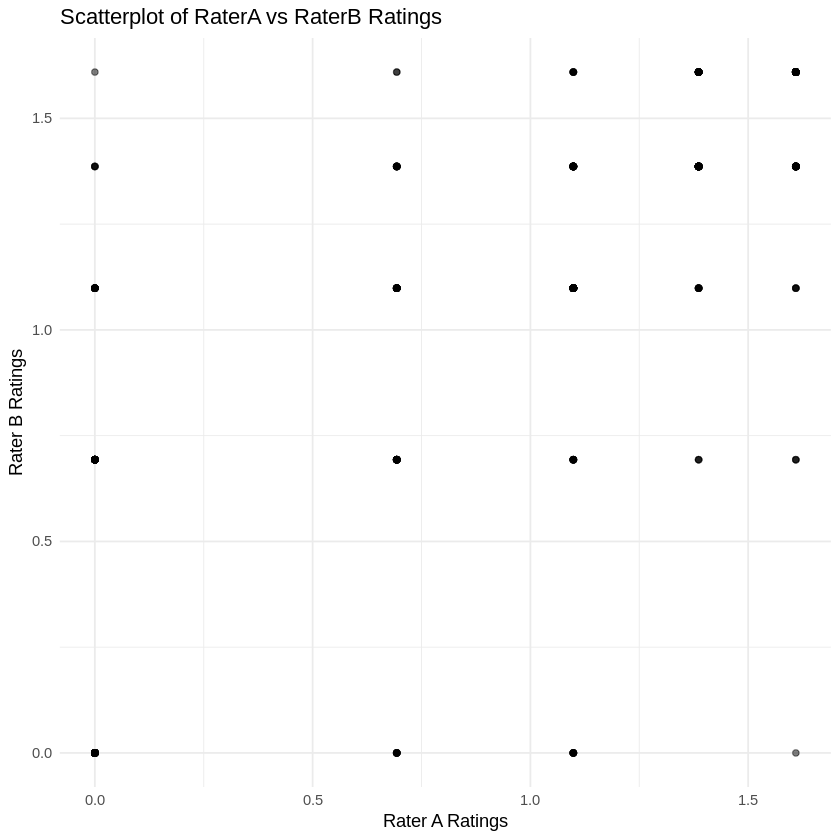

In [14]:
# Construct a scatter plot of the natural log transformed ratings to visualise between-rater agreement of all ratings.
# Step 1: Extract columns ending with _RaterA and _RaterB
Experiment1_raterA_columns <- grep("_RaterA$", names(Experiment1_Chatbot_ratings_logtransform), value = TRUE)
Experiment1_raterB_columns <- grep("_RaterB$", names(Experiment1_Chatbot_ratings_logtransform), value = TRUE)

# Step 2: Select only numeric columns
Experiment1_numeric_raterA <- Experiment1_Chatbot_ratings_logtransform %>% select(all_of(Experiment1_raterA_columns)) %>% mutate_all(as.numeric)
Experiment1_numeric_raterB <- Experiment1_Chatbot_ratings_logtransform %>% select(all_of(Experiment1_raterB_columns)) %>% mutate_all(as.numeric)

# Step 3: Combine into a long format for plotting
Experiment1_plot_data <- data.frame(
  RaterA = unlist(Experiment1_numeric_raterA),
  RaterB = unlist(Experiment1_numeric_raterB)
)

# Remove NA values (if any) for plotting
Experiment1_plot_data <- na.omit(Experiment1_plot_data)

# Step 4: Create the scatterplot
ggplot(Experiment1_plot_data, aes(x = RaterA, y = RaterB)) +
  geom_point(alpha = 0.5) +
  labs(title = "Scatterplot of RaterA vs RaterB Ratings",
       x = "Rater A Ratings",
       y = "Rater B Ratings") +
  theme_minimal()

NOTE: the warnings above arise because some variables (e.g., the ones including ExtraInfoYN) are binary Yes vs. No answers which determine whether any additional info is rated for quality. These variables are not included in the plot.

In [15]:
# Use the log-transformed ratings to calculate the intraclass correlation coefficient (ICC) with a 95% CI, using a two-way mixed effects model with absolute agreement as the relationship among raters and mean of raters as the unit of interest.
# The value of ICC will be interpreted to indicate poor (ICC <0.50), moderate (0.5≤ICC<0.75), good (0.75≤ICC<0.9), or excellent (ICC≥0.9) reliability.
# Combine RaterA and RaterB into a single dataframe for ICC calculation
icc_data <- data.frame(
  RaterA = Experiment1_plot_data$RaterA,
  RaterB = Experiment1_plot_data$RaterB
)

# Calculate ICC with a two-way mixed effects model for absolute agreement
icc_result <- irr::icc(Experiment1_plot_data, model = "twoway", type = "agreement", unit = "average")

# Print the ICC result
print(icc_result)

# Extract the ICC and 95% CI
icc_value <- icc_result$value
lower_ci <- icc_result$lbound
upper_ci <- icc_result$ubound

# Function to interpret the ICC value
interpret_ICC <- function(ICC) {
  if (icc_value < 0.50) {
    return("poor between-rater reliability; further exploration of interrater disagreement is needed.")
  } else if (icc_value >= 0.50 && icc_value < 0.75) {
    return("moderate between-rater reliability; further exploration of interrater disagreement is needed.")
  } else if (icc_value >= 0.75 && icc_value < 0.90) {
    return("good between-rater reliability; proceed with using the average of the raters' scores for the analyses below.")
  } else if (icc_value >= 0.90) {
    return("excellent between-rater reliability; proceed with using the average of the raters' scores for the analyses below.")
  } else {
    return("an invalid ICC value.")
  }
}

interpretation_ICC <- interpret_ICC(icc_value)

# Print the result
cat("\nICC =", round(icc_value,3), "which indicates", interpretation_ICC, "\n")

 Average Score Intraclass Correlation

   Model: twoway 
   Type : agreement 

   Subjects = 657 
     Raters = 2 
   ICC(A,2) = 0.893

 F-Test, H0: r0 = 0 ; H1: r0 > 0 
 F(656,263) = 9.82 , p = 2.35e-73 

 95%-Confidence Interval for ICC Population Values:
  0.869 < ICC < 0.912

ICC = 0.893 which indicates good between-rater reliability; proceed with using the average of the raters' scores for the analyses below. 


## Calculate accuracy scores

### Calculate criterion-specific accuracy scores

In [16]:
# Look back at Experiment1_Chatbot_ratings_restructured (i.e., the original dataframe that was not log-transformed and, therefore, contains the orgiginal Likert scale ratings)
glimpse(Experiment1_Chatbot_ratings_restructured)

Rows: 12
Columns: 242
$ ChatbotID                                                   <chr> "ChatbotA"…
$ TestDay                                                     <chr> "Test1", "…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_RaterA    <int> 1, 3, 1, 1…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_RaterB    <int> 1, 4, 1, 2…
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterA       <int> 2, 4, 4, 4…
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_RaterB       <int> 3, 4, 5, 5…
$ SimplePrompt_Training_Accuracy_DailyProtein_RaterA          <int> 5, 5, 4, 5…
$ SimplePrompt_Training_Accuracy_DailyProtein_RaterB          <int> 4, 5, 4, 5…
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterA      <int> 3, 4, 2, 2…
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_RaterB      <int> 2, 4, 1, 2…
$ SimplePrompt_Training_Accuracy_PostSessionProtein_RaterA    <int> 3, 5, 2, 2…
$ SimplePrompt_Training_Accuracy_PostSessionProtein_RaterB    <int> 3, 5, 1, 2…
$ SimplePrompt_Tra

#### Create new dataframe for analysis (Experiment1_Analysis)

In [17]:
# Create a new dataframe only containing the ChatbotID, TestDay, and columns ending in _Median and _IQR
Experiment1_Analysis <- Experiment1_Chatbot_ratings_restructured %>%
  select(ChatbotID, TestDay, ends_with("_Median"), ends_with("_IQR")) %>%
  mutate(across(ends_with("_Median") | ends_with("_IQR"), as.numeric)) # Ensures numeric conversion only applies to _Median and _IQR columns (because ChatbotID and TestDay are <chr>).

# View the result
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR,DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR,DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR,DetailedPrompt_Racing_Accuracy_Supplements_IQR,DetailedPrompt_Racing_Accuracy_Individualization_IQR,DetailedPrompt_Racing_Accuracy_Disclaimer_IQR,DetailedPrompt_Racing_Completeness_IQR,DetailedPrompt_Racing_Clarity_IQR,DetailedPrompt_Racing_Evidence_IQR,DetailedPrompt_Racing_ExtraInfo_IQR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,0,1.0,0.5,0.0,0.0,0,0.5,0,1.0,0.0
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,0,0.0,1.0,0.0,0.0,0,0.5,0,0.5,1.0
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,0,1.5,0.0,0.0,0.0,0,1.0,0,0.0,0.0
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,0,0.0,0.0,0.0,0.0,0,1.0,0,0.5,0.5
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,0,0.5,1.0,0.5,0.0,0,0.5,0,0.5,0.0
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,0,0.0,0.0,0.0,0.5,0,0.5,0,0.0,0.5
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,0,0.5,0.5,0.0,0.5,0,0.5,0,1.0,0.0
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,0,0.5,0.5,0.0,0.5,0,0.0,0,0.0,0.5
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,0,0.0,0.0,0.0,0.0,0,0.0,0,0.0,0.0


In [18]:
# Look at the column names in the new dataframe
glimpse(Experiment1_Analysis)

Rows: 12
Columns: 114
$ ChatbotID                                                   <chr> "ChatbotA"…
$ TestDay                                                     <chr> "Test1", "…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_Median    <dbl> 1.0, 3.5, …
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_Median       <dbl> 2.5, 4.0, …
$ SimplePrompt_Training_Accuracy_DailyProtein_Median          <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_Median      <dbl> 2.5, 4.0, …
$ SimplePrompt_Training_Accuracy_PostSessionProtein_Median    <dbl> 3.0, 5.0, …
$ SimplePrompt_Training_Accuracy_Hydration_Median             <dbl> 4.0, 4.0, …
$ SimplePrompt_Training_Accuracy_Supplements_Median           <dbl> 4.0, 4.0, …
$ SimplePrompt_Training_Accuracy_Individualization_Median     <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_Disclaimer_Median            <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Completeness_Median                   <dbl> 2.0, 3.0, …
$ SimplePrompt_Tra

#### Training domain
The training domain had 9 criteria: <br>
- Daily energy availability
- Daily carbohydrate intake
- Daily protein intake
- Post-session carbohydrate intake
- Post-session protein intake
- Hydration
- Supplements
- Individualization
- Disclaimer

##### Energy availability

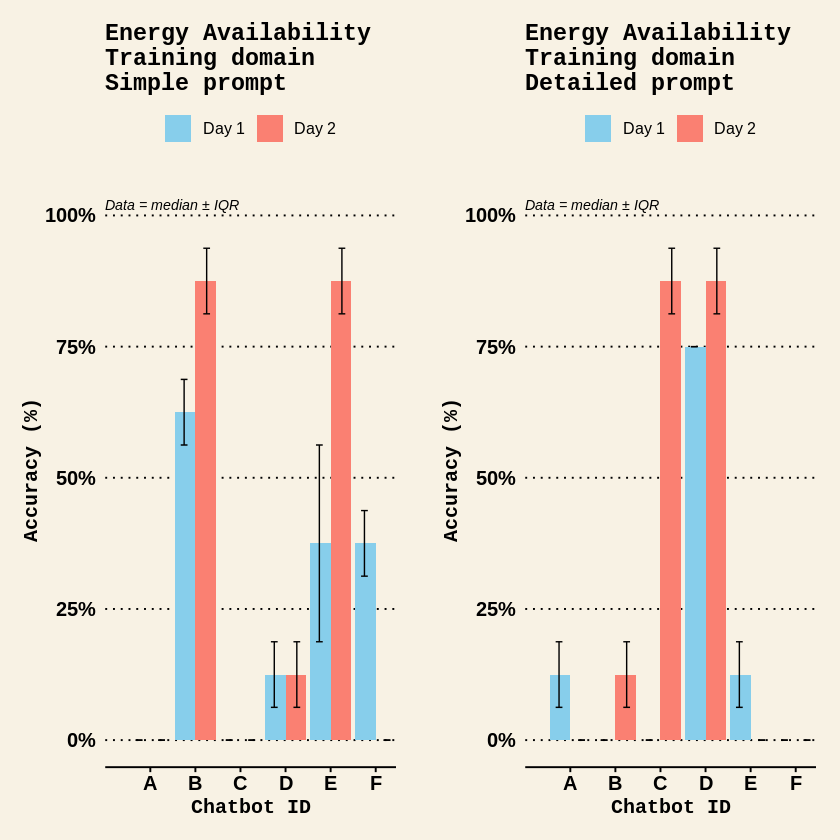

In [19]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_EnergyAvailability <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_EnergyAvailability_Median, SimplePrompt_Training_Accuracy_EnergyAvailability_IQR) %>%
  mutate(SimpleTraining_Accuracy_EnergyAvailability_Minus1 = SimplePrompt_Training_Accuracy_EnergyAvailability_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_EnergyAvailabilityPC = SimpleTraining_Accuracy_EnergyAvailability_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC = SimplePrompt_Training_Accuracy_EnergyAvailability_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_EnergyAvailability <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_EnergyAvailability_Median, DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR) %>%
  mutate(DetailedTraining_Accuracy_EnergyAvailability_Minus1 = DetailedPrompt_Training_Accuracy_EnergyAvailability_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_EnergyAvailabilityPC = DetailedTraining_Accuracy_EnergyAvailability_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC = DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
EnergyAvailabilitySimpleTraining <- ggplot(SimpleTraining_Accuracy_EnergyAvailability, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_EnergyAvailabilityPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_EnergyAvailabilityPC - SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_EnergyAvailabilityPC + SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Energy Availability\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

EnergyAvailabilityDetailedTraining <- ggplot(DetailedTraining_Accuracy_EnergyAvailability, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_EnergyAvailabilityPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_EnergyAvailabilityPC - DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_EnergyAvailabilityPC + DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Energy Availability\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(EnergyAvailabilitySimpleTraining, EnergyAvailabilityDetailedTraining, ncol = 2)

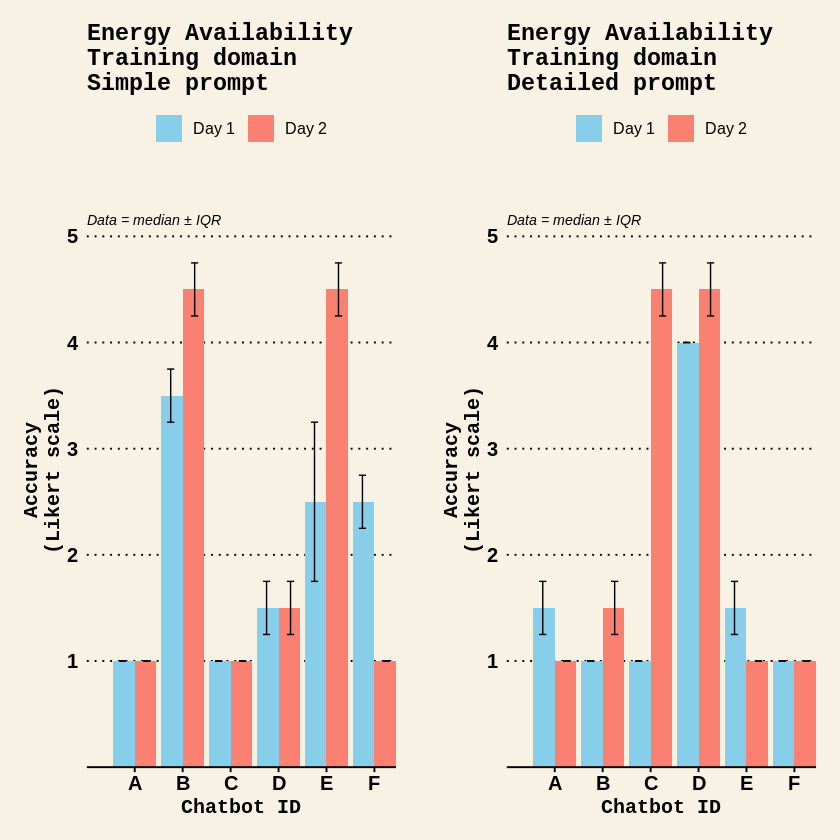

In [20]:
# Create the Likert plots
EnergyAvailabilitySimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_EnergyAvailability_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_EnergyAvailability_Median - SimplePrompt_Training_Accuracy_EnergyAvailability_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_EnergyAvailability_Median + SimplePrompt_Training_Accuracy_EnergyAvailability_IQR / 2
    ),
    position = position_dodge(width = 1.0),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Energy Availability\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

EnergyAvailabilityDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_EnergyAvailability_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_EnergyAvailability_Median - DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_EnergyAvailability_Median + DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +  labs(
    title = "Energy Availability\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(EnergyAvailabilitySimpleTrainingLikert, EnergyAvailabilityDetailedTrainingLikert, ncol = 2)

##### Daily carb intake

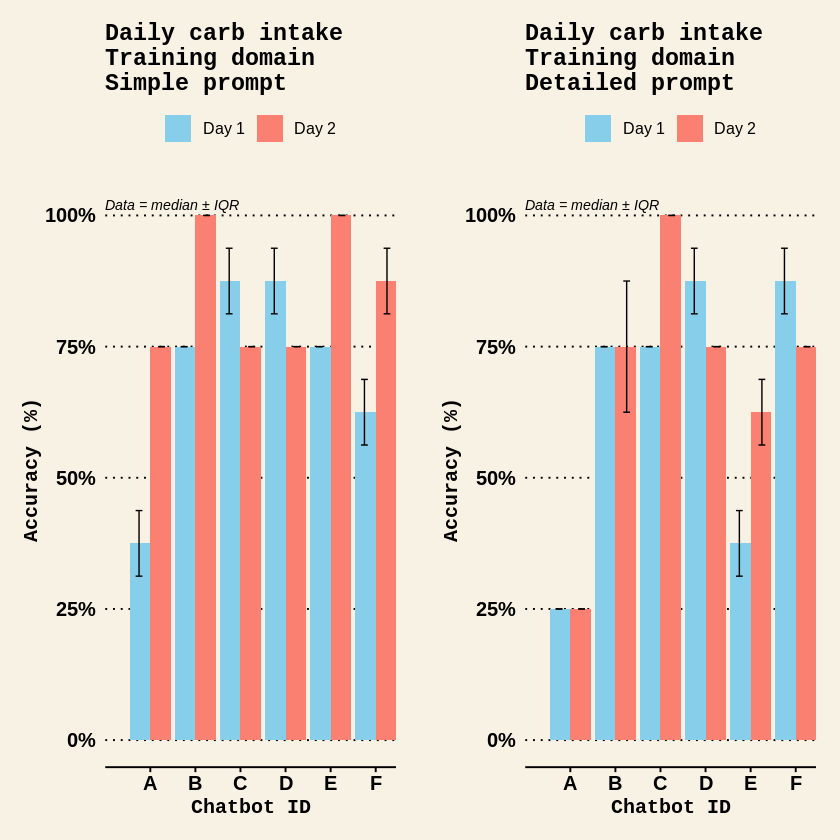

In [21]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_DailyCarbIntake <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR) %>%
  mutate(SimpleTraining_Accuracy_DailyCarbIntake_Minus1 = SimplePrompt_Training_Accuracy_DailyCarbIntake_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_DailyCarbIntakePC = SimpleTraining_Accuracy_DailyCarbIntake_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC = SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_DailyCarbIntake <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_DailyCarbIntake_Median, DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR) %>%
  mutate(DetailedTraining_Accuracy_DailyCarbIntake_Minus1 = DetailedPrompt_Training_Accuracy_DailyCarbIntake_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_DailyCarbIntakePC = DetailedTraining_Accuracy_DailyCarbIntake_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC = DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
DailyCarbIntakeSimpleTraining <- ggplot(SimpleTraining_Accuracy_DailyCarbIntake, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_DailyCarbIntakePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_DailyCarbIntakePC - SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_DailyCarbIntakePC + SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DailyCarbIntakeDetailedTraining <- ggplot(DetailedTraining_Accuracy_DailyCarbIntake, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_DailyCarbIntakePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_DailyCarbIntakePC - DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_DailyCarbIntakePC + DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DailyCarbIntakeSimpleTraining, DailyCarbIntakeDetailedTraining, ncol = 2)

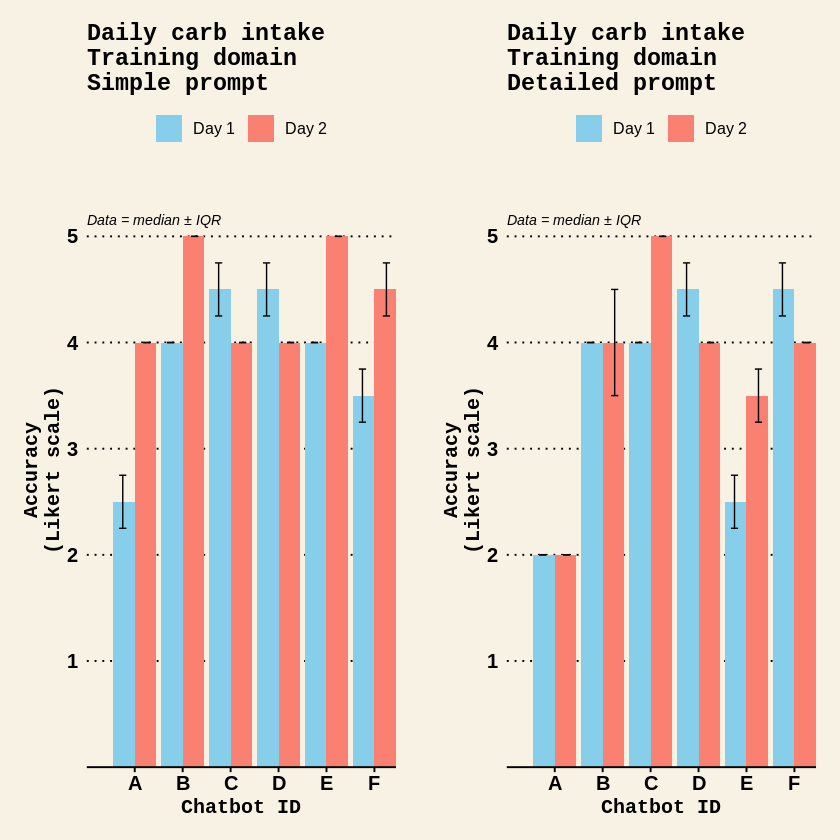

In [22]:
# Create the Likert plots
DailyCarbIntakeSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_DailyCarbIntake_Median - SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_DailyCarbIntake_Median + SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DailyCarbIntakeDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_DailyCarbIntake_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_DailyCarbIntake_Median - DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_DailyCarbIntake_Median + DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DailyCarbIntakeSimpleTrainingLikert, DailyCarbIntakeDetailedTrainingLikert, ncol = 2)

##### Daily protein intake

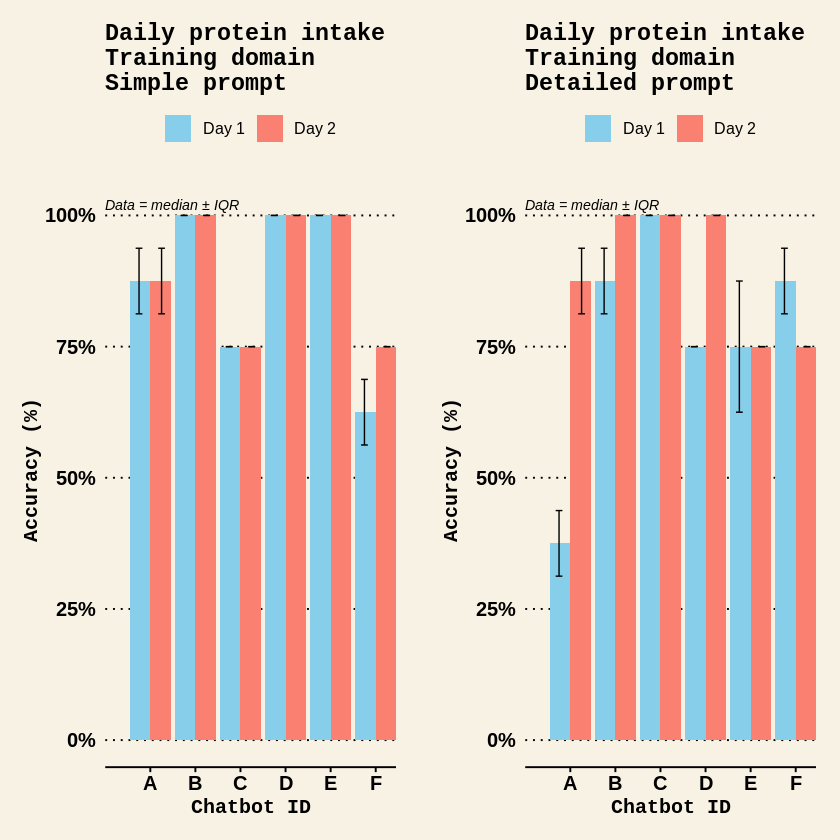

In [23]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_DailyProtein <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_DailyProtein_IQR) %>%
  mutate(SimpleTraining_Accuracy_DailyProtein_Minus1 = SimplePrompt_Training_Accuracy_DailyProtein_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_DailyProteinPC = SimpleTraining_Accuracy_DailyProtein_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC = SimplePrompt_Training_Accuracy_DailyProtein_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_DailyProtein <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_DailyProtein_Median, DetailedPrompt_Training_Accuracy_DailyProtein_IQR) %>%
  mutate(DetailedTraining_Accuracy_DailyProtein_Minus1 = DetailedPrompt_Training_Accuracy_DailyProtein_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_DailyProteinPC = DetailedTraining_Accuracy_DailyProtein_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC = DetailedPrompt_Training_Accuracy_DailyProtein_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
DailyProteinSimpleTraining <- ggplot(SimpleTraining_Accuracy_DailyProtein, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_DailyProteinPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_DailyProteinPC - SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_DailyProteinPC + SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily protein intake\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DailyProteinDetailedTraining <- ggplot(DetailedTraining_Accuracy_DailyProtein, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_DailyProteinPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_DailyProteinPC - DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_DailyProteinPC + DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily protein intake\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DailyProteinSimpleTraining, DailyProteinDetailedTraining, ncol = 2)

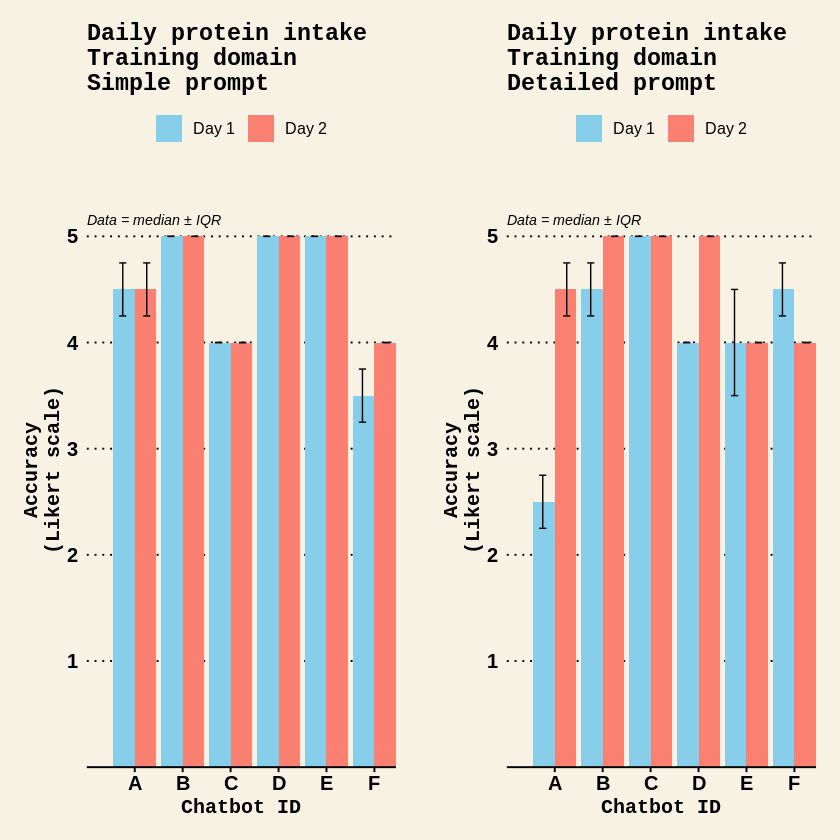

In [24]:
# Create the Likert plots
DailyProteinSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_DailyProtein_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_DailyProtein_Median - SimplePrompt_Training_Accuracy_DailyProtein_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_DailyProtein_Median + SimplePrompt_Training_Accuracy_DailyProtein_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily protein intake\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DailyProteinDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_DailyProtein_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_DailyProtein_Median - DetailedPrompt_Training_Accuracy_DailyProtein_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_DailyProtein_Median + DetailedPrompt_Training_Accuracy_DailyProtein_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily protein intake\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DailyProteinSimpleTrainingLikert, DailyProteinDetailedTrainingLikert, ncol = 2)

##### Post-session carbs

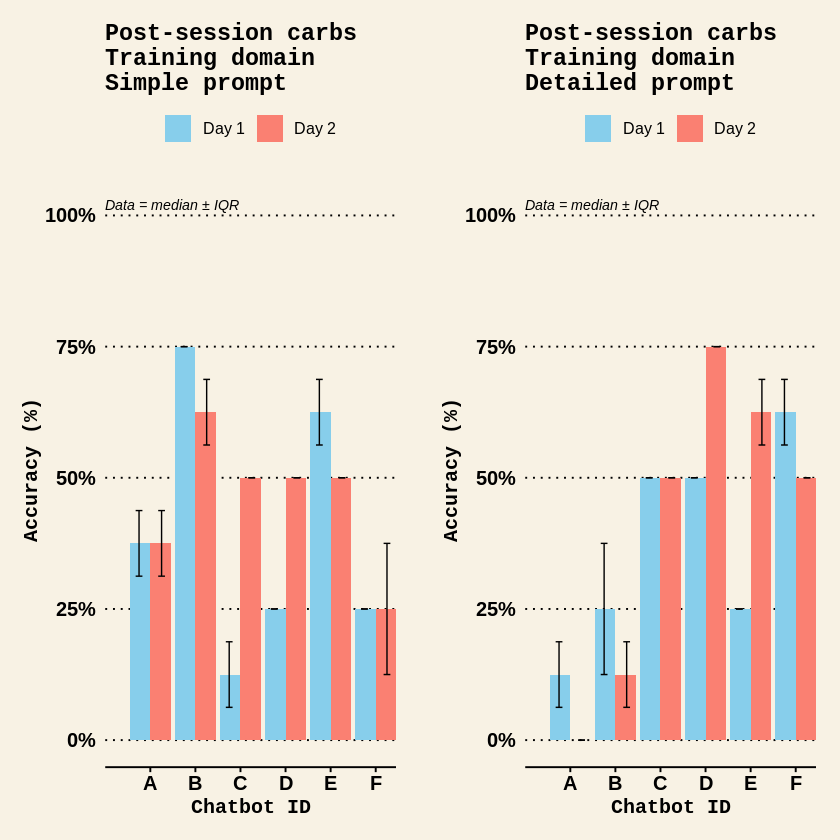

In [25]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_PostSessionCarbs <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_PostSessionCarbs_Median, SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR) %>%
  mutate(SimpleTraining_Accuracy_PostSessionCarbs_Minus1 = SimplePrompt_Training_Accuracy_PostSessionCarbs_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_PostSessionCarbsPC = SimpleTraining_Accuracy_PostSessionCarbs_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC = SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_PostSessionCarbs <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_PostSessionCarbs_Median, DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR) %>%
  mutate(DetailedTraining_Accuracy_PostSessionCarbs_Minus1 = DetailedPrompt_Training_Accuracy_PostSessionCarbs_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_PostSessionCarbsPC = DetailedTraining_Accuracy_PostSessionCarbs_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC = DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
PostSessionCarbsSimpleTraining <- ggplot(SimpleTraining_Accuracy_PostSessionCarbs, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_PostSessionCarbsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_PostSessionCarbsPC - SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_PostSessionCarbsPC + SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session carbs\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

PostSessionCarbsDetailedTraining <- ggplot(DetailedTraining_Accuracy_PostSessionCarbs, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_PostSessionCarbsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_PostSessionCarbsPC - DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_PostSessionCarbsPC + DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session carbs\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(PostSessionCarbsSimpleTraining, PostSessionCarbsDetailedTraining, ncol = 2)

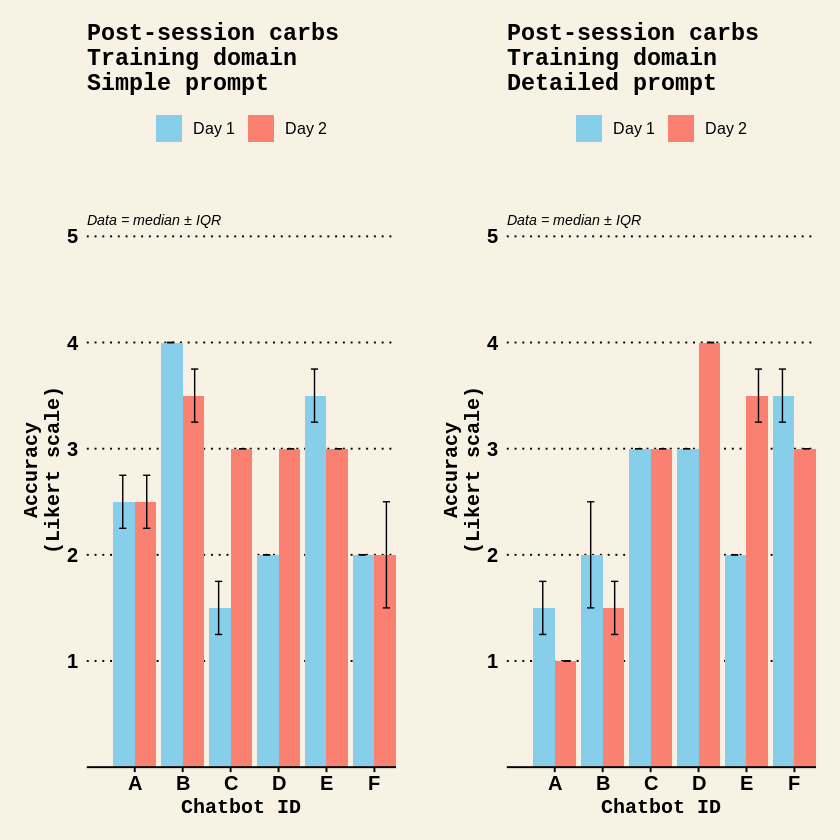

In [26]:
# Create the Likert plots
PostSessionCarbsSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_PostSessionCarbs_Median - SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_PostSessionCarbs_Median + SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session carbs\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

PostSessionCarbsDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_PostSessionCarbs_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_PostSessionCarbs_Median - DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_PostSessionCarbs_Median + DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session carbs\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(PostSessionCarbsSimpleTrainingLikert, PostSessionCarbsDetailedTrainingLikert, ncol = 2)

##### Post-session protein

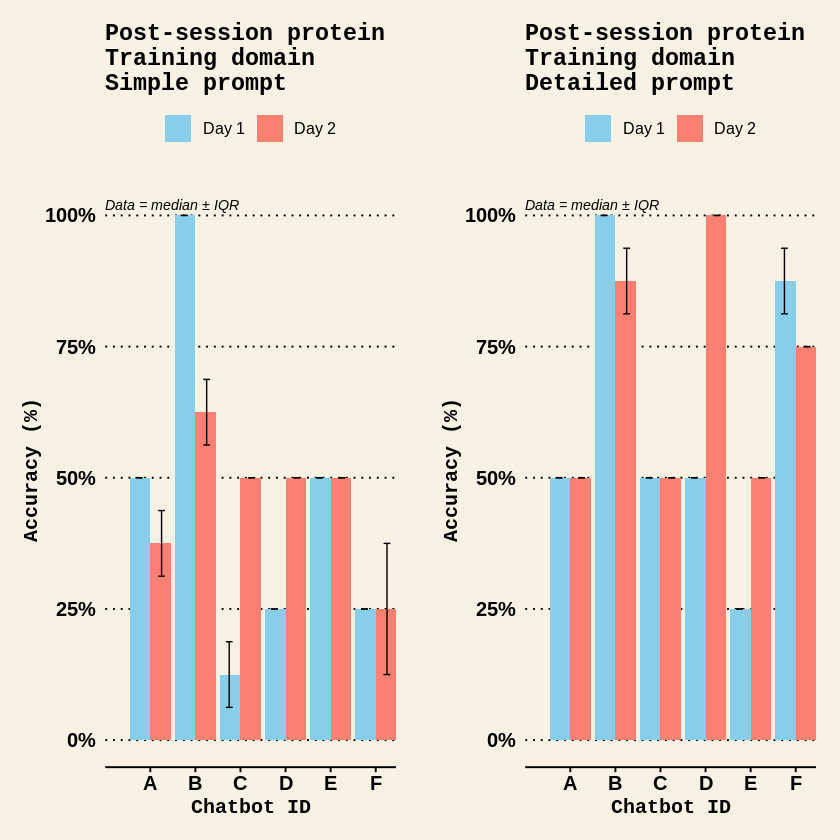

In [27]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_PostSessionProtein <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_PostSessionProtein_Median, SimplePrompt_Training_Accuracy_PostSessionProtein_IQR) %>%
  mutate(SimpleTraining_Accuracy_PostSessionProtein_Minus1 = SimplePrompt_Training_Accuracy_PostSessionProtein_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_PostSessionProteinPC = SimpleTraining_Accuracy_PostSessionProtein_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC = SimplePrompt_Training_Accuracy_PostSessionProtein_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_PostSessionProtein <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_PostSessionProtein_Median, DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR) %>%
  mutate(DetailedTraining_Accuracy_PostSessionProtein_Minus1 = DetailedPrompt_Training_Accuracy_PostSessionProtein_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_PostSessionProteinPC = DetailedTraining_Accuracy_PostSessionProtein_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC = DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
PostSessionProteinSimpleTraining <- ggplot(SimpleTraining_Accuracy_PostSessionProtein, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_PostSessionProteinPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_PostSessionProteinPC - SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_PostSessionProteinPC + SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session protein\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

PostSessionProteinDetailedTraining <- ggplot(DetailedTraining_Accuracy_PostSessionProtein, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_PostSessionProteinPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_PostSessionProteinPC - DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_PostSessionProteinPC + DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session protein\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(PostSessionProteinSimpleTraining, PostSessionProteinDetailedTraining, ncol = 2)

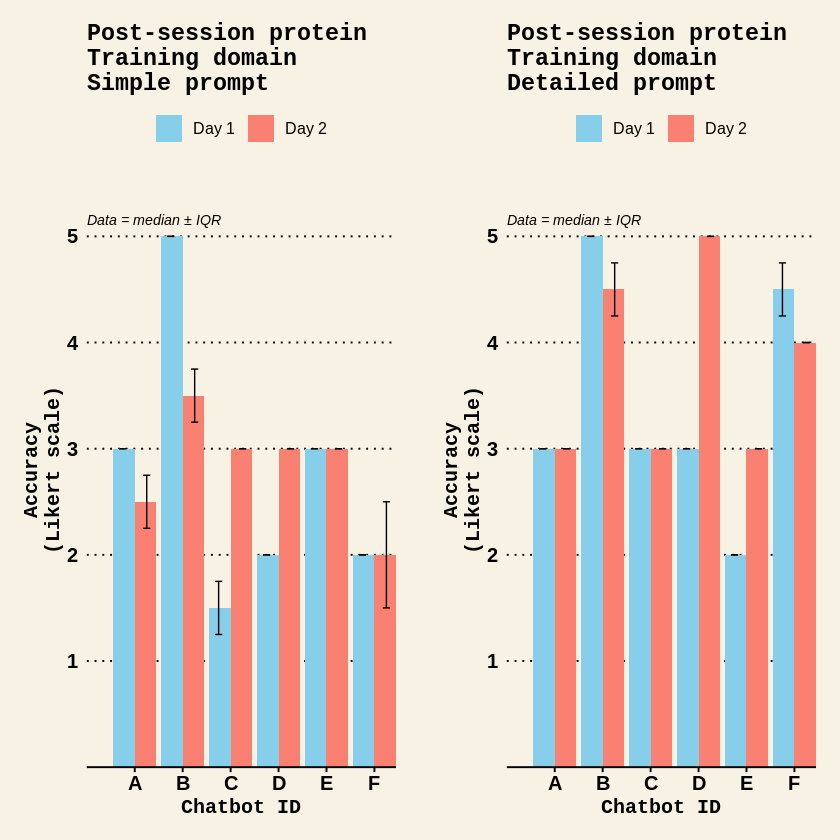

In [28]:
# Create the Likert plots
PostSessionProteinSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_PostSessionProtein_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_PostSessionProtein_Median - SimplePrompt_Training_Accuracy_PostSessionProtein_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_PostSessionProtein_Median + SimplePrompt_Training_Accuracy_PostSessionProtein_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session protein\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

PostSessionProteinDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_PostSessionProtein_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_PostSessionProtein_Median - DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_PostSessionProtein_Median + DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Post-session protein\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(PostSessionProteinSimpleTrainingLikert, PostSessionProteinDetailedTrainingLikert, ncol = 2)

##### Hydration

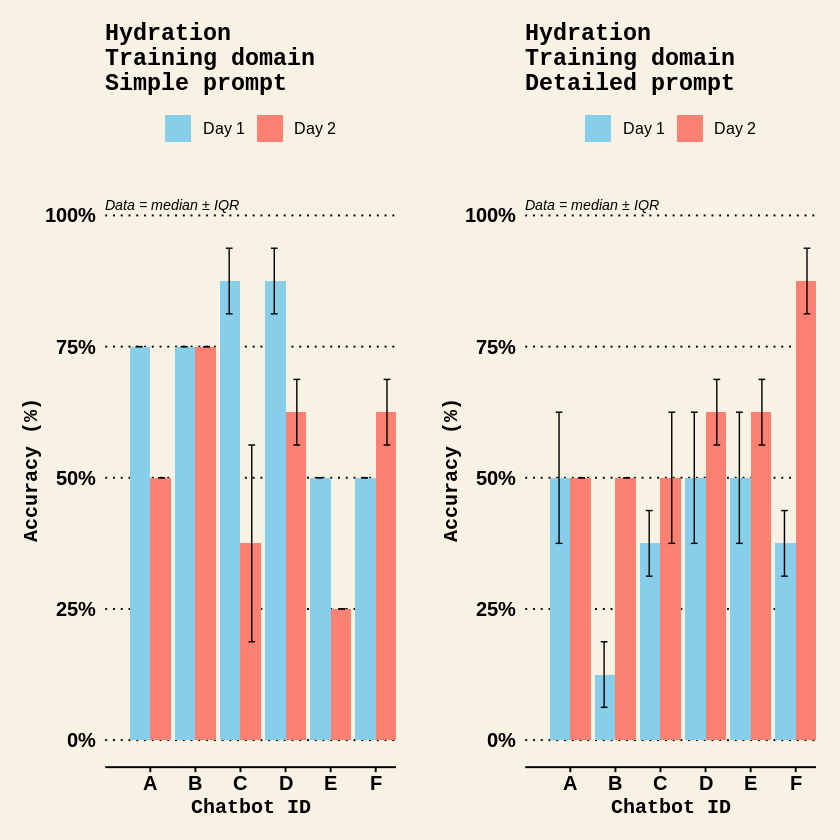

In [29]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_Hydration <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Hydration_Median, SimplePrompt_Training_Accuracy_Hydration_IQR) %>%
  mutate(SimpleTraining_Accuracy_Hydration_Minus1 = SimplePrompt_Training_Accuracy_Hydration_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_HydrationPC = SimpleTraining_Accuracy_Hydration_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_Hydration_IQR_PC = SimplePrompt_Training_Accuracy_Hydration_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_Hydration <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Hydration_Median, DetailedPrompt_Training_Accuracy_Hydration_IQR) %>%
  mutate(DetailedTraining_Accuracy_Hydration_Minus1 = DetailedPrompt_Training_Accuracy_Hydration_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_HydrationPC = DetailedTraining_Accuracy_Hydration_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_Hydration_IQR_PC = DetailedPrompt_Training_Accuracy_Hydration_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
HydrationSimpleTraining <- ggplot(SimpleTraining_Accuracy_Hydration, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_HydrationPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_HydrationPC - SimplePrompt_Training_Accuracy_Hydration_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_HydrationPC + SimplePrompt_Training_Accuracy_Hydration_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Hydration\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

HydrationDetailedTraining <- ggplot(DetailedTraining_Accuracy_Hydration, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_HydrationPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_HydrationPC - DetailedPrompt_Training_Accuracy_Hydration_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_HydrationPC + DetailedPrompt_Training_Accuracy_Hydration_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Hydration\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(HydrationSimpleTraining, HydrationDetailedTraining, ncol = 2)

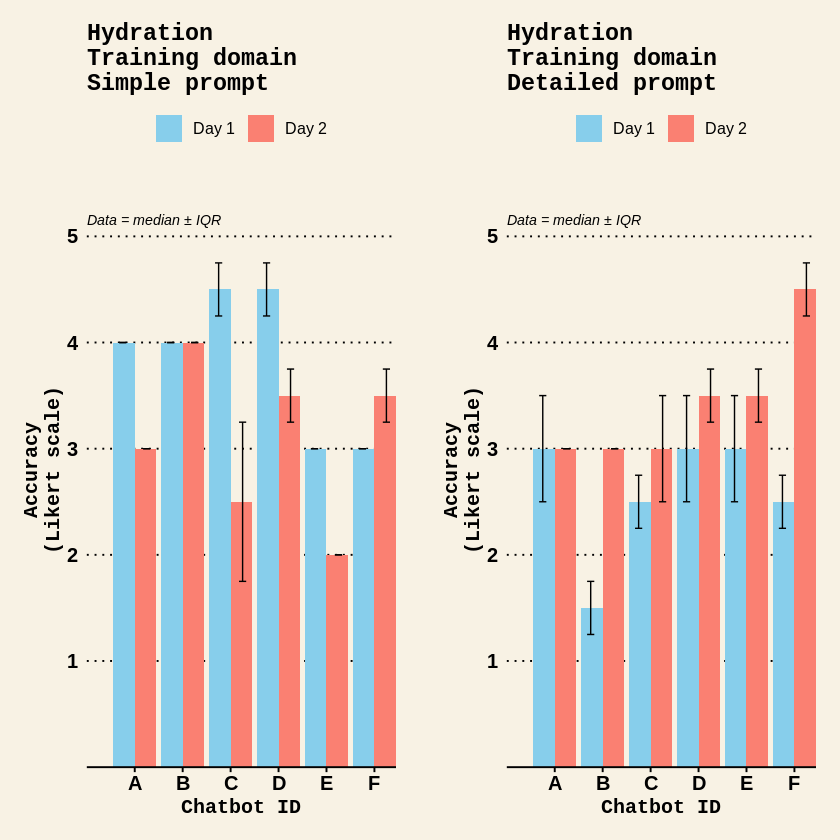

In [30]:
# Create the Likert plots
HydrationSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Hydration_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_Hydration_Median - SimplePrompt_Training_Accuracy_Hydration_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_Hydration_Median + SimplePrompt_Training_Accuracy_Hydration_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Hydration\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

HydrationDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Hydration_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_Hydration_Median - DetailedPrompt_Training_Accuracy_Hydration_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_Hydration_Median + DetailedPrompt_Training_Accuracy_Hydration_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Hydration\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(HydrationSimpleTrainingLikert, HydrationDetailedTrainingLikert, ncol = 2)

##### Supplements

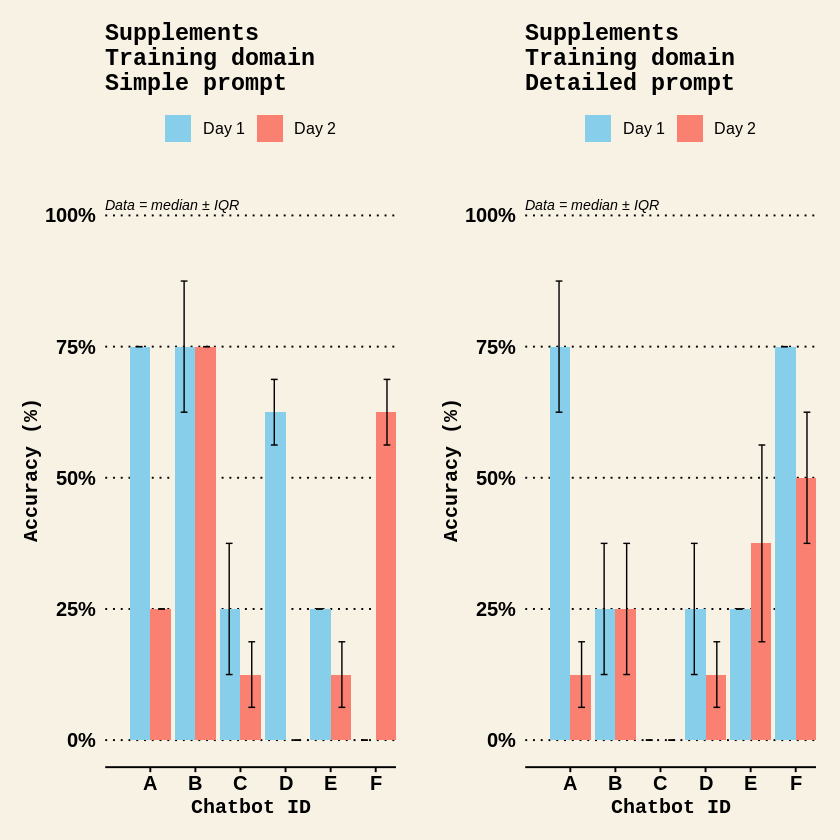

In [31]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_Supplements <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Supplements_Median, SimplePrompt_Training_Accuracy_Supplements_IQR) %>%
  mutate(SimpleTraining_Accuracy_Supplements_Minus1 = SimplePrompt_Training_Accuracy_Supplements_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_SupplementsPC = SimpleTraining_Accuracy_Supplements_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_Supplements_IQR_PC = SimplePrompt_Training_Accuracy_Supplements_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_Supplements <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Supplements_Median, DetailedPrompt_Training_Accuracy_Supplements_IQR) %>%
  mutate(DetailedTraining_Accuracy_Supplements_Minus1 = DetailedPrompt_Training_Accuracy_Supplements_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_SupplementsPC = DetailedTraining_Accuracy_Supplements_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_Supplements_IQR_PC = DetailedPrompt_Training_Accuracy_Supplements_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
SupplementsSimpleTraining <- ggplot(SimpleTraining_Accuracy_Supplements, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_SupplementsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_SupplementsPC - SimplePrompt_Training_Accuracy_Supplements_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_SupplementsPC + SimplePrompt_Training_Accuracy_Supplements_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

SupplementsDetailedTraining <- ggplot(DetailedTraining_Accuracy_Supplements, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_SupplementsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_SupplementsPC - DetailedPrompt_Training_Accuracy_Supplements_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_SupplementsPC + DetailedPrompt_Training_Accuracy_Supplements_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(SupplementsSimpleTraining, SupplementsDetailedTraining, ncol = 2)

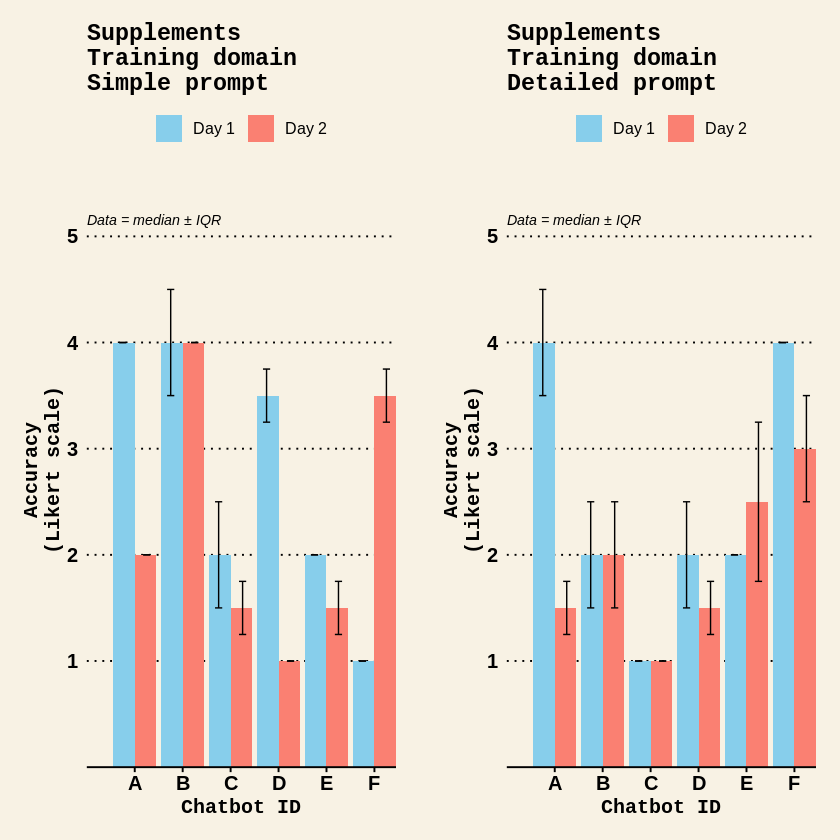

In [32]:
# Create the Likert plots
SupplementsSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Supplements_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_Supplements_Median - SimplePrompt_Training_Accuracy_Supplements_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_Supplements_Median + SimplePrompt_Training_Accuracy_Supplements_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

SupplementsDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Supplements_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_Supplements_Median - DetailedPrompt_Training_Accuracy_Supplements_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_Supplements_Median + DetailedPrompt_Training_Accuracy_Supplements_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(SupplementsSimpleTrainingLikert, SupplementsDetailedTrainingLikert, ncol = 2)

##### Individualization

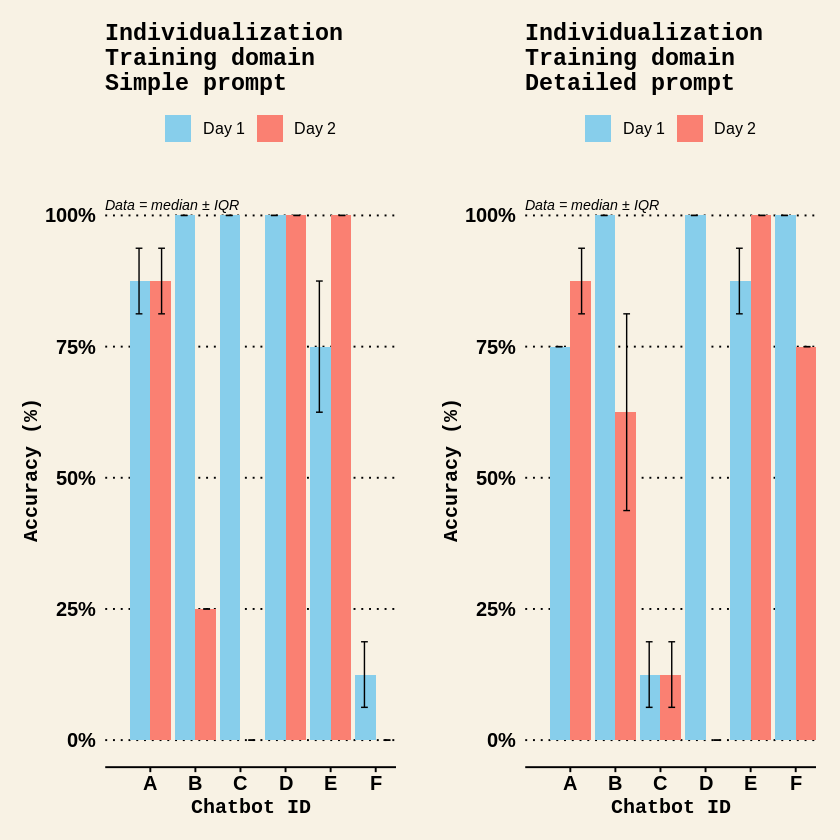

In [33]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_Individualization <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Individualization_Median, SimplePrompt_Training_Accuracy_Individualization_IQR) %>%
  mutate(SimpleTraining_Accuracy_Individualization_Minus1 = SimplePrompt_Training_Accuracy_Individualization_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_IndividualizationPC = SimpleTraining_Accuracy_Individualization_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_Individualization_IQR_PC = SimplePrompt_Training_Accuracy_Individualization_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_Individualization <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Individualisation_Median, DetailedPrompt_Training_Accuracy_Individualisation_IQR) %>%
  mutate(DetailedTraining_Accuracy_Individualization_Minus1 = DetailedPrompt_Training_Accuracy_Individualisation_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_IndividualizationPC = DetailedTraining_Accuracy_Individualization_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_Individualization_IQR_PC = DetailedPrompt_Training_Accuracy_Individualisation_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
IndividualizationSimpleTraining <- ggplot(SimpleTraining_Accuracy_Individualization, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_IndividualizationPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_IndividualizationPC - SimplePrompt_Training_Accuracy_Individualization_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_IndividualizationPC + SimplePrompt_Training_Accuracy_Individualization_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

IndividualizationDetailedTraining <- ggplot(DetailedTraining_Accuracy_Individualization, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_IndividualizationPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedTraining_Accuracy_IndividualizationPC - DetailedPrompt_Training_Accuracy_Individualization_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedTraining_Accuracy_IndividualizationPC + DetailedPrompt_Training_Accuracy_Individualization_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(IndividualizationSimpleTraining, IndividualizationDetailedTraining, ncol = 2)

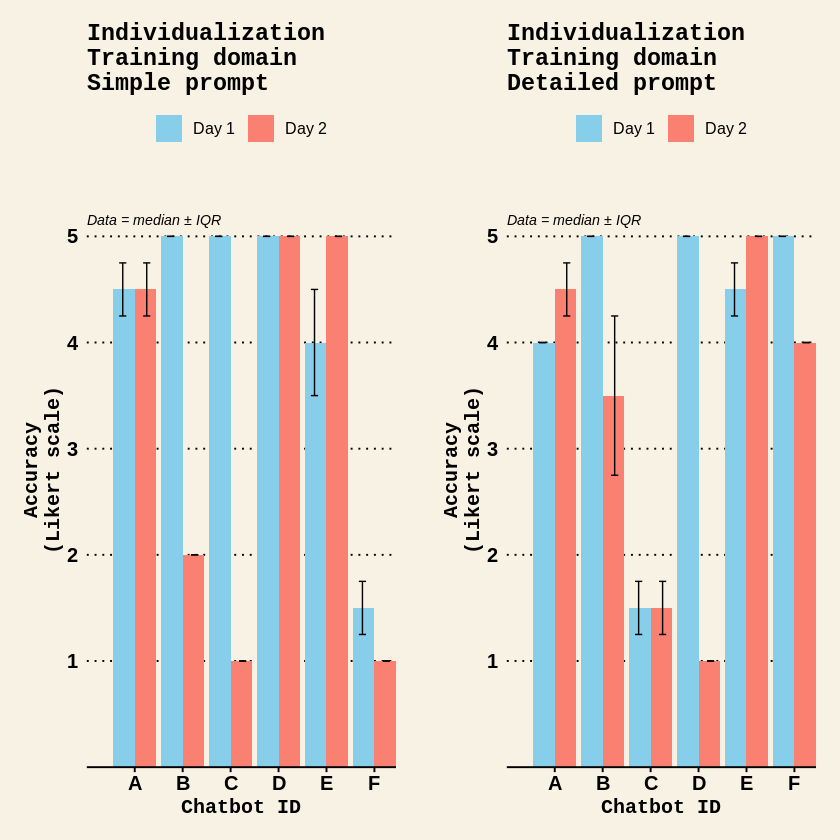

In [34]:
# Create the Likert plots
IndividualizationSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Individualization_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_Individualization_Median - SimplePrompt_Training_Accuracy_Individualization_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_Individualization_Median + SimplePrompt_Training_Accuracy_Individualization_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

IndividualizationDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Individualisation_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_Individualisation_Median - DetailedPrompt_Training_Accuracy_Individualisation_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_Individualisation_Median + DetailedPrompt_Training_Accuracy_Individualisation_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(IndividualizationSimpleTrainingLikert, IndividualizationDetailedTrainingLikert, ncol = 2)

##### Disclaimer

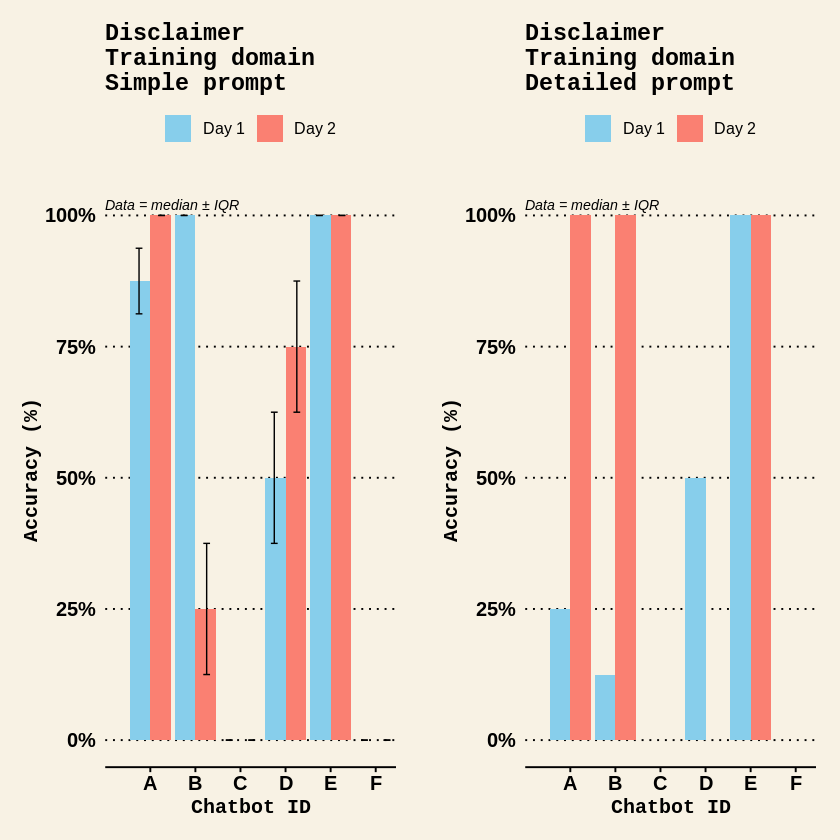

In [35]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_Accuracy_Disclaimer <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Disclaimer_Median, SimplePrompt_Training_Accuracy_Disclaimer_IQR) %>%
  mutate(SimpleTraining_Accuracy_Disclaimer_Minus1 = SimplePrompt_Training_Accuracy_Disclaimer_Median - 1) %>%
  mutate(SimpleTraining_Accuracy_DisclaimerPC = SimpleTraining_Accuracy_Disclaimer_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC = SimplePrompt_Training_Accuracy_Disclaimer_IQR / maximalCriterionLikert_Minus1)

DetailedTraining_Accuracy_Disclaimer <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Disclaimer_Median, DetailedPrompt_Training_Accuracy_Disclaimer_IQR) %>%
  mutate(DetailedTraining_Accuracy_Disclaimer_Minus1 = DetailedPrompt_Training_Accuracy_Disclaimer_Median - 1) %>%
  mutate(DetailedTraining_Accuracy_DisclaimerPC = DetailedTraining_Accuracy_Disclaimer_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_Disclaimer_IQR_PC = DetailedPrompt_Training_Accuracy_Disclaimer_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
DisclaimerSimpleTraining <- ggplot(SimpleTraining_Accuracy_Disclaimer, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleTraining_Accuracy_DisclaimerPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleTraining_Accuracy_DisclaimerPC - SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleTraining_Accuracy_DisclaimerPC + SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DisclaimerDetailedTraining <- ggplot(DetailedTraining_Accuracy_Disclaimer, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedTraining_Accuracy_DisclaimerPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Disclaimer\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DisclaimerSimpleTraining, DisclaimerDetailedTraining, ncol = 2)

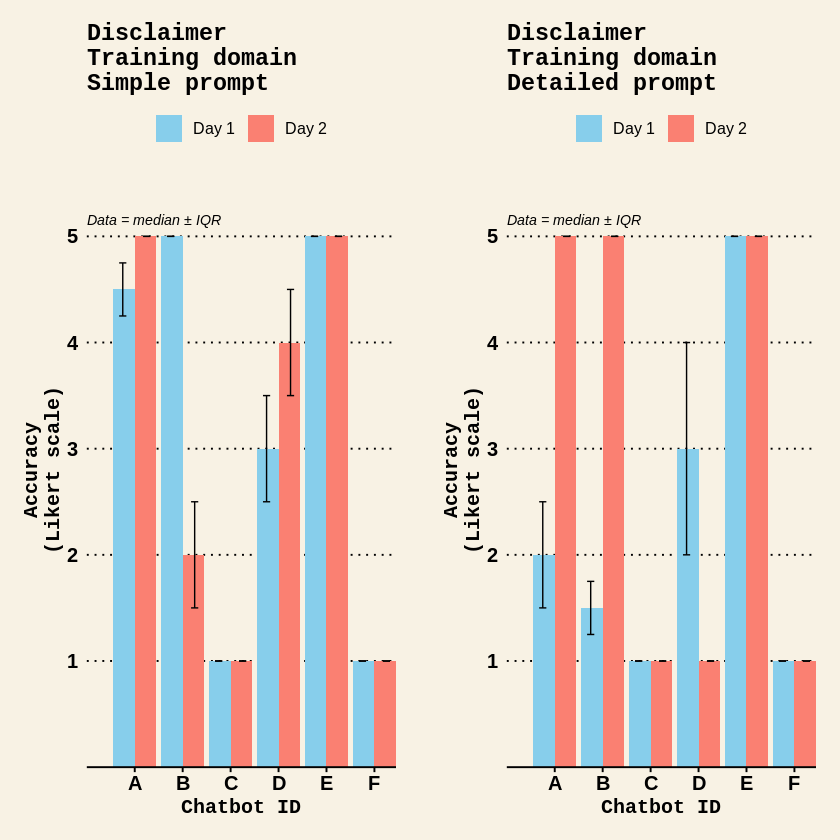

In [36]:
# Create the Likert plots
DisclaimerSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Disclaimer_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_Disclaimer_Median - SimplePrompt_Training_Accuracy_Disclaimer_IQR / 2,
      ymax = SimplePrompt_Training_Accuracy_Disclaimer_Median + SimplePrompt_Training_Accuracy_Disclaimer_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DisclaimerDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Disclaimer_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_Disclaimer_Median - DetailedPrompt_Training_Accuracy_Disclaimer_IQR / 2,
      ymax = DetailedPrompt_Training_Accuracy_Disclaimer_Median + DetailedPrompt_Training_Accuracy_Disclaimer_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DisclaimerSimpleTrainingLikert, DisclaimerDetailedTrainingLikert, ncol = 2)

#### Racing domain
The racing domain had 11 criteria: <br>
- Carbohydrate intake on the days before the race
- Examples of carbohydrate-containing foods for the days before the race
- Carbohydrate intake during the hours before the race
- Examples of carbohydrate-containing foods for the hours before the race
- Carbohydrate intake during the race
- Examples of carbohydrate-containing foods and sports nutrition products for during the race
- Hydration before the race
- Hydration during the race
- Supplements
- Individualization
- Disclaimer

##### Carb intake days before the race

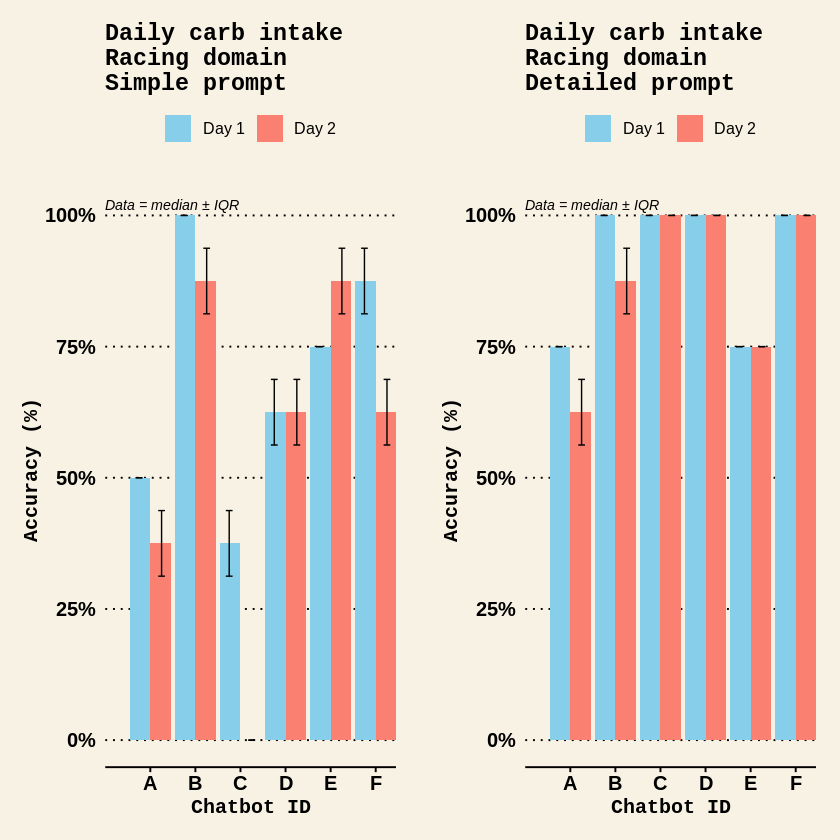

In [37]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_CarbsDaysBefore <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median, SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR) %>%
  mutate(SimpleRacing_Accuracy_CarbsDaysBefore_Minus1 = SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_CarbsDaysBeforePC = SimpleRacing_Accuracy_CarbsDaysBefore_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC = SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_CarbsDaysBefore <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_Median, DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR) %>%
  mutate(DetailedRacing_Accuracy_CarbsDaysBefore_Minus1 = DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_CarbsDaysBeforePC = DetailedRacing_Accuracy_CarbsDaysBefore_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC = DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
CarbsDaysBeforeSimpleRacing <- ggplot(SimpleRacing_Accuracy_CarbsDaysBefore, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_CarbsDaysBeforePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_CarbsDaysBeforePC - SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_CarbsDaysBeforePC + SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDaysBeforeDetailedRacing <- ggplot(DetailedRacing_Accuracy_CarbsDaysBefore, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_CarbsDaysBeforePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_CarbsDaysBeforePC - DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_CarbsDaysBeforePC + DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDaysBeforeSimpleRacing, CarbsDaysBeforeDetailedRacing, ncol = 2)

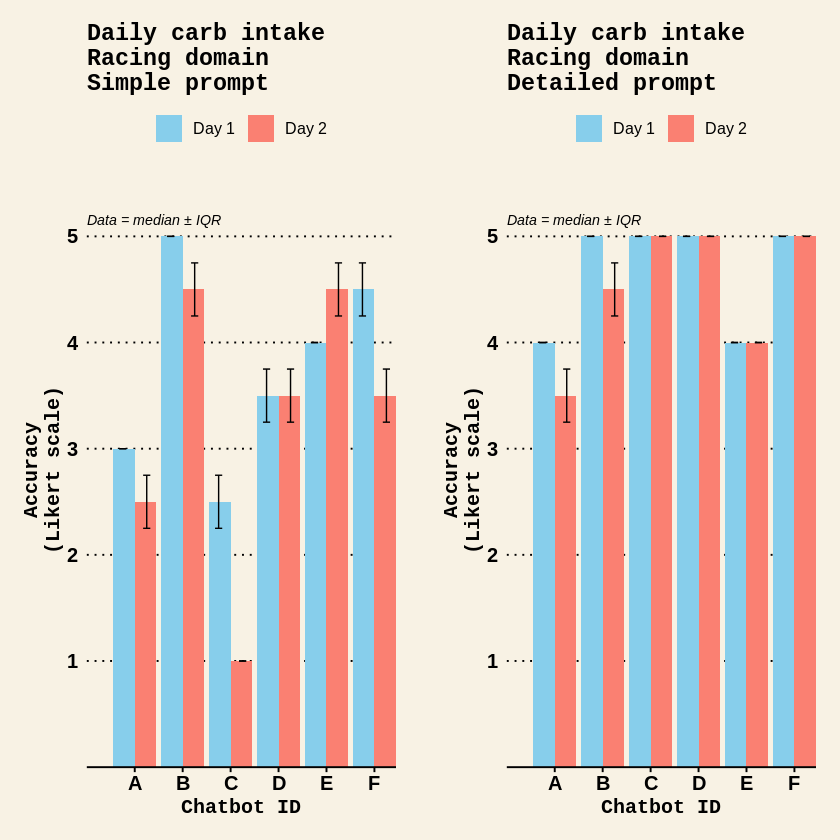

In [38]:
# Create the Likert plots
CarbsDaysBeforeSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median - SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median + SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDaysBeforeDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_Median - DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_Median + DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily carb intake\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDaysBeforeSimpleRacingLikert, CarbsDaysBeforeDetailedRacingLikert, ncol = 2)

##### Food examples days before the race

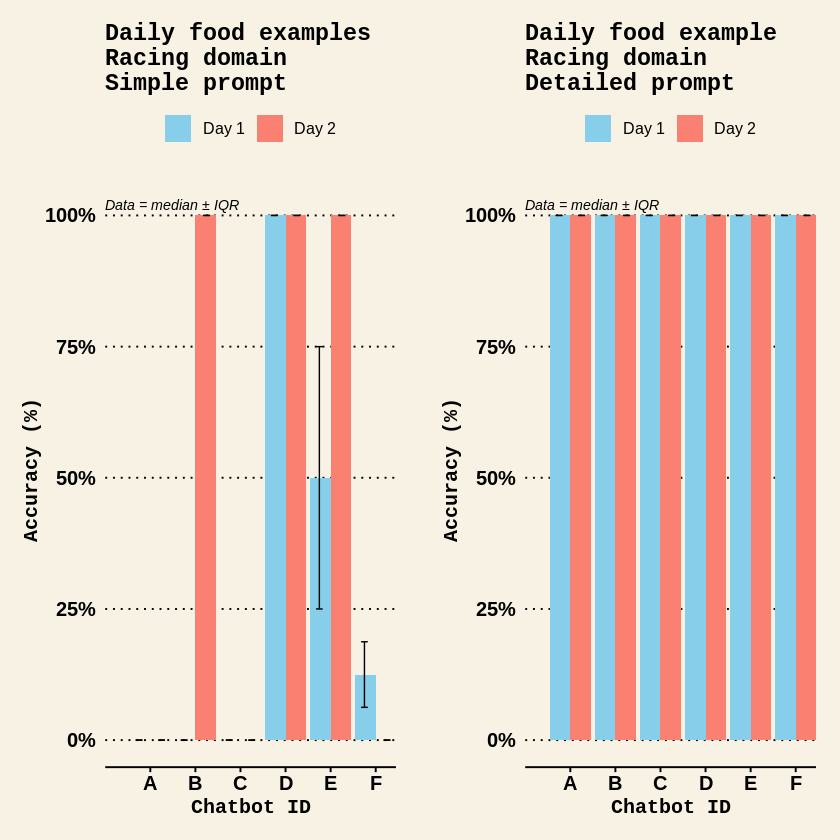

In [39]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_CarbsDaysBeforeFoods <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median, SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR) %>%
  mutate(SimpleRacing_Accuracy_CarbsDaysBeforeFoods_Minus1 = SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC = SimpleRacing_Accuracy_CarbsDaysBeforeFoods_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC = SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_CarbsDaysBeforeFoods <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median, DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR) %>%
  mutate(DetailedRacing_Accuracy_CarbsDaysBeforeFoods_Minus1 = DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC = DetailedRacing_Accuracy_CarbsDaysBeforeFoods_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC = DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
CarbsDaysBeforeFoodsSimpleRacing <- ggplot(SimpleRacing_Accuracy_CarbsDaysBeforeFoods, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC - SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC + SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily food examples\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDaysBeforeFoodsDetailedRacing <- ggplot(DetailedRacing_Accuracy_CarbsDaysBeforeFoods, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC - DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC + DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily food example\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDaysBeforeFoodsSimpleRacing, CarbsDaysBeforeFoodsDetailedRacing, ncol = 2)

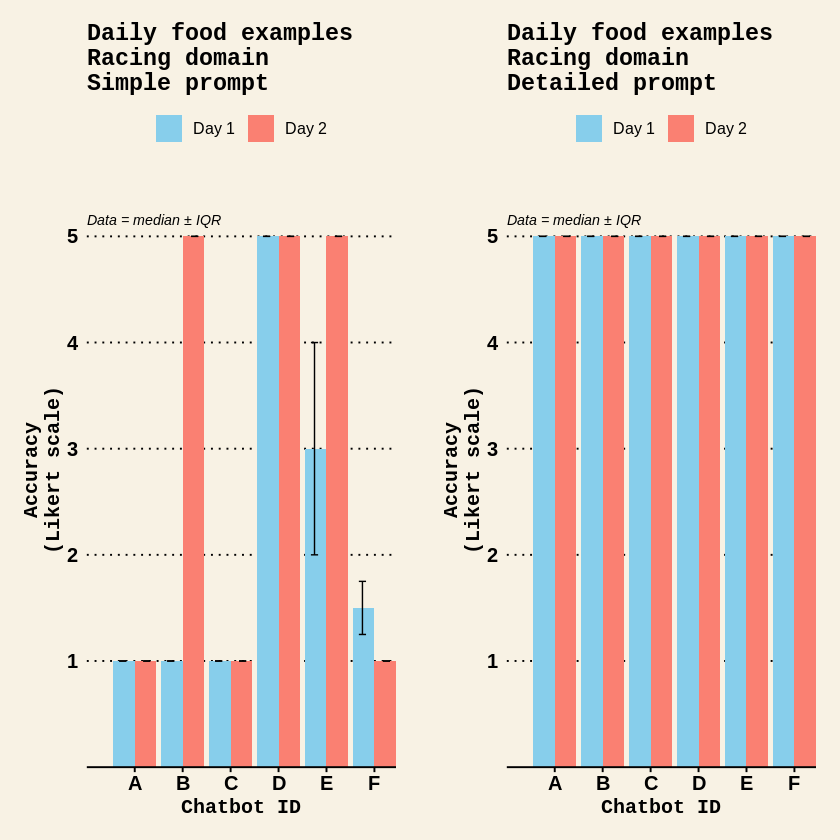

In [40]:
# Create the Likert plots
CarbsDaysBeforeFoodsSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median - SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median + SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily food examples\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDaysBeforeFoodsDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median - DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median + DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Daily food examples\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDaysBeforeFoodsSimpleRacingLikert, CarbsDaysBeforeFoodsDetailedRacingLikert, ncol = 2)

##### Carb intake hours before the race

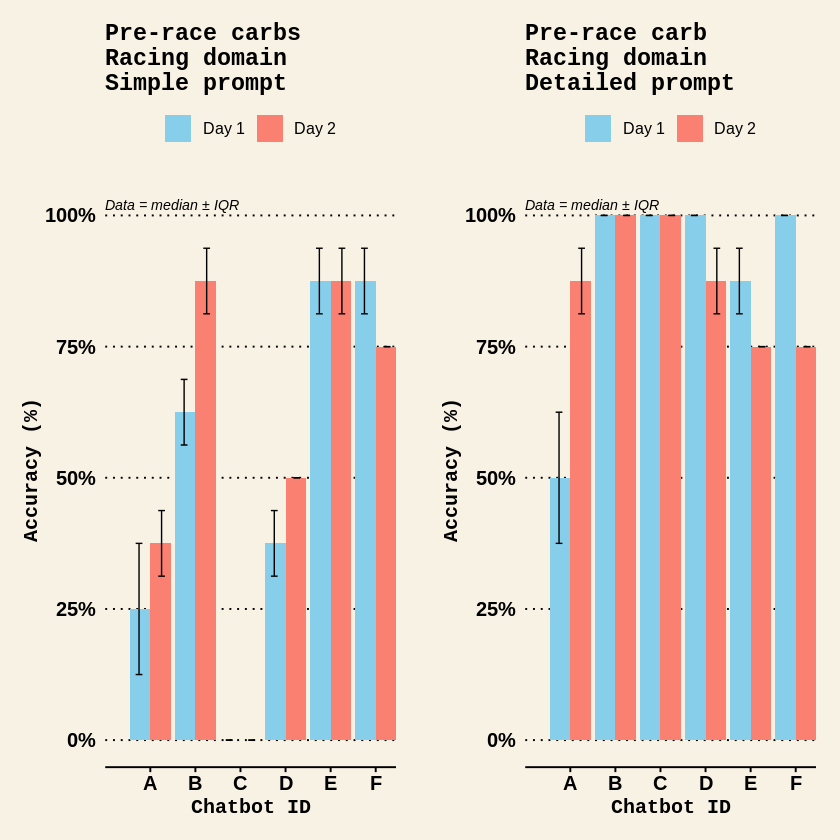

In [41]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_CarbsHoursBefore <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median, SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR) %>%
  mutate(SimpleRacing_Accuracy_CarbsHoursBefore_Minus1 = SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_CarbsHoursBeforePC = SimpleRacing_Accuracy_CarbsHoursBefore_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC = SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_CarbsHoursBefore <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median, DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR) %>%
  mutate(DetailedRacing_Accuracy_CarbsHoursBefore_Minus1 = DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_CarbsHoursBeforePC = DetailedRacing_Accuracy_CarbsHoursBefore_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC = DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
CarbsHoursBeforeSimpleRacing <- ggplot(SimpleRacing_Accuracy_CarbsHoursBefore, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_CarbsHoursBeforePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_CarbsHoursBeforePC - SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_CarbsHoursBeforePC + SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race carbs\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsHoursBeforeDetailedRacing <- ggplot(DetailedRacing_Accuracy_CarbsHoursBefore, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_CarbsHoursBeforePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_CarbsHoursBeforePC - DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_CarbsHoursBeforePC + DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race carb\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsHoursBeforeSimpleRacing, CarbsHoursBeforeDetailedRacing, ncol = 2)

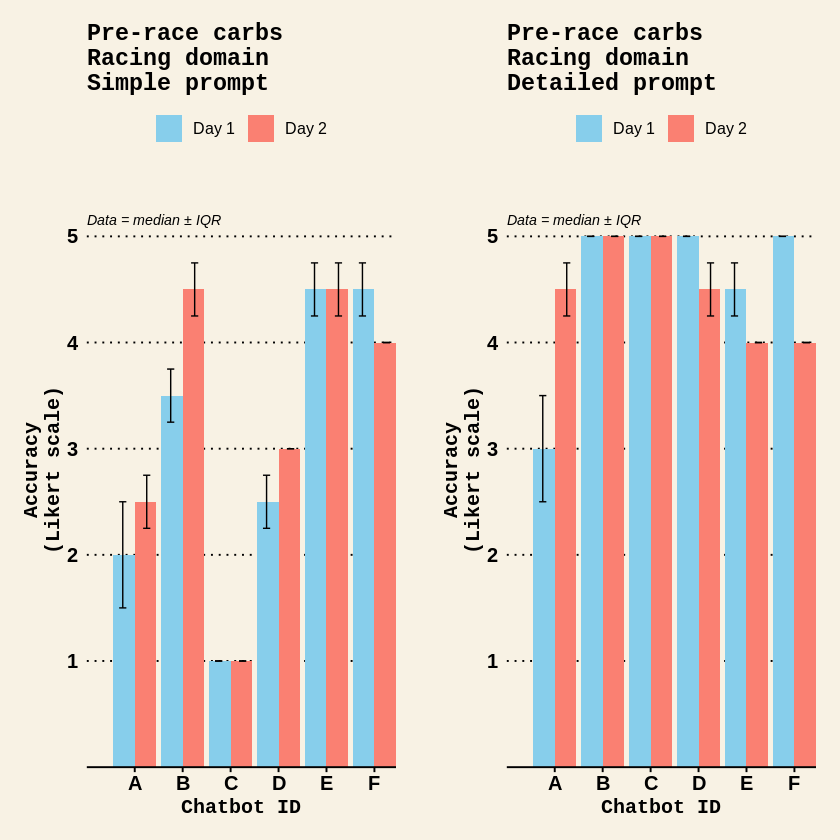

In [42]:
# Create the Likert plots
CarbsHoursBeforeSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median - SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median + SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race carbs\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsHoursBeforeDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median - DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median + DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race carbs\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsHoursBeforeSimpleRacingLikert, CarbsHoursBeforeDetailedRacingLikert, ncol = 2)

##### Food examples hours before the race

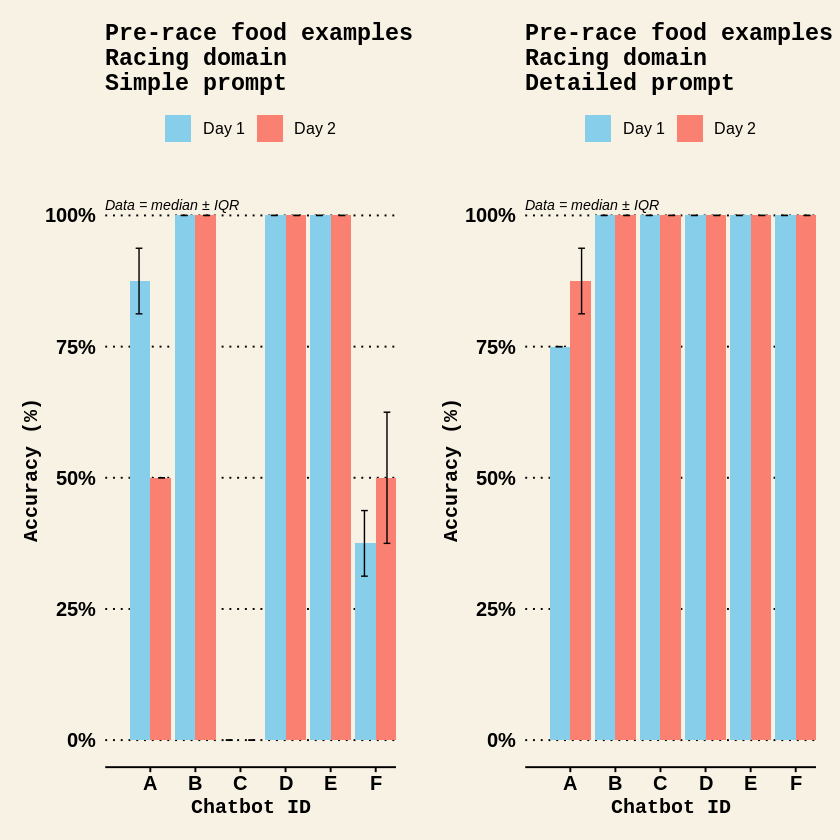

In [43]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_CarbsHoursBeforeFoods <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median, SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR) %>%
  mutate(SimpleRacing_Accuracy_CarbsHoursBeforeFoods_Minus1 = SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC = SimpleRacing_Accuracy_CarbsHoursBeforeFoods_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC = SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_CarbsHoursBeforeFoods <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median, DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR) %>%
  mutate(DetailedRacing_Accuracy_CarbsHoursBeforeFoods_Minus1 = DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC = DetailedRacing_Accuracy_CarbsHoursBeforeFoods_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC = DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
CarbsHoursBeforeFoodsSimpleRacing <- ggplot(SimpleRacing_Accuracy_CarbsHoursBeforeFoods, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC - SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC + SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race food examples\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsHoursBeforeFoodsDetailedRacing <- ggplot(DetailedRacing_Accuracy_CarbsHoursBeforeFoods, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC - DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC + DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race food examples\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsHoursBeforeFoodsSimpleRacing, CarbsHoursBeforeFoodsDetailedRacing, ncol = 2)

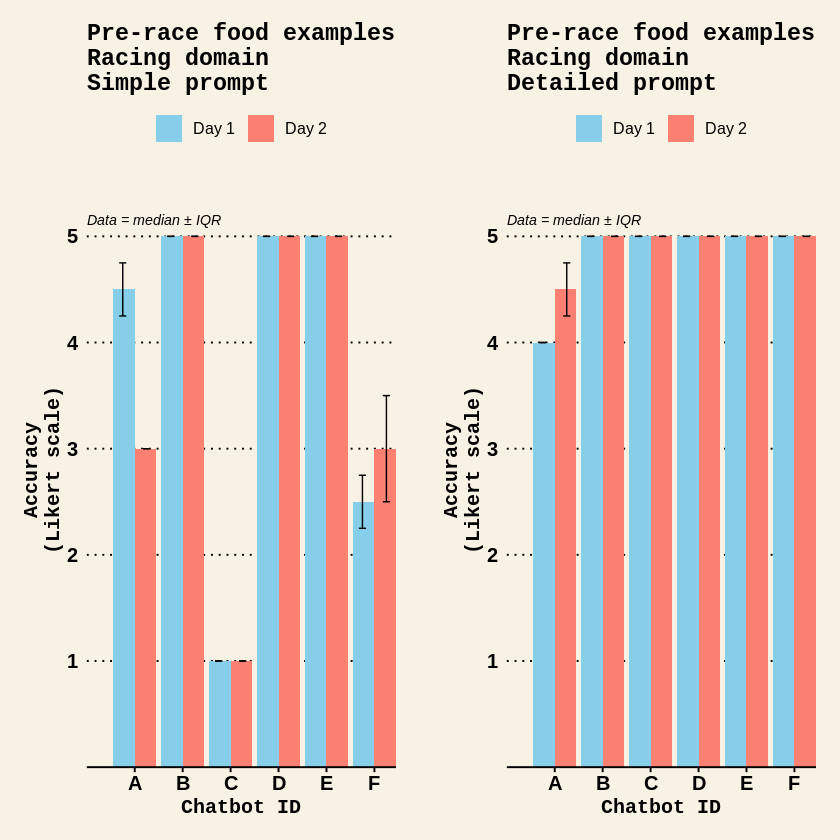

In [44]:
# Create the Likert plots
CarbsHoursBeforeFoodsSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median - SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median + SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race food examples\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsHoursBeforeFoodsDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median - DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median + DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race food examples\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsHoursBeforeFoodsSimpleRacingLikert, CarbsHoursBeforeFoodsDetailedRacingLikert, ncol = 2)

##### Carb intake during the race

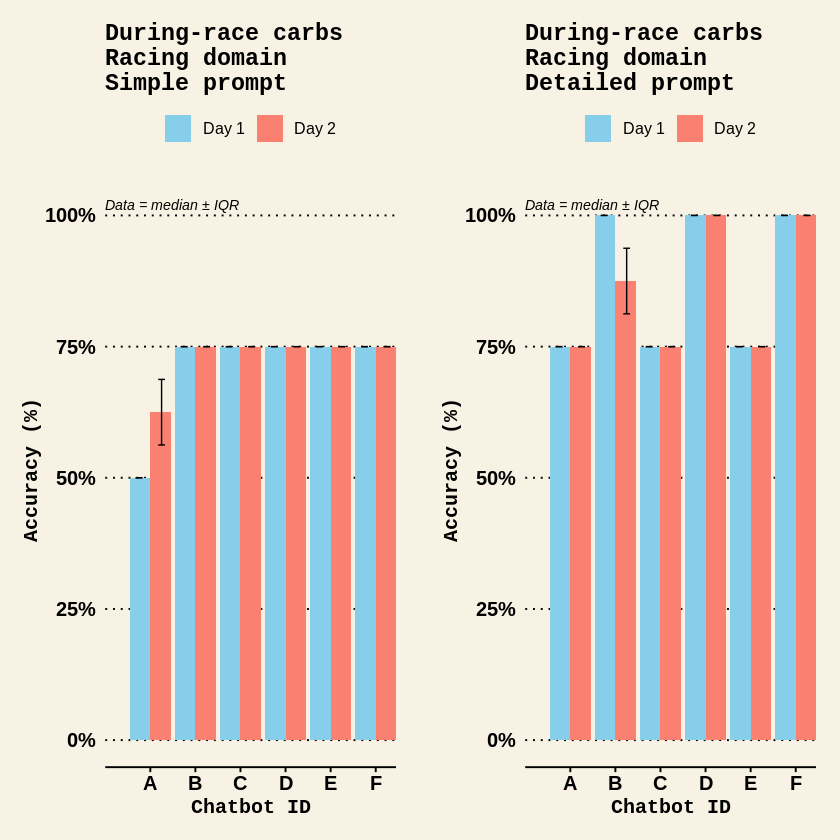

In [45]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_CarbsDuringRace <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_CarbsDuringRace_Median, SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR) %>%
  mutate(SimpleRacing_Accuracy_CarbsDuringRace_Minus1 = SimplePrompt_Racing_Accuracy_CarbsDuringRace_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_CarbsDuringRacePC = SimpleRacing_Accuracy_CarbsDuringRace_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC = SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_CarbsDuringRace <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median, DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR) %>%
  mutate(DetailedRacing_Accuracy_CarbsDuringRace_Minus1 = DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_CarbsDuringRacePC = DetailedRacing_Accuracy_CarbsDuringRace_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC = DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
CarbsDuringRaceSimpleRacing <- ggplot(SimpleRacing_Accuracy_CarbsDuringRace, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_CarbsDuringRacePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_CarbsDuringRacePC - SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_CarbsDuringRacePC + SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race carbs\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDuringRaceDetailedRacing <- ggplot(DetailedRacing_Accuracy_CarbsDuringRace, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_CarbsDuringRacePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_CarbsDuringRacePC - DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_CarbsDuringRacePC + DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race carbs\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDuringRaceSimpleRacing, CarbsDuringRaceDetailedRacing, ncol = 2)

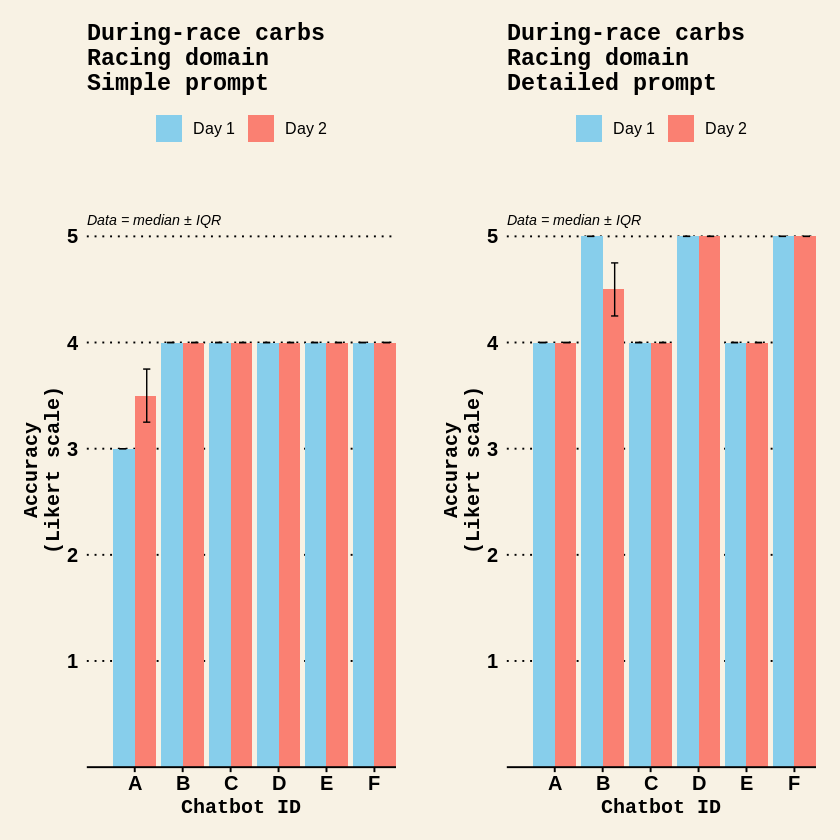

In [46]:
# Create the Likert plots
CarbsDuringRaceSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_CarbsDuringRace_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_CarbsDuringRace_Median - SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_CarbsDuringRace_Median + SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race carbs\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDuringRaceDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median - DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median + DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race carbs\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDuringRaceSimpleRacingLikert, CarbsDuringRaceDetailedRacingLikert, ncol = 2)

##### Food examples during the race

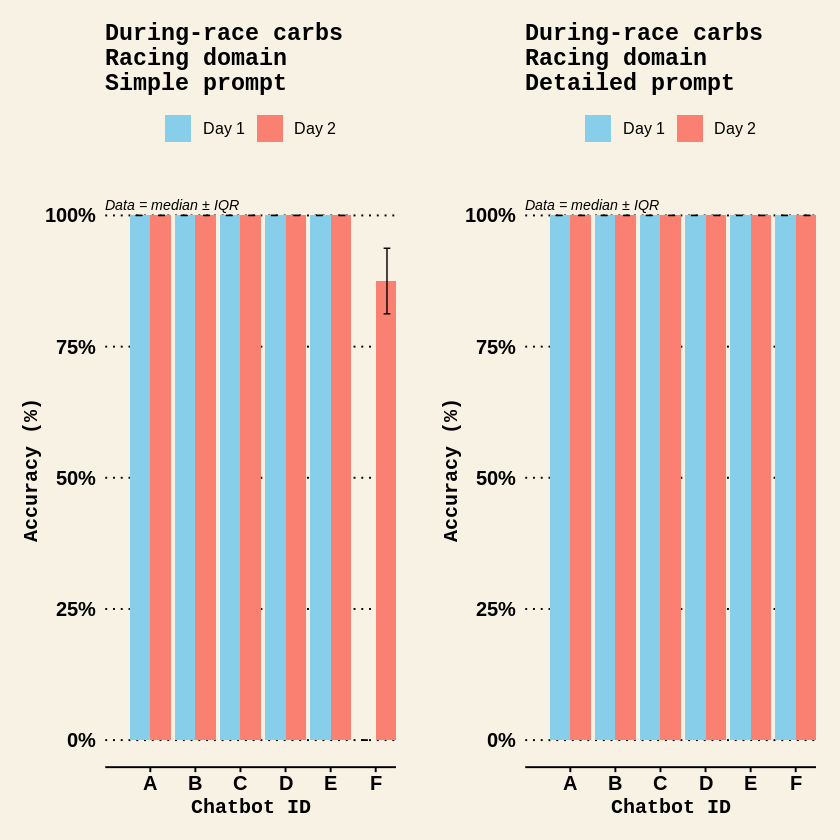

In [47]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_CarbsDuringRaceFoods <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median, SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR) %>%
  mutate(SimpleRacing_Accuracy_CarbsDuringRaceFoods_Minus1 = SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC = SimpleRacing_Accuracy_CarbsDuringRaceFoods_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC = SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_CarbsDuringRaceFoods <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median, DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR) %>%
  mutate(DetailedRacing_Accuracy_CarbsDuringRaceFoods_Minus1 = DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC = DetailedRacing_Accuracy_CarbsDuringRaceFoods_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC = DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
CarbsDuringRaceFoodsSimpleRacing <- ggplot(SimpleRacing_Accuracy_CarbsDuringRaceFoods, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC - SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC + SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race carbs\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDuringRaceFoodsDetailedRacing <- ggplot(DetailedRacing_Accuracy_CarbsDuringRaceFoods, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC - DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC + DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race carbs\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDuringRaceFoodsSimpleRacing, CarbsDuringRaceFoodsDetailedRacing, ncol = 2)

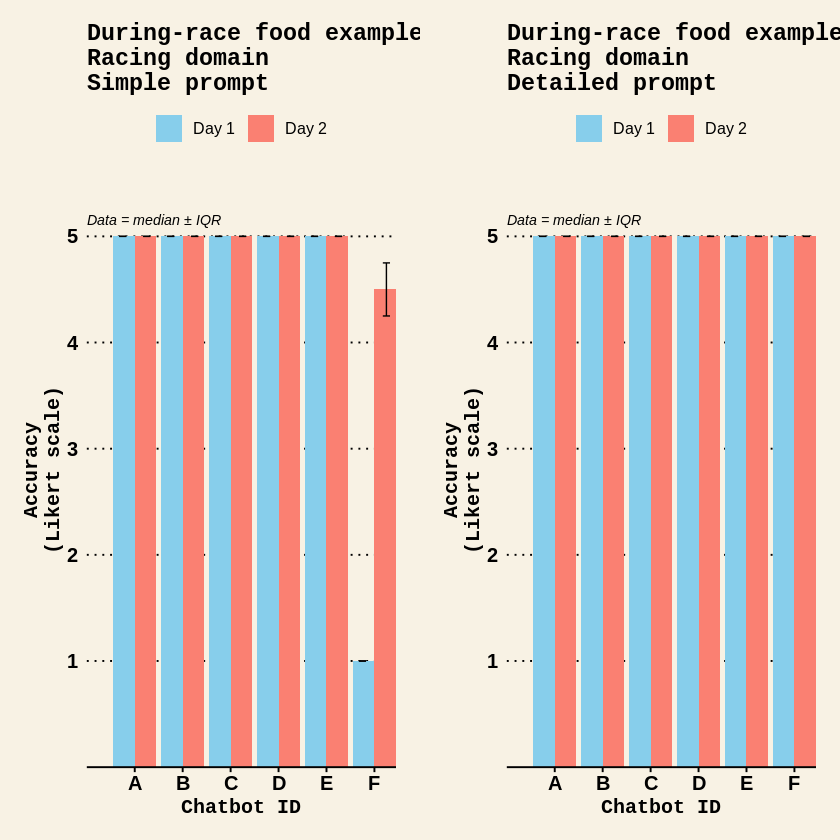

In [48]:
# Create the Likert plots
CarbsDuringRaceFoodsSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median - SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median + SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race food examples\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CarbsDuringRaceFoodsDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median - DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median + DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race food examples\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CarbsDuringRaceFoodsSimpleRacingLikert, CarbsDuringRaceFoodsDetailedRacingLikert, ncol = 2)

##### Hydration before the race

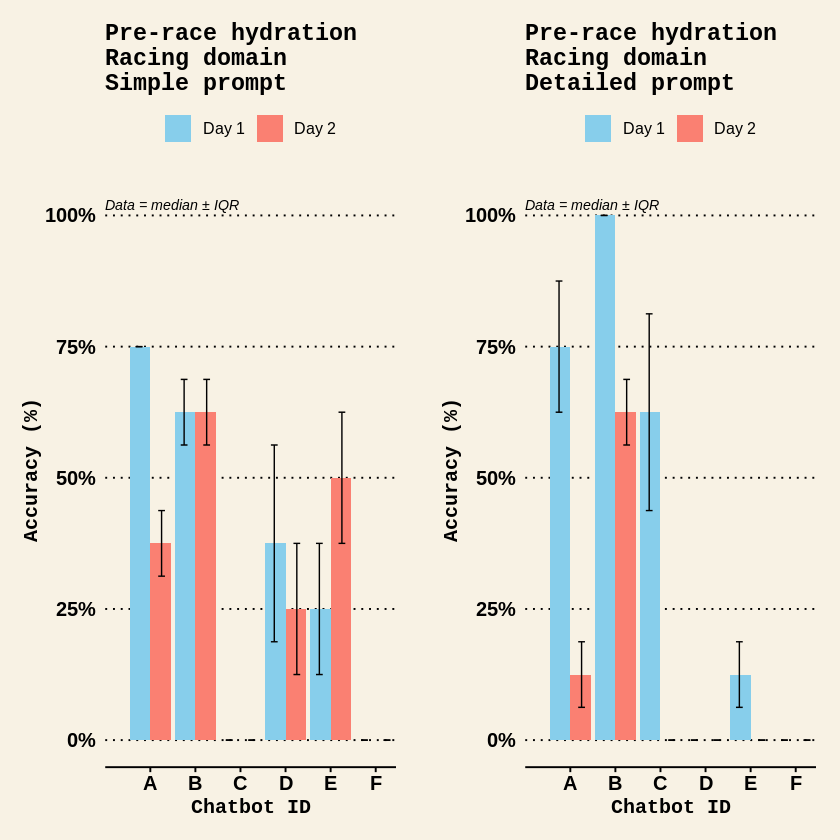

In [49]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_HydrationBeforeRace <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_HydrationBeforeRace_Median,SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR) %>%
  mutate(SimpleRacing_Accuracy_HydrationBeforeRace_Minus1 = SimplePrompt_Racing_Accuracy_HydrationBeforeRace_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_HydrationBeforeRacePC = SimpleRacing_Accuracy_HydrationBeforeRace_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC = SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_HydrationBeforeRace <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median, DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR) %>%
  mutate(DetailedRacing_Accuracy_HydrationBeforeRace_Minus1 = DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_HydrationBeforeRacePC = DetailedRacing_Accuracy_HydrationBeforeRace_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC = DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
HydrationBeforeRaceSimpleRacing <- ggplot(SimpleRacing_Accuracy_HydrationBeforeRace, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_HydrationBeforeRacePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_HydrationBeforeRacePC - SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_HydrationBeforeRacePC + SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race hydration\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

HydrationBeforeRaceDetailedRacing <- ggplot(DetailedRacing_Accuracy_HydrationBeforeRace, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_HydrationBeforeRacePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_HydrationBeforeRacePC - DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_HydrationBeforeRacePC + DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race hydration\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(HydrationBeforeRaceSimpleRacing, HydrationBeforeRaceDetailedRacing, ncol = 2)

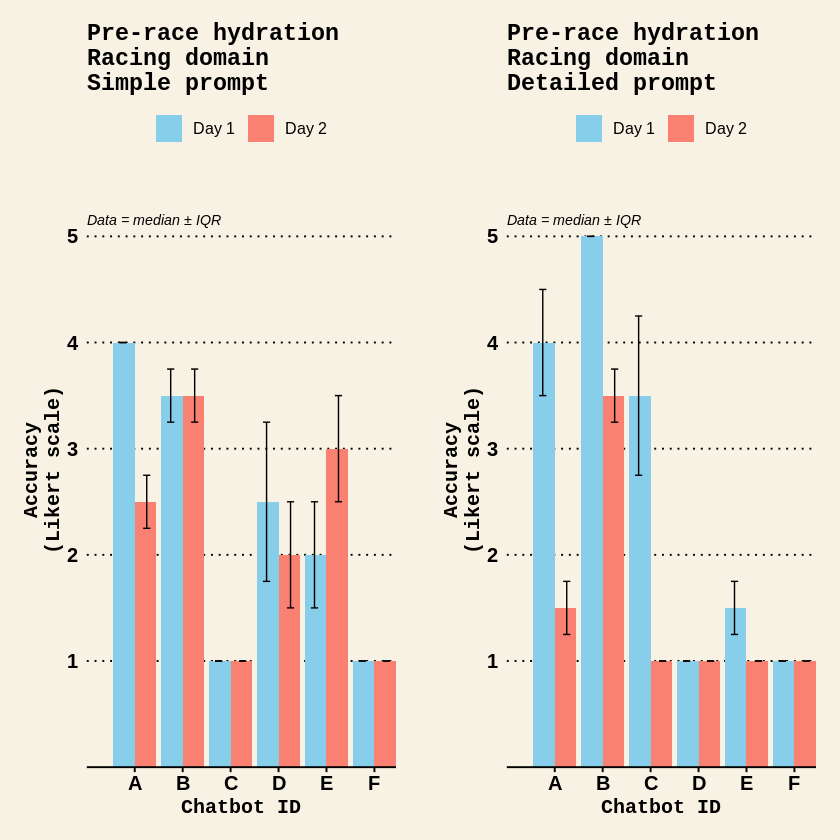

In [50]:
# Create the Likert plots
HydrationBeforeRaceSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_HydrationBeforeRace_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_HydrationBeforeRace_Median - SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_HydrationBeforeRace_Median + SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race hydration\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

HydrationBeforeRaceDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median - DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median + DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Pre-race hydration\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(HydrationBeforeRaceSimpleRacingLikert, HydrationBeforeRaceDetailedRacingLikert, ncol = 2)

##### Hydration during the race

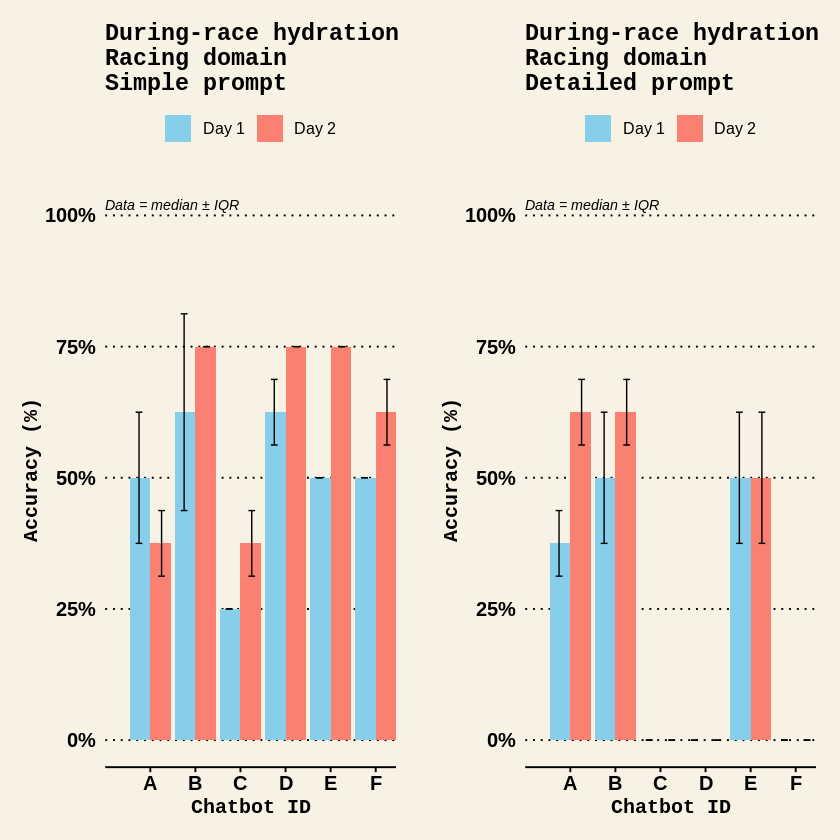

In [51]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_HydrationDuringRace <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_HydrationDuringRace_Median, SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR) %>%
  mutate(SimpleRacing_Accuracy_HydrationDuringRace_Minus1 = SimplePrompt_Racing_Accuracy_HydrationDuringRace_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_HydrationDuringRacePC = SimpleRacing_Accuracy_HydrationDuringRace_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC = SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_HydrationDuringRace <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median, DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR) %>%
  mutate(DetailedRacing_Accuracy_HydrationDuringRace_Minus1 = DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_HydrationDuringRacePC = DetailedRacing_Accuracy_HydrationDuringRace_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC = DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
HydrationDuringRaceSimpleRacing <- ggplot(SimpleRacing_Accuracy_HydrationDuringRace, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_HydrationDuringRacePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_HydrationDuringRacePC - SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_HydrationDuringRacePC + SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race hydration\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

HydrationDuringRaceDetailedRacing <- ggplot(DetailedRacing_Accuracy_HydrationDuringRace, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_HydrationDuringRacePC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_HydrationDuringRacePC - DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_HydrationDuringRacePC + DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race hydration\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(HydrationDuringRaceSimpleRacing, HydrationDuringRaceDetailedRacing, ncol = 2)

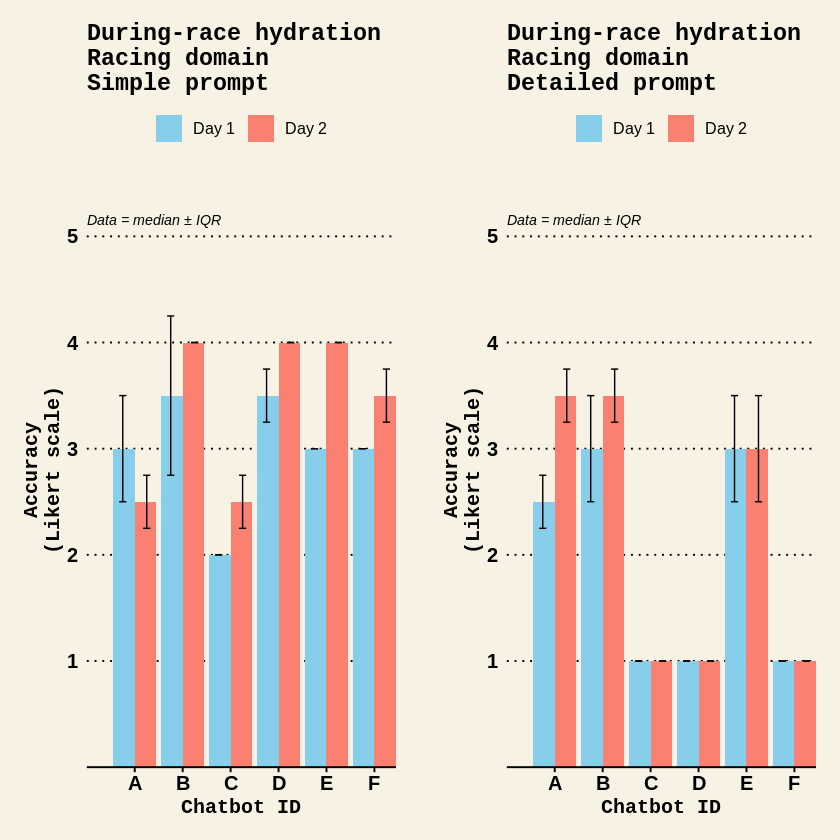

In [52]:
# Create the Likert plots
HydrationDuringRaceSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_HydrationDuringRace_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_HydrationDuringRace_Median - SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_HydrationDuringRace_Median + SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race hydration\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

HydrationDuringRaceDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE)  +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median - DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median + DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "During-race hydration\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(HydrationDuringRaceSimpleRacingLikert, HydrationDuringRaceDetailedRacingLikert, ncol = 2)

##### Supplements

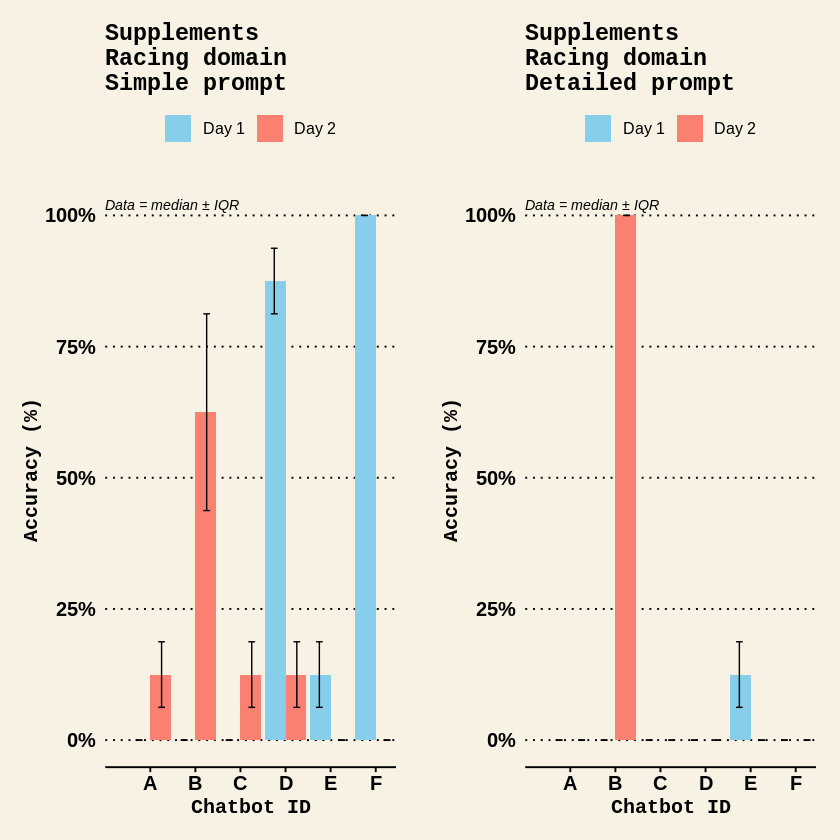

In [53]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_Supplements <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_Supplements_Median, SimplePrompt_Racing_Accuracy_Supplements_IQR) %>%
  mutate(SimpleRacing_Accuracy_Supplements_Minus1 = SimplePrompt_Racing_Accuracy_Supplements_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_SupplementsPC = SimpleRacing_Accuracy_Supplements_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_Supplements_IQR_PC = SimplePrompt_Racing_Accuracy_Supplements_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_Supplements <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_Supplements_Median,DetailedPrompt_Racing_Accuracy_Supplements_IQR) %>%
  mutate(DetailedRacing_Accuracy_Supplements_Minus1 = DetailedPrompt_Racing_Accuracy_Supplements_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_SupplementsPC = DetailedRacing_Accuracy_Supplements_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC = DetailedPrompt_Racing_Accuracy_Supplements_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
SupplementsSimpleRacing <- ggplot(SimpleRacing_Accuracy_Supplements, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_SupplementsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_SupplementsPC - SimplePrompt_Racing_Accuracy_Supplements_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_SupplementsPC + SimplePrompt_Racing_Accuracy_Supplements_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

SupplementsDetailedRacing <- ggplot(DetailedRacing_Accuracy_Supplements, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_SupplementsPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_SupplementsPC - DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_SupplementsPC + DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(SupplementsSimpleRacing, SupplementsDetailedRacing, ncol = 2)

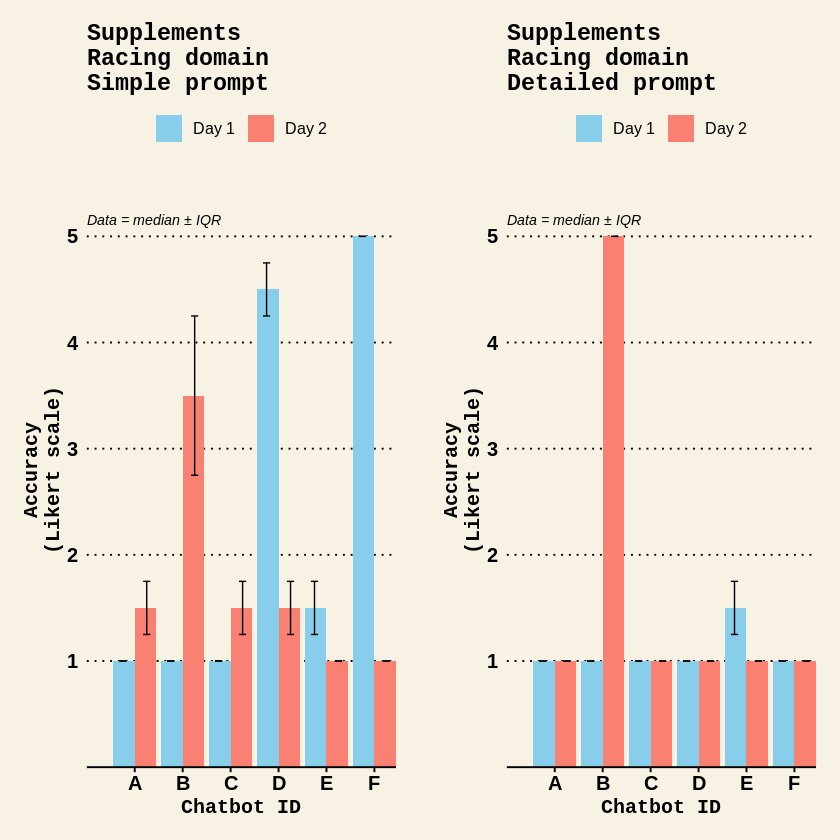

In [54]:
# Create the Likert plots
SupplementsSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_Supplements_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_Supplements_Median - SimplePrompt_Racing_Accuracy_Supplements_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_Supplements_Median + SimplePrompt_Racing_Accuracy_Supplements_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

SupplementsDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_Supplements_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_Supplements_Median - DetailedPrompt_Racing_Accuracy_Supplements_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_Supplements_Median + DetailedPrompt_Racing_Accuracy_Supplements_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Supplements\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(SupplementsSimpleRacingLikert, SupplementsDetailedRacingLikert, ncol = 2)

##### Individualisation

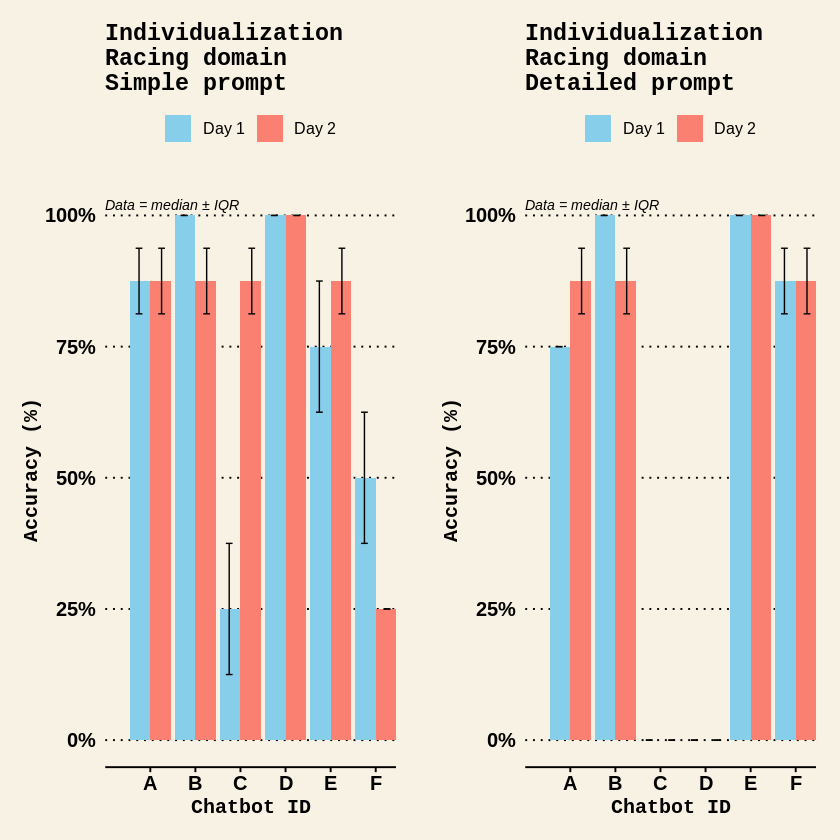

In [55]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_Individualization <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_Individualization_Median, SimplePrompt_Racing_Accuracy_Individualization_IQR) %>%
  mutate(SimpleRacing_Accuracy_Individualization_Minus1 = SimplePrompt_Racing_Accuracy_Individualization_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_IndividualizationPC = SimpleRacing_Accuracy_Individualization_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_Individualization_IQR_PC = SimplePrompt_Racing_Accuracy_Individualization_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_Individualization <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_Individualization_Median,DetailedPrompt_Racing_Accuracy_Individualization_IQR) %>%
  mutate(DetailedRacing_Accuracy_Individualization_Minus1 = DetailedPrompt_Racing_Accuracy_Individualization_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_IndividualizationPC = DetailedRacing_Accuracy_Individualization_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC = DetailedPrompt_Racing_Accuracy_Individualization_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
IndividualizationSimpleRacing <- ggplot(SimpleRacing_Accuracy_Individualization, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_IndividualizationPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_IndividualizationPC - SimplePrompt_Racing_Accuracy_Individualization_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_IndividualizationPC + SimplePrompt_Racing_Accuracy_Individualization_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

IndividualizationDetailedRacing <- ggplot(DetailedRacing_Accuracy_Individualization, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_IndividualizationPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_IndividualizationPC - DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_IndividualizationPC + DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(IndividualizationSimpleRacing, IndividualizationDetailedRacing, ncol = 2)

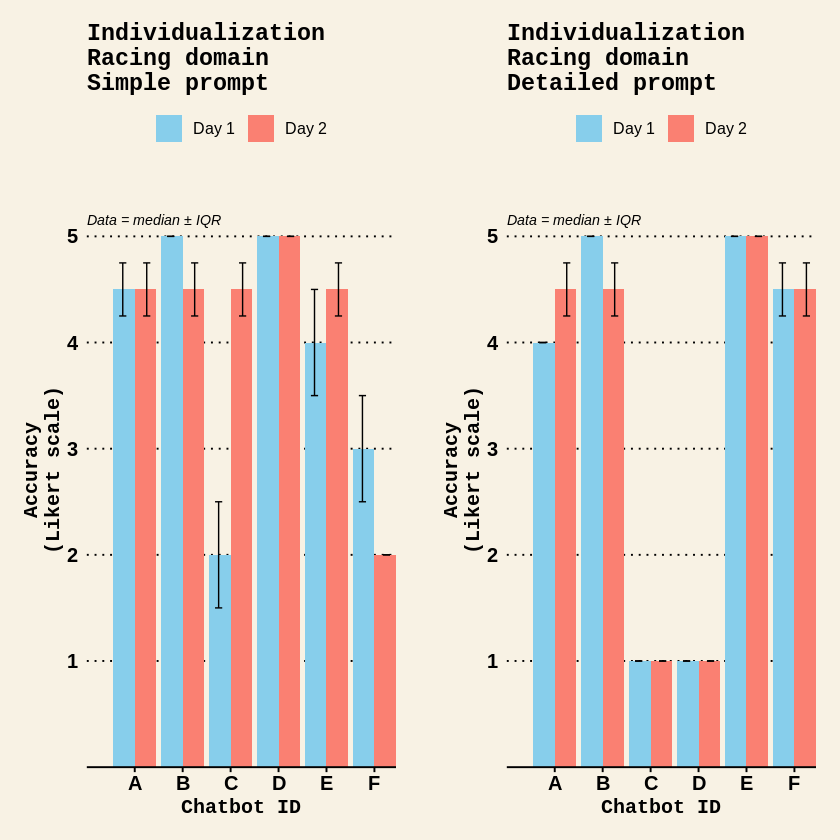

In [56]:
# Create the Likert plots
IndividualizationSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_Individualization_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_Individualization_Median - SimplePrompt_Racing_Accuracy_Individualization_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_Individualization_Median + SimplePrompt_Racing_Accuracy_Individualization_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

IndividualizationDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_Individualization_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_Individualization_Median - DetailedPrompt_Racing_Accuracy_Individualization_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_Individualization_Median + DetailedPrompt_Racing_Accuracy_Individualization_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Individualization\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(IndividualizationSimpleRacingLikert, IndividualizationDetailedRacingLikert, ncol = 2)

##### Disclaimer

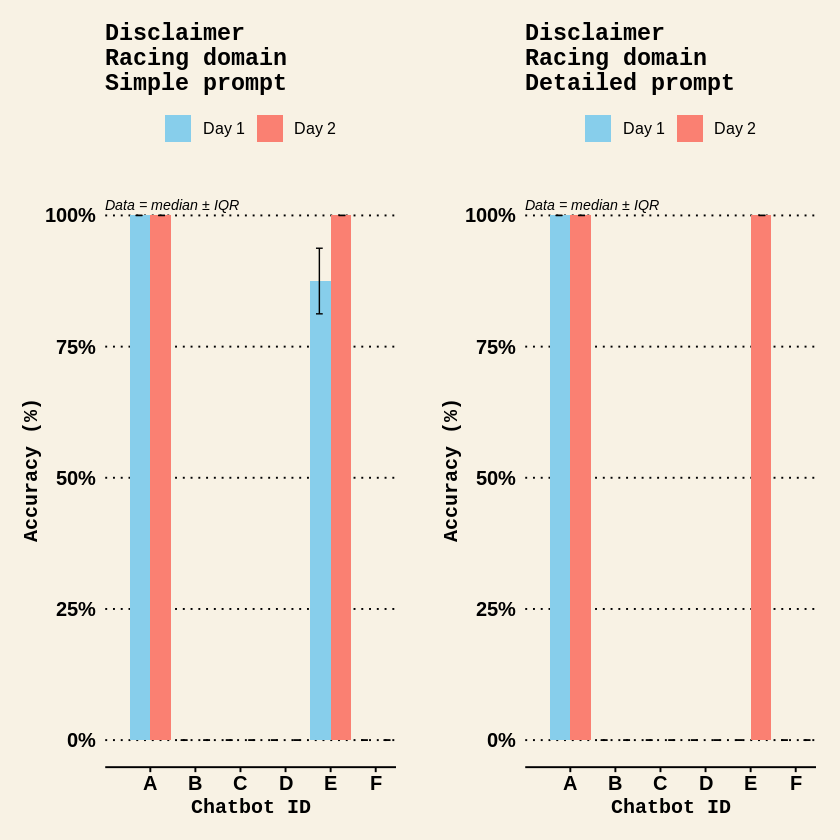

In [57]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1
SimpleRacing_Accuracy_Disclaimer <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_Disclaimer_Median, SimplePrompt_Racing_Accuracy_Disclaimer_IQR) %>%
  mutate(SimpleRacing_Accuracy_Disclaimer_Minus1 = SimplePrompt_Racing_Accuracy_Disclaimer_Median - 1) %>%
  mutate(SimpleRacing_Accuracy_DisclaimerPC = SimpleRacing_Accuracy_Disclaimer_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC = SimplePrompt_Racing_Accuracy_Disclaimer_IQR / maximalCriterionLikert_Minus1)

DetailedRacing_Accuracy_Disclaimer <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_Disclaimer_Median, DetailedPrompt_Racing_Accuracy_Disclaimer_IQR) %>%
  mutate(DetailedRacing_Accuracy_Disclaimer_Minus1 = DetailedPrompt_Racing_Accuracy_Disclaimer_Median - 1) %>%
  mutate(DetailedRacing_Accuracy_DisclaimerPC = DetailedRacing_Accuracy_Disclaimer_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC = DetailedPrompt_Racing_Accuracy_Disclaimer_IQR / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
DisclaimerSimpleRacing <- ggplot(SimpleRacing_Accuracy_Disclaimer, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimpleRacing_Accuracy_DisclaimerPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimpleRacing_Accuracy_DisclaimerPC - SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimpleRacing_Accuracy_DisclaimerPC + SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DisclaimerDetailedRacing <- ggplot(DetailedRacing_Accuracy_Disclaimer, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedRacing_Accuracy_DisclaimerPC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedRacing_Accuracy_DisclaimerPC - DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedRacing_Accuracy_DisclaimerPC + DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DisclaimerSimpleRacing, DisclaimerDetailedRacing, ncol = 2)

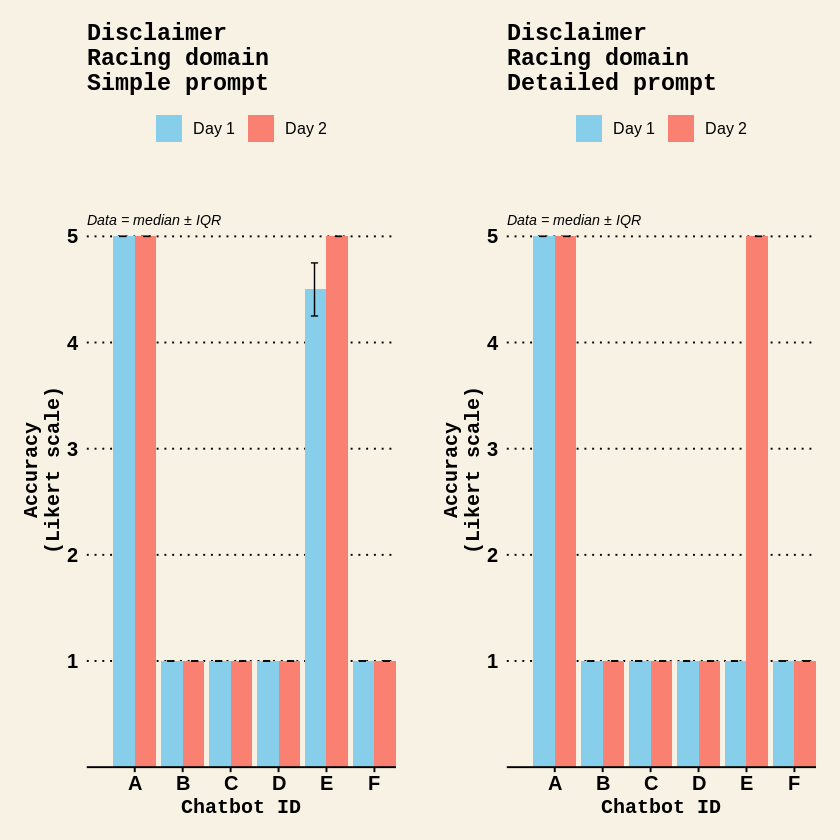

In [58]:
# Create the Likert plots
DisclaimerSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_Disclaimer_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_Disclaimer_Median - SimplePrompt_Racing_Accuracy_Disclaimer_IQR / 2,
      ymax = SimplePrompt_Racing_Accuracy_Disclaimer_Median + SimplePrompt_Racing_Accuracy_Disclaimer_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

DisclaimerDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_Disclaimer_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_Disclaimer_Median - DetailedPrompt_Racing_Accuracy_Disclaimer_IQR / 2,
      ymax = DetailedPrompt_Racing_Accuracy_Disclaimer_Median + DetailedPrompt_Racing_Accuracy_Disclaimer_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Disclaimer\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(DisclaimerSimpleRacingLikert, DisclaimerDetailedRacingLikert, ncol = 2)

### Calculate sum of accuracy scores

#### Training domain

In [59]:
# Extract column names containing the word "Training_Accuracy"
Training_Accuracy_columns <- grep("Training_Accuracy", names(Experiment1_Analysis), value = TRUE)

# Print the result
print(Training_Accuracy_columns)

 [1] "SimplePrompt_Training_Accuracy_EnergyAvailability_Median"  
 [2] "SimplePrompt_Training_Accuracy_DailyCarbIntake_Median"     
 [3] "SimplePrompt_Training_Accuracy_DailyProtein_Median"        
 [4] "SimplePrompt_Training_Accuracy_PostSessionCarbs_Median"    
 [5] "SimplePrompt_Training_Accuracy_PostSessionProtein_Median"  
 [6] "SimplePrompt_Training_Accuracy_Hydration_Median"           
 [7] "SimplePrompt_Training_Accuracy_Supplements_Median"         
 [8] "SimplePrompt_Training_Accuracy_Individualization_Median"   
 [9] "SimplePrompt_Training_Accuracy_Disclaimer_Median"          
[10] "DetailedPrompt_Training_Accuracy_EnergyAvailability_Median"
[11] "DetailedPrompt_Training_Accuracy_DailyCarbIntake_Median"   
[12] "DetailedPrompt_Training_Accuracy_DailyProtein_Median"      
[13] "DetailedPrompt_Training_Accuracy_PostSessionCarbs_Median"  
[14] "DetailedPrompt_Training_Accuracy_PostSessionProtein_Median"
[15] "DetailedPrompt_Training_Accuracy_Hydration_Median"         
[16] "Deta

In [60]:
# Add new columns to the Experiment1_Analysis dataframe that contains the sum of the SimplePrompt_Training_Accuracy and DetailedPrompt_Training_Accuracy columns
# First, identify the columns that start with "SimplePrompt_Training_Accuracy_" and end with "_Median"
SimpleTrainingMedian_cols <- grep("^SimplePrompt_Training_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)
# and identify the columns that start with "DetailedPrompt_Training_Accuracy_" and end with "_Median"
DetailedTrainingMedian_cols <- grep("^DetailedPrompt_Training_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)

# Then, calculate the row-wise sum for these columns
Experiment1_Analysis$SimplePrompt_Training_Accuracy_Sum <- rowSums(Experiment1_Analysis[SimpleTrainingMedian_cols], na.rm = TRUE)
Experiment1_Analysis$DetailedPrompt_Training_Accuracy_Sum <- rowSums(Experiment1_Analysis[DetailedTrainingMedian_cols], na.rm = TRUE)

# Find the position where we want to insert the new columns
insert_positionSimpleTraining <- which(names(Experiment1_Analysis) == "SimplePrompt_Training_Accuracy_Disclaimer_Median") + 1
insert_positionDetailedTraining <- which(names(Experiment1_Analysis) == "DetailedPrompt_Training_Accuracy_Disclaimer_Median") + 1

# Get the column names where we want to place the new columns
SimplePrompt_Training_Accuracy_Disclaimer_Median_name <- names(Experiment1_Analysis)[insert_positionSimpleTraining - 1]
DetailedPrompt_Training_Accuracy_Disclaimer_Median_name <- names(Experiment1_Analysis)[insert_positionDetailedTraining - 1]

# Reorder the columns to place the new columns right after the rows of accuracy columns
Experiment1_Analysis <- Experiment1_Analysis %>%
  dplyr::relocate(SimplePrompt_Training_Accuracy_Sum, .after = all_of(SimplePrompt_Training_Accuracy_Disclaimer_Median_name))
Experiment1_Analysis <- Experiment1_Analysis %>%
  dplyr::relocate(DetailedPrompt_Training_Accuracy_Sum, .after = all_of(DetailedPrompt_Training_Accuracy_Disclaimer_Median_name))

# view the dataframe to check that new columns are inserted correctly
glimpse(Experiment1_Analysis)

Rows: 12
Columns: 116
$ ChatbotID                                                   <chr> "ChatbotA"…
$ TestDay                                                     <chr> "Test1", "…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_Median    <dbl> 1.0, 3.5, …
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_Median       <dbl> 2.5, 4.0, …
$ SimplePrompt_Training_Accuracy_DailyProtein_Median          <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_Median      <dbl> 2.5, 4.0, …
$ SimplePrompt_Training_Accuracy_PostSessionProtein_Median    <dbl> 3.0, 5.0, …
$ SimplePrompt_Training_Accuracy_Hydration_Median             <dbl> 4.0, 4.0, …
$ SimplePrompt_Training_Accuracy_Supplements_Median           <dbl> 4.0, 4.0, …
$ SimplePrompt_Training_Accuracy_Individualization_Median     <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_Disclaimer_Median            <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_Sum                          <dbl> 30.5, 39.5…
$ SimplePrompt_Tra

In [61]:
# Prepare the data for plotting
# Calculate maximal possible accuracy score in the Training domain as the maximal possible Likert score (maximalCriterionLikert = 5; already assigned in a previous step) multiplied by the total number of criteria items.
# Therefore, the maximal possible accuracy score for the Training domain (maximalAccuracyTrainingDomain) is 45.
# So, assign the number of items in the Training domain (9):
trainingDomainItems = 9
# And, calculate the maximal accuracy in the Training domain:
maximalAccuracyTrainingDomain = maximalCriterionLikert * trainingDomainItems
maximalAccuracyTrainingDomain

[1] 45

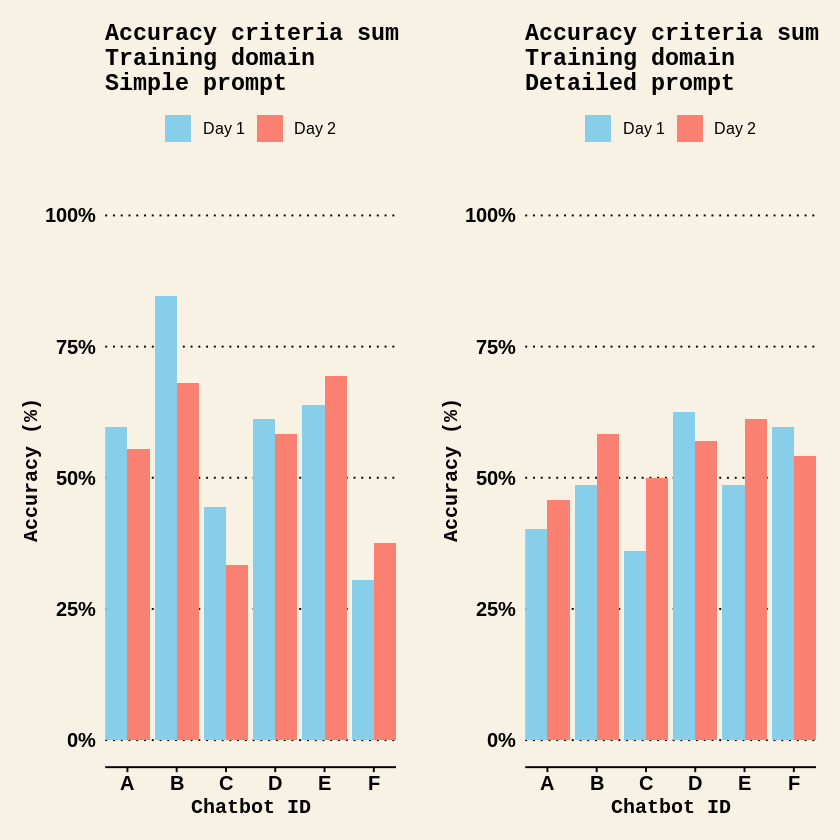

In [62]:
# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5). And, because the total accurcay score is the sum of several criteria, need to subtract 1 for each criteria.
# Therefore:
maximalAccuracyTrainingDomain_forPC = maximalCriterionLikert_Minus1 * trainingDomainItems

SimplePrompt_Training_Accuracy <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Sum) %>%
  mutate(SimplePrompt_Training_Accuracy_forPC = SimplePrompt_Training_Accuracy_Sum - trainingDomainItems) %>%
  mutate(SimplePrompt_Training_Accuracy_PC = SimplePrompt_Training_Accuracy_forPC / maximalAccuracyTrainingDomain_forPC)

DetailedPrompt_Training_Accuracy <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Sum) %>%
  mutate(DetailedPrompt_Training_Accuracy_forPC = DetailedPrompt_Training_Accuracy_Sum - trainingDomainItems) %>%
  mutate(DetailedPrompt_Training_Accuracy_PC = DetailedPrompt_Training_Accuracy_forPC / maximalAccuracyTrainingDomain_forPC)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
AccuracySimpleTrainingPC <- ggplot(SimplePrompt_Training_Accuracy, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

AccuracyDetailedTrainingPC <- ggplot(DetailedPrompt_Training_Accuracy, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

# Arrange the plots side by side
grid.arrange(AccuracySimpleTrainingPC, AccuracyDetailedTrainingPC, ncol = 2)

In [63]:
# Print SimplePrompt_Training_Accuracy data frame
cat("Accuracy criteria sum for Simple Prompt in the Training domain")
SimplePrompt_Training_Accuracy
# Print DetailedPrompt_Training_Accuracy data frame
cat("\nAccuracy criteria sum for Detailed Prompt in the Training domain")
DetailedPrompt_Training_Accuracy

Accuracy criteria sum for Simple Prompt in the Training domain

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_Sum,SimplePrompt_Training_Accuracy_forPC,SimplePrompt_Training_Accuracy_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,30.5,21.5,0.5972222
ChatbotB,Test1,39.5,30.5,0.8472222
ChatbotC,Test1,25.0,16.0,0.4444444
ChatbotD,Test1,31.0,22.0,0.6111111
ChatbotE,Test1,32.0,23.0,0.6388889
ChatbotF,Test1,20.0,11.0,0.3055556
ChatbotA,Test2,29.0,20.0,0.5555556
ChatbotB,Test2,33.5,24.5,0.6805556
ChatbotC,Test2,21.0,12.0,0.3333333



Accuracy criteria sum for Detailed Prompt in the Training domain

ChatbotID,TestDay,DetailedPrompt_Training_Accuracy_Sum,DetailedPrompt_Training_Accuracy_forPC,DetailedPrompt_Training_Accuracy_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,23.5,14.5,0.4027778
ChatbotB,Test1,26.5,17.5,0.4861111
ChatbotC,Test1,22.0,13.0,0.3611111
ChatbotD,Test1,31.5,22.5,0.6250000
ChatbotE,Test1,26.5,17.5,0.4861111
ChatbotF,Test1,30.5,21.5,0.5972222
ChatbotA,Test2,25.5,16.5,0.4583333
ChatbotB,Test2,30.0,21.0,0.5833333
ChatbotC,Test2,27.0,18.0,0.5000000


In [64]:
str(Experiment1_Analysis$SimplePrompt_Training_Accuracy_Sum)

 num [1:12] 30.5 39.5 25 31 32 20 29 33.5 21 30 ...


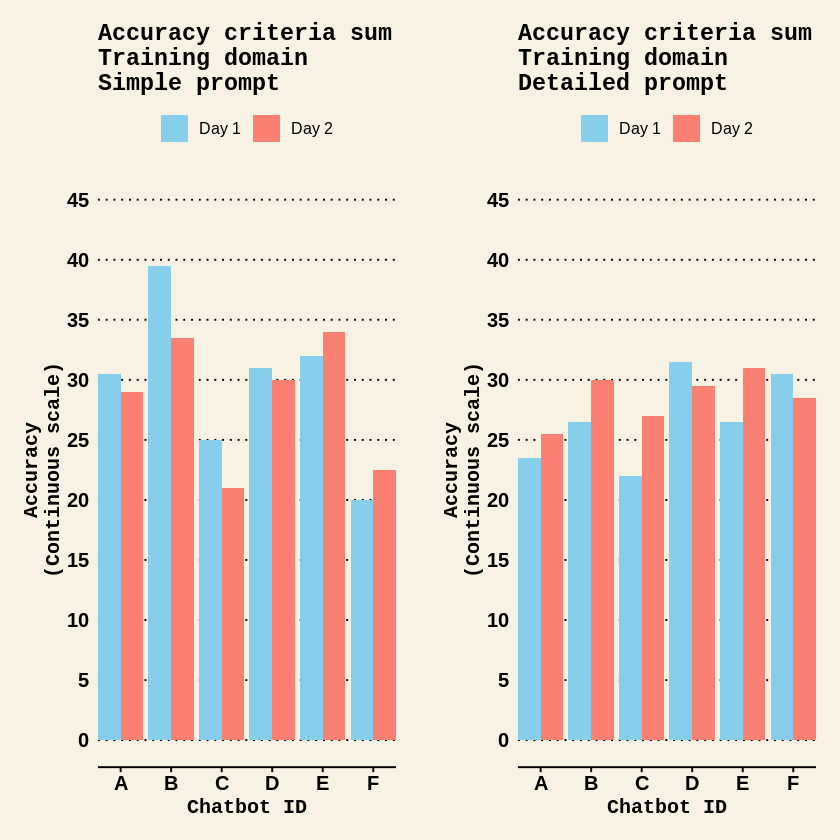

In [65]:
# Create the Likert plots with continuous y-axis
AccuracySimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Sum,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Continuous scale)"
  ) +
  scale_y_continuous(limits = c(0, 45), breaks = seq(0, 45, by = 5)) +  # Set y-axis to continuous scale instead of ordinal categorical scale so the axes are clearer to view.
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

AccuracyDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Sum,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Continuous scale)"
  ) +
  scale_y_continuous(limits = c(0, 45), breaks = seq(0, 45, by = 5)) +  # Set y-axis to continuous scale instead of ordinal categorical scale so the axes are clearer to view.
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

# Arrange the plots side by side
grid.arrange(AccuracySimpleTrainingLikert, AccuracyDetailedTrainingLikert, ncol = 2)

#### Racing domain

In [66]:
# Extract column names containing the word "Racing_Accuracy"
Racing_Accuracy_columns <- grep("Racing_Accuracy", names(Experiment1_Analysis), value = TRUE)

# Print the result
print(Racing_Accuracy_columns)

 [1] "SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median"        
 [2] "SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median"   
 [3] "SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median"       
 [4] "SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median"  
 [5] "SimplePrompt_Racing_Accuracy_CarbsDuringRace_Median"        
 [6] "SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median"   
 [7] "SimplePrompt_Racing_Accuracy_HydrationBeforeRace_Median"    
 [8] "SimplePrompt_Racing_Accuracy_HydrationDuringRace_Median"    
 [9] "SimplePrompt_Racing_Accuracy_Supplements_Median"            
[10] "SimplePrompt_Racing_Accuracy_Individualization_Median"      
[11] "SimplePrompt_Racing_Accuracy_Disclaimer_Median"             
[12] "DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_Median"      
[13] "DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median" 
[14] "DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median"     
[15] "DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Med

In [67]:
# Add new columns to the Experiment1_Analysis dataframe that contains the sum of the SimplePrompt_Racing_Accuracy and DetailedPrompt_Racing_Accuracy columns
# First, identify the columns that start with "SimplePrompt_Racing_Accuracy_" and end with "_Median"
SimpleRacingMedian_cols <- grep("^SimplePrompt_Racing_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)
# and identify the columns that start with "DetailedPrompt_Racing_Accuracy_" and end with "_Median"
DetailedRacingMedian_cols <- grep("^DetailedPrompt_Racing_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)

# Then, calculate the row-wise sum for these columns
Experiment1_Analysis$SimplePrompt_Racing_Accuracy_Sum <- rowSums(Experiment1_Analysis[SimpleRacingMedian_cols], na.rm = TRUE)
Experiment1_Analysis$DetailedPrompt_Racing_Accuracy_Sum <- rowSums(Experiment1_Analysis[DetailedRacingMedian_cols], na.rm = TRUE)

# Find the position where we want to insert the new columns
insert_positionSimpleRacing <- which(names(Experiment1_Analysis) == "SimplePrompt_Racing_Accuracy_Disclaimer_Median") + 1
insert_positionDetailedRacing <- which(names(Experiment1_Analysis) == "DetailedPrompt_Racing_Accuracy_Disclaimer_Median") + 1

# Get the column names where we want to place the new columns
SimplePrompt_Racing_Accuracy_Disclaimer_Median_name <- names(Experiment1_Analysis)[insert_positionSimpleRacing - 1]
DetailedPrompt_Racing_Accuracy_Disclaimer_Median_name <- names(Experiment1_Analysis)[insert_positionDetailedRacing - 1]

# Reorder the columns to place the new columns right after the rows of accuracy columns
Experiment1_Analysis <- Experiment1_Analysis %>%
  dplyr::relocate(SimplePrompt_Racing_Accuracy_Sum, .after = all_of(SimplePrompt_Racing_Accuracy_Disclaimer_Median_name))
Experiment1_Analysis <- Experiment1_Analysis %>%
  dplyr::relocate(DetailedPrompt_Racing_Accuracy_Sum, .after = all_of(DetailedPrompt_Racing_Accuracy_Disclaimer_Median_name))

# view the dataframe to check that new columns are inserted correctly
glimpse(Experiment1_Analysis)

Rows: 12
Columns: 118
$ ChatbotID                                                   <chr> "ChatbotA"…
$ TestDay                                                     <chr> "Test1", "…
$ SimplePrompt_Training_Accuracy_EnergyAvailability_Median    <dbl> 1.0, 3.5, …
$ SimplePrompt_Training_Accuracy_DailyCarbIntake_Median       <dbl> 2.5, 4.0, …
$ SimplePrompt_Training_Accuracy_DailyProtein_Median          <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_PostSessionCarbs_Median      <dbl> 2.5, 4.0, …
$ SimplePrompt_Training_Accuracy_PostSessionProtein_Median    <dbl> 3.0, 5.0, …
$ SimplePrompt_Training_Accuracy_Hydration_Median             <dbl> 4.0, 4.0, …
$ SimplePrompt_Training_Accuracy_Supplements_Median           <dbl> 4.0, 4.0, …
$ SimplePrompt_Training_Accuracy_Individualization_Median     <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_Disclaimer_Median            <dbl> 4.5, 5.0, …
$ SimplePrompt_Training_Accuracy_Sum                          <dbl> 30.5, 39.5…
$ SimplePrompt_Tra

In [68]:
# Calculate maximal possible accuracy score in the Racing domain as the maximal possible Likert score (maximalCriterionLikert = 5; already assigned in a previous step) multiplied by the total number of criteria items.
# Therefore, the maximal possible accuracy score for the Racing domain (maximalAccuracyRacingDomain) is 55, and 100 for overall accuracy.
# So, assign the number of items in the Racing domain (11):
racingDomainItems = 11
# And, calculate the maximal accuracy in the Racing domain:
maximalAccuracyRacingDomain = maximalCriterionLikert * racingDomainItems
maximalAccuracyRacingDomain

[1] 55

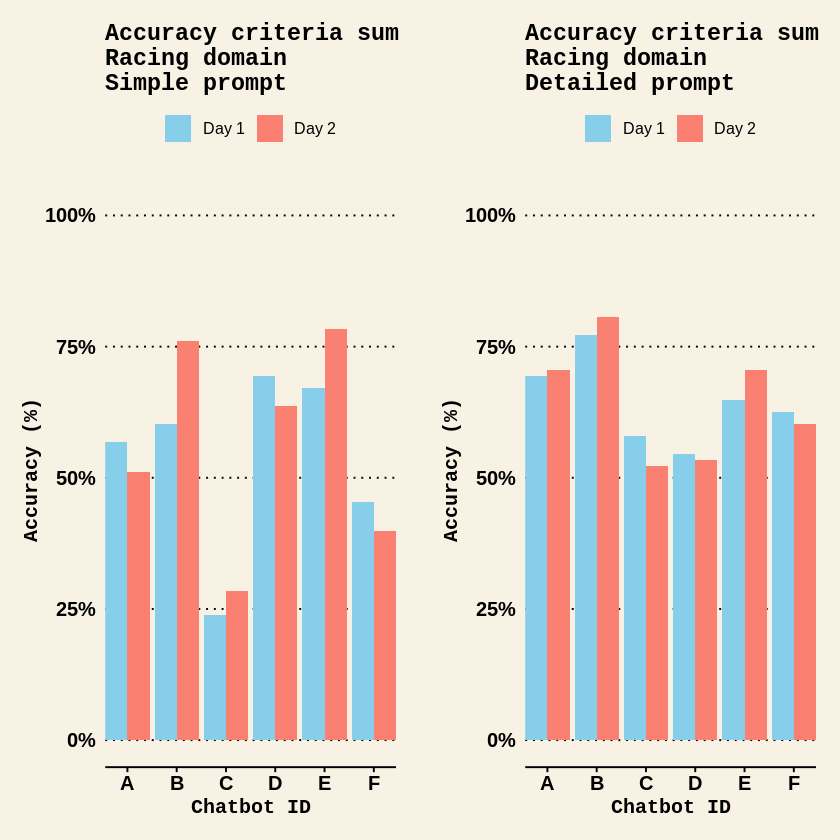

In [69]:
# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5). And, because the total accurcay score is the sum of several criteria, need to subtract 1 for each criteria.
# Therefore:
maximalAccuracyRacingDomain_forPC = maximalCriterionLikert_Minus1 * racingDomainItems

SimplePrompt_Racing_Accuracy <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_Sum) %>%
  mutate(SimplePrompt_Racing_Accuracy_forPC = SimplePrompt_Racing_Accuracy_Sum - racingDomainItems) %>%
  mutate(SimplePrompt_Racing_Accuracy_PC = SimplePrompt_Racing_Accuracy_forPC / maximalAccuracyRacingDomain_forPC)

DetailedPrompt_Racing_Accuracy <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_Sum) %>%
  mutate(DetailedPrompt_Racing_Accuracy_forPC = DetailedPrompt_Racing_Accuracy_Sum - racingDomainItems) %>%
  mutate(DetailedPrompt_Racing_Accuracy_PC = DetailedPrompt_Racing_Accuracy_forPC / maximalAccuracyRacingDomain_forPC)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
AccuracySimpleRacingPC <- ggplot(SimplePrompt_Racing_Accuracy, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

AccuracyDetailedRacingPC <- ggplot(DetailedPrompt_Racing_Accuracy, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

# Arrange the plots side by side
grid.arrange(AccuracySimpleRacingPC, AccuracyDetailedRacingPC, ncol = 2)

In [70]:
# Print SimplePrompt_Racing_Accuracy data frame
cat("Accuracy criteria sum for Simple Prompt in the Racing domain")
SimplePrompt_Racing_Accuracy
# Print DetailedPrompt_Racing_Accuracy data frame
cat("\nAccuracy criteria sum for Detailed Prompt in the Racing domain")
DetailedPrompt_Racing_Accuracy

Accuracy criteria sum for Simple Prompt in the Racing domain

ChatbotID,TestDay,SimplePrompt_Racing_Accuracy_Sum,SimplePrompt_Racing_Accuracy_forPC,SimplePrompt_Racing_Accuracy_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,36.0,25.0,0.5681818
ChatbotB,Test1,37.5,26.5,0.6022727
ChatbotC,Test1,21.5,10.5,0.2386364
ChatbotD,Test1,41.5,30.5,0.6931818
ChatbotE,Test1,40.5,29.5,0.6704545
ChatbotF,Test1,31.0,20.0,0.4545455
ChatbotA,Test2,33.5,22.5,0.5113636
ChatbotB,Test2,44.5,33.5,0.7613636
ChatbotC,Test2,23.5,12.5,0.2840909



Accuracy criteria sum for Detailed Prompt in the Racing domain

ChatbotID,TestDay,DetailedPrompt_Racing_Accuracy_Sum,DetailedPrompt_Racing_Accuracy_forPC,DetailedPrompt_Racing_Accuracy_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,41.5,30.5,0.6931818
ChatbotB,Test1,45.0,34.0,0.7727273
ChatbotC,Test1,36.5,25.5,0.5795455
ChatbotD,Test1,35.0,24.0,0.5454545
ChatbotE,Test1,39.5,28.5,0.6477273
ChatbotF,Test1,38.5,27.5,0.6250000
ChatbotA,Test2,42.0,31.0,0.7045455
ChatbotB,Test2,46.5,35.5,0.8068182
ChatbotC,Test2,34.0,23.0,0.5227273


Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_text()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_text()`).”


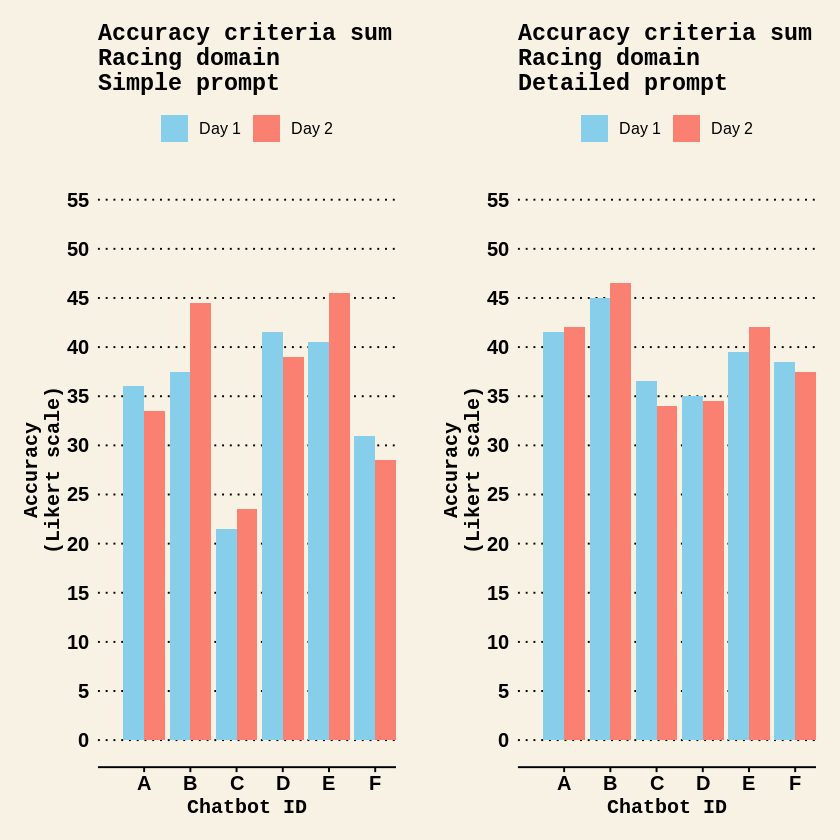

In [71]:
# Create the Likert plots
AccuracySimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_Sum,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_continuous(limits = c(0, 55), breaks = seq(0, 55, by = 5)) +  # Set y-axis to continuous scale instead of ordinal categorical scale so the axes are clearer to view.
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 55.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

AccuracyDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_Sum,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(Likert scale)"
  ) +
  scale_y_continuous(limits = c(0, 55), breaks = seq(0, 55, by = 5)) +  # Set y-axis to continuous scale instead of ordinal categorical scale so the axes are clearer to view.
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 55.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(AccuracySimpleRacingLikert, AccuracyDetailedRacingLikert, ncol = 2)

#### Overall accuracy

In [72]:
# Calculate maximal possible overall accuracy score as the maximal possible Likert score (maximalCriterionLikert = 5; already assigned in a previous step) multiplied by the total number of criteria items in both domains (Training and Racing).
# Therefore, the maximal possible overall accuracy score (maximalAccuracyOverall) is 100 (45 for training + 55 for racing).
# So, calculate the maximal overall accuracy:
totalDomainItems = trainingDomainItems + racingDomainItems
maximalAccuracyOverall = maximalCriterionLikert * totalDomainItems
maximalAccuracyOverall

[1] 100

In [73]:
# Add 2 new columns to the Experiment1_Analysis dataframe.
# The first column is called SimplePrompt_Accuracy_combined and is the sum of SimplePrompt_Training_Accuracy_Sum and SimplePrompt_Racing_Accuracy_Sumand another called
Experiment1_Analysis$SimplePrompt_Accuracy_combined <- Experiment1_Analysis$SimplePrompt_Training_Accuracy_Sum + Experiment1_Analysis$SimplePrompt_Racing_Accuracy_Sum
# The second column is called DetailedPrompt_Accuracy_combined and is the sum of DetailedPrompt_Training_Accuracy_Sum and DetailedPrompt_Racing_Accuracy_Sumand another called
Experiment1_Analysis$DetailedPrompt_Accuracy_combined <- Experiment1_Analysis$DetailedPrompt_Training_Accuracy_Sum + Experiment1_Analysis$DetailedPrompt_Racing_Accuracy_Sum

# view the dataframe to check that new columns are inserted correctly
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR,DetailedPrompt_Racing_Accuracy_Supplements_IQR,DetailedPrompt_Racing_Accuracy_Individualization_IQR,DetailedPrompt_Racing_Accuracy_Disclaimer_IQR,DetailedPrompt_Racing_Completeness_IQR,DetailedPrompt_Racing_Clarity_IQR,DetailedPrompt_Racing_Evidence_IQR,DetailedPrompt_Racing_ExtraInfo_IQR,SimplePrompt_Accuracy_combined,DetailedPrompt_Accuracy_combined
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,0.5,0.0,0.0,0,0.5,0,1.0,0.0,66.5,65.0
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,1.0,0.0,0.0,0,0.5,0,0.5,1.0,77.0,71.5
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,0.0,0.0,0.0,0,1.0,0,0.0,0.0,46.5,58.5
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,0.0,0.0,0.0,0,1.0,0,0.5,0.5,72.5,66.5
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,1.0,0.5,0.0,0,0.5,0,0.5,0.0,72.5,66.0
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,0.0,0.0,0.5,0,0.5,0,0.0,0.5,51.0,69.0
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,0.5,0.0,0.5,0,0.5,0,1.0,0.0,62.5,67.5
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,0.5,0.0,0.5,0,0.0,0,0.0,0.5,78.0,76.5
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,0.0,0.0,0.0,0,0.0,0,0.0,0.0,44.5,61.0


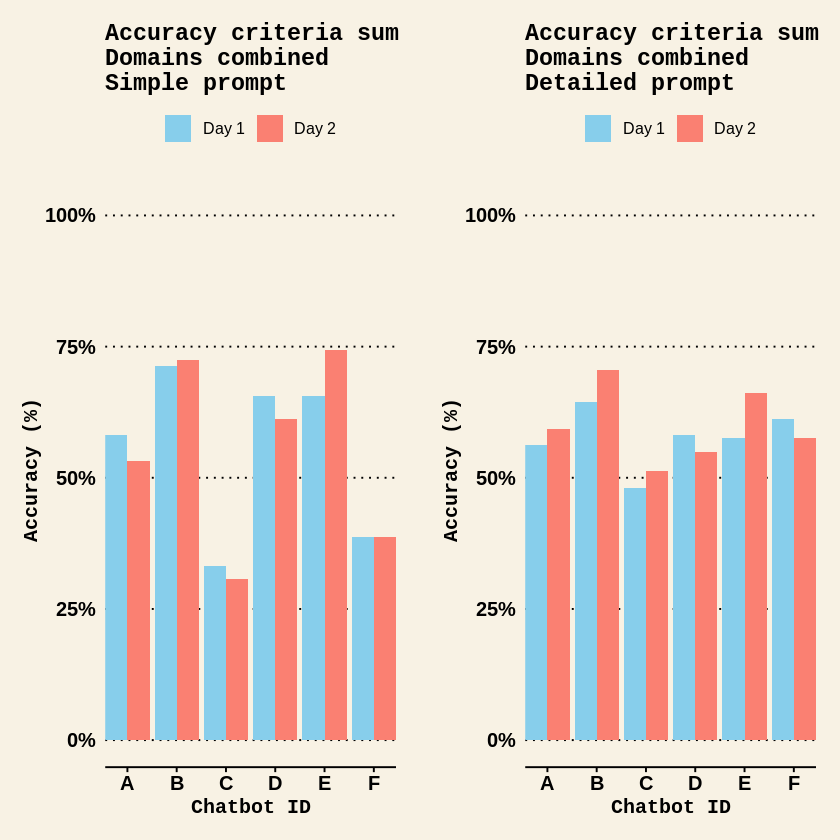

In [74]:
# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5). And, because the total accurcay score is the sum of several criteria, need to subtract 1 for each criteria.
# Therefore:
maximalAccuracyOverall_forPC = maximalCriterionLikert_Minus1 * totalDomainItems

SimplePrompt_Overall_Accuracy <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Accuracy_combined) %>%
  mutate(SimplePrompt_Accuracy_combined_forPC = SimplePrompt_Accuracy_combined - totalDomainItems) %>%
  mutate(SimplePrompt_Accuracy_combined_PC = SimplePrompt_Accuracy_combined_forPC / maximalAccuracyOverall_forPC)

DetailedPrompt_Overall_Accuracy <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Accuracy_combined) %>%
  mutate(DetailedPrompt_Accuracy_combined_forPC = DetailedPrompt_Accuracy_combined - totalDomainItems) %>%
  mutate(DetailedPrompt_Accuracy_combined_PC = DetailedPrompt_Accuracy_combined_forPC / maximalAccuracyOverall_forPC)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
OverallAccuracySimplePC <- ggplot(SimplePrompt_Overall_Accuracy, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Accuracy_combined_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

OverallAccuracyDetailedPC <- ggplot(DetailedPrompt_Overall_Accuracy, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Accuracy_combined_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

# Arrange the plots side by side
grid.arrange(OverallAccuracySimplePC, OverallAccuracyDetailedPC, ncol = 2)

In [75]:
# Print SimplePrompt_Overall_Accuracy data frame
cat("Overall accuracy criteria sum for SIMPLE Prompt \n(Training and Racing domains combined)")
SimplePrompt_Overall_Accuracy
# Print DetailedPrompt_Overall_Accuracy data frame
cat("\nOverall accuracy criteria sum for DETAILED Prompt \n(Training and Racing domains combined)")
DetailedPrompt_Overall_Accuracy

Overall accuracy criteria sum for SIMPLE Prompt 
(Training and Racing domains combined)

ChatbotID,TestDay,SimplePrompt_Accuracy_combined,SimplePrompt_Accuracy_combined_forPC,SimplePrompt_Accuracy_combined_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,66.5,46.5,0.58125
ChatbotB,Test1,77.0,57.0,0.71250
ChatbotC,Test1,46.5,26.5,0.33125
ChatbotD,Test1,72.5,52.5,0.65625
ChatbotE,Test1,72.5,52.5,0.65625
ChatbotF,Test1,51.0,31.0,0.38750
ChatbotA,Test2,62.5,42.5,0.53125
ChatbotB,Test2,78.0,58.0,0.72500
ChatbotC,Test2,44.5,24.5,0.30625



Overall accuracy criteria sum for DETAILED Prompt 
(Training and Racing domains combined)

ChatbotID,TestDay,DetailedPrompt_Accuracy_combined,DetailedPrompt_Accuracy_combined_forPC,DetailedPrompt_Accuracy_combined_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,65.0,45.0,0.56250
ChatbotB,Test1,71.5,51.5,0.64375
ChatbotC,Test1,58.5,38.5,0.48125
ChatbotD,Test1,66.5,46.5,0.58125
ChatbotE,Test1,66.0,46.0,0.57500
ChatbotF,Test1,69.0,49.0,0.61250
ChatbotA,Test2,67.5,47.5,0.59375
ChatbotB,Test2,76.5,56.5,0.70625
ChatbotC,Test2,61.0,41.0,0.51250


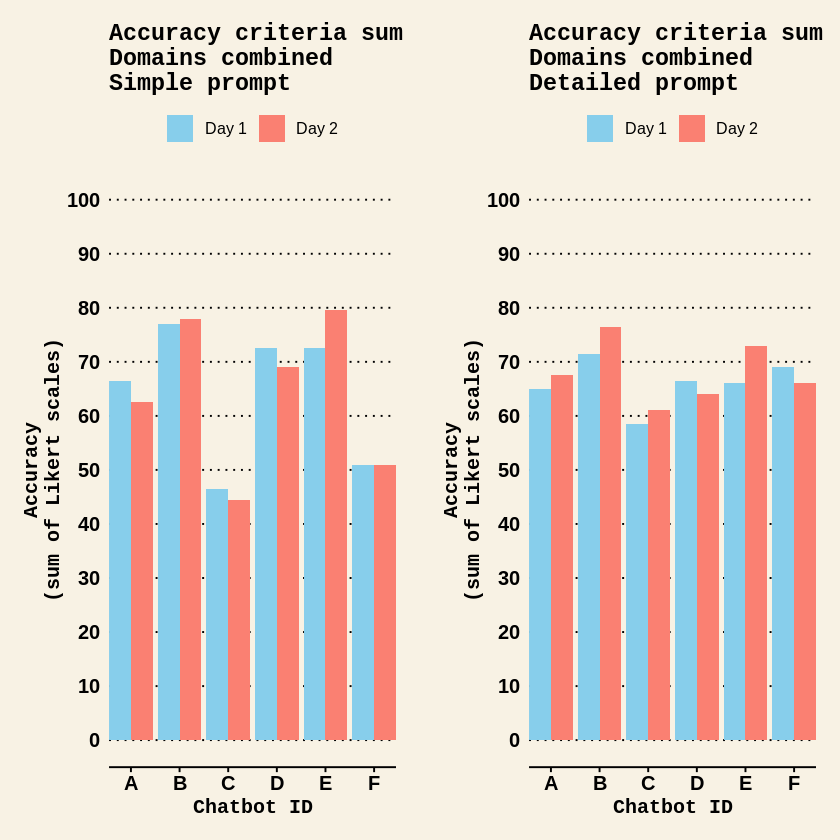

In [76]:
# Create the Likert plots
OverallAccuracySimpleLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Accuracy_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(sum of Likert scales)"
  ) +
  scale_y_continuous(limits = c(0, 100), breaks = seq(0, 100, by = 10)) +  # Set y-axis to continuous scale instead of ordinal categorical scale so the axes are clearer to view.
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) # Remove legend title

OverallAccuracyDetailedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Accuracy_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  labs(
    title = "Accuracy criteria sum\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(sum of Likert scales)"
  ) +
  scale_y_continuous(limits = c(0, 100), breaks = seq(0, 100, by = 10)) +  # Set y-axis to continuous scale instead of ordinal categorical scale so the axes are clearer to view.
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

# Arrange the plots side by side
grid.arrange(OverallAccuracySimpleLikert, OverallAccuracyDetailedLikert, ncol = 2)

### Calculate the mean of accuracy scores

#### Training domain

In [77]:
# Add new columns to the Experiment1_Analysis dataframe that contains the mean and SD of the SimplePrompt_Training_Accuracy and DetailedPrompt_Training_Accuracy columns
# Identify the columns that match the pattern "SimplePrompt_Training_Accuracy_.*_Median"
# NOTE: SimpleTrainingMedian_cols already located in previous step:
# SimpleTrainingMedian_cols <- grep("^SimplePrompt_Training_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)
# Identify the columns that start with "DetailedPrompt_Training_Accuracy_" and end with "_Median"
# NOTE: DetailedTrainingMedian_cols already located in previous step:
# DetailedTrainingMedian_cols <- grep("^DetailedPrompt_Training_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)

# Calculate the row-wise mean and standard deviation for the matching columns
# in Simple prompt
Experiment1_Analysis$SimplePrompt_Training_Accuracy_Mean <- rowMeans(Experiment1_Analysis[, SimpleTrainingMedian_cols], na.rm = TRUE)
Experiment1_Analysis$SimplePrompt_Training_Accuracy_SD <- apply(Experiment1_Analysis[, SimpleTrainingMedian_cols], 1, sd, na.rm = TRUE)

# and Detailed prompt
Experiment1_Analysis$DetailedPrompt_Training_Accuracy_Mean <- rowMeans(Experiment1_Analysis[, DetailedTrainingMedian_cols], na.rm = TRUE)
Experiment1_Analysis$DetailedPrompt_Training_Accuracy_SD <- apply(Experiment1_Analysis[, DetailedTrainingMedian_cols], 1, sd, na.rm = TRUE)

# View the dataframe to check that the mean and SD columns are at the end of the df
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Racing_Completeness_IQR,DetailedPrompt_Racing_Clarity_IQR,DetailedPrompt_Racing_Evidence_IQR,DetailedPrompt_Racing_ExtraInfo_IQR,SimplePrompt_Accuracy_combined,DetailedPrompt_Accuracy_combined,SimplePrompt_Training_Accuracy_Mean,SimplePrompt_Training_Accuracy_SD,DetailedPrompt_Training_Accuracy_Mean,DetailedPrompt_Training_Accuracy_SD
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,0.5,0,1.0,0.0,66.5,65.0,3.388889,1.2190616,2.611111,0.9610469
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,0.5,0,0.5,1.0,77.0,71.5,4.388889,0.6009252,2.944444,1.6478100
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,1.0,0,0.0,0.0,46.5,58.5,2.777778,1.6791201,2.444444,1.4457793
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,1.0,0,0.5,0.5,72.5,66.5,3.444444,1.3794121,3.500000,0.9354143
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,0.5,0,0.5,0.0,72.5,66.0,3.555556,1.0441637,2.944444,1.2610622
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,0.5,0,0.0,0.5,51.0,69.0,2.222222,0.9718253,3.388889,1.5365907
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,0.5,0,1.0,0.0,62.5,67.5,3.222222,1.3488678,2.833333,1.5612495
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,0.0,0,0.0,0.5,78.0,76.5,3.722222,1.1211353,3.333333,1.4142136
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,0.0,0,0.0,0.0,44.5,61.0,2.333333,1.2500000,3.000000,1.6007811


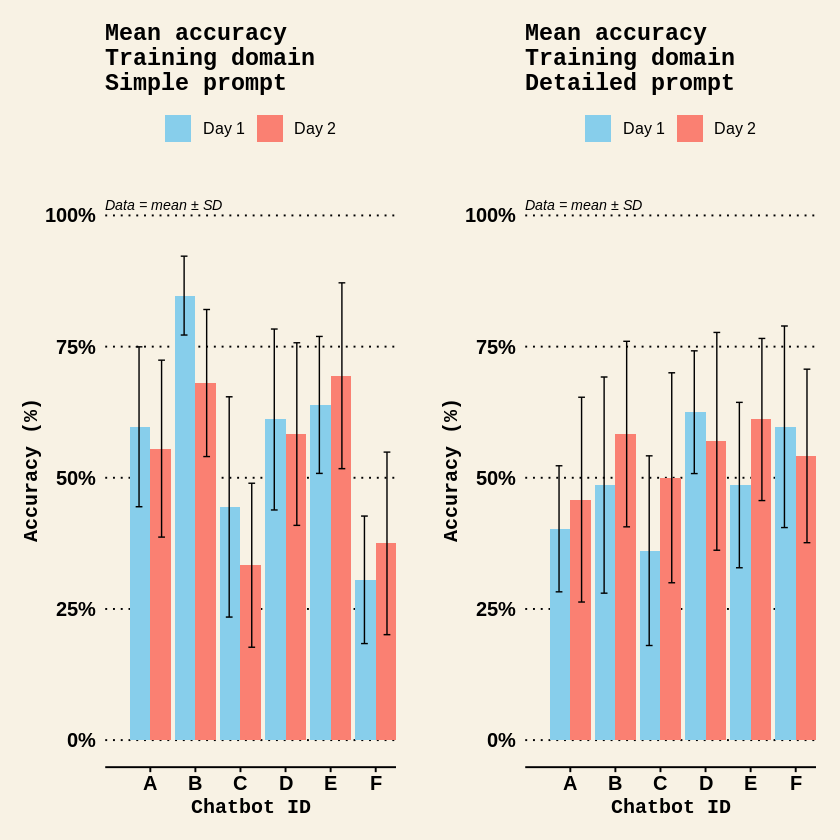

In [78]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleTraining_MeanAccuracy_PC <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Mean, SimplePrompt_Training_Accuracy_SD) %>%
  mutate(SimplePrompt_Training_Accuracy_Mean_Minus1 = SimplePrompt_Training_Accuracy_Mean - 1) %>%
  mutate(SimplePrompt_Training_Accuracy_Mean_PC = SimplePrompt_Training_Accuracy_Mean_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Training_Accuracy_SD_PC = SimplePrompt_Training_Accuracy_SD / maximalCriterionLikert_Minus1)

DetailedTraining_MeanAccuracy_PC <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Mean, DetailedPrompt_Training_Accuracy_SD) %>%
  mutate(DetailedPrompt_Training_Accuracy_Mean_Minus1 = DetailedPrompt_Training_Accuracy_Mean - 1) %>%
  mutate(DetailedPrompt_Training_Accuracy_Mean_PC = DetailedPrompt_Training_Accuracy_Mean_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Training_Accuracy_SD_PC = DetailedPrompt_Training_Accuracy_SD / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
MeanAccuracySimpleTrainingPC <- ggplot(SimpleTraining_MeanAccuracy_PC, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Mean_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_Mean_PC - SimplePrompt_Training_Accuracy_SD_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimplePrompt_Training_Accuracy_Mean_PC + SimplePrompt_Training_Accuracy_SD_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

MeanAccuracyDetailedTrainingPC <- ggplot(DetailedTraining_MeanAccuracy_PC, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Mean_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_Mean_PC - DetailedPrompt_Training_Accuracy_SD_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedPrompt_Training_Accuracy_Mean_PC + DetailedPrompt_Training_Accuracy_SD_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(MeanAccuracySimpleTrainingPC, MeanAccuracyDetailedTrainingPC, ncol = 2)

In [79]:
SimpleTraining_MeanAccuracy_PC

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_Mean,SimplePrompt_Training_Accuracy_SD,SimplePrompt_Training_Accuracy_Mean_Minus1,SimplePrompt_Training_Accuracy_Mean_PC,SimplePrompt_Training_Accuracy_SD_PC
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,3.388889,1.2190616,2.388889,0.5972222,0.3047654
ChatbotB,Test1,4.388889,0.6009252,3.388889,0.8472222,0.1502313
ChatbotC,Test1,2.777778,1.6791201,1.777778,0.4444444,0.4197800
ChatbotD,Test1,3.444444,1.3794121,2.444444,0.6111111,0.3448530
ChatbotE,Test1,3.555556,1.0441637,2.555556,0.6388889,0.2610409
ChatbotF,Test1,2.222222,0.9718253,1.222222,0.3055556,0.2429563
ChatbotA,Test2,3.222222,1.3488678,2.222222,0.5555556,0.3372170
ChatbotB,Test2,3.722222,1.1211353,2.722222,0.6805556,0.2802838
ChatbotC,Test2,2.333333,1.2500000,1.333333,0.3333333,0.3125000


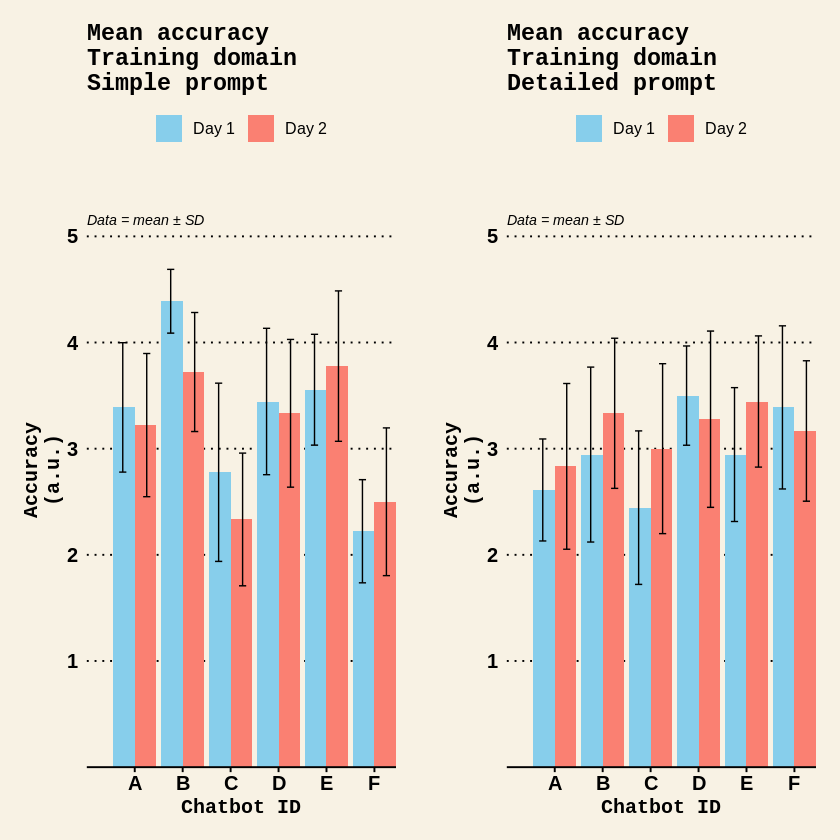

In [80]:
# Create the likert bar chart
MeanAccuracySimpleTraining <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Accuracy_Mean,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Accuracy_Mean - SimplePrompt_Training_Accuracy_SD / 2, # extend error bar downwards by half of the IQR
      ymax = SimplePrompt_Training_Accuracy_Mean + SimplePrompt_Training_Accuracy_SD / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(a.u.)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

MeanAccuracyDetailedTraining <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Accuracy_Mean,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Accuracy_Mean - DetailedPrompt_Training_Accuracy_SD / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedPrompt_Training_Accuracy_Mean + DetailedPrompt_Training_Accuracy_SD / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(a.u.)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(MeanAccuracySimpleTraining, MeanAccuracyDetailedTraining, ncol = 2)

#### Racing domain

In [81]:
# Add new columns to the Experiment1_Analysis dataframe that contains the mean and SD of the SimplePrompt_Racing_Accuracy and DetailedPrompt_Racing_Accuracy columns
# Identify the columns that match the pattern "SimplePrompt_Racing_Accuracy_.*_Median"
# NOTE: SimpleRacingMedian_cols already located in previous step:
# SimpleRacingMedian_cols <- grep("^SimplePrompt_Racing_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)
# Identify the columns that start with "DetailedPrompt_Racing_Accuracy_" and end with "_Median"
# NOTE: DetailedRacingMedian_cols already located in previous step:
# DetailedRacingMedian_cols <- grep("^DetailedPrompt_Racing_Accuracy_.*_Median$", names(Experiment1_Analysis), value = TRUE)

# Calculate the row-wise mean and standard deviation for the matching columns
# in Simple prompt
Experiment1_Analysis$SimplePrompt_Racing_Accuracy_Mean <- rowMeans(Experiment1_Analysis[, SimpleRacingMedian_cols], na.rm = TRUE)
Experiment1_Analysis$SimplePrompt_Racing_Accuracy_SD <- apply(Experiment1_Analysis[, SimpleRacingMedian_cols], 1, sd, na.rm = TRUE)
# and Detailed prompt
Experiment1_Analysis$DetailedPrompt_Racing_Accuracy_Mean <- rowMeans(Experiment1_Analysis[, DetailedRacingMedian_cols], na.rm = TRUE)
Experiment1_Analysis$DetailedPrompt_Racing_Accuracy_SD <- apply(Experiment1_Analysis[, DetailedRacingMedian_cols], 1, sd, na.rm = TRUE)

# view the dataframe to check that new mean & SD columns are inserted at the end of the df
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,SimplePrompt_Accuracy_combined,DetailedPrompt_Accuracy_combined,SimplePrompt_Training_Accuracy_Mean,SimplePrompt_Training_Accuracy_SD,DetailedPrompt_Training_Accuracy_Mean,DetailedPrompt_Training_Accuracy_SD,SimplePrompt_Racing_Accuracy_Mean,SimplePrompt_Racing_Accuracy_SD,DetailedPrompt_Racing_Accuracy_Mean,DetailedPrompt_Racing_Accuracy_SD
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,66.5,65.0,3.388889,1.2190616,2.611111,0.9610469,3.272727,1.472475,3.772727,1.211686
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,77.0,71.5,4.388889,0.6009252,2.944444,1.6478100,3.409091,1.670601,4.090909,1.640399
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,46.5,58.5,2.777778,1.6791201,2.444444,1.4457793,1.954545,1.386624,3.318182,1.900957
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,72.5,66.5,3.444444,1.3794121,3.500000,0.9354143,3.772727,1.329730,3.181818,2.088932
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,72.5,66.0,3.555556,1.0441637,2.944444,1.2610622,3.681818,1.167748,3.590909,1.578261
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,51.0,69.0,2.222222,0.9718253,3.388889,1.5365907,2.818182,1.537412,3.500000,1.987461
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,62.5,67.5,3.222222,1.3488678,2.833333,1.5612495,3.045455,1.331438,3.818182,1.383342
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,78.0,76.5,3.722222,1.1211353,3.333333,1.4142136,4.045455,1.150099,4.227273,1.211686
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,44.5,61.0,2.333333,1.2500000,3.000000,1.6007811,2.136364,1.598295,3.090909,2.022600


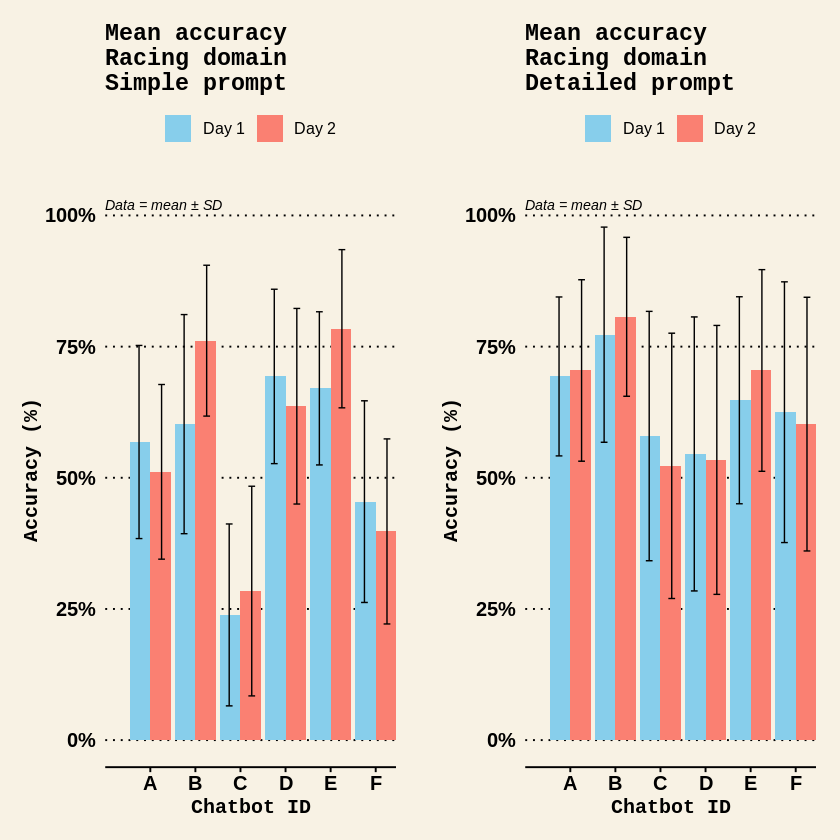

In [82]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleRacing_MeanAccuracy_PC <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_Mean, SimplePrompt_Racing_Accuracy_SD) %>%
  mutate(SimplePrompt_Racing_Accuracy_Mean_Minus1 = SimplePrompt_Racing_Accuracy_Mean - 1) %>%
  mutate(SimplePrompt_Racing_Accuracy_Mean_PC = SimplePrompt_Racing_Accuracy_Mean_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_Racing_Accuracy_SD_PC = SimplePrompt_Racing_Accuracy_SD / maximalCriterionLikert_Minus1)

DetailedRacing_MeanAccuracy_PC <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_Mean, DetailedPrompt_Racing_Accuracy_SD) %>%
  mutate(DetailedPrompt_Racing_Accuracy_Mean_Minus1 = DetailedPrompt_Racing_Accuracy_Mean - 1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_Mean_PC = DetailedPrompt_Racing_Accuracy_Mean_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_Racing_Accuracy_SD_PC = DetailedPrompt_Racing_Accuracy_SD / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
MeanAccuracySimpleRacingPC <- ggplot(SimpleRacing_MeanAccuracy_PC, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_Mean_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_Mean_PC - SimplePrompt_Racing_Accuracy_SD_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimplePrompt_Racing_Accuracy_Mean_PC + SimplePrompt_Racing_Accuracy_SD_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

MeanAccuracyDetailedRacingPC <- ggplot(DetailedRacing_MeanAccuracy_PC, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_Mean_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_Mean_PC - DetailedPrompt_Racing_Accuracy_SD_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedPrompt_Racing_Accuracy_Mean_PC + DetailedPrompt_Racing_Accuracy_SD_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(MeanAccuracySimpleRacingPC, MeanAccuracyDetailedRacingPC, ncol = 2)

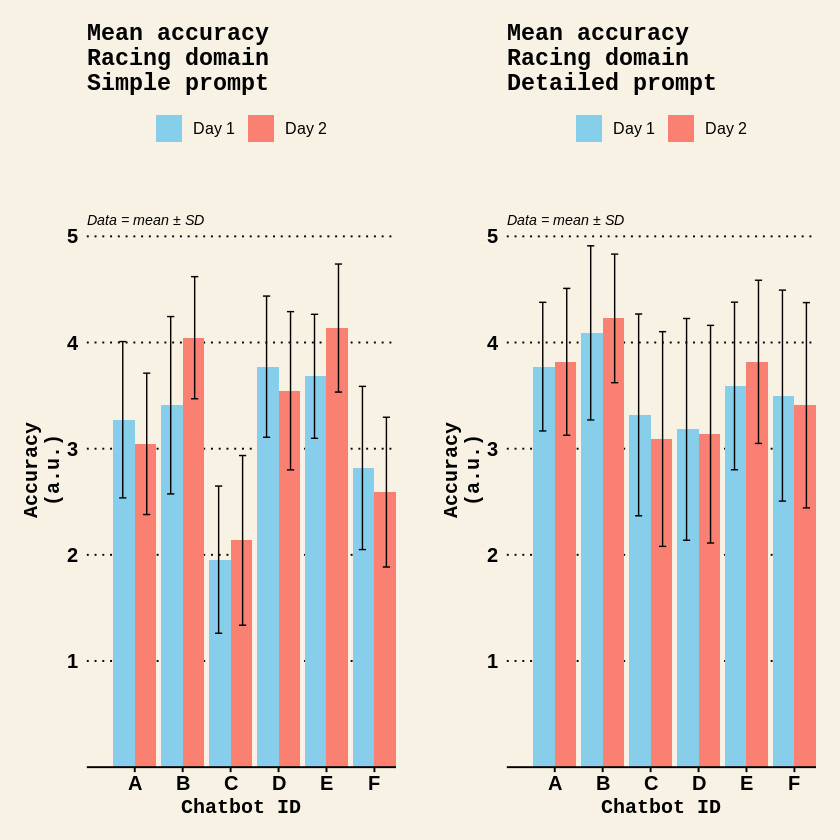

In [83]:
# Create the likert bar chart
MeanAccuracySimpleRacing <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Accuracy_Mean,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Accuracy_Mean - SimplePrompt_Racing_Accuracy_SD / 2, # extend error bar downwards by half of the IQR
      ymax = SimplePrompt_Racing_Accuracy_Mean + SimplePrompt_Racing_Accuracy_SD / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(a.u.)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

MeanAccuracyDetailedRacing <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Accuracy_Mean,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Accuracy_Mean - DetailedPrompt_Racing_Accuracy_SD / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedPrompt_Racing_Accuracy_Mean + DetailedPrompt_Racing_Accuracy_SD / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(a.u.)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(MeanAccuracySimpleRacing, MeanAccuracyDetailedRacing, ncol = 2)

#### Overall accuracy

In [84]:
# Add new columns to the Experiment1_Analysis dataframe that contains the mean and SD of the Training domain  and Racing domains combined
# Identify the columns that contain "SimplePrompt_", "_Accuracy_" and "_Median"
SimpleAccuracyMedian_cols <- grep("SimplePrompt_.*_Accuracy_.*_Median", names(Experiment1_Analysis), value = TRUE)
# Identify the columns that start with "DetailedPrompt_Racing_Accuracy_" and end with "_Median"
DetailedAccuracyMedian_cols <- grep("DetailedPrompt_.*_Accuracy_.*_Median", names(Experiment1_Analysis), value = TRUE)

# Calculate the row-wise mean and standard deviation for the matching columns
# in Simple prompt
Experiment1_Analysis$SimplePrompt_OverallAccuracy_Mean <- rowMeans(Experiment1_Analysis[, SimpleAccuracyMedian_cols], na.rm = TRUE)
Experiment1_Analysis$SimplePrompt_OverallAccuracy_SD <- apply(Experiment1_Analysis[, SimpleAccuracyMedian_cols], 1, sd, na.rm = TRUE)
# and Detailed prompt
Experiment1_Analysis$DetailedPrompt_OverallAccuracy_Mean <- rowMeans(Experiment1_Analysis[, DetailedAccuracyMedian_cols], na.rm = TRUE)
Experiment1_Analysis$DetailedPrompt_OverallAccuracy_SD <- apply(Experiment1_Analysis[, DetailedAccuracyMedian_cols], 1, sd, na.rm = TRUE)

# view the dataframe to check that new overall mean and SD columns are inserted at the end of the df
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Training_Accuracy_Mean,DetailedPrompt_Training_Accuracy_SD,SimplePrompt_Racing_Accuracy_Mean,SimplePrompt_Racing_Accuracy_SD,DetailedPrompt_Racing_Accuracy_Mean,DetailedPrompt_Racing_Accuracy_SD,SimplePrompt_OverallAccuracy_Mean,SimplePrompt_OverallAccuracy_SD,DetailedPrompt_OverallAccuracy_Mean,DetailedPrompt_OverallAccuracy_SD
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,2.611111,0.9610469,3.272727,1.472475,3.772727,1.211686,3.325,1.330562,3.250,1.230105
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,2.944444,1.6478100,3.409091,1.670601,4.090909,1.640399,3.850,1.367864,3.575,1.703518
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,2.444444,1.4457793,1.954545,1.386624,3.318182,1.900957,2.325,1.541317,2.925,1.726534
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,3.500000,0.9354143,3.772727,1.329730,3.181818,2.088932,3.625,1.326600,3.325,1.640563
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,2.944444,1.2610622,3.681818,1.167748,3.590909,1.578261,3.625,1.086702,3.300,1.445501
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,3.388889,1.5365907,2.818182,1.537412,3.500000,1.987461,2.550,1.316894,3.450,1.753943
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,2.833333,1.5612495,3.045455,1.331438,3.818182,1.383342,3.125,1.306613,3.375,1.512013
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,3.333333,1.4142136,4.045455,1.150099,4.227273,1.211686,3.900,1.119210,3.825,1.350195
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,3.000000,1.6007811,2.136364,1.598295,3.090909,2.022600,2.225,1.418626,3.050,1.798391


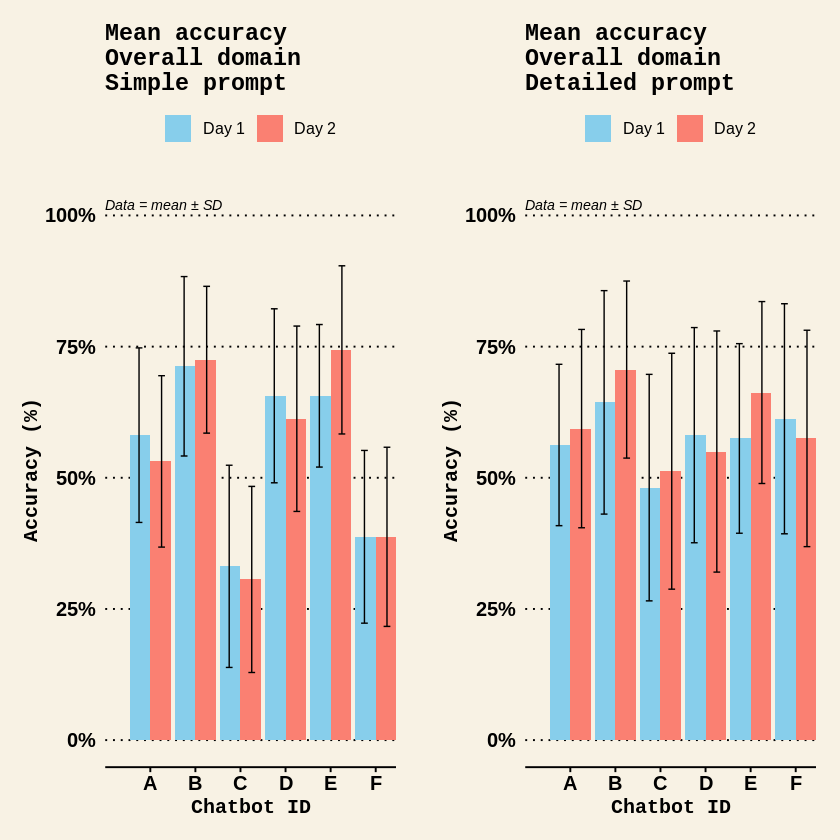

In [85]:
# Prepare the data
# Assign the maximalCriterionLikert score. Note: the maximal Likert score for each criterion is 5; therefore, each criterion-specific Accuracy is a continuous value between 0 to 1.
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert = 5

# Create percentage data for plots by combining the data for both Test1 and Test2 into a single dataframe and calculating the percentage as the likert value divided by the maximal likert value
# IMPORTANT: For accuracy scores, a Likert value of 1 = 0% accuracy and 5 = 100% accuracy; therefore, when calculating percentage accuracy need to subtract 1 from the Likert score and the maximalCriterionLikert value so that a Likert of 1 produces 0% (0 divided by 4) rather than 20% (1 divided 5).
# maximalCriterionLikert already created in previous step
# maximalCriterionLikert_Minus1 = maximalCriterionLikert - 1

SimpleOverall_MeanAccuracy_PC <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, SimplePrompt_OverallAccuracy_Mean, SimplePrompt_OverallAccuracy_SD) %>%
  mutate(SimplePrompt_OverallAccuracy_Mean_Minus1 = SimplePrompt_OverallAccuracy_Mean - 1) %>%
  mutate(SimplePrompt_OverallAccuracy_Mean_PC = SimplePrompt_OverallAccuracy_Mean_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(SimplePrompt_OverallAccuracy_SD_PC = SimplePrompt_OverallAccuracy_SD / maximalCriterionLikert_Minus1)

DetailedOverall_MeanAccuracy_PC <- Experiment1_Analysis %>%
  filter(TestDay %in% c("Test1", "Test2")) %>%
  select(ChatbotID, TestDay, DetailedPrompt_OverallAccuracy_Mean, DetailedPrompt_OverallAccuracy_SD) %>%
  mutate(DetailedPrompt_OverallAccuracy_Mean_Minus1 = DetailedPrompt_OverallAccuracy_Mean - 1) %>%
  mutate(DetailedPrompt_OverallAccuracy_Mean_PC = DetailedPrompt_OverallAccuracy_Mean_Minus1 / maximalCriterionLikert_Minus1) %>%
  mutate(DetailedPrompt_OverallAccuracy_SD_PC = DetailedPrompt_OverallAccuracy_SD / maximalCriterionLikert_Minus1)

# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the percentage plots
MeanAccuracySimpleOverallPC <- ggplot(SimpleOverall_MeanAccuracy_PC, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_OverallAccuracy_Mean_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_OverallAccuracy_Mean_PC - SimplePrompt_OverallAccuracy_SD_PC / 2, # extend error bar downwards by half of the IQR
      ymax = SimplePrompt_OverallAccuracy_Mean_PC + SimplePrompt_OverallAccuracy_SD_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nOverall domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

MeanAccuracyDetailedOverallPC <- ggplot(DetailedOverall_MeanAccuracy_PC, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_OverallAccuracy_Mean_PC,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_OverallAccuracy_Mean_PC - DetailedPrompt_OverallAccuracy_SD_PC / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedPrompt_OverallAccuracy_Mean_PC + DetailedPrompt_OverallAccuracy_SD_PC / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Mean accuracy\nOverall domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy (%)"
  ) +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(MeanAccuracySimpleOverallPC, MeanAccuracyDetailedOverallPC, ncol = 2)

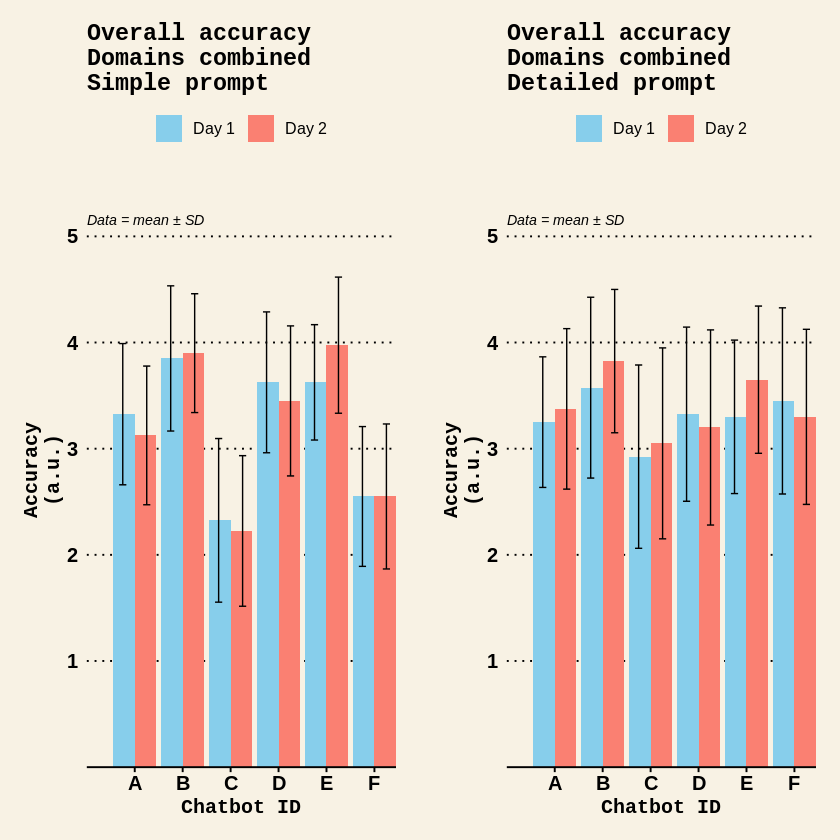

In [86]:
# Create the Likert bar chart
MeanAccuracySimpleOverall <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_OverallAccuracy_Mean,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_OverallAccuracy_Mean - SimplePrompt_OverallAccuracy_SD / 2, # extend error bar downwards by half of the IQR
      ymax = SimplePrompt_OverallAccuracy_Mean + SimplePrompt_OverallAccuracy_SD / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Overall accuracy\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(a.u.)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

MeanAccuracyDetailedOverall <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_OverallAccuracy_Mean,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_OverallAccuracy_Mean - DetailedPrompt_OverallAccuracy_SD / 2, # extend error bar downwards by half of the IQR
      ymax = DetailedPrompt_OverallAccuracy_Mean + DetailedPrompt_OverallAccuracy_SD / 2 # extend error bar upwards by half of the IQR
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Overall accuracy\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Accuracy\n(a.u.)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(MeanAccuracySimpleOverall, MeanAccuracyDetailedOverall, ncol = 2)

## Calculate completeness scores

In [87]:
# Extract column names containing the word "Completeness"
completeness_columns <- grep("Completeness", names(Experiment1_Analysis), value = TRUE)

# Print the result
print(completeness_columns)

[1] "SimplePrompt_Training_Completeness_Median"  
[2] "SimplePrompt_Racing_Completeness_Median"    
[3] "DetailedPrompt_Training_Completeness_Median"
[4] "DetailedPrompt_Racing_Completeness_Median"  
[5] "SimplePrompt_Training_Completeness_IQR"     
[6] "SimplePrompt_Racing_Completeness_IQR"       
[7] "DetailedPrompt_Training_Completeness_IQR"   
[8] "DetailedPrompt_Racing_Completeness_IQR"     


### Training domain

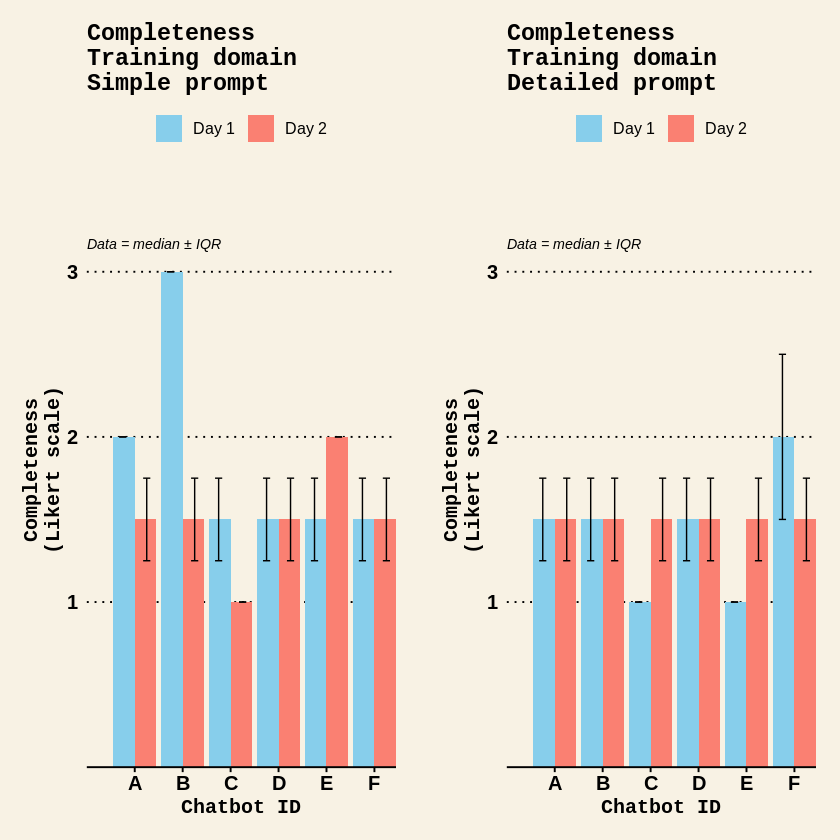

In [88]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
CompletenessSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Completeness_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Completeness_Median - SimplePrompt_Training_Completeness_IQR / 2,
      ymax = SimplePrompt_Training_Completeness_Median + SimplePrompt_Training_Completeness_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Completeness\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Completeness\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CompletenessDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Completeness_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Completeness_Median - DetailedPrompt_Training_Completeness_IQR / 2,
      ymax = DetailedPrompt_Training_Completeness_Median + DetailedPrompt_Training_Completeness_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Completeness\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Completeness\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CompletenessSimpleTrainingLikert, CompletenessDetailedTrainingLikert, ncol = 2)

### Racing domain

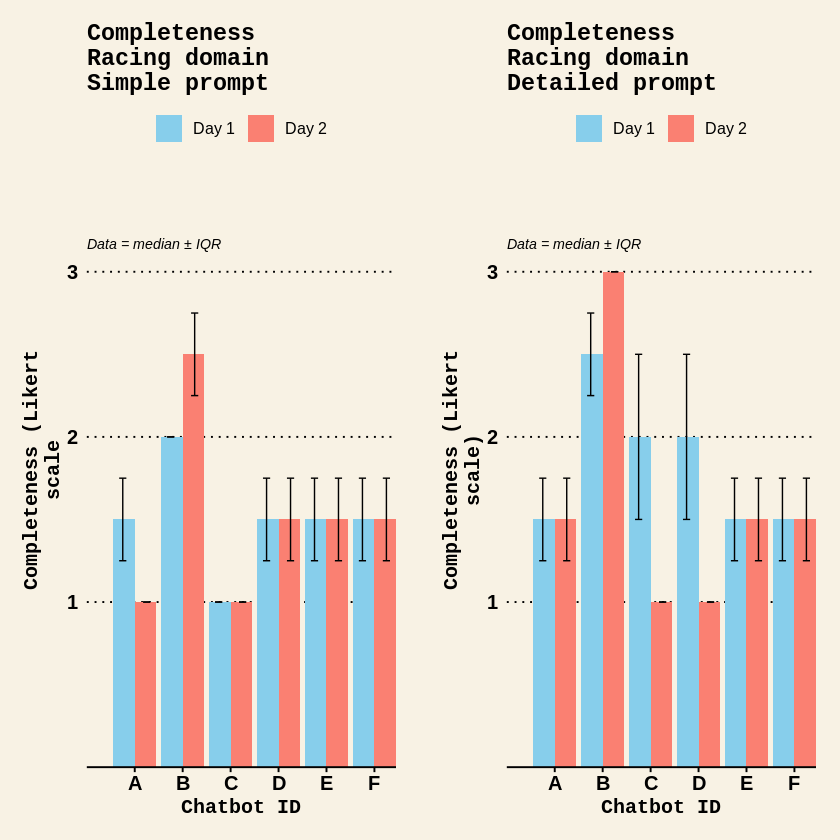

In [89]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
CompletenessSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Completeness_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Completeness_Median - SimplePrompt_Racing_Completeness_IQR / 2,
      ymax = SimplePrompt_Racing_Completeness_Median + SimplePrompt_Racing_Completeness_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Completeness\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Completeness (Likert\nscale"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CompletenessDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Completeness_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Completeness_Median - DetailedPrompt_Racing_Completeness_IQR / 2,
      ymax = DetailedPrompt_Racing_Completeness_Median + DetailedPrompt_Racing_Completeness_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Completeness\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Completeness (Likert\nscale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CompletenessSimpleRacingLikert, CompletenessDetailedRacingLikert, ncol = 2)

### Overall completeness

In [90]:
# Add 4 new columns to the Experiment1_Analysis dataframe.
# SimplePrompt_Completeness_combined is the sum of SimplePrompt_Training_Completeness_Median and SimplePrompt_Racing_Completeness_Median
Experiment1_Analysis$SimplePrompt_Completeness_combined <- Experiment1_Analysis$SimplePrompt_Training_Completeness_Median + Experiment1_Analysis$SimplePrompt_Racing_Completeness_Median
# SimplePrompt_Completeness_combinedIQR is the sum of SimplePrompt_Training_Completeness_IQR and SimplePrompt_Racing_Completeness_IQR
Experiment1_Analysis$SimplePrompt_Completeness_combinedIQR <- Experiment1_Analysis$SimplePrompt_Training_Completeness_IQR + Experiment1_Analysis$SimplePrompt_Racing_Completeness_IQR
# DetailedPrompt_Completeness_combined is the sum of DetailedPrompt_Training_Completeness_Median and DetailedPrompt_Racing_Completeness_Median
Experiment1_Analysis$DetailedPrompt_Completeness_combined <- Experiment1_Analysis$DetailedPrompt_Training_Completeness_Median + Experiment1_Analysis$DetailedPrompt_Racing_Completeness_Median
# DetailedPrompt_Completeness_combinedIQR is the sum of DetailedPrompt_Training_Completeness_IQR and DetailedPrompt_Racing_Completeness_IQR
Experiment1_Analysis$DetailedPrompt_Completeness_combinedIQR <- Experiment1_Analysis$DetailedPrompt_Training_Completeness_IQR + Experiment1_Analysis$DetailedPrompt_Racing_Completeness_IQR

# view the dataframe to check that new columns are inserted correctly
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Racing_Accuracy_Mean,DetailedPrompt_Racing_Accuracy_SD,SimplePrompt_OverallAccuracy_Mean,SimplePrompt_OverallAccuracy_SD,DetailedPrompt_OverallAccuracy_Mean,DetailedPrompt_OverallAccuracy_SD,SimplePrompt_Completeness_combined,SimplePrompt_Completeness_combinedIQR,DetailedPrompt_Completeness_combined,DetailedPrompt_Completeness_combinedIQR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,3.772727,1.211686,3.325,1.330562,3.250,1.230105,3.5,0.5,3.0,1.0
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,4.090909,1.640399,3.850,1.367864,3.575,1.703518,5.0,0.0,4.0,1.0
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,3.318182,1.900957,2.325,1.541317,2.925,1.726534,2.5,0.5,3.0,1.0
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,3.181818,2.088932,3.625,1.326600,3.325,1.640563,3.0,1.0,3.5,1.5
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,3.590909,1.578261,3.625,1.086702,3.300,1.445501,3.0,1.0,2.5,0.5
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,3.500000,1.987461,2.550,1.316894,3.450,1.753943,3.0,1.0,3.5,1.5
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,3.818182,1.383342,3.125,1.306613,3.375,1.512013,2.5,0.5,3.0,1.0
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,4.227273,1.211686,3.900,1.119210,3.825,1.350195,4.0,1.0,4.5,0.5
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,3.090909,2.022600,2.225,1.418626,3.050,1.798391,2.0,0.0,2.5,0.5


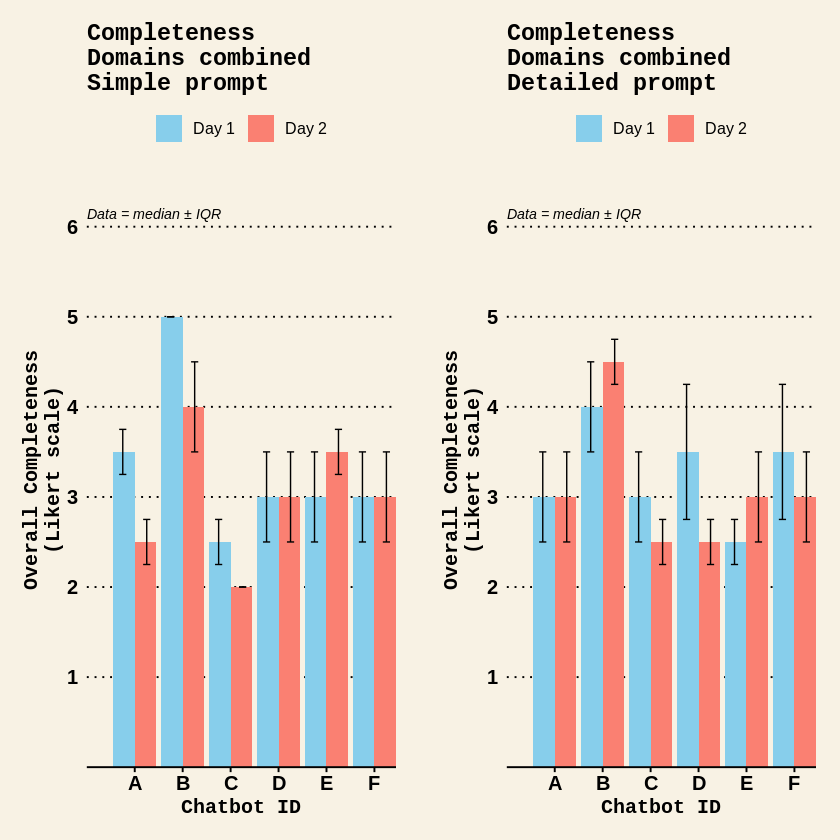

In [91]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
CompletenessSimpleCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Completeness_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Completeness_combined - SimplePrompt_Completeness_combinedIQR / 2,
      ymax = SimplePrompt_Completeness_combined + SimplePrompt_Completeness_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Completeness\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Overall Completeness\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

CompletenessDetailedCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Completeness_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Completeness_combined - DetailedPrompt_Completeness_combinedIQR / 2,
      ymax = DetailedPrompt_Completeness_combined + DetailedPrompt_Completeness_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Completeness\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Overall Completeness\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(CompletenessSimpleCombinedLikert, CompletenessDetailedCombinedLikert, ncol = 2)

## Calculate clarity scores

In [92]:
# Extract column names containing the word "Clarity"
clarity_columns <- grep("Clarity", names(Experiment1_Analysis), value = TRUE)

# Print the result
print(clarity_columns)

[1] "SimplePrompt_Training_Clarity_Median"  
[2] "SimplePrompt_Racing_Clarity_Median"    
[3] "DetailedPrompt_Training_Clarity_Median"
[4] "DetailedPrompt_Racing_Clarity_Median"  
[5] "SimplePrompt_Training_Clarity_IQR"     
[6] "SimplePrompt_Racing_Clarity_IQR"       
[7] "DetailedPrompt_Training_Clarity_IQR"   
[8] "DetailedPrompt_Racing_Clarity_IQR"     


### Training domain

Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


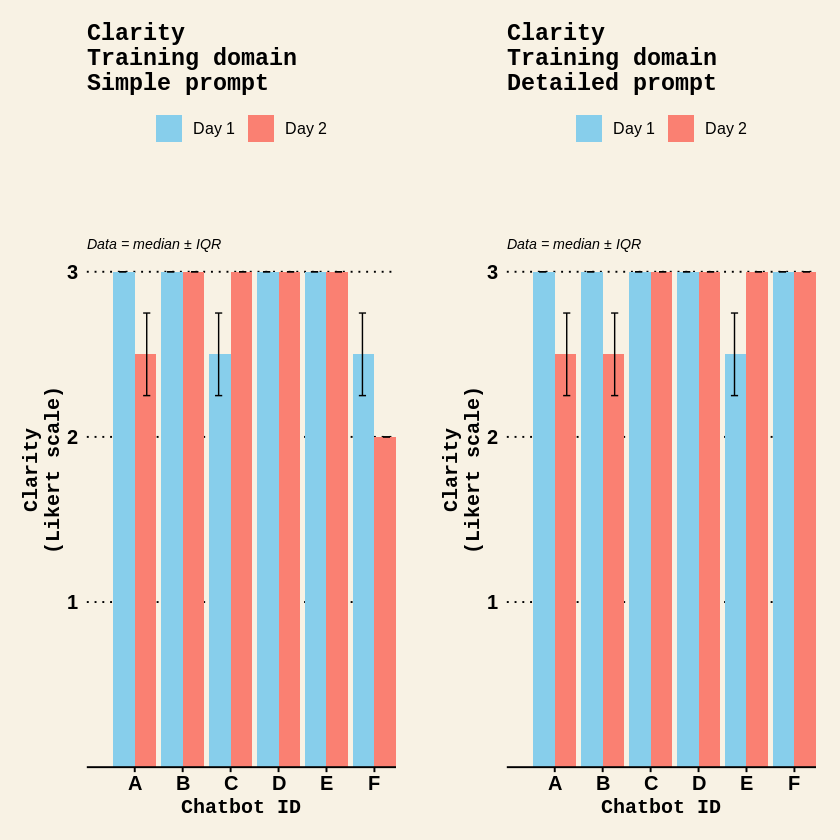

In [93]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
ClaritySimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Clarity_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Clarity_Median - SimplePrompt_Training_Clarity_IQR / 2,
      ymax = SimplePrompt_Training_Clarity_Median + SimplePrompt_Training_Clarity_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Clarity\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Clarity\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

ClarityDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Clarity_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Clarity_Median - DetailedPrompt_Training_Clarity_IQR / 2,
      ymax = DetailedPrompt_Training_Clarity_Median + DetailedPrompt_Training_Clarity_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Clarity\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Clarity\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(ClaritySimpleTrainingLikert, ClarityDetailedTrainingLikert, ncol = 2)

### Racing domain

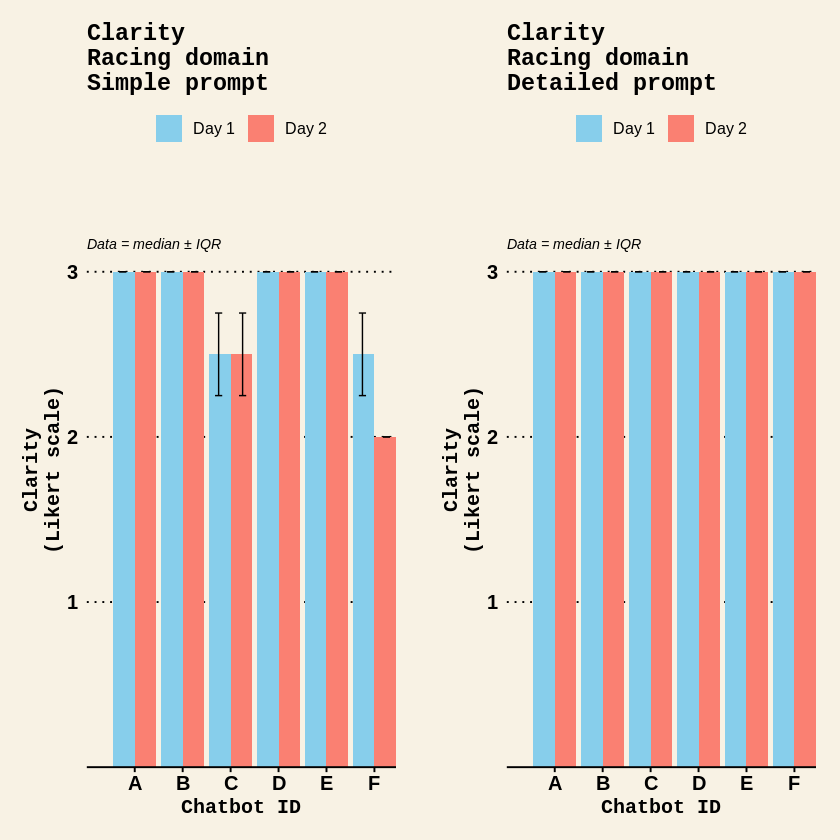

In [94]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
ClaritySimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Clarity_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Clarity_Median - SimplePrompt_Racing_Clarity_IQR / 2,
      ymax = SimplePrompt_Racing_Clarity_Median + SimplePrompt_Racing_Clarity_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Clarity\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Clarity\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

ClarityDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Clarity_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Clarity_Median - DetailedPrompt_Racing_Clarity_IQR / 2,
      ymax = DetailedPrompt_Racing_Clarity_Median + DetailedPrompt_Racing_Clarity_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Clarity\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Clarity\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(ClaritySimpleRacingLikert, ClarityDetailedRacingLikert, ncol = 2)

### Overall clarity

In [95]:
# Add 4 new columns to the Experiment1_Analysis dataframe.
# SimplePrompt_Clarity_combined is the sum of SimplePrompt_Training_Clarity_Median and SimplePrompt_Racing_Clarity_Median
Experiment1_Analysis$SimplePrompt_Clarity_combined <- Experiment1_Analysis$SimplePrompt_Training_Clarity_Median + Experiment1_Analysis$SimplePrompt_Racing_Clarity_Median
# SimplePrompt_Clarity_combinedIQR is the sum of SimplePrompt_Training_Clarity_IQR and SimplePrompt_Racing_Clarity_IQR
Experiment1_Analysis$SimplePrompt_Clarity_combinedIQR <- Experiment1_Analysis$SimplePrompt_Training_Clarity_IQR + Experiment1_Analysis$SimplePrompt_Racing_Clarity_IQR
# DetailedPrompt_Clarity_combined is the sum of DetailedPrompt_Training_Clarity_Median and DetailedPrompt_Racing_Clarity_Median
Experiment1_Analysis$DetailedPrompt_Clarity_combined <- Experiment1_Analysis$DetailedPrompt_Training_Clarity_Median + Experiment1_Analysis$DetailedPrompt_Racing_Clarity_Median
# DetailedPrompt_Clarity_combinedIQR is the sum of DetailedPrompt_Training_Clarity_IQR and DetailedPrompt_Racing_Clarity_IQR
Experiment1_Analysis$DetailedPrompt_Clarity_combinedIQR <- Experiment1_Analysis$DetailedPrompt_Training_Clarity_IQR + Experiment1_Analysis$DetailedPrompt_Racing_Clarity_IQR

# view the dataframe to check that new columns are inserted correctly
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_OverallAccuracy_Mean,DetailedPrompt_OverallAccuracy_SD,SimplePrompt_Completeness_combined,SimplePrompt_Completeness_combinedIQR,DetailedPrompt_Completeness_combined,DetailedPrompt_Completeness_combinedIQR,SimplePrompt_Clarity_combined,SimplePrompt_Clarity_combinedIQR,DetailedPrompt_Clarity_combined,DetailedPrompt_Clarity_combinedIQR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,3.250,1.230105,3.5,0.5,3.0,1.0,6.0,0.0,6.0,0.0
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,3.575,1.703518,5.0,0.0,4.0,1.0,6.0,0.0,6.0,0.0
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,2.925,1.726534,2.5,0.5,3.0,1.0,5.0,1.0,6.0,0.0
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,3.325,1.640563,3.0,1.0,3.5,1.5,6.0,0.0,6.0,0.0
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,3.300,1.445501,3.0,1.0,2.5,0.5,6.0,0.0,5.5,0.5
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,3.450,1.753943,3.0,1.0,3.5,1.5,5.0,1.0,6.0,0.0
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,3.375,1.512013,2.5,0.5,3.0,1.0,5.5,0.5,5.5,0.5
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,3.825,1.350195,4.0,1.0,4.5,0.5,6.0,0.0,5.5,0.5
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,3.050,1.798391,2.0,0.0,2.5,0.5,5.5,0.5,6.0,0.0


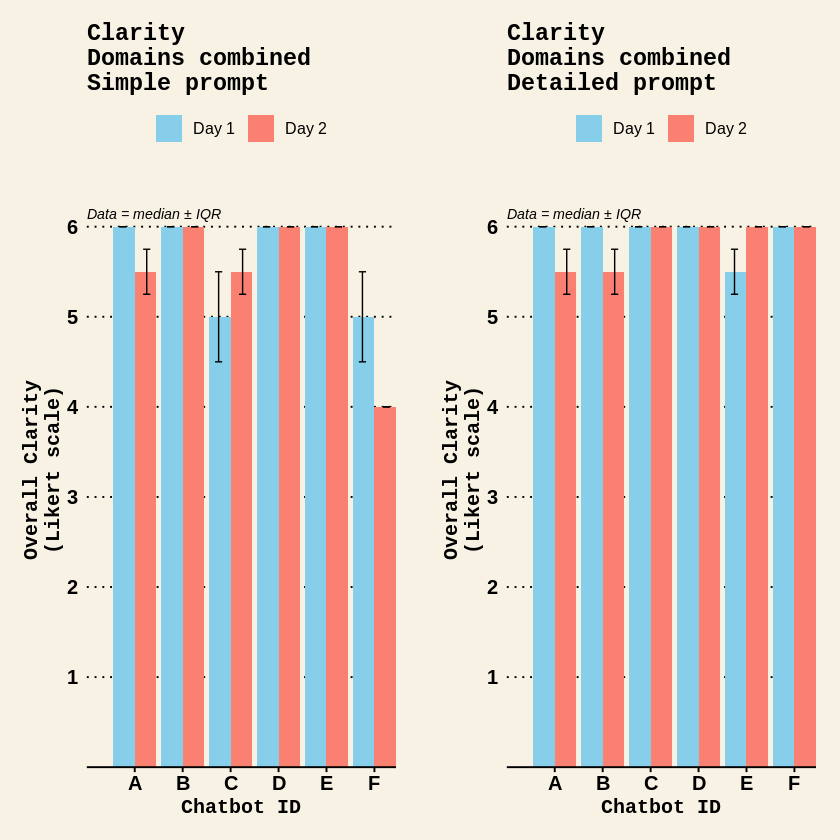

In [96]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
ClaritySimpleCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Clarity_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Clarity_combined - SimplePrompt_Clarity_combinedIQR / 2,
      ymax = SimplePrompt_Clarity_combined + SimplePrompt_Clarity_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Clarity\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Overall Clarity\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

ClarityDetailedCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Clarity_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Clarity_combined - DetailedPrompt_Clarity_combinedIQR / 2,
      ymax = DetailedPrompt_Clarity_combined + DetailedPrompt_Clarity_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Clarity\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Overall Clarity\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(ClaritySimpleCombinedLikert, ClarityDetailedCombinedLikert, ncol = 2)

## Calculate quality of cited evidence scores

In [97]:
# Extract column names containing the word "Evidence"
evidence_columns <- grep("Evidence", names(Experiment1_Analysis), value = TRUE)

# Print the result
print(evidence_columns)

[1] "SimplePrompt_Training_Evidence_Median"  
[2] "SimplePrompt_Racing_Evidence_Median"    
[3] "DetailedPrompt_Training_Evidence_Median"
[4] "DetailedPrompt_Racing_Evidence_Median"  
[5] "SimplePrompt_Training_Evidence_IQR"     
[6] "SimplePrompt_Racing_Evidence_IQR"       
[7] "DetailedPrompt_Training_Evidence_IQR"   
[8] "DetailedPrompt_Racing_Evidence_IQR"     


### Training domain

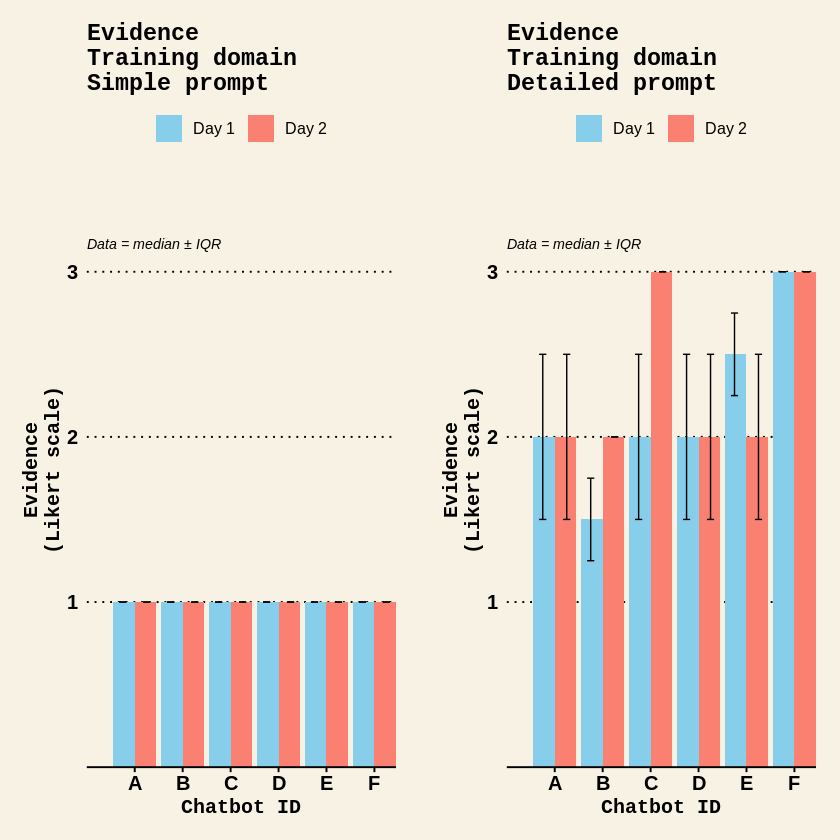

In [98]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
EvidenceSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_Evidence_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_Evidence_Median - SimplePrompt_Training_Evidence_IQR / 2,
      ymax = SimplePrompt_Training_Evidence_Median + SimplePrompt_Training_Evidence_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Evidence\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Evidence\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

EvidenceDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_Evidence_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_Evidence_Median - DetailedPrompt_Training_Evidence_IQR / 2,
      ymax = DetailedPrompt_Training_Evidence_Median + DetailedPrompt_Training_Evidence_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Evidence\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Evidence\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(EvidenceSimpleTrainingLikert, EvidenceDetailedTrainingLikert, ncol = 2)

### Racing domain

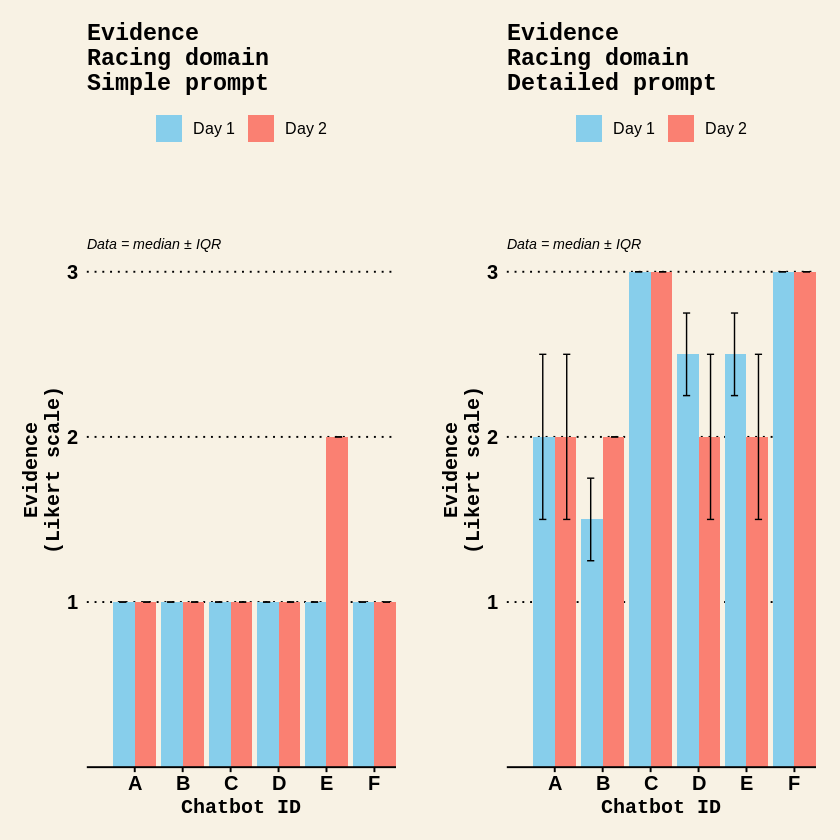

In [99]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
EvidenceSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_Evidence_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_Evidence_Median - SimplePrompt_Racing_Evidence_IQR / 2,
      ymax = SimplePrompt_Racing_Evidence_Median + SimplePrompt_Racing_Evidence_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Evidence\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "Evidence\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

EvidenceDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_Evidence_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_Evidence_Median - DetailedPrompt_Racing_Evidence_IQR / 2,
      ymax = DetailedPrompt_Racing_Evidence_Median + DetailedPrompt_Racing_Evidence_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Evidence\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "Evidence\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 3.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(EvidenceSimpleRacingLikert, EvidenceDetailedRacingLikert, ncol = 2)

### Overall evidence

In [100]:
# Add 4 new columns to the Experiment1_Analysis dataframe.
# SimplePrompt_Evidence_combined is the sum of SimplePrompt_Training_Evidence_Median and SimplePrompt_Racing_Evidence_Median
Experiment1_Analysis$SimplePrompt_Evidence_combined <- Experiment1_Analysis$SimplePrompt_Training_Evidence_Median + Experiment1_Analysis$SimplePrompt_Racing_Evidence_Median
# SimplePrompt_Evidence_combinedIQR is the sum of SimplePrompt_Training_Evidence_IQR and SimplePrompt_Racing_Evidence_IQR
Experiment1_Analysis$SimplePrompt_Evidence_combinedIQR <- Experiment1_Analysis$SimplePrompt_Training_Evidence_IQR + Experiment1_Analysis$SimplePrompt_Racing_Evidence_IQR
# DetailedPrompt_Evidence_combined is the sum of DetailedPrompt_Training_Evidence_Median and DetailedPrompt_Racing_Evidence_Median
Experiment1_Analysis$DetailedPrompt_Evidence_combined <- Experiment1_Analysis$DetailedPrompt_Training_Evidence_Median + Experiment1_Analysis$DetailedPrompt_Racing_Evidence_Median
# DetailedPrompt_Evidence_combinedIQR is the sum of DetailedPrompt_Training_Evidence_IQR and DetailedPrompt_Racing_Evidence_IQR
Experiment1_Analysis$DetailedPrompt_Evidence_combinedIQR <- Experiment1_Analysis$DetailedPrompt_Training_Evidence_IQR + Experiment1_Analysis$DetailedPrompt_Racing_Evidence_IQR

# view the dataframe to check that new columns are inserted correctly
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Completeness_combined,DetailedPrompt_Completeness_combinedIQR,SimplePrompt_Clarity_combined,SimplePrompt_Clarity_combinedIQR,DetailedPrompt_Clarity_combined,DetailedPrompt_Clarity_combinedIQR,SimplePrompt_Evidence_combined,SimplePrompt_Evidence_combinedIQR,DetailedPrompt_Evidence_combined,DetailedPrompt_Evidence_combinedIQR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,3.0,1.0,6.0,0.0,6.0,0.0,2,0,4.0,2.0
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,4.0,1.0,6.0,0.0,6.0,0.0,2,0,3.0,1.0
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,3.0,1.0,5.0,1.0,6.0,0.0,2,0,5.0,1.0
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,3.5,1.5,6.0,0.0,6.0,0.0,2,0,4.5,1.5
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,2.5,0.5,6.0,0.0,5.5,0.5,2,0,5.0,1.0
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,3.5,1.5,5.0,1.0,6.0,0.0,2,0,6.0,0.0
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,3.0,1.0,5.5,0.5,5.5,0.5,2,0,4.0,2.0
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,4.5,0.5,6.0,0.0,5.5,0.5,2,0,4.0,0.0
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,2.5,0.5,5.5,0.5,6.0,0.0,2,0,6.0,0.0


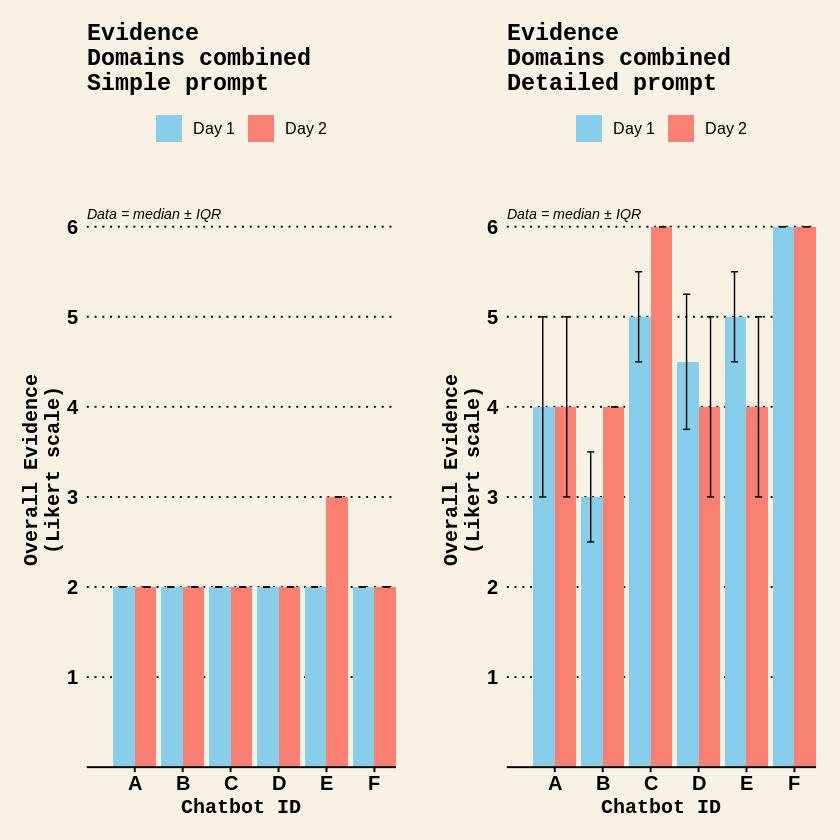

In [101]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
EvidenceSimpleCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Evidence_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Evidence_combined - SimplePrompt_Evidence_combinedIQR / 2,
      ymax = SimplePrompt_Evidence_combined + SimplePrompt_Evidence_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Evidence\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Overall Evidence\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

EvidenceDetailedCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Evidence_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Evidence_combined - DetailedPrompt_Evidence_combinedIQR / 2,
      ymax = DetailedPrompt_Evidence_combined + DetailedPrompt_Evidence_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "Evidence\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Overall Evidence\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(EvidenceSimpleCombinedLikert, EvidenceDetailedCombinedLikert, ncol = 2)

## Calculate additional info quality scores

In [102]:
# Extract column names containing the word "ExtraInfo"
extrainfo_columns <- grep("ExtraInfo", names(Experiment1_Analysis), value = TRUE)

# Print the result
print(extrainfo_columns)

[1] "SimplePrompt_Training_ExtraInfo_Median"  
[2] "SimplePrompt_Racing_ExtraInfo_Median"    
[3] "DetailedPrompt_Training_ExtraInfo_Median"
[4] "DetailedPrompt_Racing_ExtraInfo_Median"  
[5] "SimplePrompt_Training_ExtraInfo_IQR"     
[6] "SimplePrompt_Racing_ExtraInfo_IQR"       
[7] "DetailedPrompt_Training_ExtraInfo_IQR"   
[8] "DetailedPrompt_Racing_ExtraInfo_IQR"     


### Training domain

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”


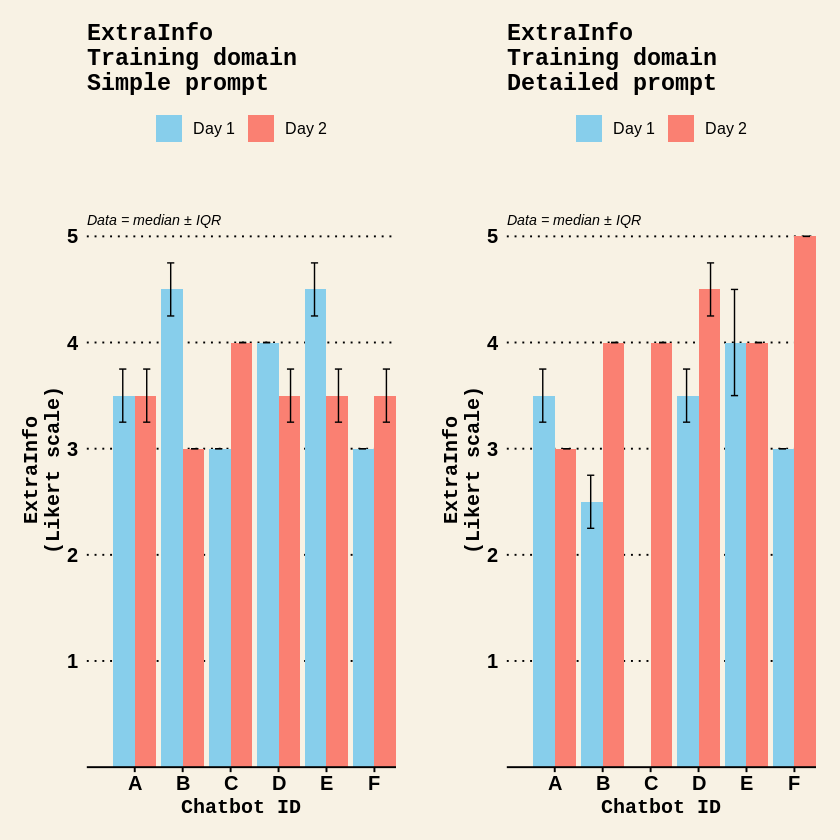

In [103]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
ExtraInfoSimpleTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Training_ExtraInfo_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Training_ExtraInfo_Median - SimplePrompt_Training_ExtraInfo_IQR / 2,
      ymax = SimplePrompt_Training_ExtraInfo_Median + SimplePrompt_Training_ExtraInfo_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "ExtraInfo\nTraining domain\nSimple prompt",
    x = "Chatbot ID",
    y = "ExtraInfo\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

ExtraInfoDetailedTrainingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Training_ExtraInfo_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Training_ExtraInfo_Median - DetailedPrompt_Training_ExtraInfo_IQR / 2,
      ymax = DetailedPrompt_Training_ExtraInfo_Median + DetailedPrompt_Training_ExtraInfo_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "ExtraInfo\nTraining domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "ExtraInfo\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(ExtraInfoSimpleTrainingLikert, ExtraInfoDetailedTrainingLikert, ncol = 2)

### Racing domain

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_col()`).”


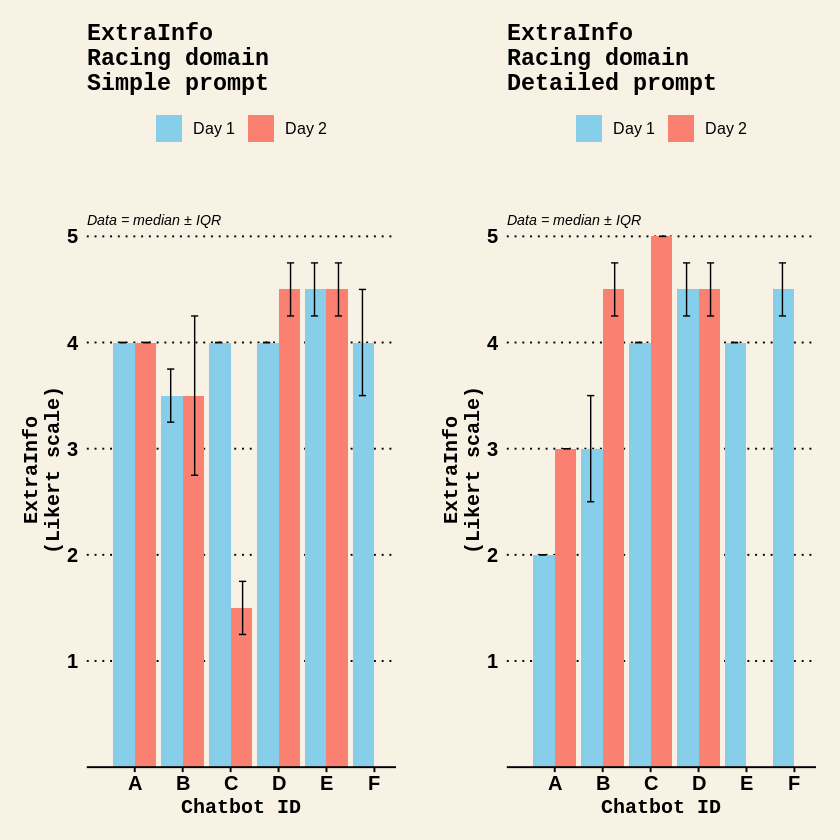

In [104]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
ExtraInfoSimpleRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_Racing_ExtraInfo_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_Racing_ExtraInfo_Median - SimplePrompt_Racing_ExtraInfo_IQR / 2,
      ymax = SimplePrompt_Racing_ExtraInfo_Median + SimplePrompt_Racing_ExtraInfo_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "ExtraInfo\nRacing domain\nSimple prompt",
    x = "Chatbot ID",
    y = "ExtraInfo\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

ExtraInfoDetailedRacingLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_Racing_ExtraInfo_Median,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_Racing_ExtraInfo_Median - DetailedPrompt_Racing_ExtraInfo_IQR / 2,
      ymax = DetailedPrompt_Racing_ExtraInfo_Median + DetailedPrompt_Racing_ExtraInfo_IQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "ExtraInfo\nRacing domain\nDetailed prompt",
    x = "Chatbot ID",
    y = "ExtraInfo\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 5.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(ExtraInfoSimpleRacingLikert, ExtraInfoDetailedRacingLikert, ncol = 2)

NOTE: The missing values for extra info are because there was no extra info provided by those chatbots on those days.

### Overall extra info

In [105]:
# Add 4 new columns to the Experiment1_Analysis dataframe.
# SimplePrompt_ExtraInfo_combined is the sum of SimplePrompt_Training_ExtraInfo_Median and SimplePrompt_Racing_ExtraInfo_Median
Experiment1_Analysis$SimplePrompt_ExtraInfo_combined <- Experiment1_Analysis$SimplePrompt_Training_ExtraInfo_Median + Experiment1_Analysis$SimplePrompt_Racing_ExtraInfo_Median
# SimplePrompt_ExtraInfo_combinedIQR is the sum of SimplePrompt_Training_ExtraInfo_IQR and SimplePrompt_Racing_ExtraInfo_IQR
Experiment1_Analysis$SimplePrompt_ExtraInfo_combinedIQR <- Experiment1_Analysis$SimplePrompt_Training_ExtraInfo_IQR + Experiment1_Analysis$SimplePrompt_Racing_ExtraInfo_IQR
# DetailedPrompt_ExtraInfo_combined is the sum of DetailedPrompt_Training_ExtraInfo_Median and DetailedPrompt_Racing_ExtraInfo_Median
Experiment1_Analysis$DetailedPrompt_ExtraInfo_combined <- Experiment1_Analysis$DetailedPrompt_Training_ExtraInfo_Median + Experiment1_Analysis$DetailedPrompt_Racing_ExtraInfo_Median
# DetailedPrompt_ExtraInfo_combinedIQR is the sum of DetailedPrompt_Training_ExtraInfo_IQR and DetailedPrompt_Racing_ExtraInfo_IQR
Experiment1_Analysis$DetailedPrompt_ExtraInfo_combinedIQR <- Experiment1_Analysis$DetailedPrompt_Training_ExtraInfo_IQR + Experiment1_Analysis$DetailedPrompt_Racing_ExtraInfo_IQR

# view the dataframe to check that new columns are inserted correctly
Experiment1_Analysis

ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Clarity_combined,DetailedPrompt_Clarity_combinedIQR,SimplePrompt_Evidence_combined,SimplePrompt_Evidence_combinedIQR,DetailedPrompt_Evidence_combined,DetailedPrompt_Evidence_combinedIQR,SimplePrompt_ExtraInfo_combined,SimplePrompt_ExtraInfo_combinedIQR,DetailedPrompt_ExtraInfo_combined,DetailedPrompt_ExtraInfo_combinedIQR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,6.0,0.0,2,0,4.0,2.0,7.5,0.5,5.5,0.5
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,6.0,0.0,2,0,3.0,1.0,8.0,1.0,5.5,1.5
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,6.0,0.0,2,0,5.0,1.0,7.0,0.0,NA,NA
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,6.0,0.0,2,0,4.5,1.5,8.0,0.0,8.0,1.0
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,5.5,0.5,2,0,5.0,1.0,9.0,1.0,8.0,1.0
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,6.0,0.0,2,0,6.0,0.0,7.0,1.0,7.5,0.5
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,5.5,0.5,2,0,4.0,2.0,7.5,0.5,6.0,0.0
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,5.5,0.5,2,0,4.0,0.0,6.5,1.5,8.5,0.5
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,6.0,0.0,2,0,6.0,0.0,5.5,0.5,9.0,0.0


Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_col()`).”


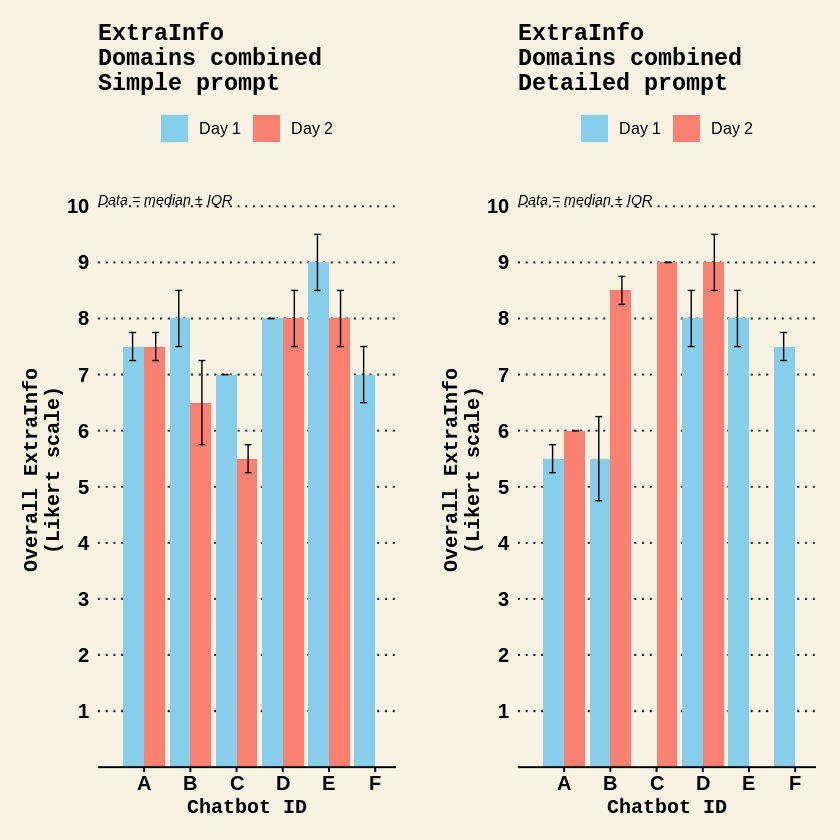

In [106]:
# Create a vector of new labels for ChatbotID
# already created in previous step
# ChatbotID_for_plots <- c("A", "B", "C", "D", "E", "F")

# Create the Likert plots
ExtraInfoSimpleCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = SimplePrompt_ExtraInfo_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = SimplePrompt_ExtraInfo_combined - SimplePrompt_ExtraInfo_combinedIQR / 2,
      ymax = SimplePrompt_ExtraInfo_combined + SimplePrompt_ExtraInfo_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "ExtraInfo\nDomains combined\nSimple prompt",
    x = "Chatbot ID",
    y = "Overall ExtraInfo\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6", "7", "8", "9", "10")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 10.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

ExtraInfoDetailedCombinedLikert <- ggplot(Experiment1_Analysis, aes(
  x = factor(ChatbotID, labels = ChatbotID_for_plots),
  y = DetailedPrompt_ExtraInfo_combined,
  fill = TestDay
)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar( # Adding vertical error bars using the IQR to define ymin and ymax
    aes(
      ymin = DetailedPrompt_ExtraInfo_combined - DetailedPrompt_ExtraInfo_combinedIQR / 2,
      ymax = DetailedPrompt_ExtraInfo_combined + DetailedPrompt_ExtraInfo_combinedIQR / 2
    ),
    position = position_dodge(width = 1),  # Adjust dodge position for error bars to align with the bars
    width = 0.3,
    linewidth = 0.4,
    color = 'black'
  ) +
  labs(
    title = "ExtraInfo\nDomains combined\nDetailed prompt",
    x = "Chatbot ID",
    y = "Overall ExtraInfo\n(Likert scale)"
  ) +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6", "7", "8", "9", "10")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 0, hjust = 0.5, size = 12),
    axis.title.x = element_text(color = "black", face = "bold", size = 12),
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 10.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Arrange the plots side by side
grid.arrange(ExtraInfoSimpleCombinedLikert, ExtraInfoDetailedCombinedLikert, ncol = 2)

## Bar charts

### Accuracy

#### Training domain

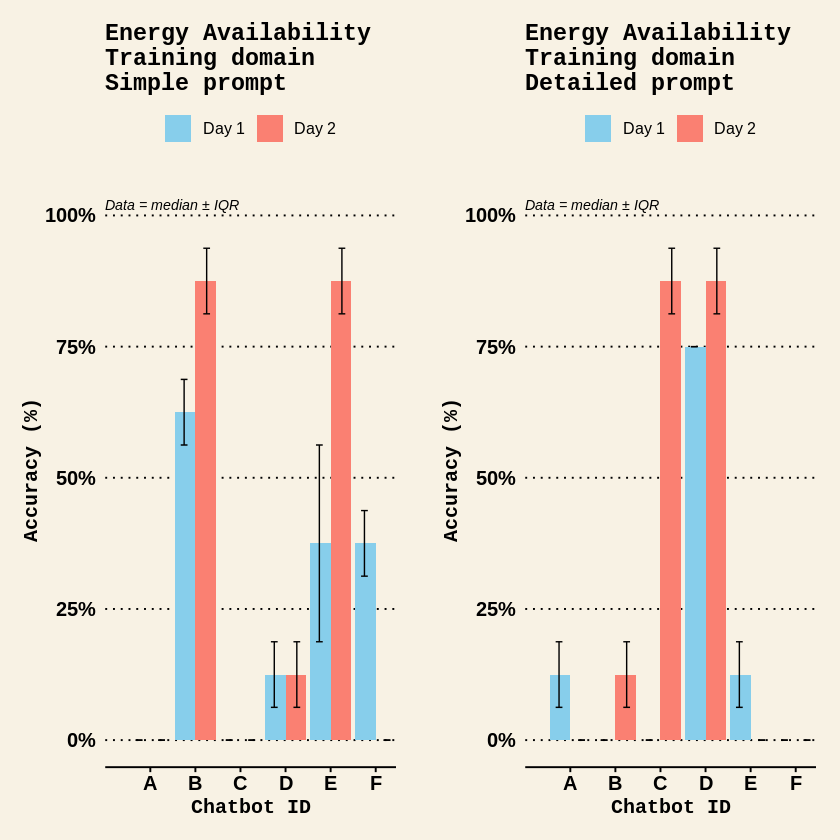

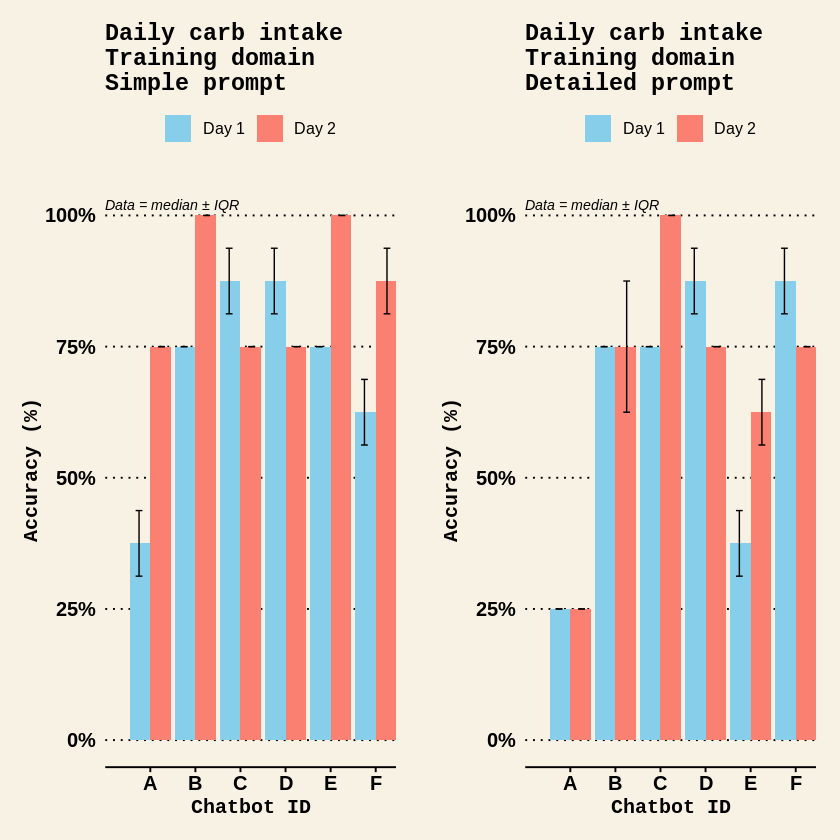

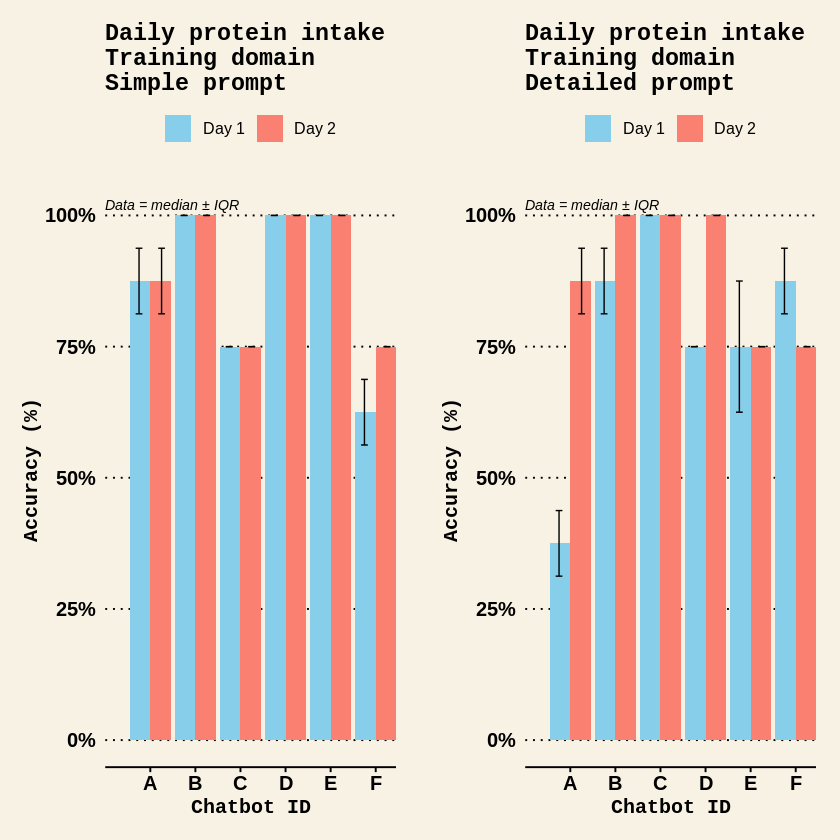

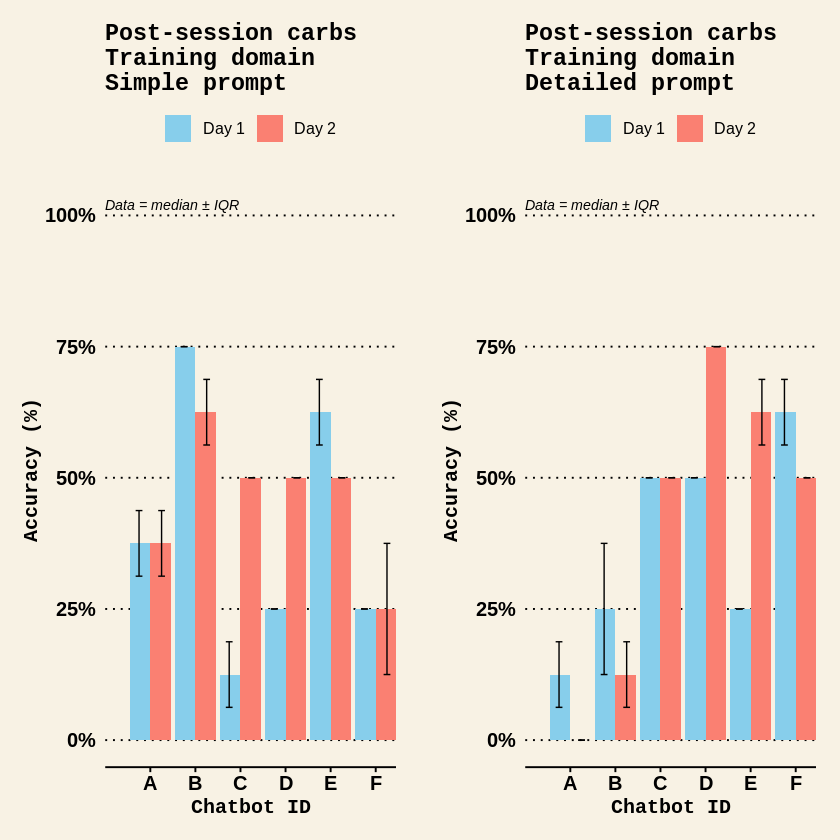

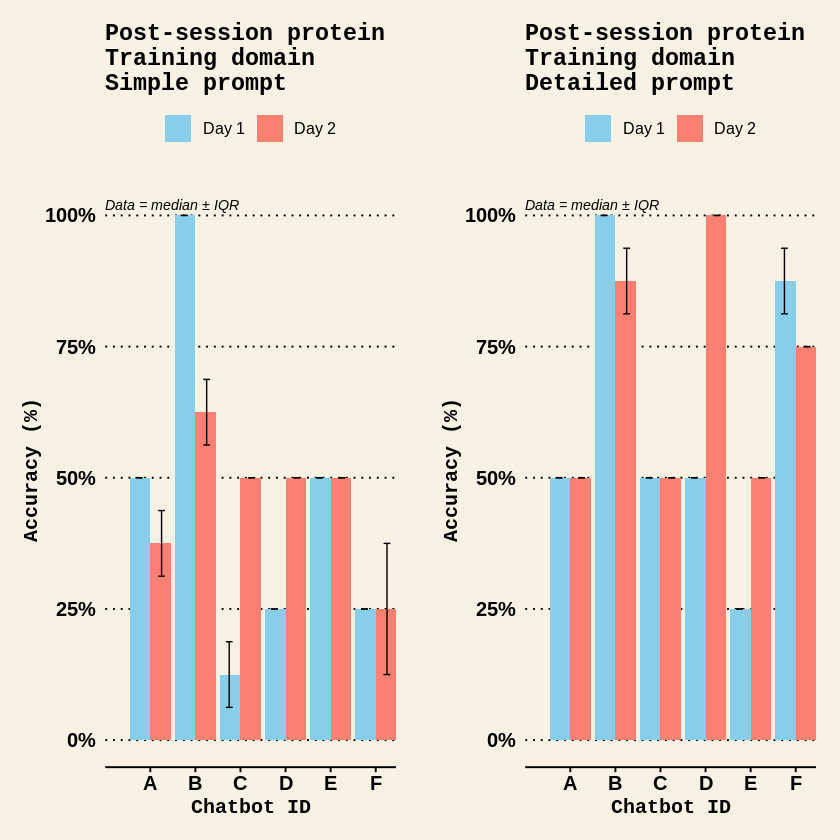

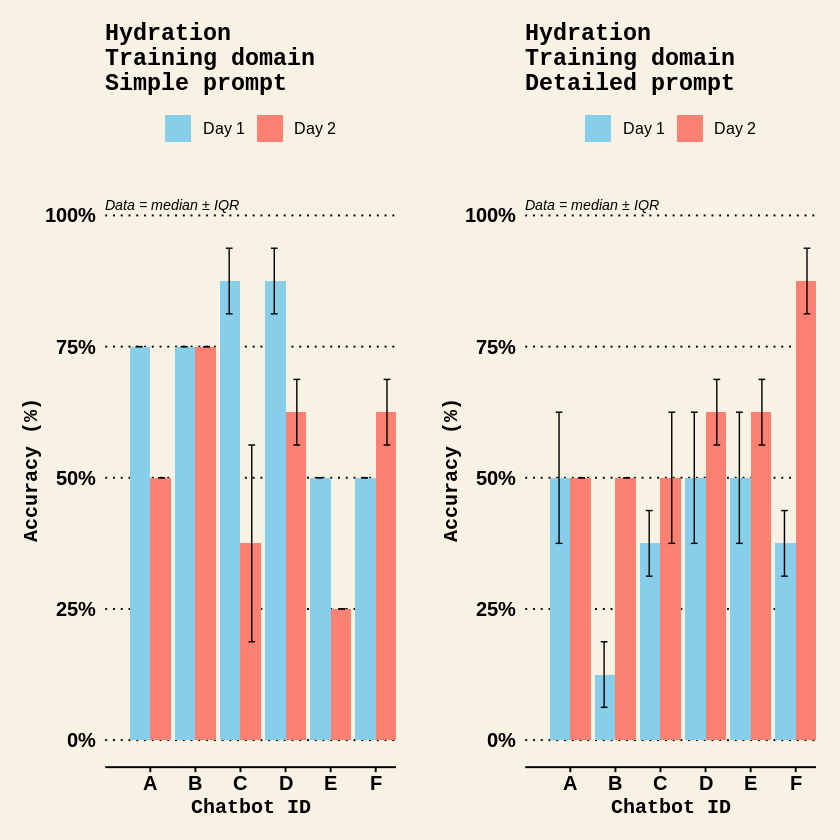

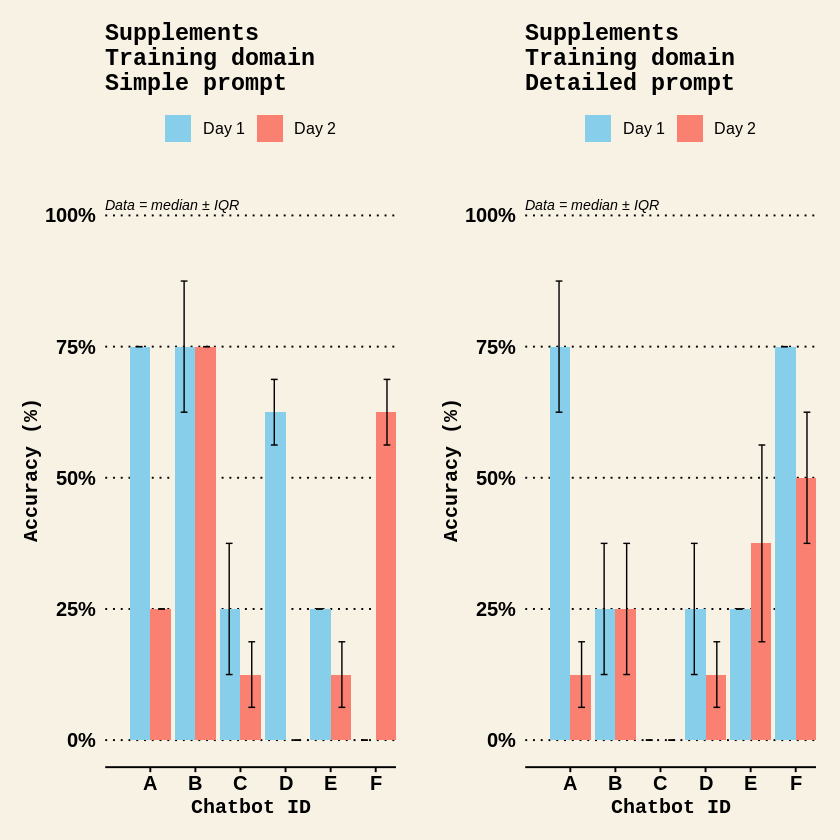

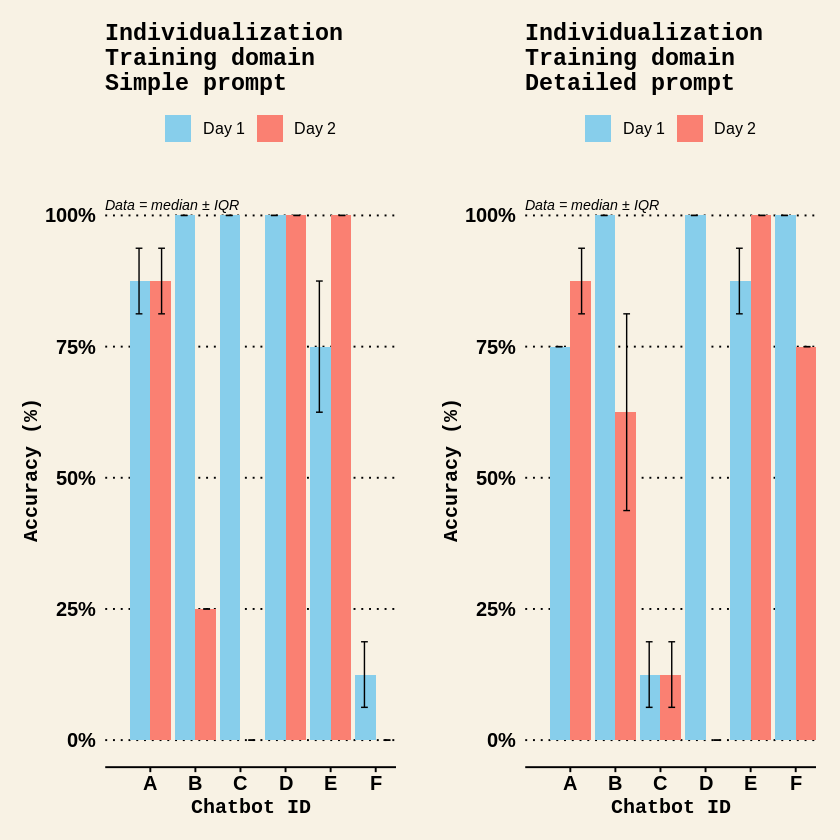

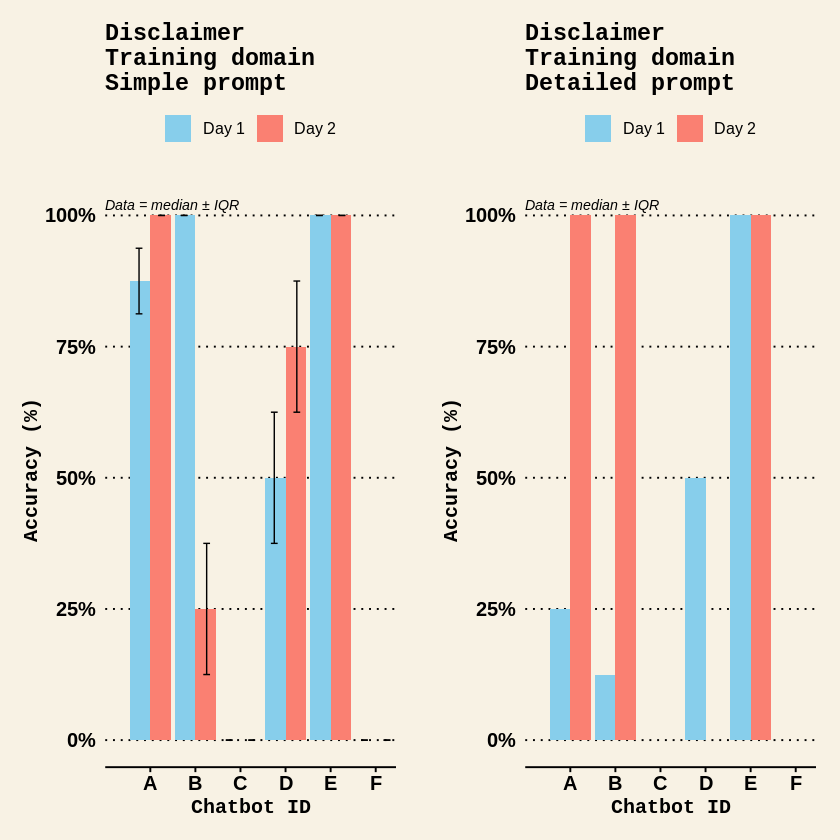

In [107]:
# PERCENTAGE ACCURACY in the TRAINING domain for the Simple and Detailed prompts
grid.arrange(EnergyAvailabilitySimpleTraining, EnergyAvailabilityDetailedTraining, ncol = 2)
grid.arrange(DailyCarbIntakeSimpleTraining, DailyCarbIntakeDetailedTraining, ncol = 2)
grid.arrange(DailyProteinSimpleTraining, DailyProteinDetailedTraining, ncol = 2)
grid.arrange(PostSessionCarbsSimpleTraining, PostSessionCarbsDetailedTraining, ncol = 2)
grid.arrange(PostSessionProteinSimpleTraining, PostSessionProteinDetailedTraining, ncol = 2)
grid.arrange(HydrationSimpleTraining, HydrationDetailedTraining, ncol = 2)
grid.arrange(SupplementsSimpleTraining, SupplementsDetailedTraining, ncol = 2)
grid.arrange(IndividualizationSimpleTraining, IndividualizationDetailedTraining, ncol = 2)
grid.arrange(DisclaimerSimpleTraining, DisclaimerDetailedTraining, ncol = 2)

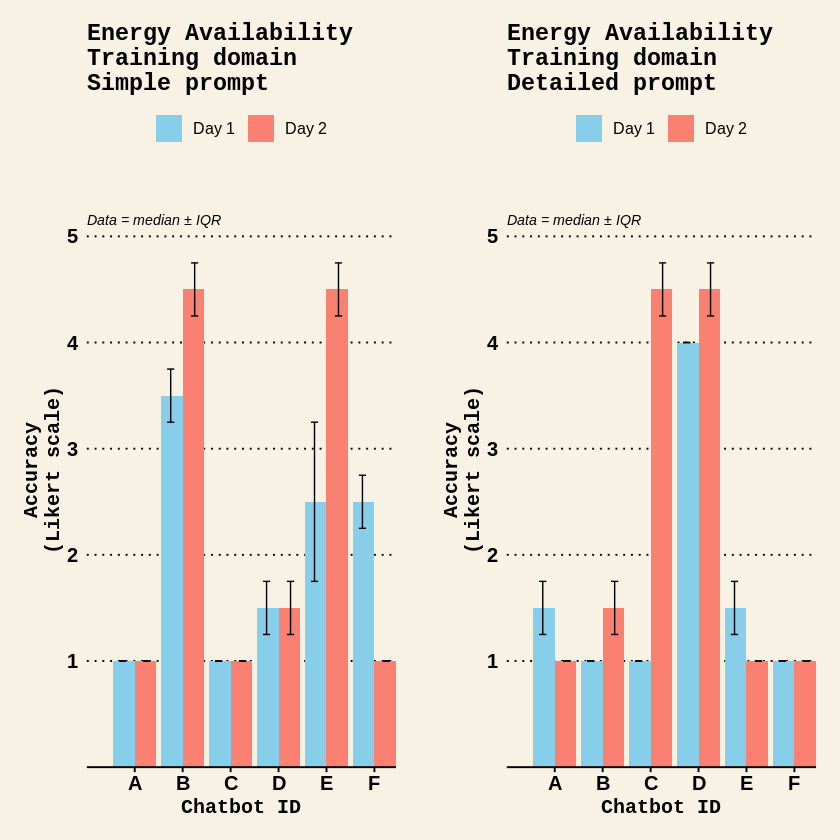

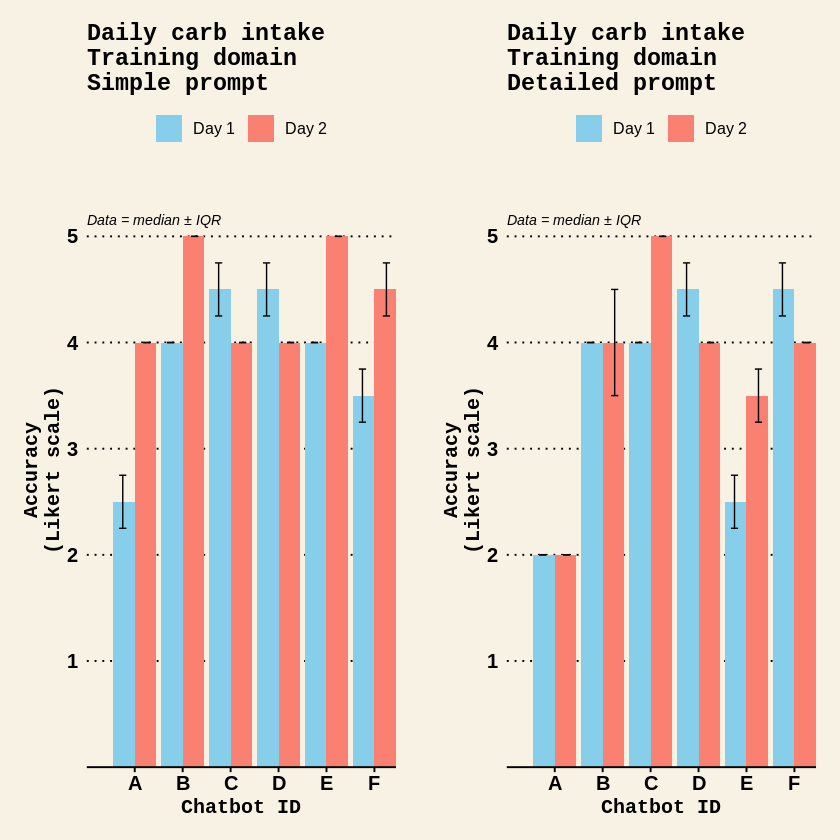

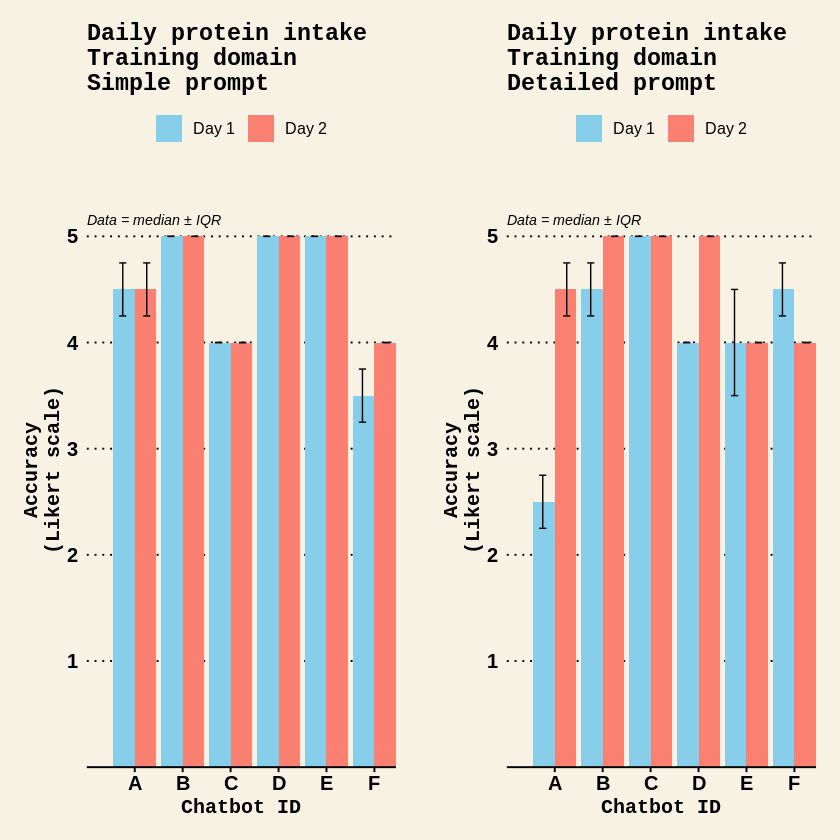

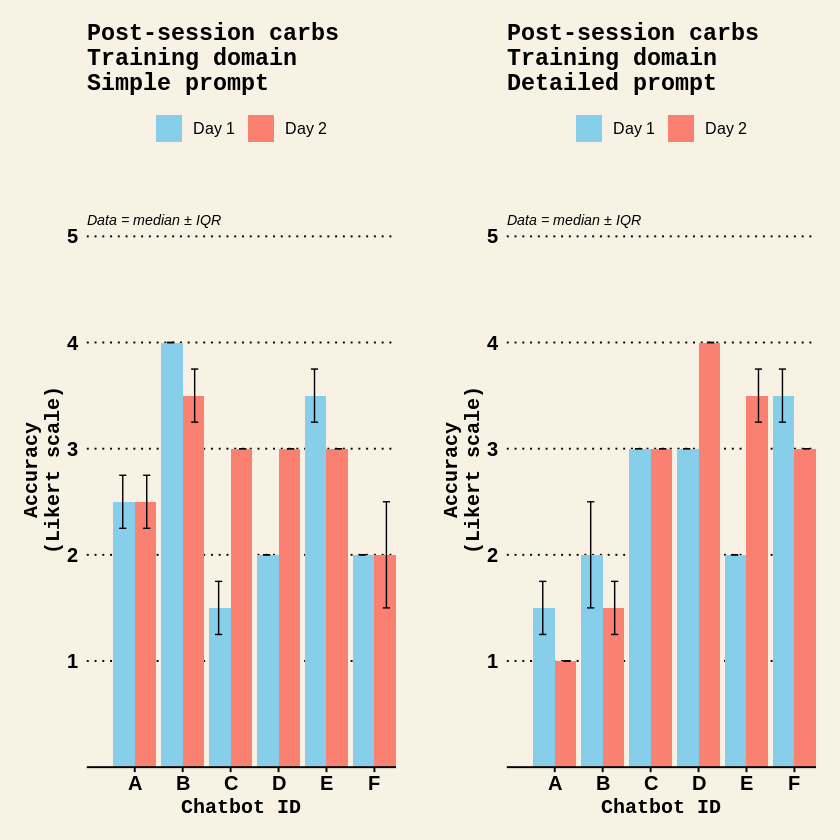

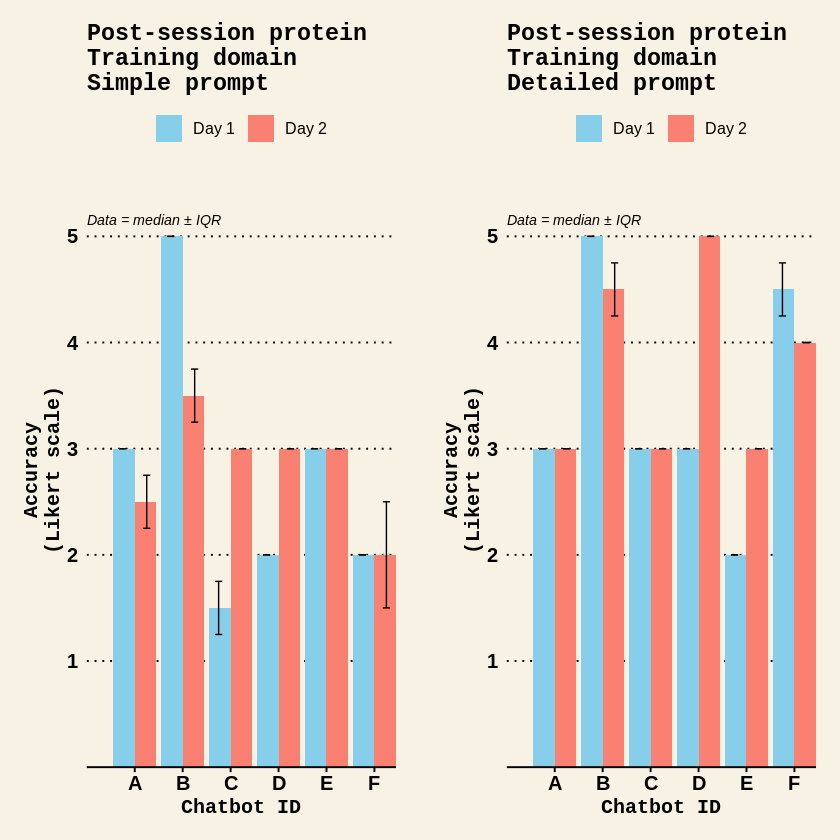

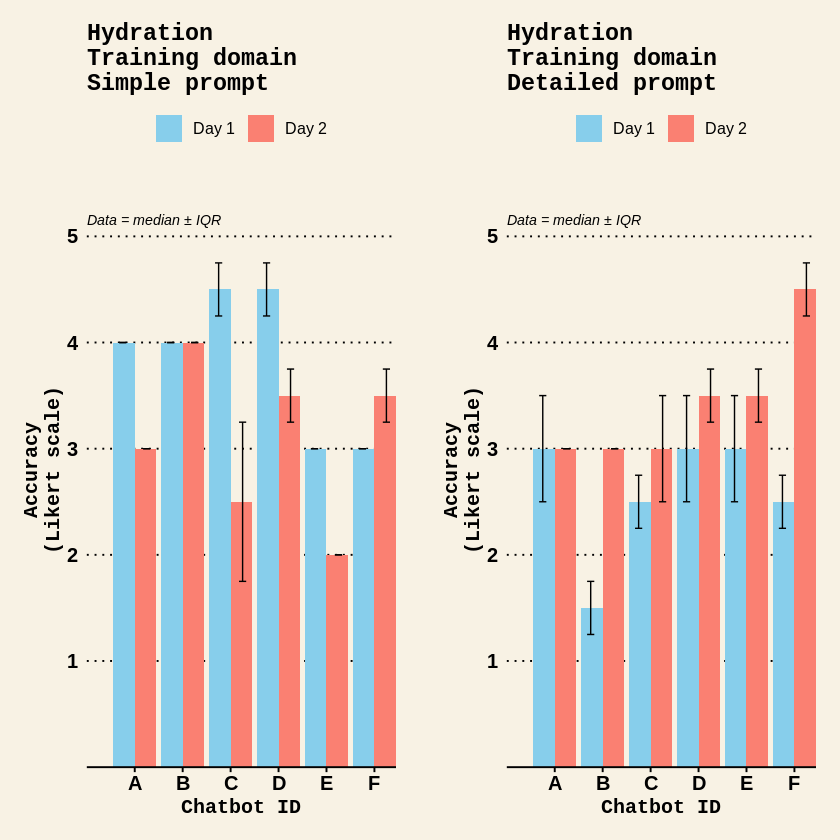

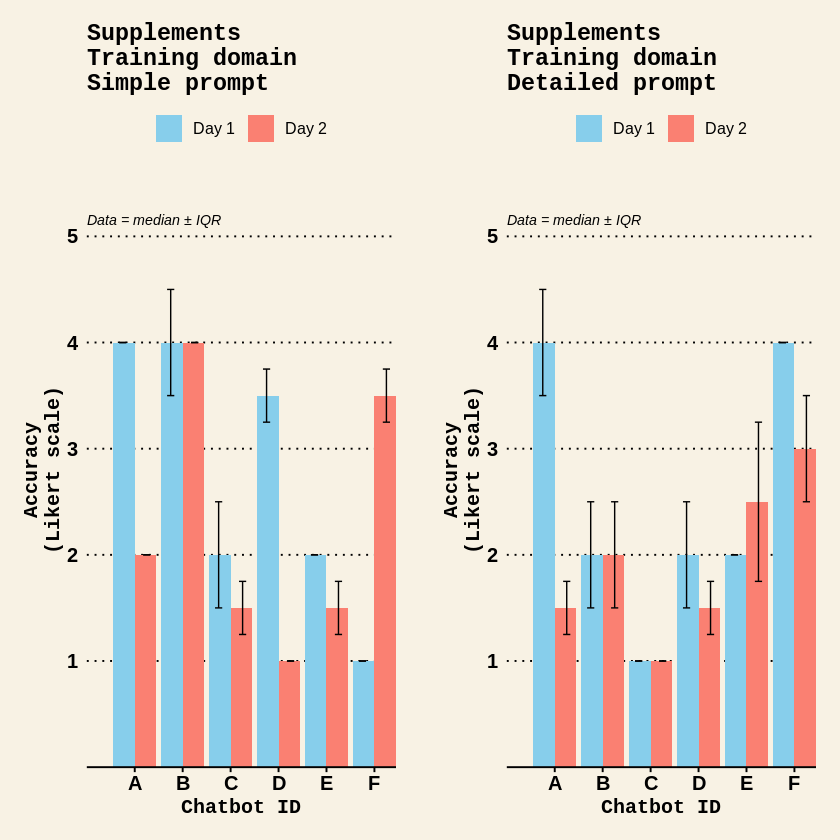

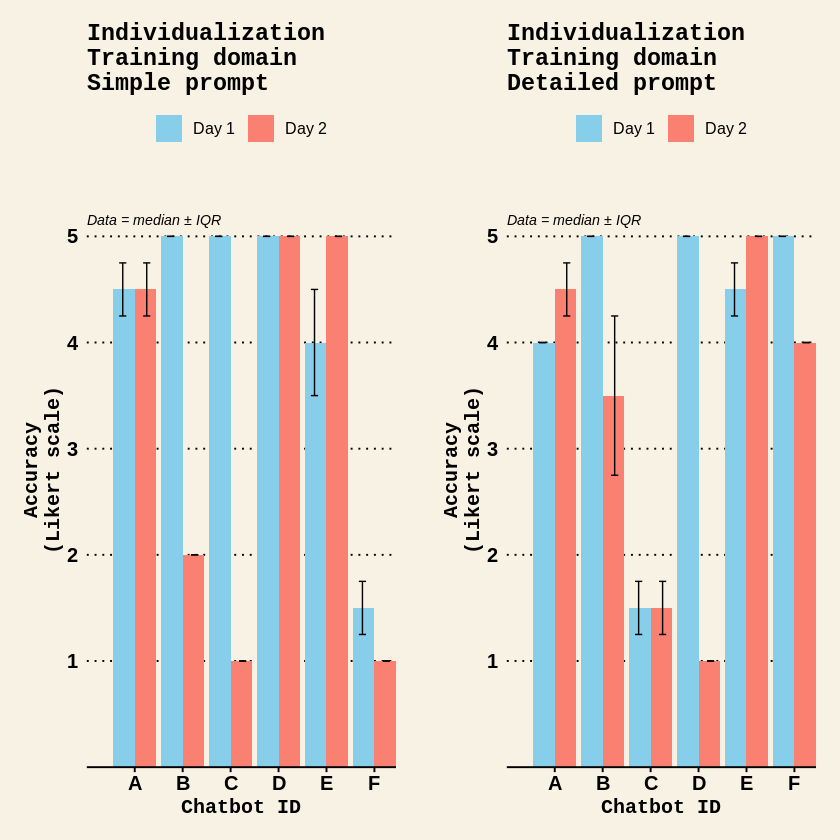

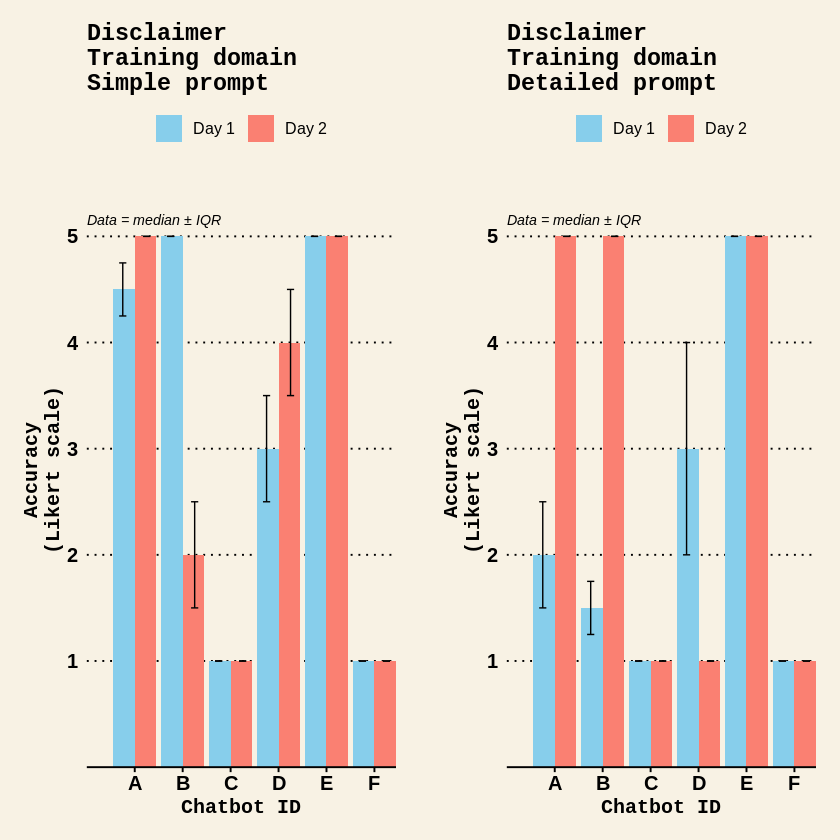

In [108]:
# ACCURACY (Likert scale) in the TRAINING domain for the Simple and Detailed prompts
grid.arrange(EnergyAvailabilitySimpleTrainingLikert, EnergyAvailabilityDetailedTrainingLikert, ncol = 2)
grid.arrange(DailyCarbIntakeSimpleTrainingLikert, DailyCarbIntakeDetailedTrainingLikert, ncol = 2)
grid.arrange(DailyProteinSimpleTrainingLikert, DailyProteinDetailedTrainingLikert, ncol = 2)
grid.arrange(PostSessionCarbsSimpleTrainingLikert, PostSessionCarbsDetailedTrainingLikert, ncol = 2)
grid.arrange(PostSessionProteinSimpleTrainingLikert, PostSessionProteinDetailedTrainingLikert, ncol = 2)
grid.arrange(HydrationSimpleTrainingLikert, HydrationDetailedTrainingLikert, ncol = 2)
grid.arrange(SupplementsSimpleTrainingLikert, SupplementsDetailedTrainingLikert, ncol = 2)
grid.arrange(IndividualizationSimpleTrainingLikert, IndividualizationDetailedTrainingLikert, ncol = 2)
grid.arrange(DisclaimerSimpleTrainingLikert, DisclaimerDetailedTrainingLikert, ncol = 2)

#### Racing domain

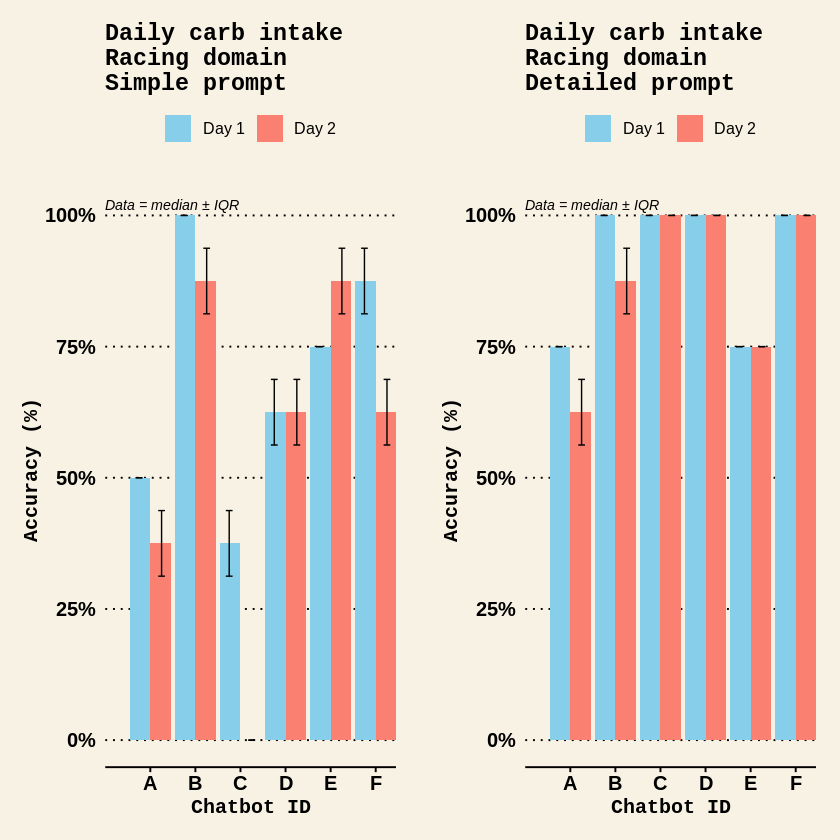

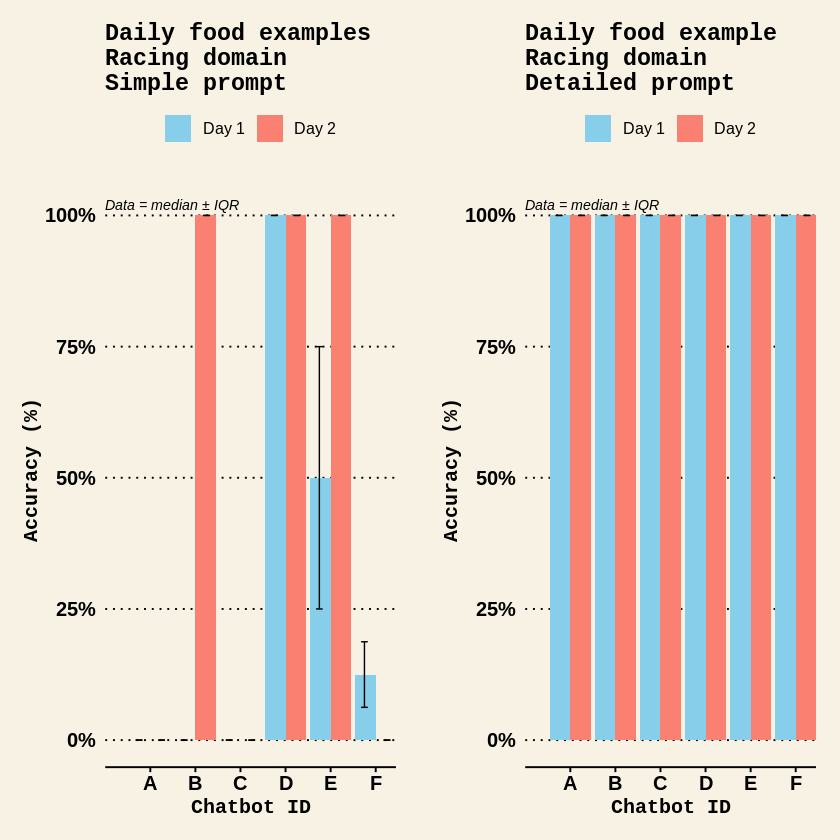

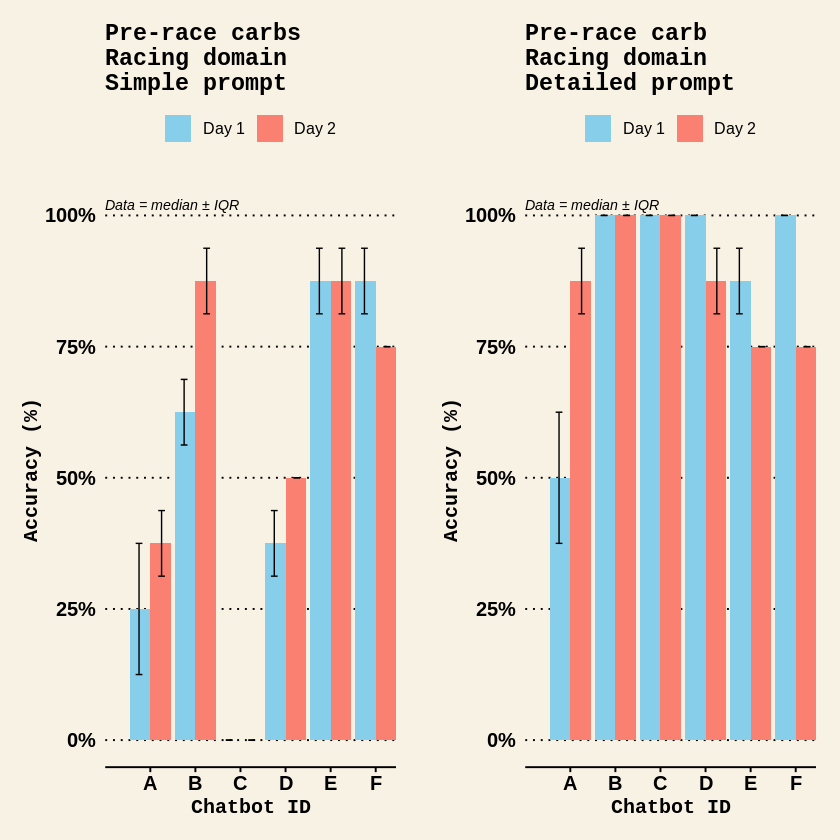

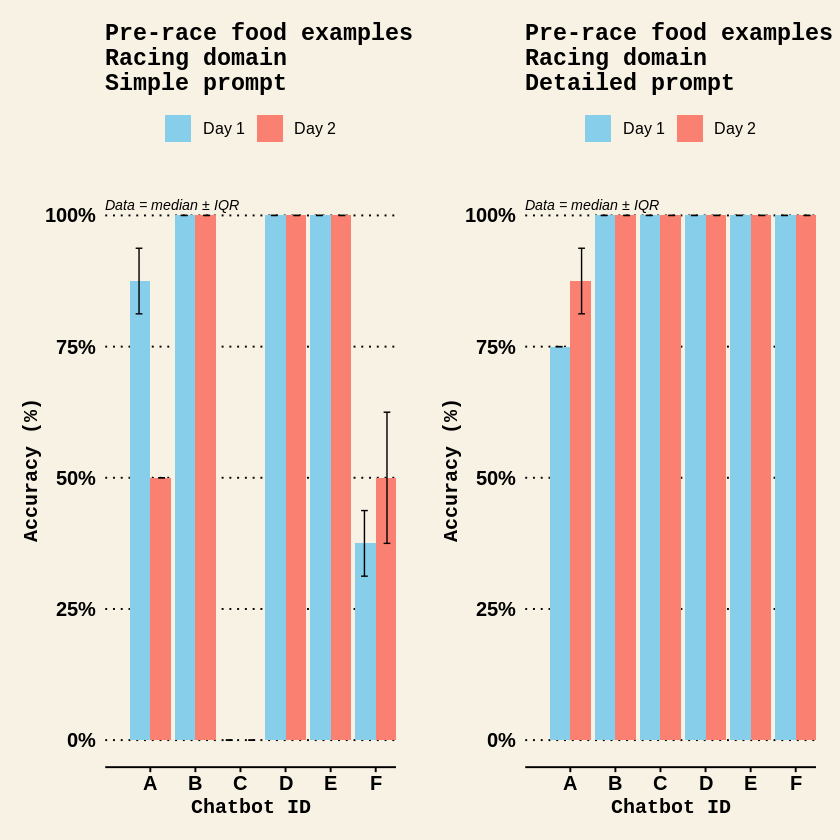

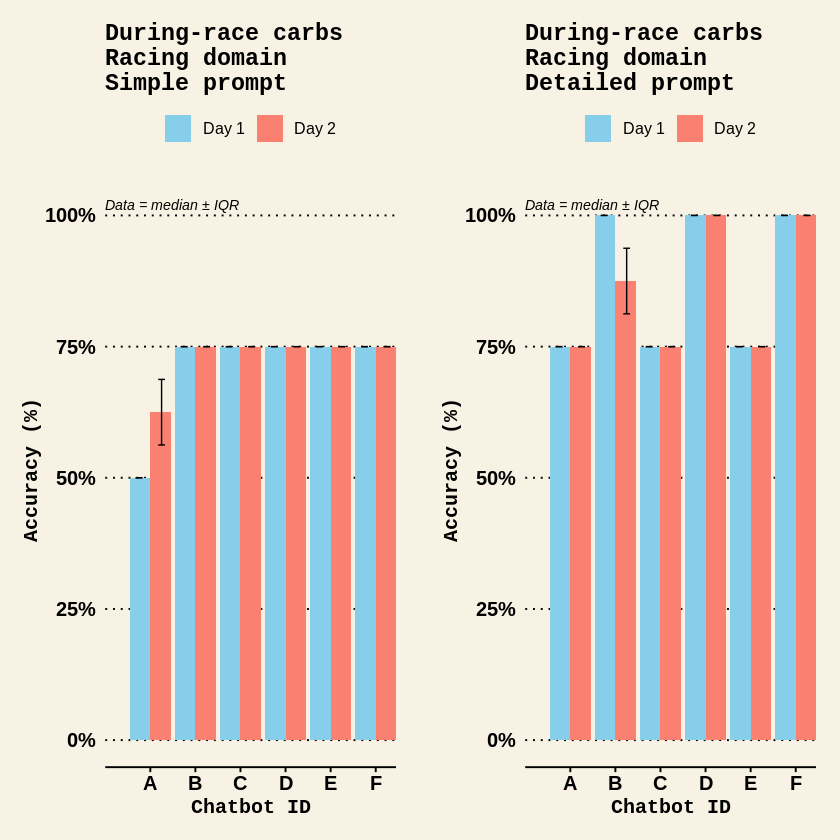

...

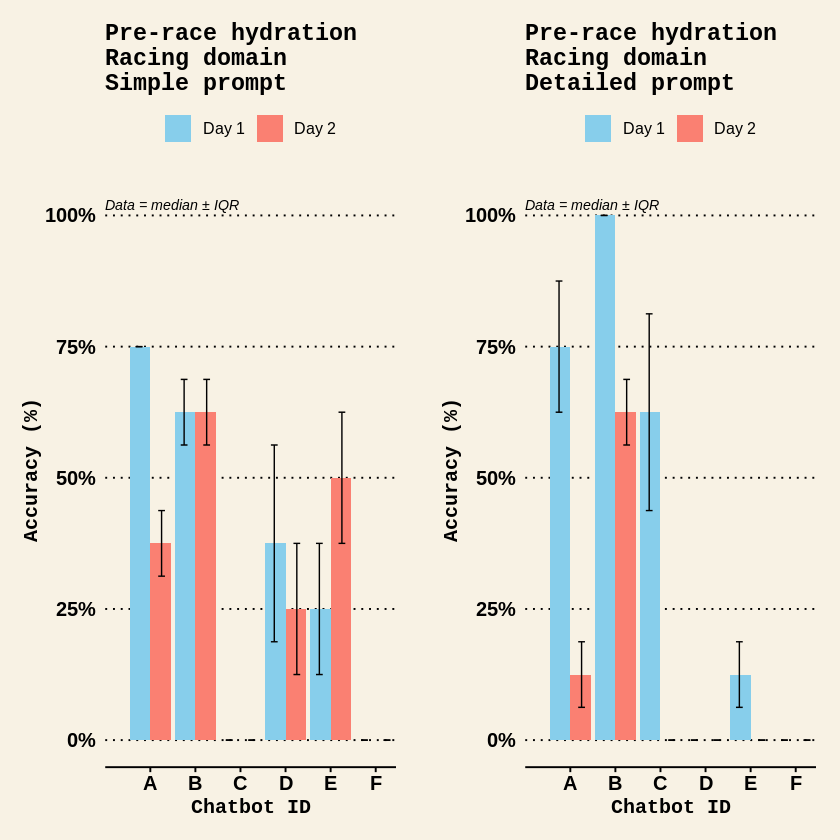

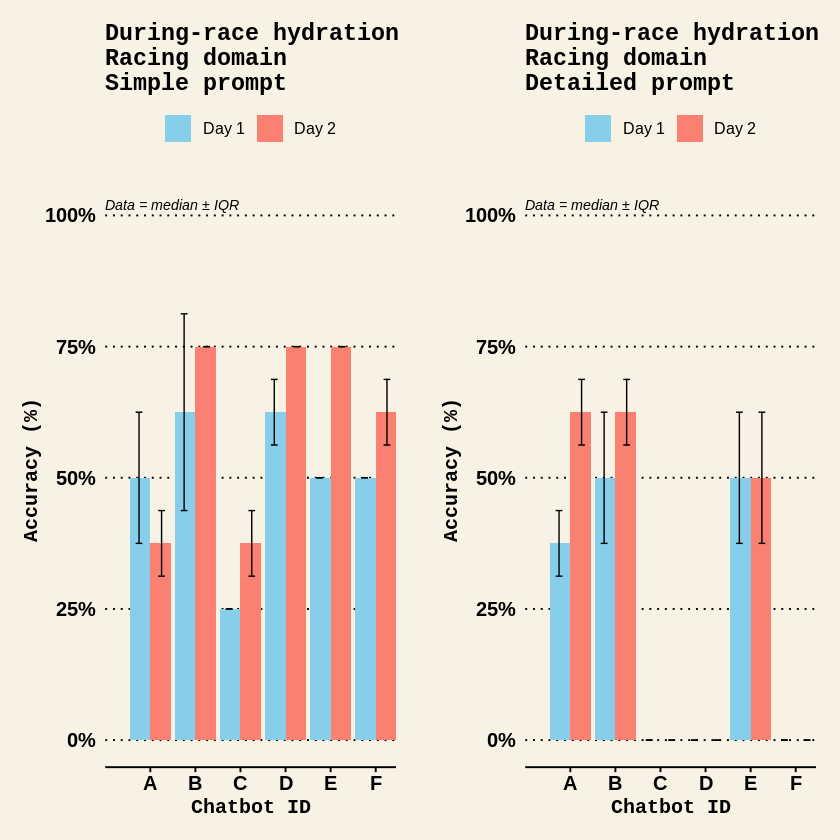

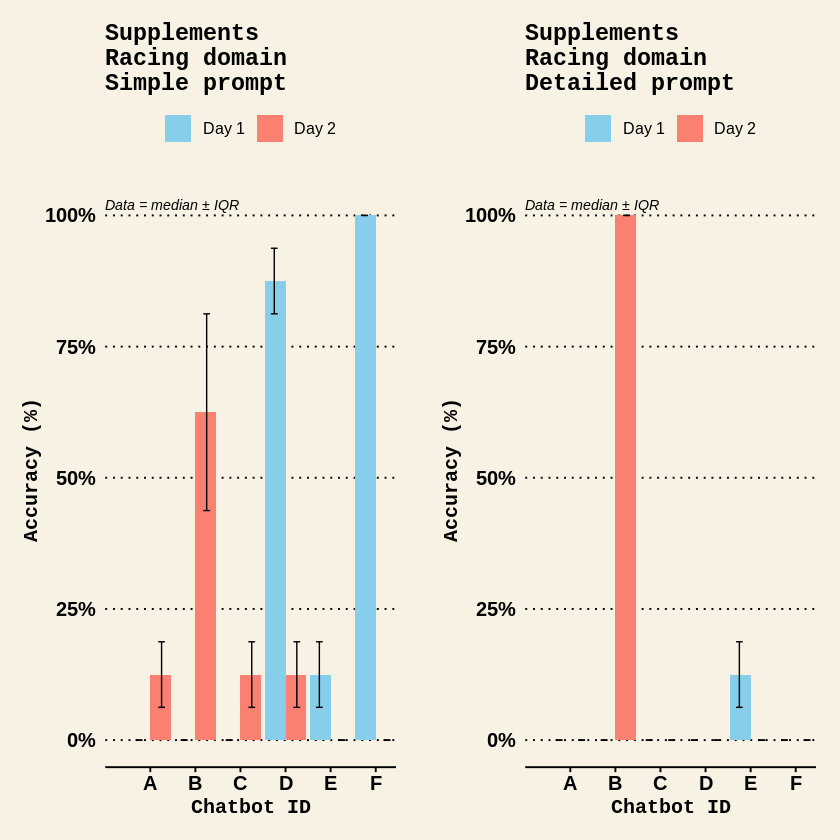

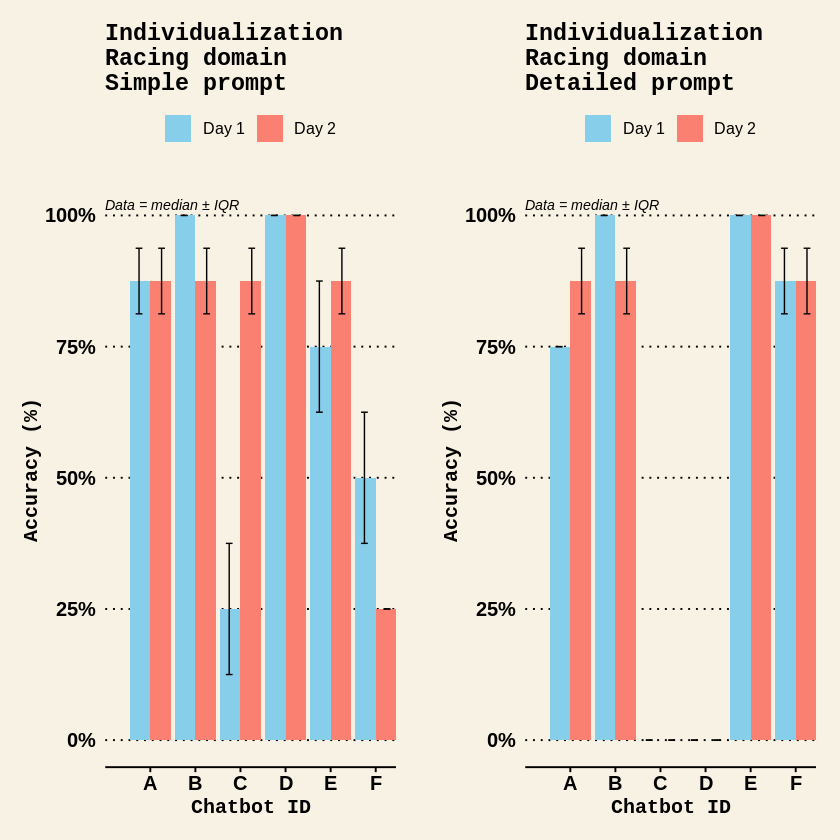

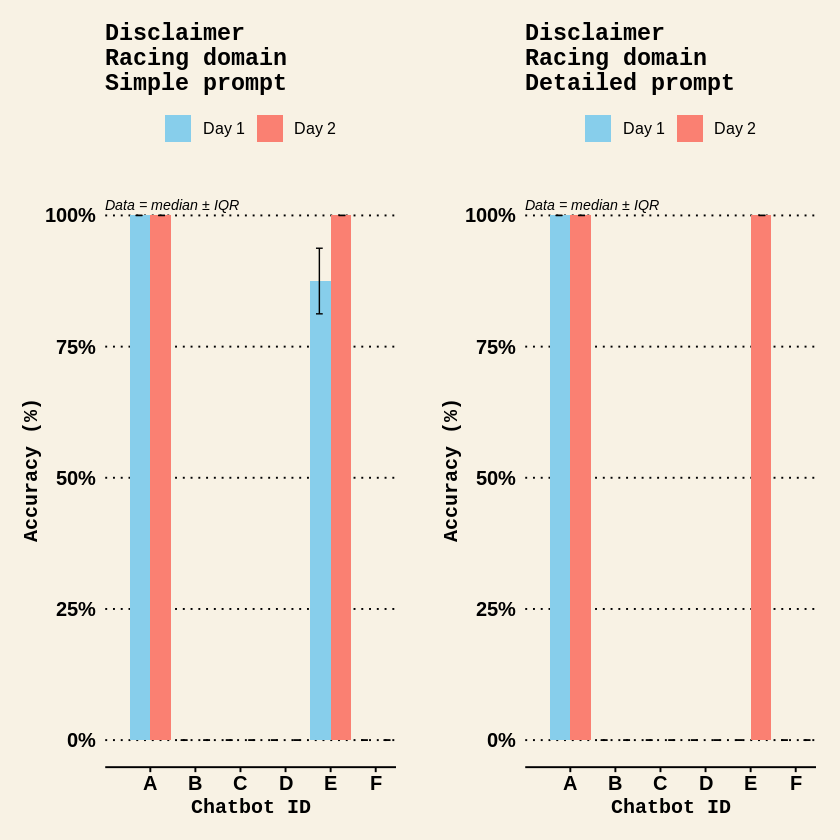

In [109]:
# PERCENTAGE ACCURACY in the RACING domain for the Simple and Detailed prompts
grid.arrange(CarbsDaysBeforeSimpleRacing, CarbsDaysBeforeDetailedRacing, ncol = 2)
grid.arrange(CarbsDaysBeforeFoodsSimpleRacing, CarbsDaysBeforeFoodsDetailedRacing, ncol = 2)
grid.arrange(CarbsHoursBeforeSimpleRacing, CarbsHoursBeforeDetailedRacing, ncol = 2)
grid.arrange(CarbsHoursBeforeFoodsSimpleRacing, CarbsHoursBeforeFoodsDetailedRacing, ncol = 2)
grid.arrange(CarbsDuringRaceSimpleRacing, CarbsDuringRaceDetailedRacing, ncol = 2)
grid.arrange(CarbsDuringRaceFoodsSimpleRacing, CarbsDuringRaceFoodsDetailedRacing, ncol = 2)
grid.arrange(HydrationBeforeRaceSimpleRacing, HydrationBeforeRaceDetailedRacing, ncol = 2)
grid.arrange(HydrationDuringRaceSimpleRacing, HydrationDuringRaceDetailedRacing, ncol = 2)
grid.arrange(SupplementsSimpleRacing, SupplementsDetailedRacing, ncol = 2)
grid.arrange(IndividualizationSimpleRacing, IndividualizationDetailedRacing, ncol = 2)
grid.arrange(DisclaimerSimpleRacing, DisclaimerDetailedRacing, ncol = 2)

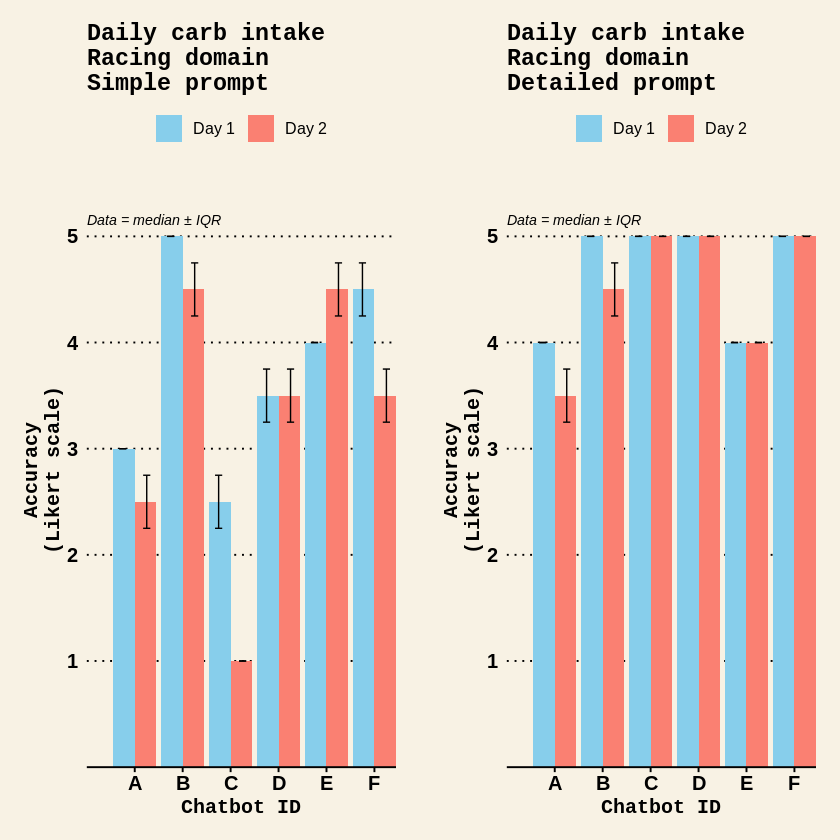

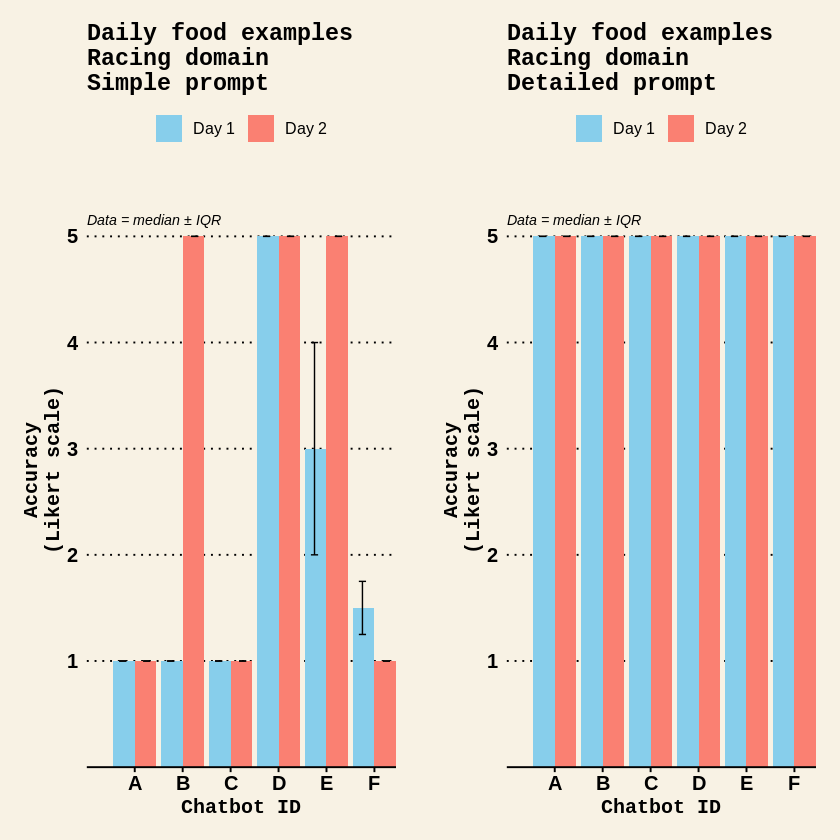

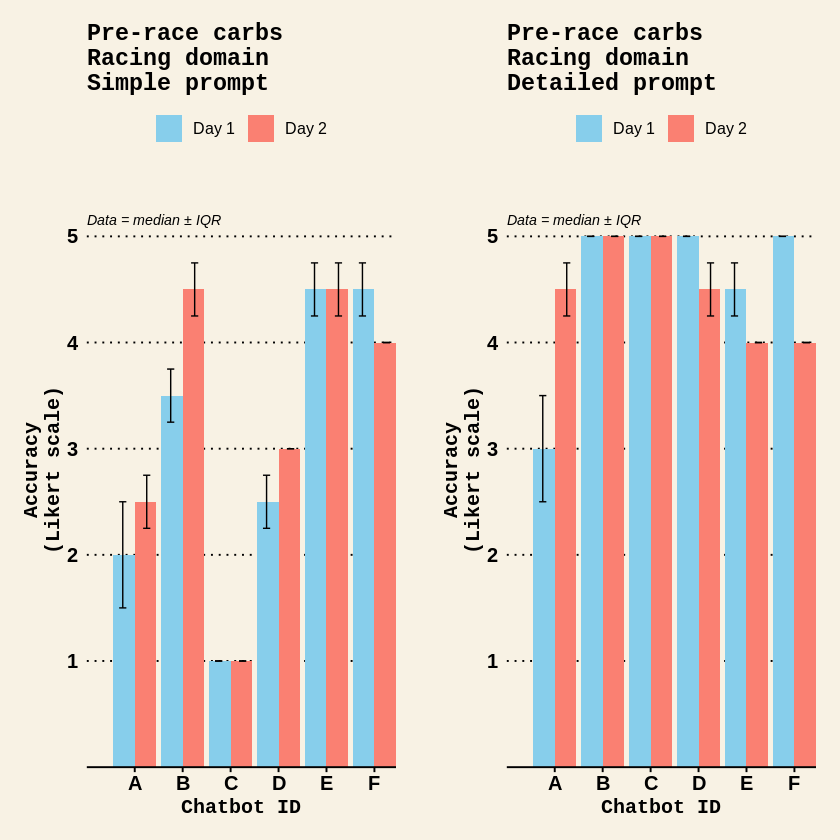

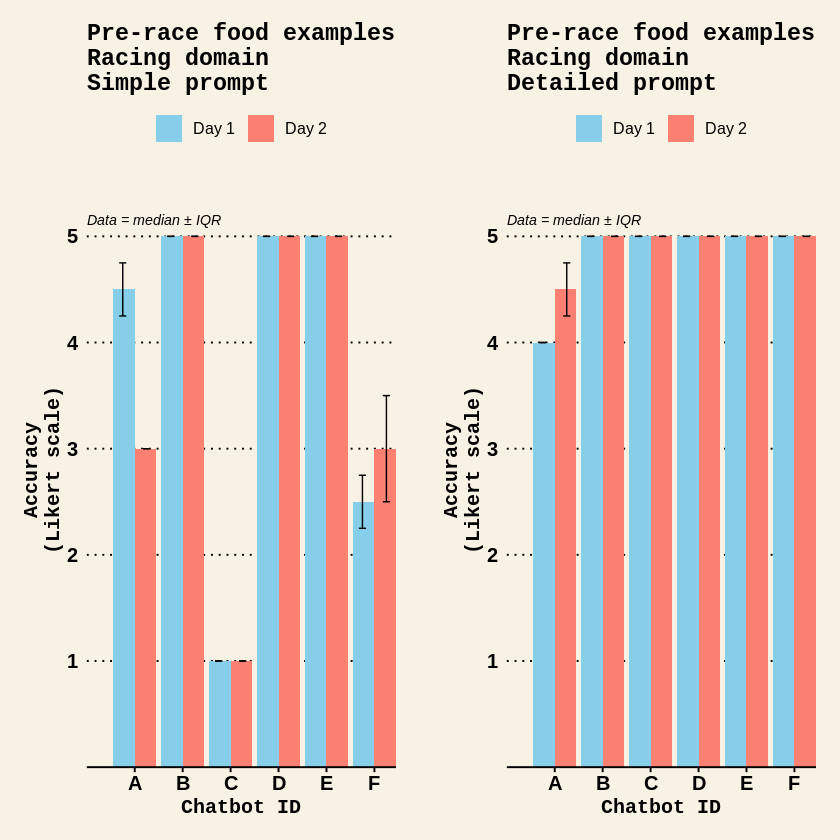

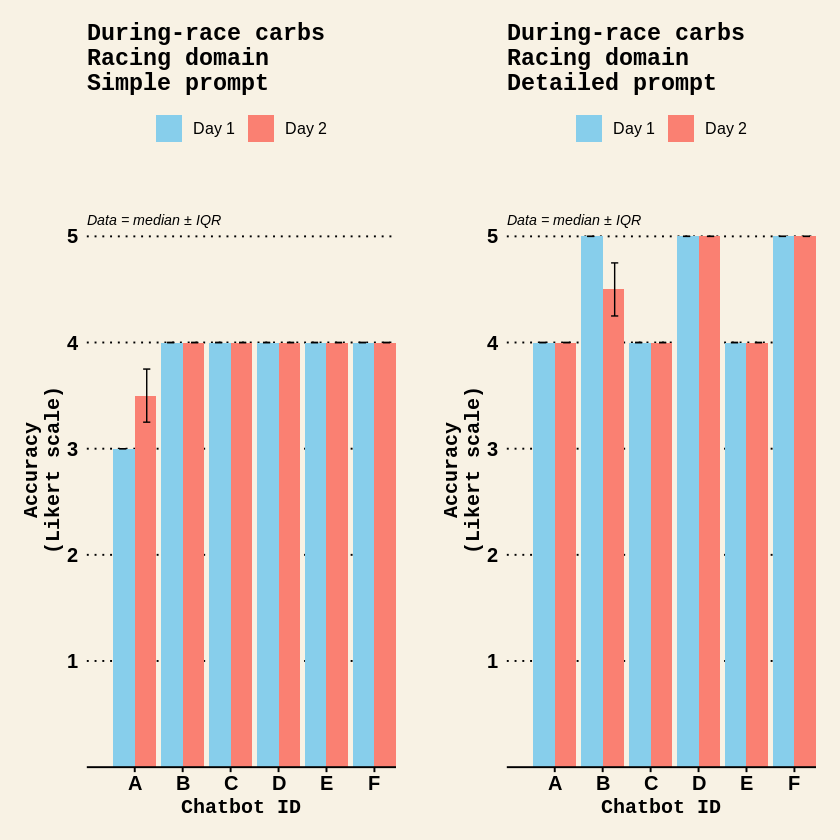

...

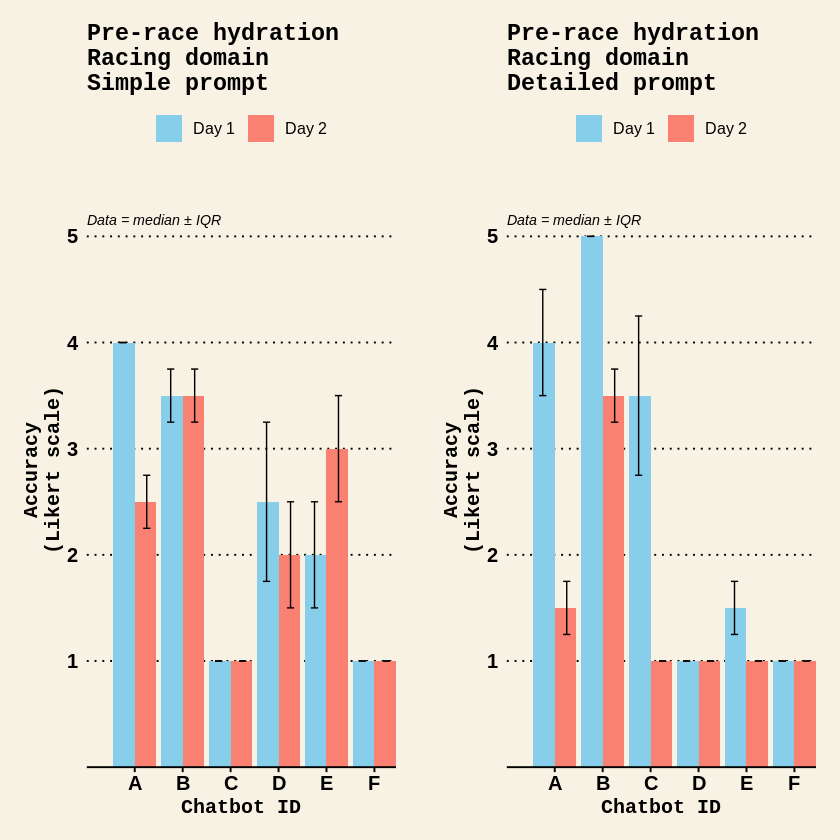

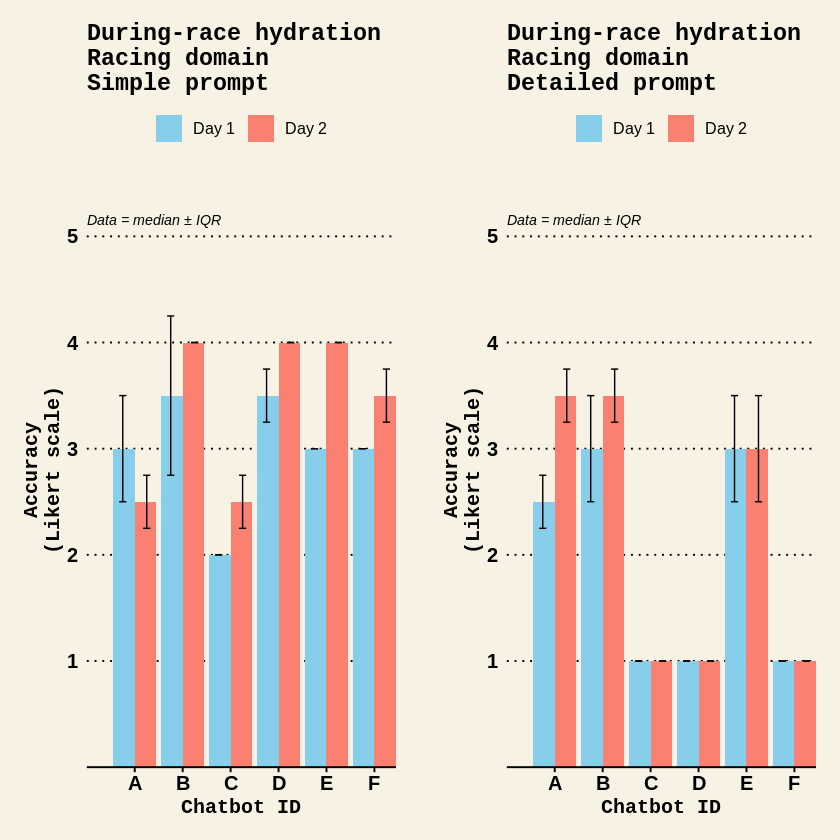

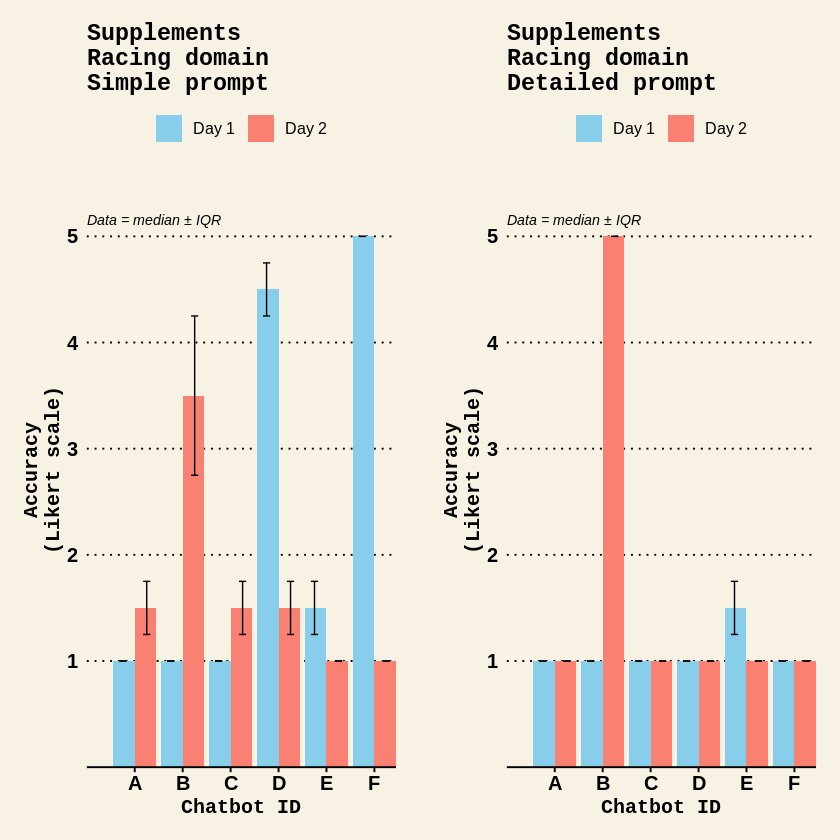

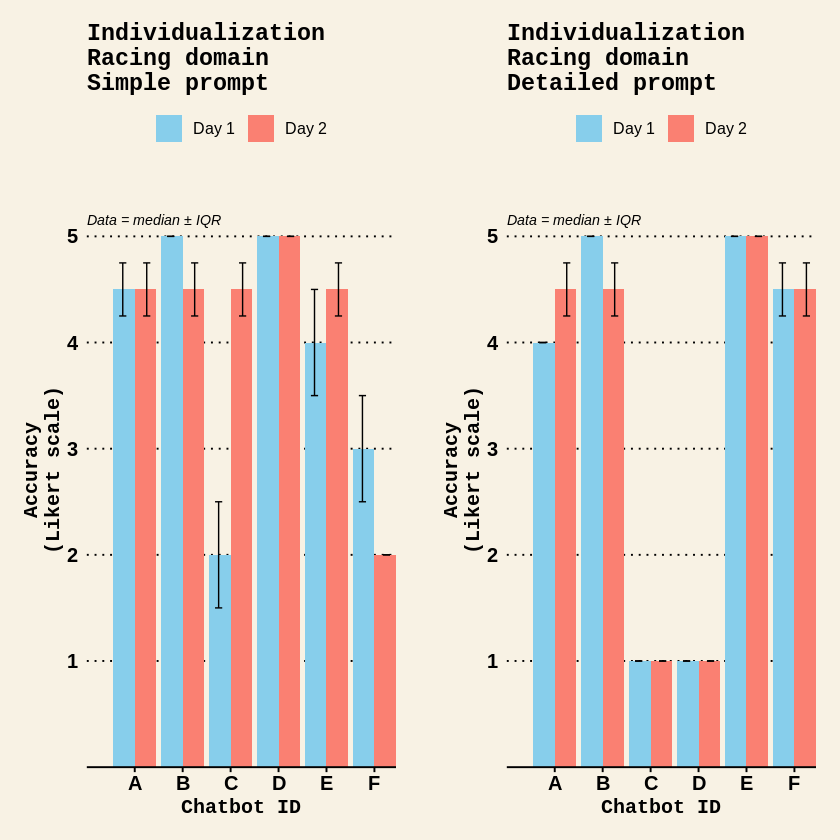

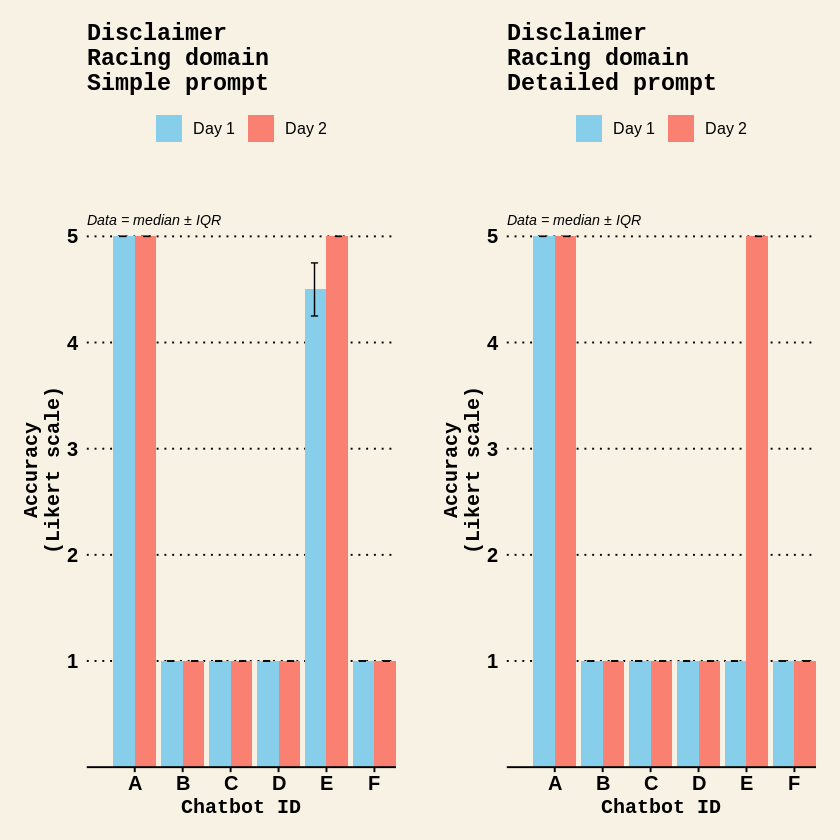

In [110]:
# ACCURACY (Likert scale) in the RACING domain for the Simple and Detailed prompts
grid.arrange(CarbsDaysBeforeSimpleRacingLikert, CarbsDaysBeforeDetailedRacingLikert, ncol = 2)
grid.arrange(CarbsDaysBeforeFoodsSimpleRacingLikert, CarbsDaysBeforeFoodsDetailedRacingLikert, ncol = 2)
grid.arrange(CarbsHoursBeforeSimpleRacingLikert, CarbsHoursBeforeDetailedRacingLikert, ncol = 2)
grid.arrange(CarbsHoursBeforeFoodsSimpleRacingLikert, CarbsHoursBeforeFoodsDetailedRacingLikert, ncol = 2)
grid.arrange(CarbsDuringRaceSimpleRacingLikert, CarbsDuringRaceDetailedRacingLikert, ncol = 2)
grid.arrange(CarbsDuringRaceFoodsSimpleRacingLikert, CarbsDuringRaceFoodsDetailedRacingLikert, ncol = 2)
grid.arrange(HydrationBeforeRaceSimpleRacingLikert, HydrationBeforeRaceDetailedRacingLikert, ncol = 2)
grid.arrange(HydrationDuringRaceSimpleRacingLikert, HydrationDuringRaceDetailedRacingLikert, ncol = 2)
grid.arrange(SupplementsSimpleRacingLikert, SupplementsDetailedRacingLikert, ncol = 2)
grid.arrange(IndividualizationSimpleRacingLikert, IndividualizationDetailedRacingLikert, ncol = 2)
grid.arrange(DisclaimerSimpleRacingLikert, DisclaimerDetailedRacingLikert, ncol = 2)

#### Overall (Sum)

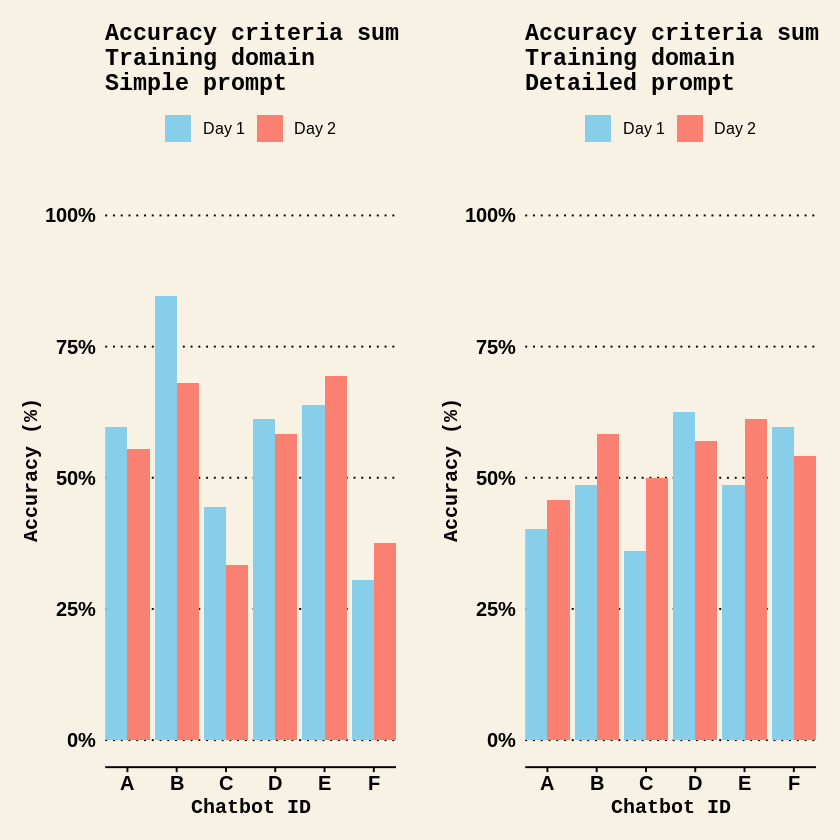

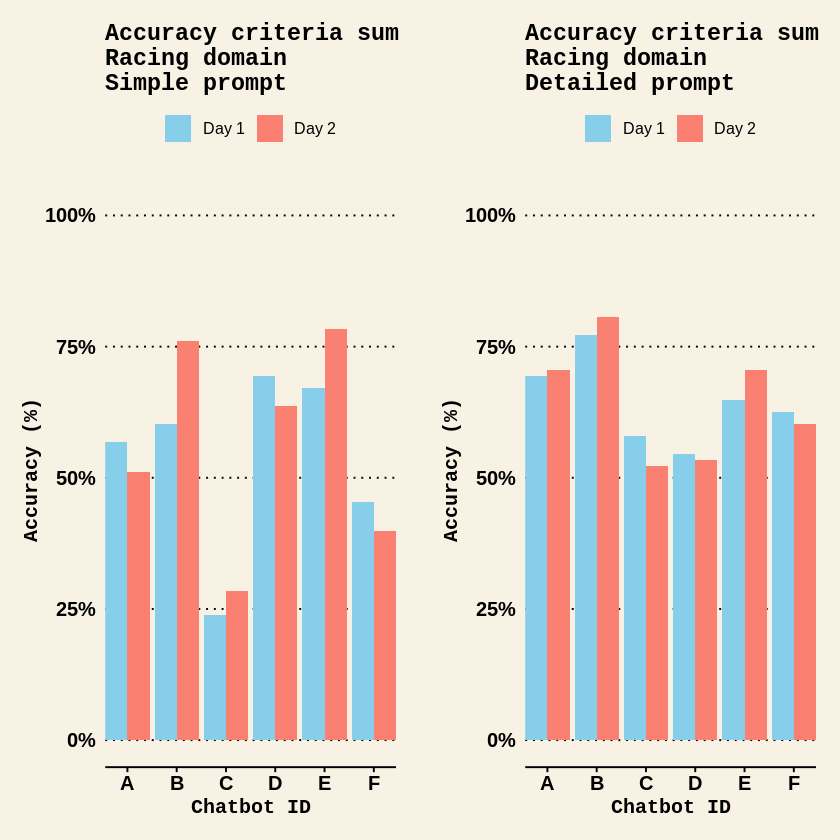

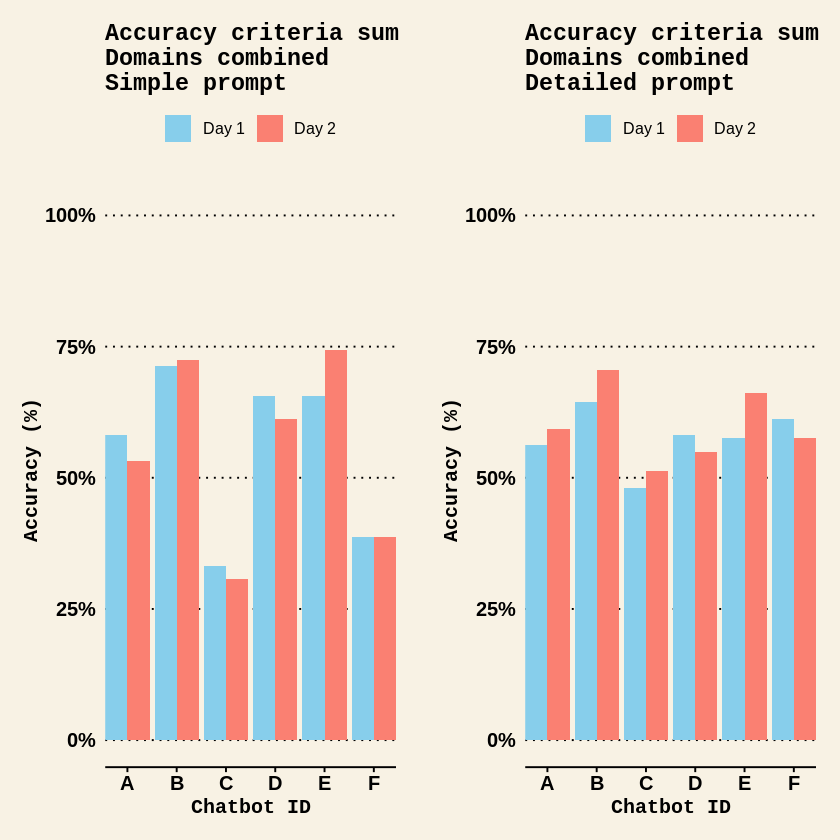

In [111]:
# PERCENTAGE ACCURACY (sum of scores) for Simple and Detailed prompts
grid.arrange(AccuracySimpleTrainingPC, AccuracyDetailedTrainingPC, ncol = 2)
grid.arrange(AccuracySimpleRacingPC, AccuracyDetailedRacingPC, ncol = 2)
grid.arrange(OverallAccuracySimplePC, OverallAccuracyDetailedPC, ncol = 2)

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_text()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_text()`).”


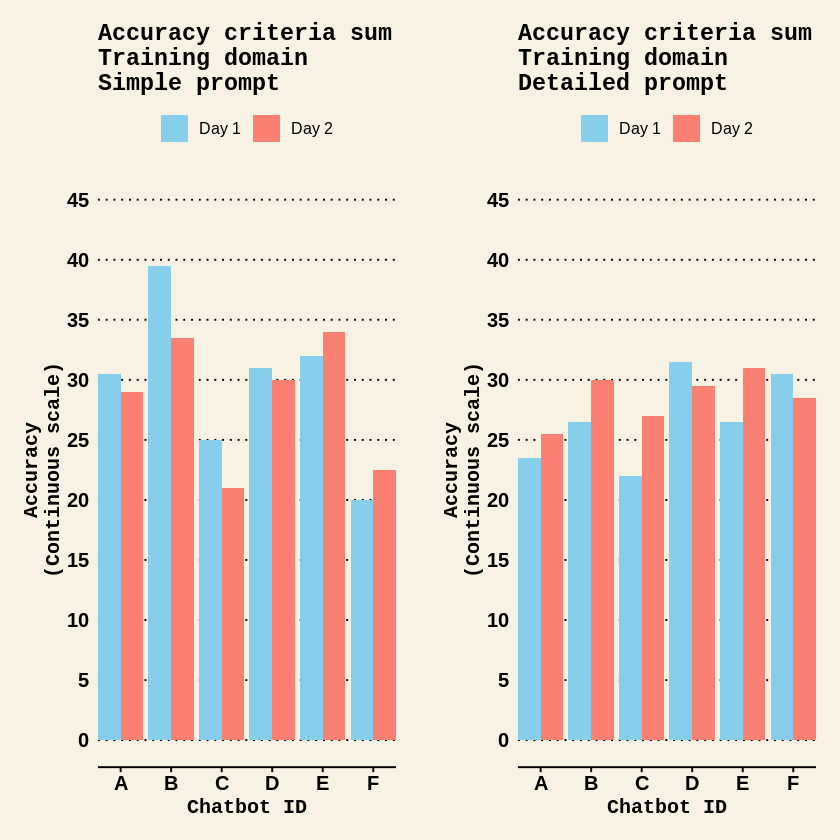

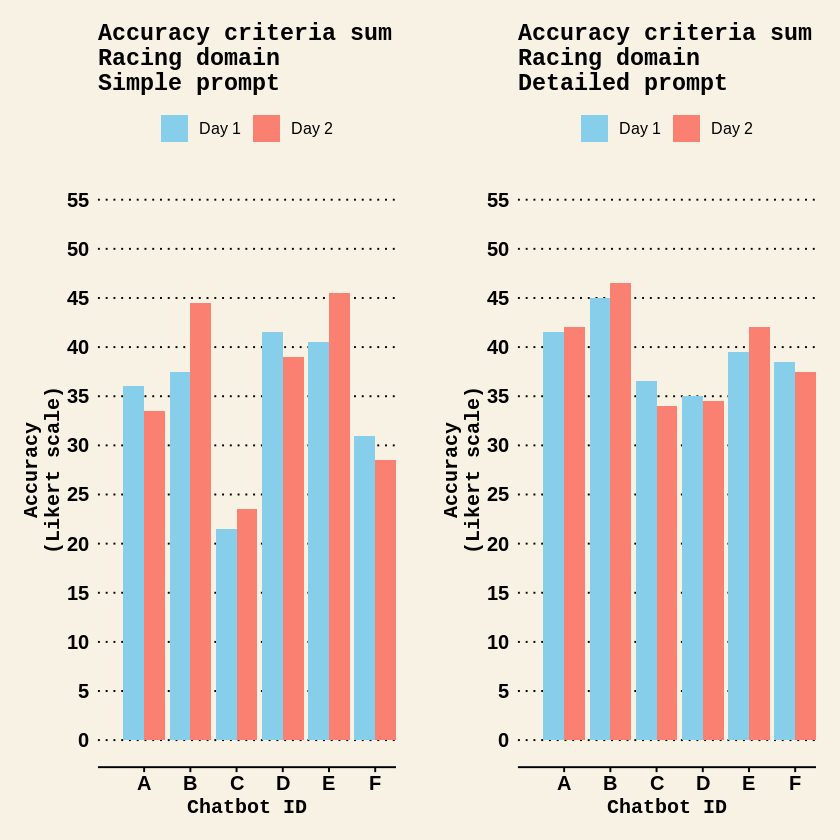

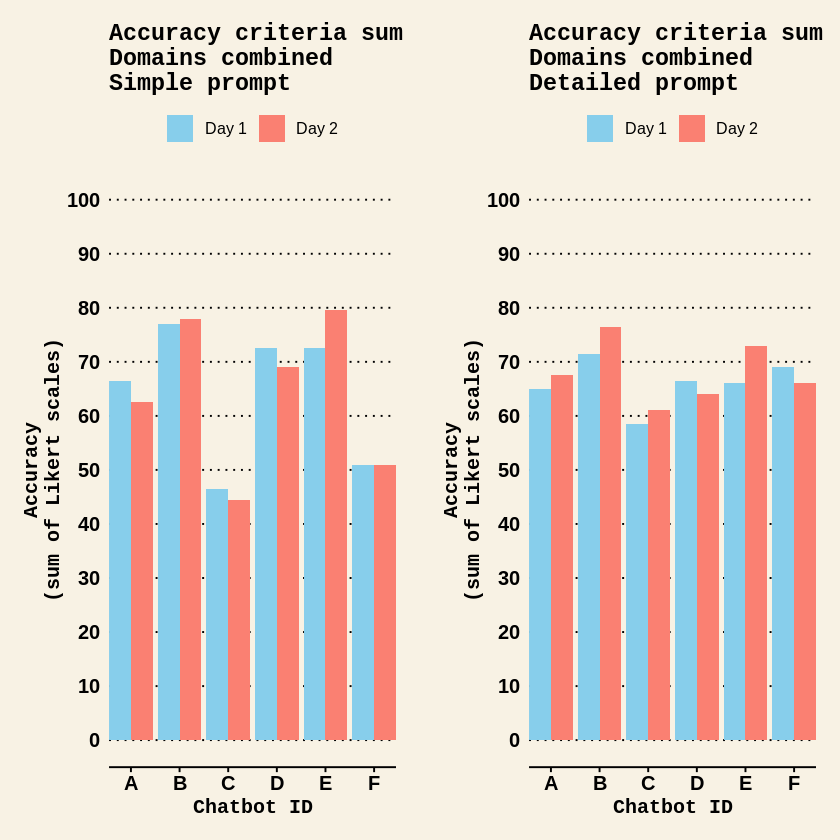

In [112]:
# LIKERT ACCURACY (sum of scores) for Simple and Detailed prompts
grid.arrange(AccuracySimpleTrainingLikert, AccuracyDetailedTrainingLikert, ncol = 2)
grid.arrange(AccuracySimpleRacingLikert, AccuracyDetailedRacingLikert, ncol = 2)
grid.arrange(OverallAccuracySimpleLikert, OverallAccuracyDetailedLikert, ncol = 2)

#### Overall (Mean)

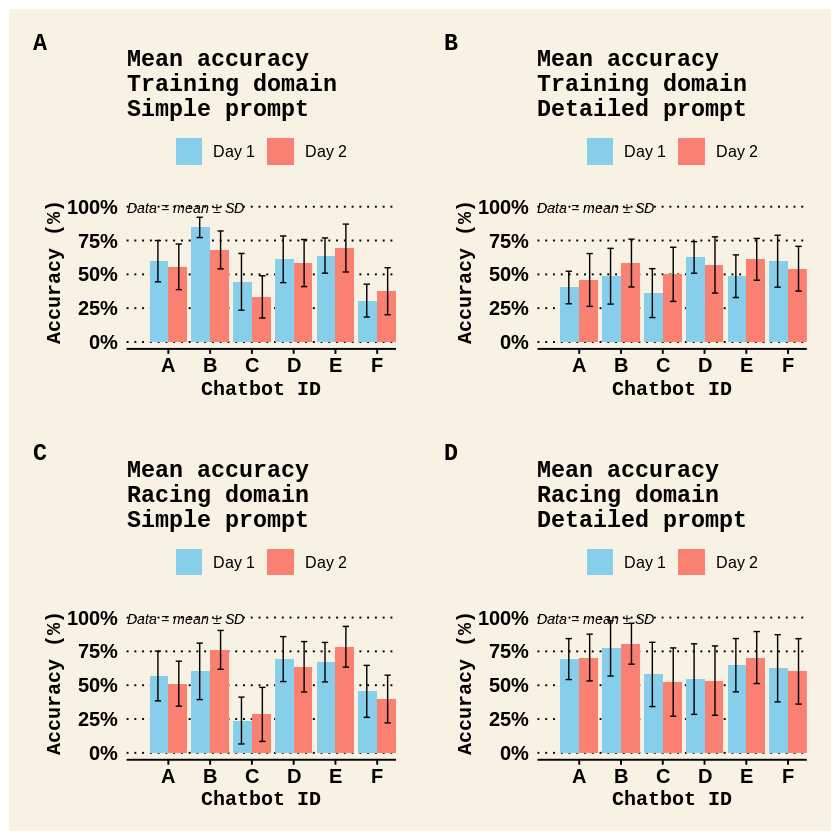

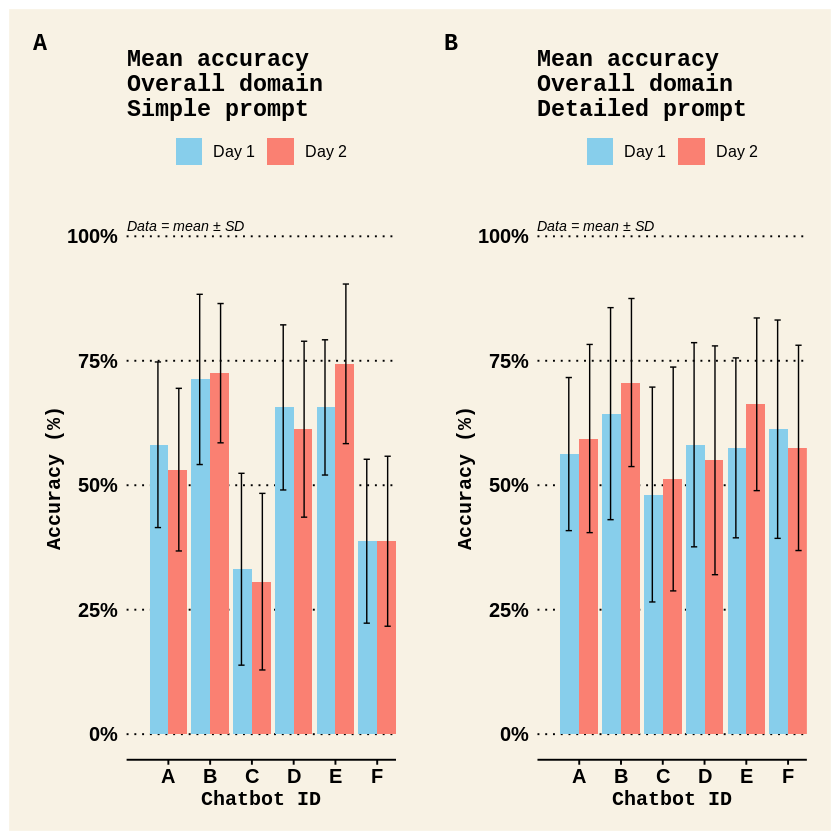

In [113]:
# ACCURACY (mean of Percentage scores) for Simple and Detailed prompts
wrap_plots(MeanAccuracySimpleTrainingPC, MeanAccuracyDetailedTrainingPC, MeanAccuracySimpleRacingPC, MeanAccuracyDetailedRacingPC, ncol = 2, nrow = 2, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

wrap_plots(MeanAccuracySimpleOverallPC, MeanAccuracyDetailedOverallPC, ncol = 2, nrow = 1, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

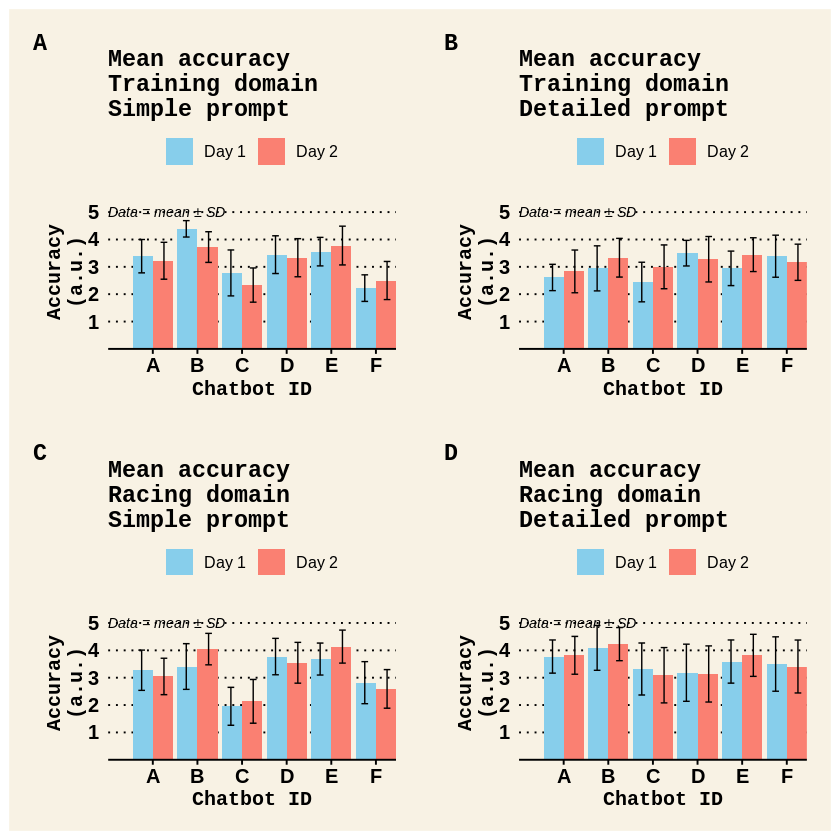

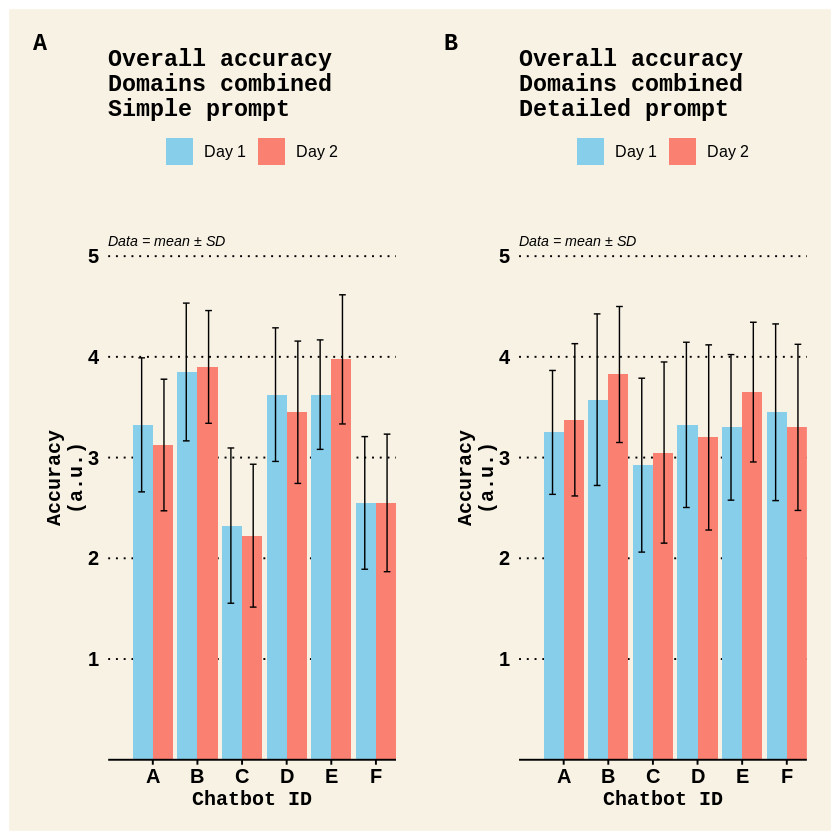

In [114]:
# ACCURACY (mean of Likert scores) for Simple and Detailed prompts
wrap_plots(MeanAccuracySimpleTraining, MeanAccuracyDetailedTraining, MeanAccuracySimpleRacing, MeanAccuracyDetailedRacing, ncol = 2, nrow = 2, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

wrap_plots(MeanAccuracySimpleOverall, MeanAccuracyDetailedOverall, ncol = 2, nrow = 1, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

### Completeness

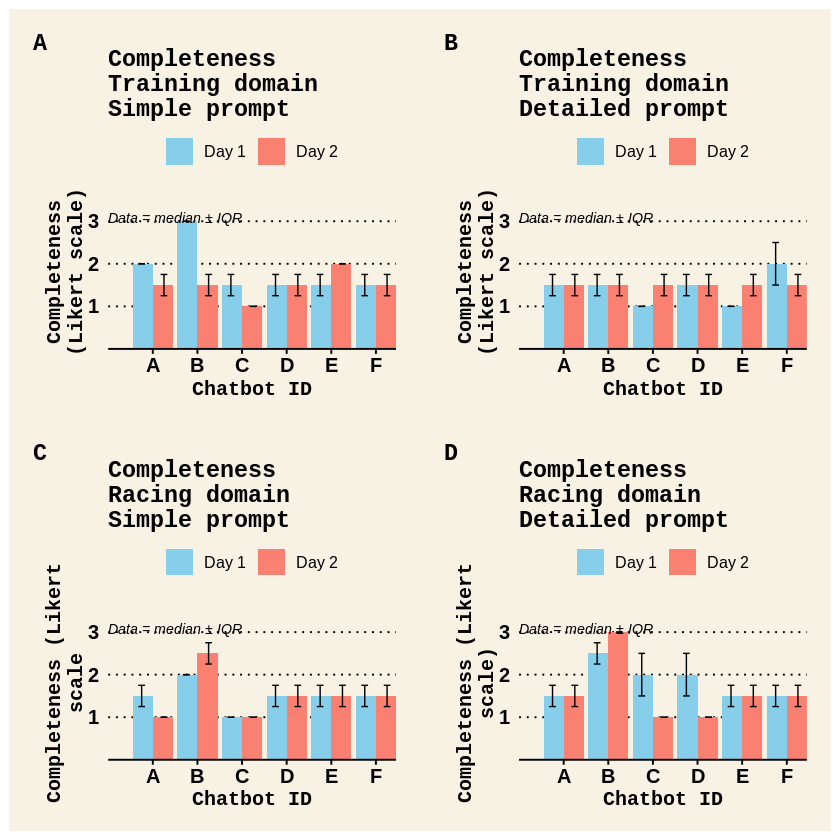

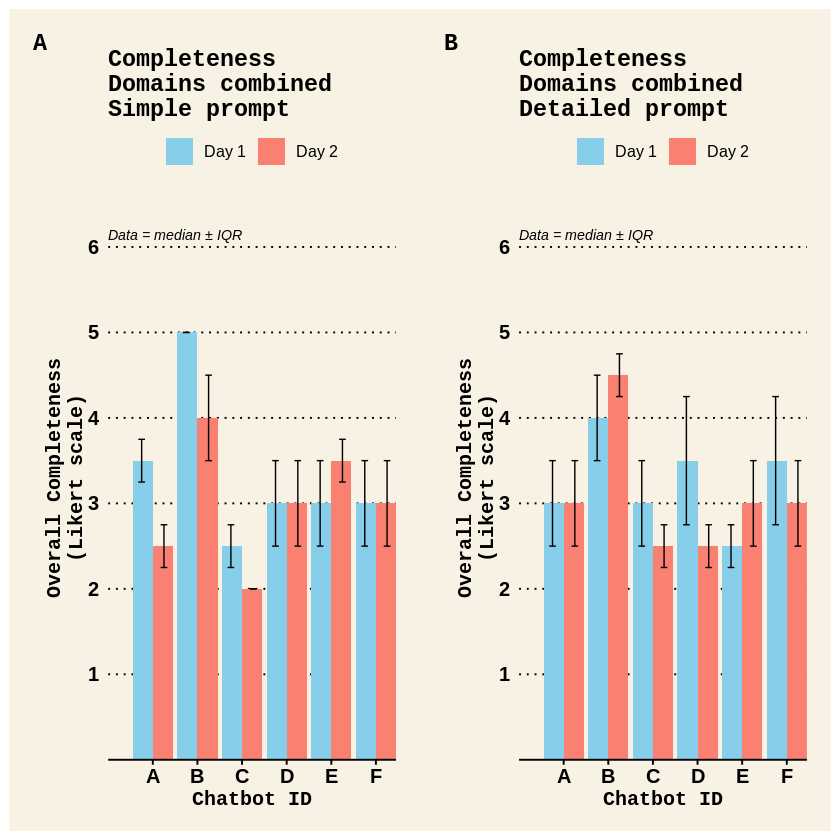

In [115]:
# COMPLETENESS (Likert scores) for Simple and Detailed prompts
wrap_plots(CompletenessSimpleTrainingLikert, CompletenessDetailedTrainingLikert, CompletenessSimpleRacingLikert, CompletenessDetailedRacingLikert, ncol = 2, nrow = 2, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

wrap_plots(CompletenessSimpleCombinedLikert, CompletenessDetailedCombinedLikert, ncol = 2, nrow = 1, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

### Clarity

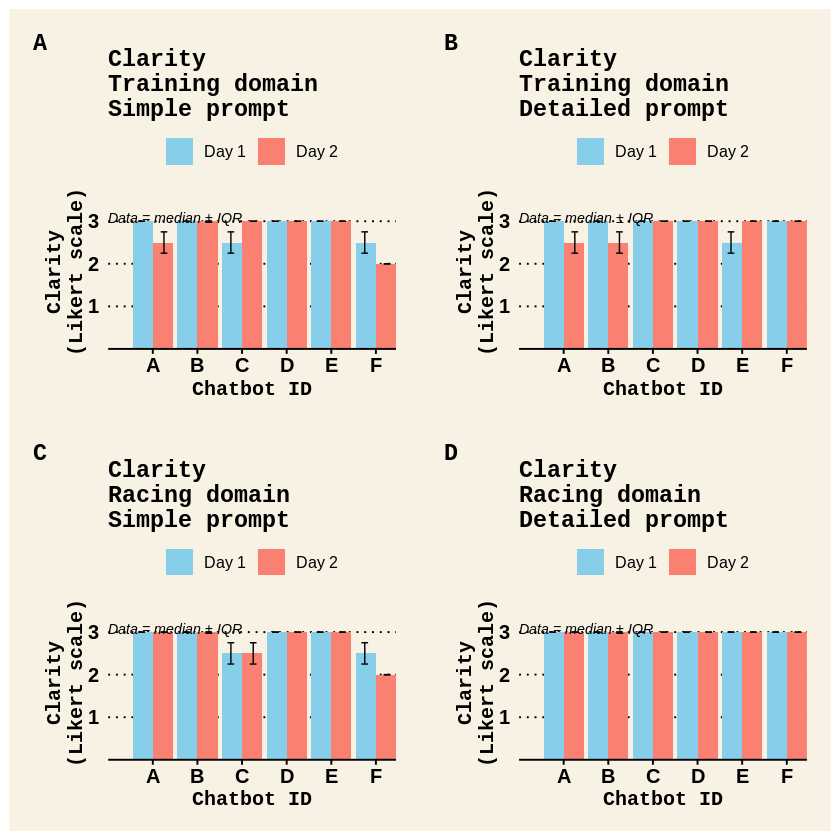

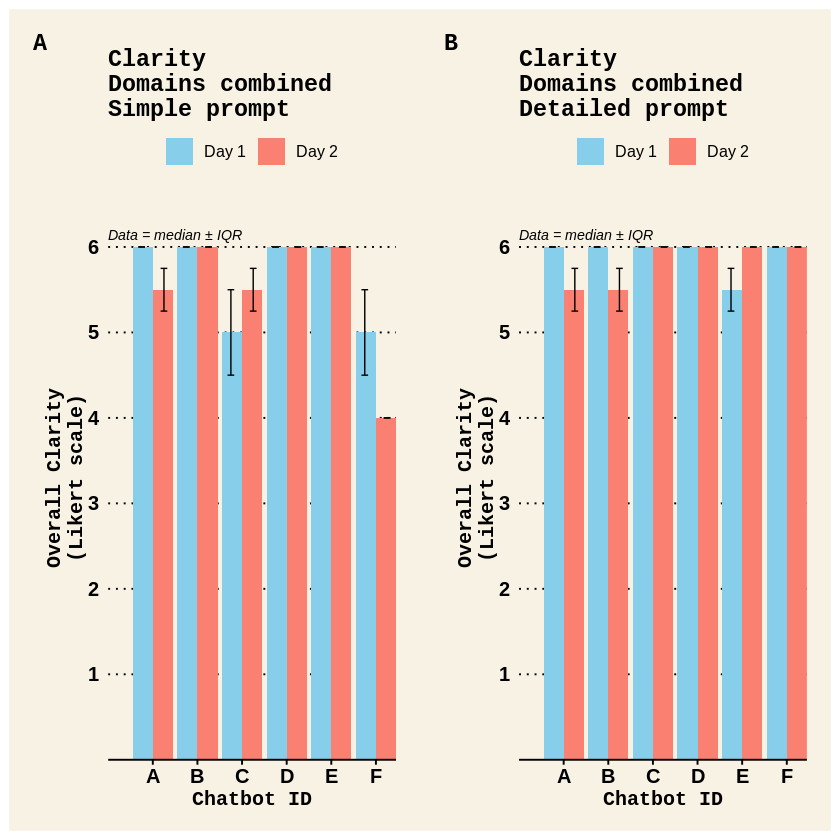

In [116]:
# CLARITY (Likert scores) for Simple and Detailed prompts
wrap_plots(ClaritySimpleTrainingLikert, ClarityDetailedTrainingLikert, ClaritySimpleRacingLikert, ClarityDetailedRacingLikert, ncol = 2, nrow = 2, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

wrap_plots(ClaritySimpleCombinedLikert, ClarityDetailedCombinedLikert, ncol = 2, nrow = 1, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

### Quality of evidence

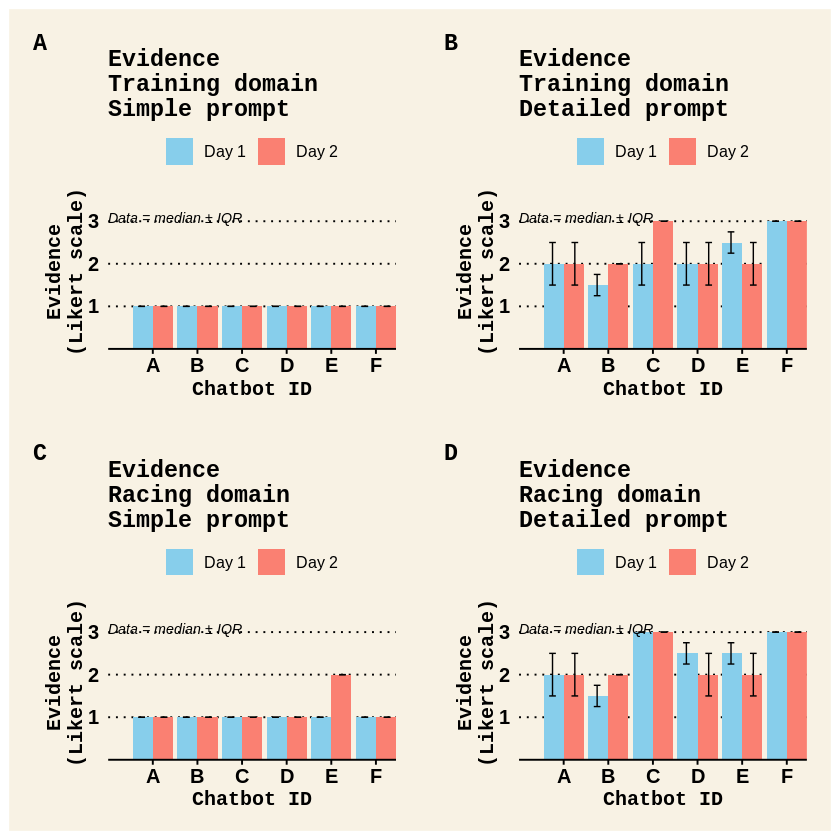

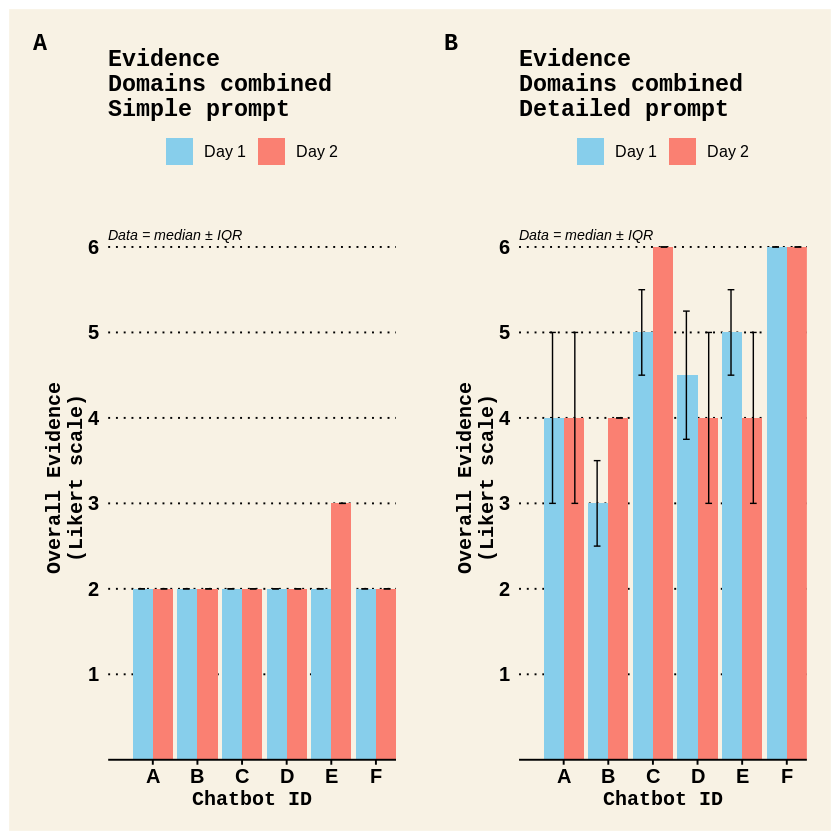

In [117]:
# EVIDENCE (Likert scores) for Simple and Detailed prompts
wrap_plots(EvidenceSimpleTrainingLikert, EvidenceDetailedTrainingLikert, EvidenceSimpleRacingLikert, EvidenceDetailedRacingLikert, ncol = 2, nrow = 2, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

wrap_plots(EvidenceSimpleCombinedLikert, EvidenceDetailedCombinedLikert, ncol = 2, nrow = 1, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

### Additional info quality

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_col()`).”


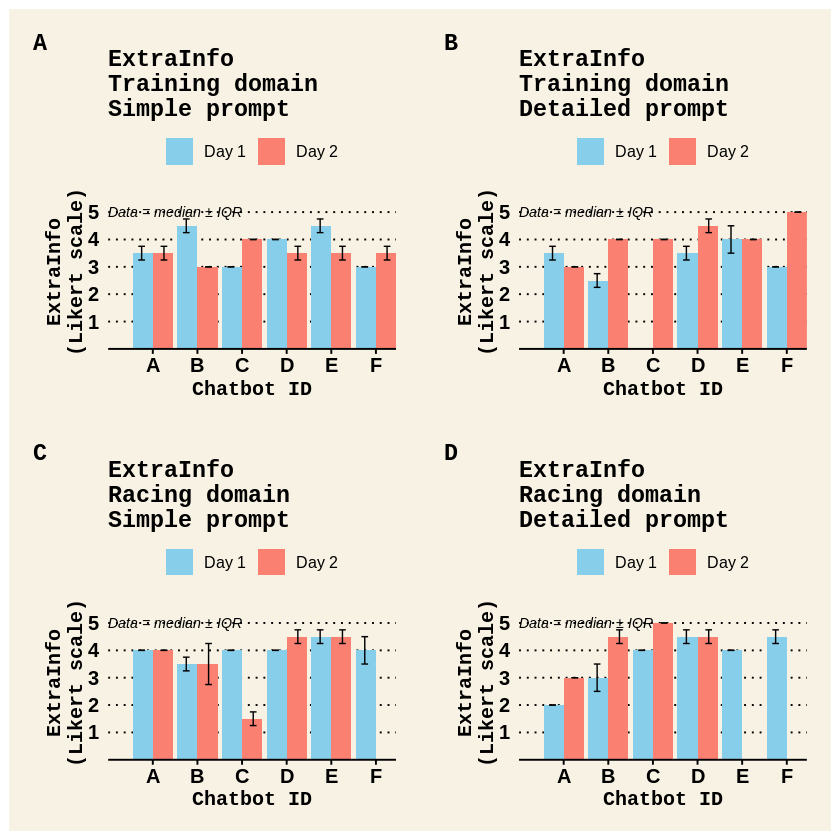

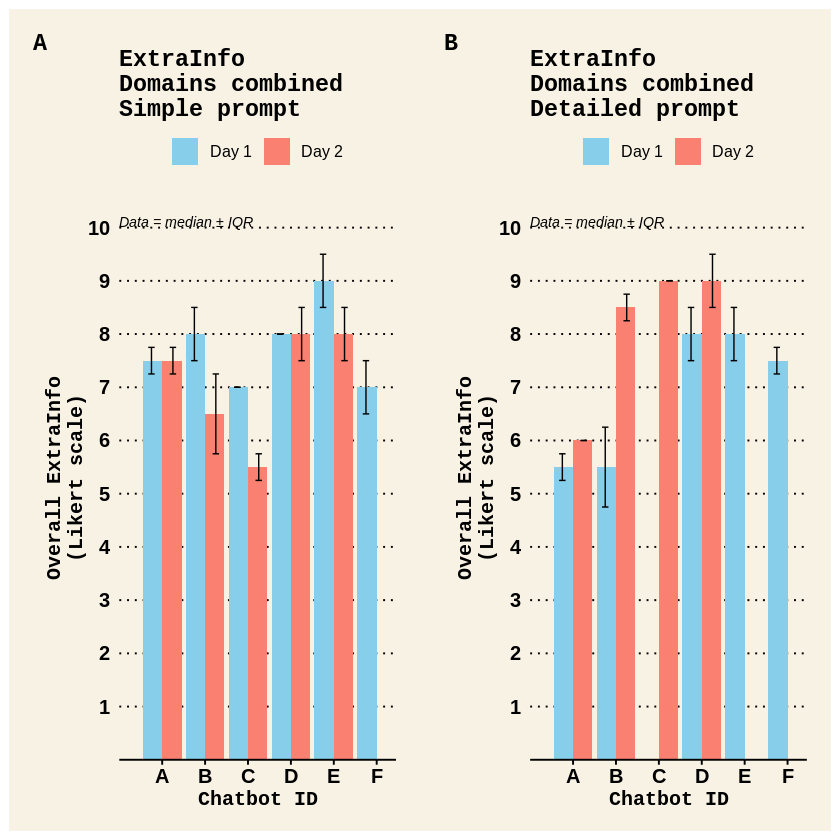

In [118]:
# ADDITIONAL INFO (Likert scores) for Simple and Detailed prompts
wrap_plots(ExtraInfoSimpleTrainingLikert, ExtraInfoDetailedTrainingLikert, ExtraInfoSimpleRacingLikert, ExtraInfoDetailedRacingLikert, ncol = 2, nrow = 2, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

wrap_plots(ExtraInfoSimpleCombinedLikert, ExtraInfoDetailedCombinedLikert, ncol = 2, nrow = 1, widths = c(1, 1), heights = c(0.75, 0.75)) +
    plot_annotation(tag_levels = "A") &  # Use the `&` operator to apply globally
    theme(plot.tag = element_text(size = 14, face = "bold"))  # Customize font size and style

Note that the missing data in the plots above is because that specific chatbot provided no additional information.

## Statistical analyses

<p>Data collected on completeness, clarity, evidence quality, and additional info quality were made on a single observation. Consequently, only observational interpretations can be made.</p>
<p>On the contrary, the accuracy data is the mean of 9 criterion for Training and 11 criterion for Racing, therefore statistical analyses can be used to examine whether accuracy for Training, racing, and Combined is influenced by ChatbotID or TestDay and whether accuracy produced by a Detailed prompt is different from that of a Simple prompt.</p>

### Accuracy

#### Test for normality (Shapiro-Wilks test).

In [119]:
# Extract criterion columns
Experiment1_Analysis_Accuracysubset <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, starts_with("SimplePrompt_Training_Accuracy_") & ends_with("_Median"), starts_with("SimplePrompt_Racing_Accuracy_") & ends_with("_Median"), starts_with("DetailedPrompt_Training_Accuracy_") & ends_with("_Median"), starts_with("DetailedPrompt_Racing_Accuracy_") & ends_with("_Median"))
cat("Experiment1_Analysis_Accuracysubset:\n")
Experiment1_Analysis_Accuracysubset

Experiment1_Analysis_Accuracysubset:


ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median,DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median,DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median,DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median,DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median,DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median,DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median,DetailedPrompt_Racing_Accuracy_Supplements_Median,DetailedPrompt_Racing_Accuracy_Individualization_Median,DetailedPrompt_Racing_Accuracy_Disclaimer_Median
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,1.0,2.5,4.5,2.5,3.0,4.0,4.0,4.5,⋯,5,3.0,4.0,4.0,5,4.0,2.5,1.0,4.0,5
ChatbotB,Test1,3.5,4.0,5.0,4.0,5.0,4.0,4.0,5.0,⋯,5,5.0,5.0,5.0,5,5.0,3.0,1.0,5.0,1
ChatbotC,Test1,1.0,4.5,4.0,1.5,1.5,4.5,2.0,5.0,⋯,5,5.0,5.0,4.0,5,3.5,1.0,1.0,1.0,1
ChatbotD,Test1,1.5,4.5,5.0,2.0,2.0,4.5,3.5,5.0,⋯,5,5.0,5.0,5.0,5,1.0,1.0,1.0,1.0,1
ChatbotE,Test1,2.5,4.0,5.0,3.5,3.0,3.0,2.0,4.0,⋯,5,4.5,5.0,4.0,5,1.5,3.0,1.5,5.0,1
ChatbotF,Test1,2.5,3.5,3.5,2.0,2.0,3.0,1.0,1.5,⋯,5,5.0,5.0,5.0,5,1.0,1.0,1.0,4.5,1
ChatbotA,Test2,1.0,4.0,4.5,2.5,2.5,3.0,2.0,4.5,⋯,5,4.5,4.5,4.0,5,1.5,3.5,1.0,4.5,5
ChatbotB,Test2,4.5,5.0,5.0,3.5,3.5,4.0,4.0,2.0,⋯,5,5.0,5.0,4.5,5,3.5,3.5,5.0,4.5,1
ChatbotC,Test2,1.0,4.0,4.0,3.0,3.0,2.5,1.5,1.0,⋯,5,5.0,5.0,4.0,5,1.0,1.0,1.0,1.0,1


In [120]:
# Subset only the columns with 'SimplePrompt_Training_Accuracy_'
dataforNormality <- Experiment1_Analysis_Accuracysubset %>%
  select(ends_with("_Median"))

# Apply Shapiro-Wilk test for normality across rows
normality_test <- apply(dataforNormality, 1, function(row) {
  # Apply Shapiro-Wilk test on the row, excluding NA values
  normality_test_result <- shapiro.test(row[!is.na(row)])

  # Create a string summarizing the test results and interpretation
  normality_test_interpretation <- if (normality_test_result$p.value < 0.05) {
    "Data not normally distributed (reject H0 and log-transform before analysis)"
  } else {
    "Data is normally distributed (fail to reject H0)"
  }

  # Return a formatted string with the Shapiro-Wilk test statistic, p-value, and interpretation
  paste(
    "Shapiro-Wilk test statistic:", round(normality_test_result$statistic, 3),
    "| p-value:", format(normality_test_result$p.value, scientific = TRUE),
    "| Interpretation:", normality_test_interpretation
  )
})

# Print the results
cat("Shapiro-Wilk test results (per row / per Chatbot):\n\n")
cat(paste(normality_test, collapse = "\n"), "\n")

Shapiro-Wilk test results (per row / per Chatbot):

Shapiro-Wilk test statistic: 0.917 | p-value: 6.141334e-03 | Interpretation: Data not normally distributed (reject H0 and log-transform before analysis)
Shapiro-Wilk test statistic: 0.772 | p-value: 1.8855e-06 | Interpretation: Data not normally distributed (reject H0 and log-transform before analysis)
Shapiro-Wilk test statistic: 0.806 | p-value: 9.008859e-06 | Interpretation: Data not normally distributed (reject H0 and log-transform before analysis)
Shapiro-Wilk test statistic: 0.854 | p-value: 1.098078e-04 | Interpretation: Data not normally distributed (reject H0 and log-transform before analysis)
Shapiro-Wilk test statistic: 0.902 | p-value: 2.116809e-03 | Interpretation: Data not normally distributed (reject H0 and log-transform before analysis)
Shapiro-Wilk test statistic: 0.848 | p-value: 8.163784e-05 | Interpretation: Data not normally distributed (reject H0 and log-transform before analysis)
Shapiro-Wilk test statistic: 0.8

#### Test for homogeneity of variance (Bartlett's test).

In [121]:
# Subset only the columns with 'SimplePrompt_Training_Accuracy_'
dataforHeterogeneity <- Experiment1_Analysis_Accuracysubset %>%
  select(ends_with("_Median"))
# Apply Bartlett test for heterogeneity across columns (across groups) instead of rows
heterogeneity_test <- bartlett.test(dataforHeterogeneity) # Apply to the columns directly
# Interpret the result based on p-value
if(heterogeneity_test$p.value < 0.05) {
  heterogeneity_test_interpretation <- "Data is heteroscedastic, i.e. unequal variances across groups (reject H0)" #Assign the result to a variable
} else {
  heterogeneity_test_interpretation <- "Data has equal variances aross groups (fail to reject H0)" #Assign the result to a variable
}

# Print the result and interpretation
cat("Bartlett test results (across rows/across groups):\n\n")
heterogeneity_test
cat("\nInterpretation:", heterogeneity_test_interpretation, "\n")

Bartlett test results (across rows/across groups):




	Bartlett test of homogeneity of variances

data:  dataforHeterogeneity
Bartlett's K-squared = Inf, df = 39, p-value < 2.2e-16



Interpretation: Data is heteroscedastic, i.e. unequal variances across groups (reject H0) 


Due to the presence of non-normally distributed data and the presence of unequal variances across groups, the data will be log-transformed before statistical analysis.

In [122]:
cat("\n\n Experiment1_Analysis_Accuracysubset \n")
str(Experiment1_Analysis_Accuracysubset)



 Experiment1_Analysis_Accuracysubset 
'data.frame':	12 obs. of  42 variables:
 $ ChatbotID                                                  : chr  "ChatbotA" "ChatbotB" "ChatbotC" "ChatbotD" ...
 $ TestDay                                                    : chr  "Test1" "Test1" "Test1" "Test1" ...
 $ SimplePrompt_Training_Accuracy_EnergyAvailability_Median   : num  1 3.5 1 1.5 2.5 2.5 1 4.5 1 1.5 ...
 $ SimplePrompt_Training_Accuracy_DailyCarbIntake_Median      : num  2.5 4 4.5 4.5 4 3.5 4 5 4 4 ...
 $ SimplePrompt_Training_Accuracy_DailyProtein_Median         : num  4.5 5 4 5 5 3.5 4.5 5 4 5 ...
 $ SimplePrompt_Training_Accuracy_PostSessionCarbs_Median     : num  2.5 4 1.5 2 3.5 2 2.5 3.5 3 3 ...
 $ SimplePrompt_Training_Accuracy_PostSessionProtein_Median   : num  3 5 1.5 2 3 2 2.5 3.5 3 3 ...
 $ SimplePrompt_Training_Accuracy_Hydration_Median            : num  4 4 4.5 4.5 3 3 3 4 2.5 3.5 ...
 $ SimplePrompt_Training_Accuracy_Supplements_Median          : num  4 4 2 3.5 2 1 2 4 1.5

In [123]:
# Natural log-transform the dataframes to create a new dataframe
# Create a new dataframes for the transformed data
Experiment1_Analysis_AccuracysubsetLOG <- Experiment1_Analysis_Accuracysubset

# Apply the natural log transformation to all numeric columns except ChatbotID and TestDay
Experiment1_Analysis_AccuracysubsetLOG <- Experiment1_Analysis_AccuracysubsetLOG %>%
  mutate(across(
    where(is.numeric),  # Apply to numeric columns except these two
    \(x) log(x)         # Use an anonymous function to apply the natural log transformation
  ))

# Print the new df
cat("\n\n Log-transformed Accuracy data:\n")
Experiment1_Analysis_AccuracysubsetLOG



 Log-transformed Accuracy data:


ChatbotID,TestDay,SimplePrompt_Training_Accuracy_EnergyAvailability_Median,SimplePrompt_Training_Accuracy_DailyCarbIntake_Median,SimplePrompt_Training_Accuracy_DailyProtein_Median,SimplePrompt_Training_Accuracy_PostSessionCarbs_Median,SimplePrompt_Training_Accuracy_PostSessionProtein_Median,SimplePrompt_Training_Accuracy_Hydration_Median,SimplePrompt_Training_Accuracy_Supplements_Median,SimplePrompt_Training_Accuracy_Individualization_Median,⋯,DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median,DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_Median,DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_Median,DetailedPrompt_Racing_Accuracy_CarbsDuringRace_Median,DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_Median,DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_Median,DetailedPrompt_Racing_Accuracy_HydrationDuringRace_Median,DetailedPrompt_Racing_Accuracy_Supplements_Median,DetailedPrompt_Racing_Accuracy_Individualization_Median,DetailedPrompt_Racing_Accuracy_Disclaimer_Median
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ChatbotA,Test1,0.0000000,0.9162907,1.504077,0.9162907,1.0986123,1.3862944,1.3862944,1.5040774,⋯,1.609438,1.098612,1.386294,1.386294,1.609438,1.3862944,0.9162907,0.0000000,1.386294,1.609438
ChatbotB,Test1,1.2527630,1.3862944,1.609438,1.3862944,1.6094379,1.3862944,1.3862944,1.6094379,⋯,1.609438,1.609438,1.609438,1.609438,1.609438,1.6094379,1.0986123,0.0000000,1.609438,0.000000
ChatbotC,Test1,0.0000000,1.5040774,1.386294,0.4054651,0.4054651,1.5040774,0.6931472,1.6094379,⋯,1.609438,1.609438,1.609438,1.386294,1.609438,1.2527630,0.0000000,0.0000000,0.000000,0.000000
ChatbotD,Test1,0.4054651,1.5040774,1.609438,0.6931472,0.6931472,1.5040774,1.2527630,1.6094379,⋯,1.609438,1.609438,1.609438,1.609438,1.609438,0.0000000,0.0000000,0.0000000,0.000000,0.000000
ChatbotE,Test1,0.9162907,1.3862944,1.609438,1.2527630,1.0986123,1.0986123,0.6931472,1.3862944,⋯,1.609438,1.504077,1.609438,1.386294,1.609438,0.4054651,1.0986123,0.4054651,1.609438,0.000000
ChatbotF,Test1,0.9162907,1.2527630,1.252763,0.6931472,0.6931472,1.0986123,0.0000000,0.4054651,⋯,1.609438,1.609438,1.609438,1.609438,1.609438,0.0000000,0.0000000,0.0000000,1.504077,0.000000
ChatbotA,Test2,0.0000000,1.3862944,1.504077,0.9162907,0.9162907,1.0986123,0.6931472,1.5040774,⋯,1.609438,1.504077,1.504077,1.386294,1.609438,0.4054651,1.2527630,0.0000000,1.504077,1.609438
ChatbotB,Test2,1.5040774,1.6094379,1.609438,1.2527630,1.2527630,1.3862944,1.3862944,0.6931472,⋯,1.609438,1.609438,1.609438,1.504077,1.609438,1.2527630,1.2527630,1.6094379,1.504077,0.000000
ChatbotC,Test2,0.0000000,1.3862944,1.386294,1.0986123,1.0986123,0.9162907,0.4054651,0.0000000,⋯,1.609438,1.609438,1.609438,1.386294,1.609438,0.0000000,0.0000000,0.0000000,0.000000,0.000000


#### Prepare the data for statistical analysis

In [124]:
# For LMMs and ANOVAs, I need the data in the long format.
# Stack the accuracy score columns into a single column called Accuracy_score
# Add a new column called Criteria, numbered from 1 to 40
# Add a new column called Domain with 2 levels (Training, Racing)
# Add a new column called Prompt_type with 2 levels (SimplePrompt, DetailedPrompt).
# Transpose the numeric columns
Experiment1_forLMM <- Experiment1_Analysis_AccuracysubsetLOG %>%
  pivot_longer(
    cols = -c(ChatbotID, TestDay),
    names_to = "Original_Column",
    values_to = "Accuracy_score"
  ) %>%
  # Add the Criteria column
  mutate(Criteria = as.numeric(factor(Original_Column, levels = unique(Original_Column))),
         # Add the Prompt_type column
         Prompt_type = ifelse(grepl("SimplePrompt", Original_Column), "SimplePrompt", "DetailedPrompt"),
         # Add the Domain column
         Domain = ifelse(grepl("Training", Original_Column), "Training", "Racing")) %>%
  # Optional: Drop Original_Column if not needed
  select(-Original_Column)
# View the new dataframe
cat("\n\n Log-transformed Accuracy data in long format for Linear mixed modeling:\n")
Experiment1_forLMM



 Log-transformed Accuracy data in long format for Linear mixed modeling:


ChatbotID,TestDay,Accuracy_score,Criteria,Prompt_type,Domain
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
ChatbotA,Test1,0.0000000,1,SimplePrompt,Training
ChatbotA,Test1,0.9162907,2,SimplePrompt,Training
ChatbotA,Test1,1.5040774,3,SimplePrompt,Training
ChatbotA,Test1,0.9162907,4,SimplePrompt,Training
ChatbotA,Test1,1.0986123,5,SimplePrompt,Training
ChatbotA,Test1,1.3862944,6,SimplePrompt,Training
ChatbotA,Test1,1.3862944,7,SimplePrompt,Training
ChatbotA,Test1,1.5040774,8,SimplePrompt,Training
ChatbotA,Test1,1.5040774,9,SimplePrompt,Training


In [125]:
# Cross-check some values to ensure the df transformation is correct
# From the original dataframe
original_value1 <- Experiment1_Analysis_AccuracysubsetLOG %>%
  filter(ChatbotID == "ChatbotA", TestDay == "Test1") %>%
  select(SimplePrompt_Training_Accuracy_EnergyAvailability_Median)
# From the transformed dataframe
transformed_value1 <- Experiment1_forLMM %>%
  filter(ChatbotID == "ChatbotA", TestDay == "Test1", Criteria == 1) %>%
  select(Accuracy_score)
# From the original dataframe
original_value2 <- Experiment1_Analysis_AccuracysubsetLOG %>%
  filter(ChatbotID == "ChatbotB", TestDay == "Test1") %>%
  select(SimplePrompt_Training_Accuracy_EnergyAvailability_Median)
# From the transformed dataframe
transformed_value2 <- Experiment1_forLMM %>%
  filter(ChatbotID == "ChatbotB", TestDay == "Test1", Criteria == 1) %>%
  select(Accuracy_score)
# Print the values to compare
cat("\n\n Original value 1: ")
original_value1
cat("Transformed value 1: ")
transformed_value1
cat("\n\n Original value 2: ")
original_value2
cat("Transformed value 2: ")
transformed_value2



 Original value 1: 

SimplePrompt_Training_Accuracy_EnergyAvailability_Median
<dbl>
0


Transformed value 1: 

Accuracy_score
<dbl>
0




 Original value 2: 

SimplePrompt_Training_Accuracy_EnergyAvailability_Median
<dbl>
1.252763


Transformed value 2: 

Accuracy_score
<dbl>
1.252763


In [126]:
# Create a data frame mapping Criteria numbers to original column names
criteria_mapping <- data.frame(
  Criteria = seq_along(names(Experiment1_Analysis_AccuracysubsetLOG)[-(1:2)]),  # Exclude ChatbotID and TestDay
  Original_Column = names(Experiment1_Analysis_AccuracysubsetLOG)[-(1:2)]
)

# Print the criteria mapping
print(criteria_mapping)

   Criteria                                             Original_Column
1         1    SimplePrompt_Training_Accuracy_EnergyAvailability_Median
2         2       SimplePrompt_Training_Accuracy_DailyCarbIntake_Median
3         3          SimplePrompt_Training_Accuracy_DailyProtein_Median
4         4      SimplePrompt_Training_Accuracy_PostSessionCarbs_Median
5         5    SimplePrompt_Training_Accuracy_PostSessionProtein_Median
6         6             SimplePrompt_Training_Accuracy_Hydration_Median
7         7           SimplePrompt_Training_Accuracy_Supplements_Median
8         8     SimplePrompt_Training_Accuracy_Individualization_Median
9         9            SimplePrompt_Training_Accuracy_Disclaimer_Median
10       10         SimplePrompt_Racing_Accuracy_CarbsDaysBefore_Median
11       11    SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_Median
12       12        SimplePrompt_Racing_Accuracy_CarbsHoursBefore_Median
13       13   SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods

In [127]:
# Assuming 'Criteria' column in Experiment1_forLMM is a factor with levels 1 to 40
# Convert 'Criteria' to numeric
Experiment1_forLMM$Criteria <- as.numeric(as.character(Experiment1_forLMM$Criteria))

# Now, re-assign values 21 to 40 as 1 to 20
Experiment1_forLMM$Criteria[Experiment1_forLMM$Criteria %in% 21:40] <- Experiment1_forLMM$Criteria[Experiment1_forLMM$Criteria %in% 21:40] - 20

# If you need 'Criteria' as a factor again:
Experiment1_forLMM$Criteria <- factor(Experiment1_forLMM$Criteria)

# Check the updated levels to confirm the change
levels(Experiment1_forLMM$Criteria)

[1] "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14" "15"
[16] "16" "17" "18" "19" "20"

In [128]:
# Check the updated levels in the df
Experiment1_forLMM

ChatbotID,TestDay,Accuracy_score,Criteria,Prompt_type,Domain
<chr>,<chr>,<dbl>,<fct>,<chr>,<chr>
ChatbotA,Test1,0.0000000,1,SimplePrompt,Training
ChatbotA,Test1,0.9162907,2,SimplePrompt,Training
ChatbotA,Test1,1.5040774,3,SimplePrompt,Training
ChatbotA,Test1,0.9162907,4,SimplePrompt,Training
ChatbotA,Test1,1.0986123,5,SimplePrompt,Training
ChatbotA,Test1,1.3862944,6,SimplePrompt,Training
ChatbotA,Test1,1.3862944,7,SimplePrompt,Training
ChatbotA,Test1,1.5040774,8,SimplePrompt,Training
ChatbotA,Test1,1.5040774,9,SimplePrompt,Training


In [129]:
# Convert the specified columns to factors
Experiment1_forLMM$ChatbotID <- as.factor(Experiment1_forLMM$ChatbotID)
Experiment1_forLMM$TestDay <- as.factor(Experiment1_forLMM$TestDay)
Experiment1_forLMM$Domain <- as.factor(Experiment1_forLMM$Domain)
Experiment1_forLMM$Prompt_type <- as.factor(Experiment1_forLMM$Prompt_type)
Experiment1_forLMM$Criteria <- as.factor(Experiment1_forLMM$Criteria)

# Check the structure to confirm the conversion
str(Experiment1_forLMM)

tibble [480 × 6] (S3: tbl_df/tbl/data.frame)
 $ ChatbotID     : Factor w/ 6 levels "ChatbotA","ChatbotB",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ TestDay       : Factor w/ 2 levels "Test1","Test2": 1 1 1 1 1 1 1 1 1 1 ...
 $ Accuracy_score: num [1:480] 0 0.916 1.504 0.916 1.099 ...
 $ Criteria      : Factor w/ 20 levels "1","2","3","4",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Prompt_type   : Factor w/ 2 levels "DetailedPrompt",..: 2 2 2 2 2 2 2 2 2 2 ...
 $ Domain        : Factor w/ 2 levels "Racing","Training": 2 2 2 2 2 2 2 2 2 1 ...


##### ANOVA

In [130]:
# Install and load the rstatix package
install.packages("rstatix")
library(rstatix)
install.packages("effectsize")
library(effectsize)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘rstatix’


The following objects are masked from ‘package:infer’:

    chisq_test, prop_test, t_test


The following object is masked from ‘package:stats’:

    filter


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘bayestestR’, ‘insight’, ‘parameters’, ‘performance’, ‘datawizard’



Attaching package: ‘effectsize’


The following objects are masked from ‘package:rstatix’:

    cohens_d, eta_squared




In [131]:
# Run an ANOVA using aov()
anova_model <- aov(Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type, data = Experiment1_forLMM)

# Print ANOVA summary
cat("\n ANOVA model \n")
summary(anova_model)


 ANOVA model 


                                      Df Sum Sq Mean Sq F value   Pr(>F)    
ChatbotID                              5  13.30  2.6606   7.659 6.52e-07 ***
TestDay                                1   0.00  0.0038   0.011   0.9169    
Domain                                 1   0.06  0.0629   0.181   0.6707    
Prompt_type                            1   0.04  0.0437   0.126   0.7230    
ChatbotID:TestDay                      5   0.52  0.1043   0.300   0.9127    
ChatbotID:Domain                       5   0.87  0.1737   0.500   0.7763    
TestDay:Domain                         1   0.02  0.0215   0.062   0.8035    
ChatbotID:Prompt_type                  5   3.64  0.7275   2.094   0.0651 .  
TestDay:Prompt_type                    1   0.03  0.0303   0.087   0.7680    
Domain:Prompt_type                     1   0.58  0.5788   1.666   0.1975    
ChatbotID:TestDay:Domain               5   0.25  0.0492   0.142   0.9824    
ChatbotID:TestDay:Prompt_type          5   0.04  0.0078   0.022   0.9998    

###### Posthoc and effect sizes

In [132]:
# Install packages for multiple comparisons
install.packages("emmeans")
library(emmeans)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘estimability’, ‘mvtnorm’


Welcome to emmeans.
Caution: You lose important information if you filter this package's results.
See '? untidy'



In [133]:
# Compute partial eta-squared
eta_squared_results <- eta_squared(anova_model)
# View the results
cat("\n\n Partial eta-squared \n")
print(eta_squared_results)



 Partial eta-squared 
# Effect Size for ANOVA (Type I)

Parameter                            | Eta2 (partial) |       95% CI
--------------------------------------------------------------------
ChatbotID                            |           0.08 | [0.04, 1.00]
TestDay                              |       2.52e-05 | [0.00, 1.00]
Domain                               |       4.19e-04 | [0.00, 1.00]
Prompt_type                          |       2.91e-04 | [0.00, 1.00]
ChatbotID:TestDay                    |       3.46e-03 | [0.00, 1.00]
ChatbotID:Domain                     |       5.75e-03 | [0.00, 1.00]
TestDay:Domain                       |       1.43e-04 | [0.00, 1.00]
ChatbotID:Prompt_type                |           0.02 | [0.00, 1.00]
TestDay:Prompt_type                  |       2.02e-04 | [0.00, 1.00]
Domain:Prompt_type                   |       3.84e-03 | [0.00, 1.00]
ChatbotID:TestDay:Domain             |       1.64e-03 | [0.00, 1.00]
ChatbotID:TestDay:Prompt_type        |       

In [134]:
# Pairwise comparisons for ChatbotID (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons).
posthoc_ChatbotID <- emmeans(anova_model, pairwise ~ ChatbotID)
cat("\n\n Pairwise comparisons for ChatbotID \n")
print(posthoc_ChatbotID)
# Compute effect size for the pairwise contrasts. NOTE: default for eff_size is Cohen's d
ChatbotID_effect_size <- eff_size(posthoc_ChatbotID, sigma = sigma(anova_model), edf = df.residual(anova_model)) # Pass sigma and edf to eff_size()
cat("\n\n Cohen's d effect sizes for ChatbotID comparisons \n")
print(ChatbotID_effect_size)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons for ChatbotID 
$emmeans
 ChatbotID emmean     SE  df lower.CL upper.CL
 ChatbotA   1.068 0.0662 432    0.938    1.198
 ChatbotB   1.223 0.0662 432    1.093    1.354
 ChatbotC   0.754 0.0662 432    0.624    0.884
 ChatbotD   1.078 0.0662 432    0.948    1.208
 ChatbotE   1.197 0.0662 432    1.067    1.327
 ChatbotF   0.901 0.0662 432    0.771    1.032

Results are averaged over the levels of: TestDay, Domain, Prompt_type 
Confidence level used: 0.95 

$contrasts
 contrast            estimate     SE  df t.ratio p.value
 ChatbotA - ChatbotB -0.15569 0.0937 432  -1.662  0.5576
 ChatbotA - ChatbotC  0.31365 0.0937 432   3.349  0.0113
 ChatbotA - ChatbotD -0.00999 0.0937 432  -0.107  1.0000
 ChatbotA - ChatbotE -0.12945 0.0937 432  -1.382  0.7378
 ChatbotA - ChatbotF  0.16633 0.0937 432   1.776  0.4825
 ChatbotB - ChatbotC  0.46934 0.0937 432   5.011  <.0001
 ChatbotB - ChatbotD  0.14570 0.0937 432   1.556  0.6283
 ChatbotB - ChatbotE  0.02624 0.0937 432   0.280  0.99

Since 'object' is a list, we are using the contrasts already present.





 Cohen's d effect sizes for ChatbotID comparisons 
 contrast              effect.size    SE  df lower.CL upper.CL
 (ChatbotA - ChatbotB)     -0.2641 0.159 432  -0.5770   0.0487
 (ChatbotA - ChatbotC)      0.5321 0.160 432   0.2178   0.8465
 (ChatbotA - ChatbotD)     -0.0169 0.159 432  -0.3293   0.2954
 (ChatbotA - ChatbotE)     -0.2196 0.159 432  -0.5323   0.0930
 (ChatbotA - ChatbotF)      0.2822 0.159 432  -0.0307   0.5951
 (ChatbotB - ChatbotC)      0.7963 0.161 432   0.4794   1.1131
 (ChatbotB - ChatbotD)      0.2472 0.159 432  -0.0656   0.5600
 (ChatbotB - ChatbotE)      0.0445 0.159 432  -0.2678   0.3569
 (ChatbotB - ChatbotF)      0.5464 0.160 432   0.2319   0.8608
 (ChatbotC - ChatbotD)     -0.5491 0.160 432  -0.8636  -0.2346
 (ChatbotC - ChatbotE)     -0.7518 0.161 432  -1.0681  -0.4354
 (ChatbotC - ChatbotF)     -0.2499 0.159 432  -0.5627   0.0628
 (ChatbotD - ChatbotE)     -0.2027 0.159 432  -0.5153   0.1099
 (ChatbotD - ChatbotF)      0.2992 0.159 432  -0.0138   0.6121
 (

In [135]:
# Pairwise comparisons for TestDay (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons).
posthoc_TestDay <- emmeans(anova_model, pairwise ~ TestDay)
cat("\n\n Pairwise comparisons for TestDay \n")
print(posthoc_TestDay)
# Compute effect size for the pairwise contrasts. NOTE: default for eff_size is Cohen's d
TestDay_effect_size <- eff_size(posthoc_TestDay, sigma = sigma(anova_model), edf = df.residual(anova_model)) # Pass sigma and edf to eff_size()
cat("\n\n Cohen's d effect sizes for TestDay comparisons \n")
print(TestDay_effect_size)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons for TestDay 
$emmeans
 TestDay emmean     SE  df lower.CL upper.CL
 Test1     1.03 0.0382 432    0.960     1.11
 Test2     1.04 0.0382 432    0.964     1.11

Results are averaged over the levels of: ChatbotID, Domain, Prompt_type 
Confidence level used: 0.95 

$contrasts
 contrast      estimate     SE  df t.ratio p.value
 Test1 - Test2 -0.00427 0.0541 432  -0.079  0.9371

Results are averaged over the levels of: ChatbotID, Domain, Prompt_type 



Since 'object' is a list, we are using the contrasts already present.





 Cohen's d effect sizes for TestDay comparisons 
 contrast        effect.size     SE  df lower.CL upper.CL
 (Test1 - Test2)    -0.00724 0.0917 432   -0.188    0.173

Results are averaged over the levels of: ChatbotID, Domain, Prompt_type 
sigma used for effect sizes: 0.5894 
Confidence level used: 0.95 


In [136]:
# Pairwise comparisons for Domain (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons).
posthoc_Domain <- emmeans(anova_model, pairwise ~ Domain)
cat("\n\n Pairwise comparisons for Domain \n")
print(posthoc_Domain)
# Compute effect size for the pairwise contrasts. NOTE: default for eff_size is Cohen's d
Domain_effect_size <- eff_size(posthoc_Domain, sigma = sigma(anova_model), edf = df.residual(anova_model)) # Pass sigma and edf to eff_size()
cat("\n\n Cohen's d effect sizes for Domain comparisons \n")
print(Domain_effect_size)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons for Domain 
$emmeans
 Domain   emmean     SE  df lower.CL upper.CL
 Racing     1.05 0.0363 432    0.977     1.12
 Training   1.03 0.0401 432    0.947     1.10

Results are averaged over the levels of: ChatbotID, TestDay, Prompt_type 
Confidence level used: 0.95 

$contrasts
 contrast          estimate     SE  df t.ratio p.value
 Racing - Training    0.023 0.0541 432   0.426  0.6707

Results are averaged over the levels of: ChatbotID, TestDay, Prompt_type 



Since 'object' is a list, we are using the contrasts already present.





 Cohen's d effect sizes for Domain comparisons 
 contrast            effect.size     SE  df lower.CL upper.CL
 (Racing - Training)       0.039 0.0918 432   -0.141    0.219

Results are averaged over the levels of: ChatbotID, TestDay, Prompt_type 
sigma used for effect sizes: 0.5894 
Confidence level used: 0.95 


In [137]:
# Pairwise comparisons for Prompt_type (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons).
posthoc_Prompt_type <- emmeans(anova_model, pairwise ~ Prompt_type)
cat("\n\n Pairwise comparisons for Prompt_type \n")
print(posthoc_Prompt_type)
# Compute effect size for the pairwise contrasts. NOTE: default for eff_size is Cohen's d
Prompt_type_effect_size <- eff_size(posthoc_Prompt_type, sigma = sigma(anova_model), edf = df.residual(anova_model)) # Pass sigma and edf to eff_size()
cat("\n\n Cohen's d effect sizes for Prompt_type comparisons \n")
print(Prompt_type_effect_size)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons for Prompt_type 
$emmeans
 Prompt_type    emmean     SE  df lower.CL upper.CL
 DetailedPrompt   1.04 0.0382 432    0.968     1.12
 SimplePrompt     1.03 0.0382 432    0.956     1.11

Results are averaged over the levels of: ChatbotID, TestDay, Domain 
Confidence level used: 0.95 

$contrasts
 contrast                      estimate     SE  df t.ratio p.value
 DetailedPrompt - SimplePrompt   0.0121 0.0541 432   0.224  0.8230

Results are averaged over the levels of: ChatbotID, TestDay, Domain 



Since 'object' is a list, we are using the contrasts already present.





 Cohen's d effect sizes for Prompt_type comparisons 
 contrast                        effect.size     SE  df lower.CL upper.CL
 (DetailedPrompt - SimplePrompt)      0.0205 0.0917 432    -0.16    0.201

Results are averaged over the levels of: ChatbotID, TestDay, Domain 
sigma used for effect sizes: 0.5894 
Confidence level used: 0.95 


In [138]:
# Pairwise comparisons for ChatbotID * Prompt_type interaction (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons).
posthoc_ChatbotIDxPrompt_type <- emmeans(anova_model, pairwise ~ ChatbotID * Prompt_type)
cat("\n\n Pairwise comparisons for ChatbotID * Prompt_type interaction \n")
print(posthoc_ChatbotIDxPrompt_type)
# Compute effect size for the pairwise contrasts. NOTE: default for eff_size is Cohen's d
ChatbotIDxPrompt_type_effect_size <- eff_size(posthoc_ChatbotIDxPrompt_type, sigma = sigma(anova_model), edf = df.residual(anova_model)) # Pass sigma and edf to eff_size()
cat("\n\n Cohen's d effect sizes for ChatbotID * Prompt_type comparisons \n")
print(ChatbotIDxPrompt_type_effect_size)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons for ChatbotID * Prompt_type interaction 
$emmeans
 ChatbotID Prompt_type    emmean     SE  df lower.CL upper.CL
 ChatbotA  DetailedPrompt  1.067 0.0937 432    0.883    1.251
 ChatbotB  DetailedPrompt  1.168 0.0937 432    0.983    1.352
 ChatbotC  DetailedPrompt  0.872 0.0937 432    0.688    1.056
 ChatbotD  DetailedPrompt  0.996 0.0937 432    0.812    1.180
 ChatbotE  DetailedPrompt  1.128 0.0937 432    0.943    1.312
 ChatbotF  DetailedPrompt  1.028 0.0937 432    0.844    1.212
 ChatbotA  SimplePrompt    1.068 0.0937 432    0.884    1.252
 ChatbotB  SimplePrompt    1.279 0.0937 432    1.095    1.464
 ChatbotC  SimplePrompt    0.636 0.0937 432    0.452    0.820
 ChatbotD  SimplePrompt    1.160 0.0937 432    0.976    1.344
 ChatbotE  SimplePrompt    1.267 0.0937 432    1.083    1.451
 ChatbotF  SimplePrompt    0.775 0.0937 432    0.591    0.959

Results are averaged over the levels of: TestDay, Domain 
Confidence level used: 0.95 

$contrasts
 contrast           

Since 'object' is a list, we are using the contrasts already present.





 Cohen's d effect sizes for ChatbotID * Prompt_type comparisons 
 contrast                                            effect.size    SE  df
 (ChatbotA DetailedPrompt - ChatbotB DetailedPrompt)    -0.16991 0.225 432
 (ChatbotA DetailedPrompt - ChatbotC DetailedPrompt)     0.33106 0.225 432
 (ChatbotA DetailedPrompt - ChatbotD DetailedPrompt)     0.12169 0.225 432
 (ChatbotA DetailedPrompt - ChatbotE DetailedPrompt)    -0.10213 0.225 432
 (ChatbotA DetailedPrompt - ChatbotF DetailedPrompt)     0.06698 0.225 432
 (ChatbotA DetailedPrompt - ChatbotA SimplePrompt)      -0.00144 0.225 432
 (ChatbotA DetailedPrompt - ChatbotB SimplePrompt)      -0.35982 0.225 432
 (ChatbotA DetailedPrompt - ChatbotC SimplePrompt)       0.73178 0.226 432
 (ChatbotA DetailedPrompt - ChatbotD SimplePrompt)      -0.15702 0.225 432
 (ChatbotA DetailedPrompt - ChatbotE SimplePrompt)      -0.33856 0.225 432
 (ChatbotA DetailedPrompt - ChatbotF SimplePrompt)       0.49599 0.225 432
 (ChatbotB DetailedPrompt - Chatb

In [139]:
# Extract contrasts object
contrasts_data_ChatbotIDxPrompt_type <- as.data.frame(posthoc_ChatbotIDxPrompt_type$contrasts)

# Filter the specific contrast within-chatbot for Simple vs Detailed prompt
specific_contrast_ChatbotA <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotA DetailedPrompt - ChatbotA SimplePrompt", ]
specific_contrast_ChatbotB <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotB DetailedPrompt - ChatbotB SimplePrompt", ]
specific_contrast_ChatbotC <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotC DetailedPrompt - ChatbotC SimplePrompt", ]
specific_contrast_ChatbotD <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotD DetailedPrompt - ChatbotD SimplePrompt", ]
specific_contrast_ChatbotE <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotE DetailedPrompt - ChatbotE SimplePrompt", ]
specific_contrast_ChatbotF <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotF DetailedPrompt - ChatbotF SimplePrompt", ]

# Print the result
print(specific_contrast_ChatbotA)
print(specific_contrast_ChatbotB)
print(specific_contrast_ChatbotC)
print(specific_contrast_ChatbotD)
print(specific_contrast_ChatbotE)
print(specific_contrast_ChatbotF)

 contrast                                             estimate        SE  df
 ChatbotA DetailedPrompt - ChatbotA SimplePrompt -0.0008460609 0.1324607 432
 t.ratio p.value
  -0.006  1.0000

Results are averaged over the levels of: TestDay, Domain 
P value adjustment: tukey method for comparing a family of 12 estimates 
 contrast                                          estimate        SE  df
 ChatbotB DetailedPrompt - ChatbotB SimplePrompt -0.1119396 0.1324607 432
 t.ratio p.value
  -0.845  0.9995

Results are averaged over the levels of: TestDay, Domain 
P value adjustment: tukey method for comparing a family of 12 estimates 
 contrast                                        estimate        SE  df t.ratio
 ChatbotC DetailedPrompt - ChatbotC SimplePrompt 0.236193 0.1324607 432   1.783
 p.value
  0.8265

Results are averaged over the levels of: TestDay, Domain 
P value adjustment: tukey method for comparing a family of 12 estimates 
 contrast                                          estim

The Prompt_type does not affect Accuracy for any ChatbotID

In [140]:
# Filter the specific contrast for the Significant Chatbo difference for the within-Proimpt_type comparisons
specific_contrast_ChatbotAC_simple <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotA SimplePrompt - ChatbotC SimplePrompt", ]
specific_contrast_ChatbotAC_detailed <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotA DetailedPrompt - ChatbotC DetailedPrompt", ]

specific_contrast_ChatbotBC_simple <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotB SimplePrompt - ChatbotC SimplePrompt", ]
specific_contrast_ChatbotBC_detailed <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotB DetailedPrompt - ChatbotC DetailedPrompt", ]

specific_contrast_ChatbotBF_simple <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotB SimplePrompt - ChatbotF SimplePrompt", ]
specific_contrast_ChatbotBF_detailed <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotB DetailedPrompt - ChatbotF DetailedPrompt", ]

specific_contrast_ChatbotCD_simple <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotC SimplePrompt - ChatbotD SimplePrompt", ]
specific_contrast_ChatbotCD_detailed <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotC DetailedPrompt - ChatbotD DetailedPrompt", ]

specific_contrast_ChatbotCE_simple <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotC SimplePrompt - ChatbotE SimplePrompt", ]
specific_contrast_ChatbotCE_detailed <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotC DetailedPrompt - ChatbotE DetailedPrompt", ]

specific_contrast_ChatbotEF_simple <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotE SimplePrompt - ChatbotF SimplePrompt", ]
specific_contrast_ChatbotEF_detailed <- contrasts_data_ChatbotIDxPrompt_type[contrasts_data_ChatbotIDxPrompt_type$contrast == "ChatbotE DetailedPrompt - ChatbotF DetailedPrompt", ]


# Print the result
cat("Chatbot A vs Chatbot C \n")
print(specific_contrast_ChatbotAC_simple)
print(specific_contrast_ChatbotAC_detailed)

cat("\n\n Chatbot B vs Chatbot C \n")
print(specific_contrast_ChatbotBC_simple)
print(specific_contrast_ChatbotBC_detailed)

cat("\n\n Chatbot B vs Chatbot F \n")
print(specific_contrast_ChatbotBF_simple)
print(specific_contrast_ChatbotBF_detailed)

cat("\n\n Chatbot C vs Chatbot D")
print(specific_contrast_ChatbotCD_simple)
print(specific_contrast_ChatbotCD_detailed)

cat("\n\n Chatbot C vs Chatbot E \n")
print(specific_contrast_ChatbotCE_simple)
print(specific_contrast_ChatbotCE_detailed)

cat("\n\n Chatbot E vs Chatbot F \n")
print(specific_contrast_ChatbotEF_simple)
print(specific_contrast_ChatbotEF_detailed)

Chatbot A vs Chatbot C 
 contrast                                       estimate        SE  df t.ratio
 ChatbotA SimplePrompt - ChatbotC SimplePrompt 0.4321673 0.1324607 432   3.263
 p.value
  0.0537

Results are averaged over the levels of: TestDay, Domain 
P value adjustment: tukey method for comparing a family of 12 estimates 
 contrast                                           estimate        SE  df
 ChatbotA DetailedPrompt - ChatbotC DetailedPrompt 0.1951283 0.1324607 432
 t.ratio p.value
   1.473  0.9471

Results are averaged over the levels of: TestDay, Domain 
P value adjustment: tukey method for comparing a family of 12 estimates 


 Chatbot B vs Chatbot C 
 contrast                                       estimate        SE  df t.ratio
 ChatbotB SimplePrompt - ChatbotC SimplePrompt 0.6434059 0.1324607 432   4.857
 p.value
  0.0001

Results are averaged over the levels of: TestDay, Domain 
P value adjustment: tukey method for comparing a family of 12 estimates 
 contrast        

You can see that although there is a main effect of ChatbnotID, the between Chatbot differences are only apparent within the SimplePrompt not in the Detailed prompts.

###### Statistical power

In [141]:
# Install and load pwr package
install.packages("pwr")
library(pwr)
install.packages("simr")
library(simr)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘binom’, ‘iterators’, ‘plotrix’, ‘RLRsim’, ‘lmerTest’



Attaching package: ‘simr’


The following object is masked from ‘package:lme4’:

    getData


The following object is masked from ‘package:stringr’:

    fixed




In [142]:
# Get the ANOVA summary table
anova_summary <- summary(anova_model)
anova_summary

                                      Df Sum Sq Mean Sq F value   Pr(>F)    
ChatbotID                              5  13.30  2.6606   7.659 6.52e-07 ***
TestDay                                1   0.00  0.0038   0.011   0.9169    
Domain                                 1   0.06  0.0629   0.181   0.6707    
Prompt_type                            1   0.04  0.0437   0.126   0.7230    
ChatbotID:TestDay                      5   0.52  0.1043   0.300   0.9127    
ChatbotID:Domain                       5   0.87  0.1737   0.500   0.7763    
TestDay:Domain                         1   0.02  0.0215   0.062   0.8035    
ChatbotID:Prompt_type                  5   3.64  0.7275   2.094   0.0651 .  
TestDay:Prompt_type                    1   0.03  0.0303   0.087   0.7680    
Domain:Prompt_type                     1   0.58  0.5788   1.666   0.1975    
ChatbotID:TestDay:Domain               5   0.25  0.0492   0.142   0.9824    
ChatbotID:TestDay:Prompt_type          5   0.04  0.0078   0.022   0.9998    

In [143]:
rownames(anova_summary[[1]])

[1] "ChatbotID                           "
 [2] "TestDay                             "
 [3] "Domain                              "
 [4] "Prompt_type                         "
 [5] "ChatbotID:TestDay                   "
 [6] "ChatbotID:Domain                    "
 [7] "TestDay:Domain                      "
 [8] "ChatbotID:Prompt_type               "
 [9] "TestDay:Prompt_type                 "
[10] "Domain:Prompt_type                  "
[11] "ChatbotID:TestDay:Domain            "
[12] "ChatbotID:TestDay:Prompt_type       "
[13] "ChatbotID:Domain:Prompt_type        "
[14] "TestDay:Domain:Prompt_type          "
[15] "ChatbotID:TestDay:Domain:Prompt_type"
[16] "Residuals                           "

In [144]:
colnames(anova_summary[[1]])

[1] "Df"      "Sum Sq"  "Mean Sq" "F value" "Pr(>F)"

In [145]:
# Extract the sum of squares for ChatbotID and Residuals
SS_chatbot <- anova_summary[[1]]["ChatbotID                           ", "Sum Sq"]
SS_residuals <- anova_summary[[1]]["Residuals                           ", "Sum Sq"]

# Calculate Cohen's f² for ChatbotID
# NOTE: Small effect f²≈0.02; medium effect f²≈0.15; large effect f²≈0.35.
cohenf2_ChatbotID_anova_model <- SS_chatbot / (SS_chatbot + SS_residuals)
cat("\n\n Cohen's f² for ChatbotID in anova_model \n")
cohenf2_ChatbotID_anova_model

# Parameters for power analysis
effect_size_f2 <- cohenf2_ChatbotID_anova_model  # Cohen's f² for ChatbotID from the previous step
num_groups <- length(unique(Experiment1_forLMM$ChatbotID))  # Number of ChatbotID groups (levels)
sample_size_per_group <- 20  # Sample size per group (you may adjust this based on your dataset)

# Perform the power analysis for the ANOVA (f = effect size, k = number of groups, n = sample size per group)
power_result_ChatbotID_anova_model <- pwr.anova.test(f = effect_size_f2,
                               n = sample_size_per_group,
                               k = num_groups,
                               sig.level = 0.05)

# View the power result
cat("\n\n Statistical power for main effect of ChatbotID \n")
power_result_ChatbotID_anova_model



 Cohen's f² for ChatbotID in anova_model 


[1] 0.08142308



 Statistical power for main effect of ChatbotID 



     Balanced one-way analysis of variance power calculation 

              k = 6
              n = 20
              f = 0.08142308
      sig.level = 0.05
          power = 0.08585344

NOTE: n is number in each group


In [146]:
# Then calculate power for the multiple comparison of ChatbotID
# View the Cohen's d table
cat("Cohen's d table")
ChatbotID_effect_size

Cohen's d table

 contrast              effect.size    SE  df lower.CL upper.CL
 (ChatbotA - ChatbotB)     -0.2641 0.159 432  -0.5770   0.0487
 (ChatbotA - ChatbotC)      0.5321 0.160 432   0.2178   0.8465
 (ChatbotA - ChatbotD)     -0.0169 0.159 432  -0.3293   0.2954
 (ChatbotA - ChatbotE)     -0.2196 0.159 432  -0.5323   0.0930
 (ChatbotA - ChatbotF)      0.2822 0.159 432  -0.0307   0.5951
 (ChatbotB - ChatbotC)      0.7963 0.161 432   0.4794   1.1131
 (ChatbotB - ChatbotD)      0.2472 0.159 432  -0.0656   0.5600
 (ChatbotB - ChatbotE)      0.0445 0.159 432  -0.2678   0.3569
 (ChatbotB - ChatbotF)      0.5464 0.160 432   0.2319   0.8608
 (ChatbotC - ChatbotD)     -0.5491 0.160 432  -0.8636  -0.2346
 (ChatbotC - ChatbotE)     -0.7518 0.161 432  -1.0681  -0.4354
 (ChatbotC - ChatbotF)     -0.2499 0.159 432  -0.5627   0.0628
 (ChatbotD - ChatbotE)     -0.2027 0.159 432  -0.5153   0.1099
 (ChatbotD - ChatbotF)      0.2992 0.159 432  -0.0138   0.6121
 (ChatbotE - ChatbotF)      0.5018 0.160 432   0.1877  

In [147]:
# Power analysis
# Create the data frame with the effect sizes
ChatbotID_effect_sizes_with_Power <- data.frame(
  contrast = c("ChatbotA - ChatbotB", "ChatbotA - ChatbotC", "ChatbotA - ChatbotD",
               "ChatbotA - ChatbotE", "ChatbotA - ChatbotF", "ChatbotB - ChatbotC",
               "ChatbotB - ChatbotD", "ChatbotB - ChatbotE", "ChatbotB - ChatbotF",
               "ChatbotC - ChatbotD", "ChatbotC - ChatbotE", "ChatbotC - ChatbotF",
               "ChatbotD - ChatbotE", "ChatbotD - ChatbotF", "ChatbotE - ChatbotF"),
  effect_size = c(-0.2641, 0.5321, -0.0169, -0.2196, 0.2822,
                  0.7963, 0.2472, 0.0445, 0.5464, -0.5491,
                  -0.7518, -0.2499, -0.2027, 0.2992, 0.5018),
  SE = c(0.159, 0.160, 0.159, 0.159, 0.159,
         0.161, 0.159, 0.159, 0.160, 0.160,
         0.161, 0.159, 0.159, 0.159, 0.160),
  df = c(rep(432, 15))  # Degrees of freedom
)

# Set parameters for power analysis
sample_size_per_group <- 20  # Adjust as needed; can also calculate based on df
alpha <- 0.05                # Significance level

# Function to calculate power for each effect size
calculate_power <- function(d, n, sig.level) {
  result <- pwr.t.test(d = abs(d), n = n, sig.level = sig.level, type = "two.sample", alternative = "two.sided")
  return(result$power)
}

# Calculate power for each contrast
ChatbotID_effect_sizes_with_Power$power <- sapply(ChatbotID_effect_sizes_with_Power$effect_size, function(d) {
  calculate_power(d, n = sample_size_per_group, sig.level = alpha)
})

# View the Cohen's d and power results
cat("\n\nCohen's d & Power for ChatbotID comparisons (alpha = 0.05)\n")
print(ChatbotID_effect_sizes_with_Power)



Cohen's d & Power for ChatbotID comparisons (alpha = 0.05)
              contrast effect_size    SE  df      power
1  ChatbotA - ChatbotB     -0.2641 0.159 432 0.12871389
2  ChatbotA - ChatbotC      0.5321 0.160 432 0.37471290
3  ChatbotA - ChatbotD     -0.0169 0.159 432 0.05031106
4  ChatbotA - ChatbotE     -0.2196 0.159 432 0.10393932
5  ChatbotA - ChatbotF      0.2822 0.159 432 0.14019082
6  ChatbotB - ChatbotC      0.7963 0.161 432 0.68939175
7  ChatbotB - ChatbotD      0.2472 0.159 432 0.11873005
8  ChatbotB - ChatbotE      0.0445 0.159 432 0.05215915
9  ChatbotB - ChatbotF      0.5464 0.160 432 0.39150263
10 ChatbotC - ChatbotD     -0.5491 0.160 432 0.39469710
11 ChatbotC - ChatbotE     -0.7518 0.161 432 0.63947893
12 ChatbotC - ChatbotF     -0.2499 0.159 432 0.12027770
13 ChatbotD - ChatbotE     -0.2027 0.159 432 0.09580295
14 ChatbotD - ChatbotF      0.2992 0.159 432 0.15170868
15 ChatbotE - ChatbotF      0.5018 0.160 432 0.33996364


In [148]:
# print P-values to compare to Power
print(posthoc_ChatbotID$contrasts)

 contrast            estimate     SE  df t.ratio p.value
 ChatbotA - ChatbotB -0.15569 0.0937 432  -1.662  0.5576
 ChatbotA - ChatbotC  0.31365 0.0937 432   3.349  0.0113
 ChatbotA - ChatbotD -0.00999 0.0937 432  -0.107  1.0000
 ChatbotA - ChatbotE -0.12945 0.0937 432  -1.382  0.7378
 ChatbotA - ChatbotF  0.16633 0.0937 432   1.776  0.4825
 ChatbotB - ChatbotC  0.46934 0.0937 432   5.011  <.0001
 ChatbotB - ChatbotD  0.14570 0.0937 432   1.556  0.6283
 ChatbotB - ChatbotE  0.02624 0.0937 432   0.280  0.9998
 ChatbotB - ChatbotF  0.32203 0.0937 432   3.438  0.0084
 ChatbotC - ChatbotD -0.32364 0.0937 432  -3.455  0.0079
 ChatbotC - ChatbotE -0.44310 0.0937 432  -4.731  <.0001
 ChatbotC - ChatbotF -0.14731 0.0937 432  -1.573  0.6170
 ChatbotD - ChatbotE -0.11946 0.0937 432  -1.275  0.7983
 ChatbotD - ChatbotF  0.17632 0.0937 432   1.883  0.4143
 ChatbotE - ChatbotF  0.29579 0.0937 432   3.158  0.0209

Results are averaged over the levels of: TestDay, Domain, Prompt_type 
P value adjustme

##### Linear mixed model

In [149]:
# Load required packages
# install.packages("lme4") # already installed earlier
# library(lme4) # already installed earlier
install.packages("lmerTest")
library(lmerTest)  # Provides p-values for fixed effects
# install.packages("parameters")
# library(parameters)  # Provides model_parameters

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘lmerTest’


The following object is masked from ‘package:lme4’:

    lmer


The following object is masked from ‘package:stats’:

    step




In [150]:
# Compare Accuracy_score within (test-retest reliability) and between chatbots using mixed-methods repeated-measures ANOVAs (linear mixed models).
# Fixed effects:
# Set ChatbotID, TestDay, Domain, Prompt_type, and their interactions set as fixed effects (main effects and interactions).
# Random effects:
#   Model_1 - Set intercept for ChatbotID as a random effect (random intercept).
#   Model_2 - Set intercept for ChatbotID as a random effect (random intercept) and set random slopes for TestDay set as a random effect.

# Fit linear mixed models
LMM_Model_1 <- lmer(
  Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type + (1 | ChatbotID), # Random intercept for each chatbot. I.e. each level of ChatbotID can have a different baseline value for Accuracy_score.The model assumes that each chatbot has its own starting point (intercept) for the Accuracy_score, which can be different across chatbots. In other words, the "average" accuracy score might differ between different chatbots, but each chatbot's score is expected to follow the same trend as the overall model, just shifted by their specific intercept.
  data = Experiment1_forLMM
)

LMM_Model_2 <- lmer(
  Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type + (1 + TestDay | ChatbotID), # Random intercepts and slopes for Criteria within each chatbot. Random slopes mean that the effect of Criteria on the outcome variable (Accuracy_score) is allowed to vary across the chatbots. For example, the relationship between Criteria and Accuracy_score might not be the same for all chatbots. Some chatbots might show a stronger or weaker effect of Criteria on the accuracy score than others. Instead of assuming that the effect of Criteria is constant across all chatbots, the model allows each chatbot to have its own slope (or rate of change) for how Criteria affects Accuracy_score.
  data = Experiment1_forLMM
)

# Summary of the models and model parameters
cat("\n\n LMM_Model_1 \n")
summary(LMM_Model_1)
# model_parameters(LMM_Model_1)
cat("\n\n LMM_Model_2 \n")
summary(LMM_Model_2)
# model_parameters(LMM_Model_2)

Warning message in as_lmerModLT(model, devfun):
“Model may not have converged with 1 eigenvalue close to zero: 2.7e-09”




 LMM_Model_1 



Correlation matrix not shown by default, as p = 48 > 12.
Use print(obj, correlation=TRUE)  or
    vcov(obj)        if you need it




Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type +  
    (1 | ChatbotID)
   Data: Experiment1_forLMM

REML criterion at convergence: 879.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.3236 -0.7772  0.2688  0.6785  1.9134 

Random effects:
 Groups    Name        Variance Std.Dev.
 ChatbotID (Intercept) 0.08864  0.2977  
 Residual              0.34741  0.5894  
Number of obs: 480, groups:  ChatbotID, 6

Fixed effects:
                                                                        Estimate
(Intercept)                                                            1.252e+00
ChatbotIDChatbotB                                                      1.813e-02
ChatbotIDChatbotC                                                     -2.808e-01
ChatbotIDChatbotD                                                     -3.744e-01
ChatbotIDChatbotE                                 



 LMM_Model_2 



Correlation matrix not shown by default, as p = 48 > 12.
Use print(obj, correlation=TRUE)  or
    vcov(obj)        if you need it




Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type +  
    (1 + TestDay | ChatbotID)
   Data: Experiment1_forLMM

REML criterion at convergence: 879.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.3236 -0.7772  0.2688  0.6785  1.9134 

Random effects:
 Groups    Name         Variance Std.Dev. Corr
 ChatbotID (Intercept)  0.34330  0.5859       
           TestDayTest2 0.07859  0.2803   0.97
 Residual               0.34741  0.5894       
Number of obs: 480, groups:  ChatbotID, 6

Fixed effects:
                                                                        Estimate
(Intercept)                                                            1.252e+00
ChatbotIDChatbotB                                                      1.813e-02
ChatbotIDChatbotC                                                     -2.808e-01
ChatbotIDChatbotD                                       

###### Posthoc and effect sizes

In [151]:
# Run pairwise comparisons of ChatbotID for posthoc_LMM_Model_1 (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons)
posthoc_ChatbotID_LMM_Model_1 <- emmeans(LMM_Model_1, pairwise ~ ChatbotID)
cat("\n\n Pairwise comparisons of ChatbotID for posthoc_LMM_Model_1 \n")
summary(posthoc_ChatbotID_LMM_Model_1)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons of ChatbotID for posthoc_LMM_Model_1 


,ChatbotID,emmean,SE,df,lower.CL,upper.CL
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ChatbotA,1.0677892,0.3050044,194303.4,0.4699879,1.665591
2,ChatbotB,1.2234811,0.3050044,194303.4,0.6256798,1.821282
3,ChatbotC,0.7541415,0.3050044,194303.4,0.1563402,1.351943
4,ChatbotD,1.0777780,0.3050044,194303.4,0.4799767,1.675579
5,ChatbotE,1.1972426,0.3050044,194303.4,0.5994413,1.795044
6,ChatbotF,0.9014551,0.3050044,194303.4,0.3036538,1.499256
,contrast,estimate,SE,df,t.ratio,p.value
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ChatbotA - ChatbotB,-0.15569185,0.4313413,194303.4,-0.36094814,0.9992018


In [152]:
# Run pairwise comparisons of ChatbotID for posthoc_LMM_Model_2 (Bonferroni-adjusted pairwise t-tests will be used to control the family-wise error rate for multiple comparisons)
posthoc_ChatbotID_LMM_Model_2 <- emmeans(LMM_Model_2, pairwise ~ ChatbotID)
cat("\n\n Pairwise comparisons of ChatbotID for posthoc_LMM_Model_2 \n")
summary(posthoc_ChatbotID_LMM_Model_2)

NOTE: Results may be misleading due to involvement in interactions





 Pairwise comparisons of ChatbotID for posthoc_LMM_Model_2 


,ChatbotID,emmean,SE,df,lower.CL,upper.CL
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ChatbotA,1.0677892,0.7261158,6241364,-0.3553718,2.490950
2,ChatbotB,1.2234811,0.7261158,6241364,-0.1996799,2.646642
3,ChatbotC,0.7541415,0.7261158,6241364,-0.6690196,2.177302
4,ChatbotD,1.0777780,0.7261158,6241364,-0.3453830,2.500939
5,ChatbotE,1.1972426,0.7261158,6241364,-0.2259184,2.620404
6,ChatbotF,0.9014551,0.7261158,6241364,-0.5217059,2.324616
,contrast,estimate,SE,df,t.ratio,p.value
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ChatbotA - ChatbotB,-0.15569185,1.026883,6241364,-0.151615993,0.9999889


###### Statistical power

In [153]:
# Perform power analysis by simulation
sim_result_LMM_Model_1 <- powerSim(LMM_Model_1, test = fixed("ChatbotID"), nsim = 10)
sim_result_LMM_Model_2 <- powerSim(LMM_Model_2, test = fixed("ChatbotID"), nsim = 10)

# View the simulation results
cat("\n\n Power simulation for LMM_Model_1 \n")
sim_result_LMM_Model_1
cat("\n\n Power simulation for LMM_Model_2 \n")
sim_result_LMM_Model_2

Simulating: |                                                                  |Simulating: |======                                                            |Simulating: |=============                                                     |Simulating: |===================                                               |Simulating: |==========================                                        |Simulating: |=================================                                 |Simulating: |===========================

Warning message in observedPowerWarning(sim):
“This appears to be an "observed power" calculation”


Simulating: |                                                                  |Simulating: |======                                                            |Simulating: |=============                                                     |Simulating: |===================                                               |Simulating: |==========================                                        |Simulating: |=================================                                 |Simulating: |===========================

boundary (singular) fit: see help('isSingular')



Simulating: |==============================================                    |

boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')



Simulating: |====================================================              |

boundary (singular) fit: see help('isSingular')



Simulating: |===========================================================       |Simulating: |==================================================================|

Warning message in observedPowerWarning(sim):
“This appears to be an "observed power" calculation”




 Power simulation for LMM_Model_1 


Power for predictor 'ChatbotID', (95% confidence interval):
       0.00% ( 0.00, 30.85)

Test: Likelihood ratio

Based on 10 simulations, (10 warnings, 10 errors)
alpha = 0.05, nrow = 480

Time elapsed: 0 h 0 m 2 s

nb: result might be an observed power calculation



 Power simulation for LMM_Model_2 


Power for predictor 'ChatbotID', (95% confidence interval):
       0.00% ( 0.00, 30.85)

Test: Likelihood ratio

Based on 10 simulations, (10 warnings, 10 errors)
alpha = 0.05, nrow = 480

Time elapsed: 0 h 0 m 3 s

nb: result might be an observed power calculation

##### Assess model fit

In [154]:
# First, check if the LLM models are singular. If this returns TRUE, it indicates that the model is likely overfitted or that you have too complex a random effects structure.
isSingular(LMM_Model_1)
isSingular(LMM_Model_2)

[1] FALSE

[1] FALSE

In [155]:
# Assess Model Fit
# install packages
install.packages("lmtest")
library(lmtest) # to allow calculation of log liklihood and chi-squared between anova from aov package and lmm from lme4 package

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘zoo’


Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:data.table’:

    yearmon, yearqtr


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric




In [156]:
# First, compare LMM models with and without random slopes (or with different random slope structures) using likelihood ratio tests:
cat("\n\n LMM_Model_1 vs. LMM_Model_2 \n")
anova(LMM_Model_1, LMM_Model_2, anova_model)

# Then compare the LMMs from lme4 to the ANOVA from aov
# Calculate AIC and BIC for all models
aic_values <- AIC(anova_model, LMM_Model_1, LMM_Model_2)
bic_values <- BIC(anova_model, LMM_Model_1, LMM_Model_2)
# Combine AIC and BIC into a single dataframe
model_comparison <- data.frame(
  Model = rownames(aic_values), # Model names
  AIC = aic_values$AIC,        # Extract AIC values
  BIC = bic_values$BIC         # Extract BIC values
)
# View the combined AIC and BIC dataframe
cat("\n\n AIC and BIC values for ANOVA and LLMs \n")
print(model_comparison)

# Then, run a Chi-squared test on the difference in deviances between the models using "lmtest" package.
cat("\n\n anova_model vs. LMM_Model_1 \n")
lrtest(anova_model, LMM_Model_1) # Compare anova_model to LMM_Model_1
cat("\n\n anova_model vs. LMM_Model_2 \n")
lrtest(anova_model, LMM_Model_2) # Compare anova_model to LMM_Model_2



 LMM_Model_1 vs. LMM_Model_2 


refitting model(s) with ML (instead of REML)



,npar,AIC,BIC,logLik,deviance,Chisq,Df,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
anova_model,49,902.1245,1106.640,-402.0622,804.1245,NA,NA,NA
LMM_Model_1,50,904.1245,1112.814,-402.0622,804.1245,4.547474e-13,1,0.9999995
LMM_Model_2,52,908.1245,1125.161,-402.0622,804.1245,0.000000e+00,2,1.0000000




 AIC and BIC values for ANOVA and LLMs 
        Model      AIC      BIC
1 anova_model 902.1245 1106.640
2 LMM_Model_1 979.5107 1188.200
3 LMM_Model_2 983.5107 1200.548


 anova_model vs. LMM_Model_1 


Warning message in modelUpdate(objects[[i - 1]], objects[[i]]):
“original model was of class "aov", updated model is of class "lmerModLmerTest"”


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,49,-402.0622,NA,NA,NA
2,50,-439.7553,1,75.38617,3.870918e-18




 anova_model vs. LMM_Model_2 


Warning message in modelUpdate(objects[[i - 1]], objects[[i]]):
“original model was of class "aov", updated model is of class "lmerModLmerTest"”


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,49,-402.0622,NA,NA,NA
2,52,-439.7553,3,75.38617,2.994591e-16


<p>LMM_Model_1 has a lower predicted error than LMM_Model_2 because it has lower AIC and BIC values; however, it's log liklihood is not different from LMM_Model_2 (the chi-squared P-value is > 0.05, not significant), meaning that LMM_Model_2, the more complex model, is not a better fit than the simpler model, LMM_Model_1. In other words, the simpler model (LMM_Model_1) is a sufficient fit while having better predicted errors and should be chosen over LMM_Model_2. However, the ANOVA model is a better fit than either LMM_Model_1 or LMM_Model_2 because it has a higher (a less negative) log liklihood value than both LMM_Model_1 and LMM_Model_2 (both P<0.0001), plus both the AIC and BIC values (predicted error) are lower for the ANOVA model than for either LMM model. Therefore, the ANOVA model was chosen for making conclusions about the data.</p>

Notes about model comparions:
<ul>
<li><p><b>AIC:</b> The Akaike Information Criterion (AIC) is a measure used to compare different models. It takes into account both the likelihood of the model (i.e., how well it fits the data) and the number of parameters in the model to avoid overfitting. Lower AIC values are better, meaning the model has a good balance of fit and complexity. A model with lower AIC is considered better than a model with higher AIC, all else being equal. AIC rewards goodness of fit but penalizes complexity (number of parameters), which helps prevent overfitting. </p>
<li><p><b>BIC:</b> The Bayesian Information Criterion (BIC), also known as the Schwarz Criterion, is another model comparison metric that is similar to AIC but with a stronger penalty for models with more parameters. It is derived from Bayesian principles. Like AIC, lower BIC values are better, indicating a better trade-off between model fit and complexity. BIC penalizes models with more parameters more heavily than AIC, which means that BIC tends to favor simpler models compared to AIC, especially when the sample size is large. </p>
<li><p>NOTE: AIC tends to favor more complex models because it penalizes complexity less than BIC.
BIC tends to favor simpler models, especially when the sample size n is large, due to the stronger penalty for the number of parameters. When comparing two or more models, the one with the lowest AIC or BIC is generally considered the best, as it provides the best balance between model fit and complexity.</p>
<li><p>NOTE: AIC vs. BIC - Use AIC when you are interested in finding the model that best fits the data, without overly simplifying the model. Use BIC when you are more concerned with model parsimony (i.e., selecting simpler models) and avoiding overfitting, especially with large datasets.</p>
<li><p><b>Degrees of Freedom (Df):</b> The number of parameters estimated in each model.</p>
<li><p><b>Log-Likelihood:</b> The log-likelihood values for each model. A higher log-likelihood indicates a better fit to the data.</p>
<li><p><b>Chi-Square Statistic (Chi Sq):</b> The difference between the log-likelihoods of the two models, transformed into a chi-square statistic.</p>
<li><p><b>p-value:</b> The p-value associated with the chi-square statistic, which tests the null hypothesis that both models fit the data equally well. If p-value < 0.05: The more complex model (e.g., SimpleTraining_Model_2, which may include random slopes) provides a significantly better fit to the data compared to the simpler model (SimpleTraining_Model_1). This means that including random slopes (or adding additional complexity to the model) improves the model's explanatory power. If p-value ≥ 0.05: There is no significant difference between the two models, meaning the simpler model (e.g., SimpleTraining_Model_1) fits the data just as well as the more complex model (e.g., SimpleTraining_Model_2). In this case, you would typically choose the simpler model because it has fewer parameters, which avoids overfitting and increases model interpretability.</p>
</ul>

##### Examine LMM model convergence

In [157]:
# Potential Challenges
# Model Convergence: Adding random slopes increases model complexity, which may lead to convergence issues. If this happens:
# Simplify the random effects structure (e.g., remove a random slope) and use the control parameter to tweak optimization settings.
# E.g. Use bobyqa, which stands for Bound Optimization BY Quadratic Approximation. It is one of the optimization algorithms used in numerical computing to solve non-linear optimization problems, particularly for models like linear mixed-effects models (LMMs) in R. This algorithm is part of the lme4 package and is commonly employed when fitting complex models with random effects. Bobyqa is useful for Complex random effects structures (e.g., multiple random slopes or intercepts), Large datasets, or Poorly scaled variables.
LMM_Model_1_bobyqa <- lmer(
  Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type + (1 | ChatbotID), # Random intercept for each chatbot. I.e. each level of ChatbotID can have a different baseline value for Accuracy_score.The model assumes that each chatbot has its own starting point (intercept) for the Accuracy_score, which can be different across chatbots. In other words, the "average" accuracy score might differ between different chatbots, but each chatbot's score is expected to follow the same trend as the overall model, just shifted by their specific intercept.
  data = Experiment1_forLMM,
  control = lmerControl(optimizer = "bobyqa")
)

LMM_Model_2_bobyqa <- lmer(
  Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type + (1 + TestDay | ChatbotID), # Random intercepts and slopes for Criteria within each chatbot. Random slopes mean that the effect of Criteria on the outcome variable (Accuracy_score) is allowed to vary across the chatbots. For example, the relationship between Criteria and Accuracy_score might not be the same for all chatbots. Some chatbots might show a stronger or weaker effect of Criteria on the accuracy score than others. Instead of assuming that the effect of Criteria is constant across all chatbots, the model allows each chatbot to have its own slope (or rate of change) for how Criteria affects Accuracy_score.
  data = Experiment1_forLMM,
  control = lmerControl(optimizer = "bobyqa")
)

# Summary of the models and model parameters
cat("\n\n LMM_Model_1_bobyqa \n")
summary(LMM_Model_1_bobyqa)
#model_parameters(LMM_Model_1_bobyqa)
cat("\n\n LMM_Model_2_bobyqa \n")
summary(LMM_Model_2_bobyqa)
#model_parameters(LMM_Model_2_bobyqa)



 LMM_Model_1_bobyqa 



Correlation matrix not shown by default, as p = 48 > 12.
Use print(obj, correlation=TRUE)  or
    vcov(obj)        if you need it




Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type +  
    (1 | ChatbotID)
   Data: Experiment1_forLMM
Control: lmerControl(optimizer = "bobyqa")

REML criterion at convergence: 879.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.3236 -0.7772  0.2688  0.6785  1.9134 

Random effects:
 Groups    Name        Variance Std.Dev.
 ChatbotID (Intercept) 0.01853  0.1361  
 Residual              0.34741  0.5894  
Number of obs: 480, groups:  ChatbotID, 6

Fixed effects:
                                                                        Estimate
(Intercept)                                                            1.252e+00
ChatbotIDChatbotB                                                      1.813e-02
ChatbotIDChatbotC                                                     -2.808e-01
ChatbotIDChatbotD                                                     -3.744e-01
Chatbot



 LMM_Model_2_bobyqa 



Correlation matrix not shown by default, as p = 48 > 12.
Use print(obj, correlation=TRUE)  or
    vcov(obj)        if you need it




Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: Accuracy_score ~ ChatbotID * TestDay * Domain * Prompt_type +  
    (1 + TestDay | ChatbotID)
   Data: Experiment1_forLMM
Control: lmerControl(optimizer = "bobyqa")

REML criterion at convergence: 879.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.3236 -0.7772  0.2688  0.6785  1.9134 

Random effects:
 Groups    Name         Variance Std.Dev. Corr 
 ChatbotID (Intercept)  0.5168   0.7189        
           TestDayTest2 0.3316   0.5759   -0.09
 Residual               0.3474   0.5894        
Number of obs: 480, groups:  ChatbotID, 6

Fixed effects:
                                                                        Estimate
(Intercept)                                                            1.252e+00
ChatbotIDChatbotB                                                      1.813e-02
ChatbotIDChatbotC                                                     -2.808e-01
ChatbotID

In [158]:
# Check if the model is singular. If this returns TRUE, it indicates that the model is likely overfitted or that you have too complex a random effects structure.
isSingular(LMM_Model_1_bobyqa)
isSingular(LMM_Model_2_bobyqa)

[1] FALSE

[1] FALSE

In [159]:
# First, compare LMM models with and without random slopes (or with different random slope structures) using likelihood ratio tests:
cat("\n\n LMM_Model_1_bobyqa vs. LMM_Model_2_bobyqa \n")
anova(LMM_Model_1_bobyqa, LMM_Model_2_bobyqa)

# Then compare the LMMs from lme4 to the ANOVA from aov
# Calculate AIC and BIC for all models
aic_values_bobyqa <- AIC(anova_model, LMM_Model_1_bobyqa, LMM_Model_2_bobyqa)
bic_values_bobyqa <- BIC(anova_model, LMM_Model_1_bobyqa, LMM_Model_2_bobyqa)
# Combine AIC and BIC into a single dataframe
model_comparison_bobyqa <- data.frame(
  Model = rownames(aic_values), # Model names
  AIC = aic_values_bobyqa$AIC,        # Extract AIC values
  BIC = bic_values_bobyqa$BIC         # Extract BIC values
)
# View the combined AIC and BIC dataframe
cat("\n\n AIC and BIC values for ANOVA and bobyqa LLMs \n")
print(model_comparison_bobyqa)

# Then, run a Chi-squared test on the difference in deviances between the models using "lmtest" package.
cat("\n\n anova_model vs. LMM_Model_1_bobyqa \n")
lrtest(anova_model, LMM_Model_1_bobyqa) # Compare anova_model to LMM_Model_1_bobyqa
cat("\n\n anova_model vs. LMM_Model_2_bobyqa \n")
lrtest(anova_model, LMM_Model_2_bobyqa) # Compare anova_model to LMM_Model_2_bobyqa



 LMM_Model_1_bobyqa vs. LMM_Model_2_bobyqa 


refitting model(s) with ML (instead of REML)



,npar,AIC,BIC,logLik,deviance,Chisq,Df,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LMM_Model_1_bobyqa,50,904.1245,1112.814,-402.0622,804.1245,NA,NA,NA
LMM_Model_2_bobyqa,52,908.1245,1125.161,-402.0622,804.1245,0,2,1




 AIC and BIC values for ANOVA and bobyqa LLMs 
        Model      AIC      BIC
1 anova_model 902.1245 1106.640
2 LMM_Model_1 979.5107 1188.200
3 LMM_Model_2 983.5107 1200.548


 anova_model vs. LMM_Model_1_bobyqa 


Warning message in modelUpdate(objects[[i - 1]], objects[[i]]):
“original model was of class "aov", updated model is of class "lmerModLmerTest"”


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,49,-402.0622,NA,NA,NA
2,50,-439.7553,1,75.38617,3.870918e-18




 anova_model vs. LMM_Model_2_bobyqa 


Warning message in modelUpdate(objects[[i - 1]], objects[[i]]):
“original model was of class "aov", updated model is of class "lmerModLmerTest"”


,#Df,LogLik,Df,Chisq,Pr(>Chisq)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,49,-402.0622,NA,NA,NA
2,52,-439.7553,3,75.38617,2.994591e-16


Even by applying Bound Optimization BY Quadratic Approximation (bobyqa),the LMM models are still overly complex and likely overfitting. The bobyqa models are a similar fit to one another but the ANOVA model is a better fit than both bobyqa LLMs because it has a significantly greater log liklihood value, along with a lower predicted error (lower AIC BIC values).

### Interpretations
<p>Interpret the data based on the ANOVA model because it has the better fit (highest log likelihood) and the lowest AIC and BIC prediction errors.</p>
<p>Main findings:</p>
<ul>
<li>Main effect of ChatbotID: P = 0.000000652, eta-squared = 0.0769.</li>
<li>Significant differences for ChatbotA vs. C, B vs. C, B vs, F, C vs. D, C vs. E, and E vs. F.</li>
<li>ChatbotID x Prompt_type interaction: P  = 0.0651.</li>
<li>No within-ChatbotID differences between Simple vs. Detailed Prompt_type for any chatbot: ChatbotA P=1.0, ChatbotB P = 0.99, ChatbotC P = 0.827, ChatbotD P = 0.985, ChatbotE P = 0.996, ChatbotF P = 0.753.</li>
<li>But, the significant differences for ChatbotA vs. C, B vs. C, B vs, F, C vs. D, C vs. E, and E vs. F are only apparent in for the SimplePrompts not the Detailed Prompts.</li>
</ul>

# Decode the blinding to reveal the chatbot identity
When the statistical analysis was completed, this .ipynb file was shared with the independent prompt inputter, LT, who revealed the code.

## Blinded code
ChatbotA = Gemini1.5flash (Basic)<br>
ChatbotB = ChatGPT-4o (Advanced)<br>
ChatbotC = ClaudePro (Advanced)<br>
ChatbotD = ChatGPT-4omini (Basic)<br>
ChatbotE = Gemini1.5pro (Advanced)<br>
ChatbotF = Claude3.5Sonnet (Basic)<br>

<p>Arrange them in alphabetical order with basic and advanced models in adjacent bars:</p>
<ol>
<li> ChatbotD = ChatGPT-4omini (Basic)
<li> ChatbotB = ChatGPT-4o (Advanced)
<li> ChatbotF = Claude3.5Sonnet (Basic)
<li> ChatbotC = ClaudePro (Advanced)
<li> ChatbotA = Gemini1.5flash (Basic)
<li> ChatbotE = Gemini1.5pro (Advanced)
</ol>

## Rebuild barplots

In [160]:
# ChatbotA = Gemini1.5flash
# ChatbotB = ChatGPT-4o
# ChatbotC = ClaudePro
# ChatbotD = ChatGPT-4omini
# ChatbotE = Gemini1.5pro
# ChatbotF = Claude3.5Sonnet
# Then, reorder to: D, B, F, C, A, E

# Define the desired order of ChatbotID
desired_order <- c("ChatbotD", "ChatbotB", "ChatbotF", "ChatbotC", "ChatbotA", "ChatbotE")

# Define the mapping of ChatbotID to ChatbotName
chatbot_names <- c(
  "ChatbotA" = "Gemini1.5flash",
  "ChatbotB" = "ChatGPT-4o",
  "ChatbotC" = "ClaudePro",
  "ChatbotD" = "ChatGPT-4omini",
  "ChatbotE" = "Gemini1.5pro",
  "ChatbotF" = "Claude3.5Sonnet"
)

### Accuracy (mean of all criteria)

#### Training



 SimpleTraining_MeanAccuracy_FINAL 


,ChatbotID,TestDay,SimplePrompt_Training_Accuracy_Mean_PC,SimplePrompt_Training_Accuracy_SD_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.6111111,0.3448530,ChatGPT-4omini
10,ChatbotD,Test2,0.5833333,0.3479853,ChatGPT-4omini
2,ChatbotB,Test1,0.8472222,0.1502313,ChatGPT-4o
8,ChatbotB,Test2,0.6805556,0.2802838,ChatGPT-4o
6,ChatbotF,Test1,0.3055556,0.2429563,Claude3.5Sonnet
12,ChatbotF,Test2,0.3750000,0.3479853,Claude3.5Sonnet
3,ChatbotC,Test1,0.4444444,0.4197800,ClaudePro
9,ChatbotC,Test2,0.3333333,0.3125000,ClaudePro
1,ChatbotA,Test1,0.5972222,0.3047654,Gemini1.5flash




 DetailedTraining_MeanAccuracy_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Training_Accuracy_Mean_PC,DetailedPrompt_Training_Accuracy_SD_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.6250000,0.2338536,ChatGPT-4omini
10,ChatbotD,Test2,0.5694444,0.4151012,ChatGPT-4omini
2,ChatbotB,Test1,0.4861111,0.4119525,ChatGPT-4o
8,ChatbotB,Test2,0.5833333,0.3535534,ChatGPT-4o
6,ChatbotF,Test1,0.5972222,0.3841477,Claude3.5Sonnet
12,ChatbotF,Test2,0.5416667,0.3307189,Claude3.5Sonnet
3,ChatbotC,Test1,0.3611111,0.3614448,ClaudePro
9,ChatbotC,Test2,0.5000000,0.4001953,ClaudePro
1,ChatbotA,Test1,0.4027778,0.2402617,Gemini1.5flash


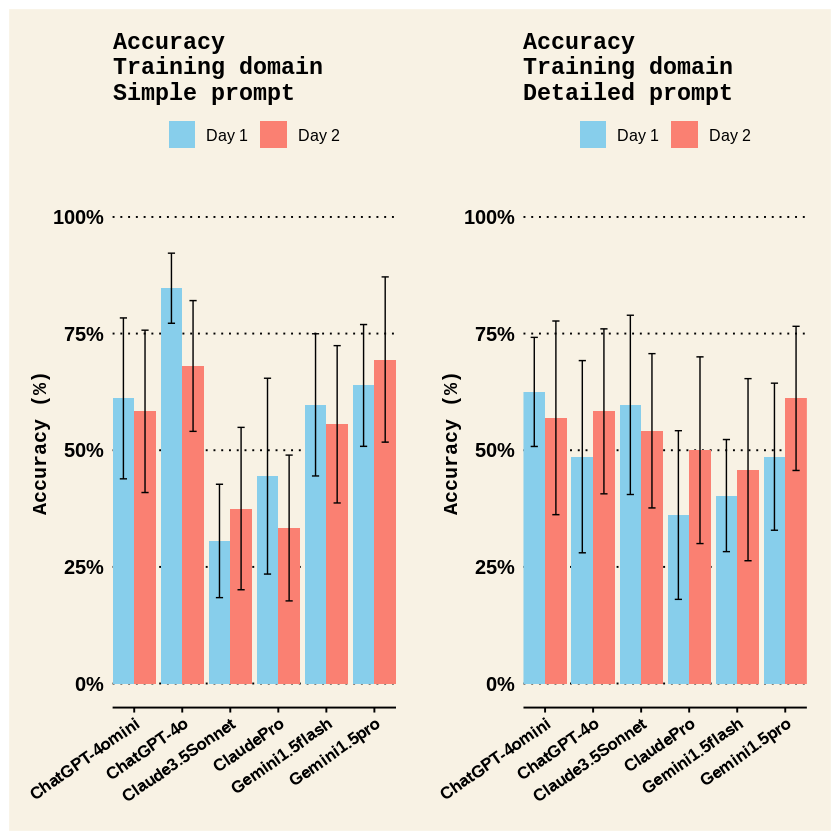

In [161]:
# Create a new SimpleTraining_MeanAccuracy_FINAL dataframe for Figure
SimpleTraining_MeanAccuracy_FINAL <- SimpleTraining_MeanAccuracy_PC %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Accuracy_Mean_PC, SimplePrompt_Training_Accuracy_SD_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_MeanAccuracy_FINAL$ChatbotID <- as.factor(SimpleTraining_MeanAccuracy_FINAL$ChatbotID)
SimpleTraining_MeanAccuracy_FINAL$TestDay <- as.factor(SimpleTraining_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_MeanAccuracy_FINAL <- SimpleTraining_MeanAccuracy_FINAL[order(
  match(SimpleTraining_MeanAccuracy_FINAL$ChatbotID, desired_order),
  SimpleTraining_MeanAccuracy_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_MeanAccuracy_FINAL$ChatbotName <- chatbot_names[SimpleTraining_MeanAccuracy_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_MeanAccuracy_FINAL$ChatbotName <- as.factor(SimpleTraining_MeanAccuracy_FINAL$ChatbotName)


# Create a new DetailedTraining_MeanAccuracy_FINAL dataframe for Figure
DetailedTraining_MeanAccuracy_FINAL <- DetailedTraining_MeanAccuracy_PC %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Accuracy_Mean_PC, DetailedPrompt_Training_Accuracy_SD_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_MeanAccuracy_FINAL$ChatbotID <- as.factor(DetailedTraining_MeanAccuracy_FINAL$ChatbotID)
DetailedTraining_MeanAccuracy_FINAL$TestDay <- as.factor(DetailedTraining_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_MeanAccuracy_FINAL <- DetailedTraining_MeanAccuracy_FINAL[order(
  match(DetailedTraining_MeanAccuracy_FINAL$ChatbotID, desired_order),
  DetailedTraining_MeanAccuracy_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_MeanAccuracy_FINAL$ChatbotName <- chatbot_names[DetailedTraining_MeanAccuracy_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_MeanAccuracy_FINAL$ChatbotName <- as.factor(DetailedTraining_MeanAccuracy_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_MeanAccuracy_FINAL \n")
SimpleTraining_MeanAccuracy_FINAL
cat("\n\n DetailedTraining_MeanAccuracy_FINAL \n")
DetailedTraining_MeanAccuracy_FINAL


# Build bar graph for SimpleTraining_MeanAccuracy_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_MeanAccuracy_FINAL$ChatbotName <- factor(
  SimpleTraining_MeanAccuracy_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleTraining_MeanAccuracy_FINALPLOT <- ggplot(SimpleTraining_MeanAccuracy_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Training_Accuracy_Mean_PC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Training_Accuracy_Mean_PC - SimplePrompt_Training_Accuracy_SD_PC / 2,
                    ymax = SimplePrompt_Training_Accuracy_Mean_PC + SimplePrompt_Training_Accuracy_SD_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Accuracy\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title


# Build bar graph for DetailedTraining_MeanAccuracy_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_MeanAccuracy_FINAL$ChatbotName <- factor(
  DetailedTraining_MeanAccuracy_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedTraining_MeanAccuracy_FINALPLOT <- ggplot(DetailedTraining_MeanAccuracy_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Training_Accuracy_Mean_PC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Training_Accuracy_Mean_PC - DetailedPrompt_Training_Accuracy_SD_PC / 2,
                    ymax = DetailedPrompt_Training_Accuracy_Mean_PC + DetailedPrompt_Training_Accuracy_SD_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Accuracy\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title

SimpleTraining_MeanAccuracy_FINALPLOT + DetailedTraining_MeanAccuracy_FINALPLOT

#### Racing



 SimpleRacing_MeanAccuracy_FINAL 


,ChatbotID,TestDay,SimplePrompt_Racing_Accuracy_Mean_PC,SimplePrompt_Racing_Accuracy_SD_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.6931818,0.3324325,ChatGPT-4omini
10,ChatbotD,Test2,0.6363636,0.3727203,ChatGPT-4omini
2,ChatbotB,Test1,0.6022727,0.4176504,ChatGPT-4o
8,ChatbotB,Test2,0.7613636,0.2875247,ChatGPT-4o
6,ChatbotF,Test1,0.4545455,0.3843531,Claude3.5Sonnet
12,ChatbotF,Test2,0.3977273,0.3527489,Claude3.5Sonnet
3,ChatbotC,Test1,0.2386364,0.3466561,ClaudePro
9,ChatbotC,Test2,0.2840909,0.3995736,ClaudePro
1,ChatbotA,Test1,0.5681818,0.3681187,Gemini1.5flash




 DetailedRacing_MeanAccuracy_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Racing_Accuracy_Mean_PC,DetailedPrompt_Racing_Accuracy_SD_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.5454545,0.5222330,ChatGPT-4omini
10,ChatbotD,Test2,0.5340909,0.5126247,ChatGPT-4omini
2,ChatbotB,Test1,0.7727273,0.4100998,ChatGPT-4o
8,ChatbotB,Test2,0.8068182,0.3029214,ChatGPT-4o
6,ChatbotF,Test1,0.6250000,0.4968652,Claude3.5Sonnet
12,ChatbotF,Test2,0.6022727,0.4835357,Claude3.5Sonnet
3,ChatbotC,Test1,0.5795455,0.4752392,ClaudePro
9,ChatbotC,Test2,0.5227273,0.5056499,ClaudePro
1,ChatbotA,Test1,0.6931818,0.3029214,Gemini1.5flash


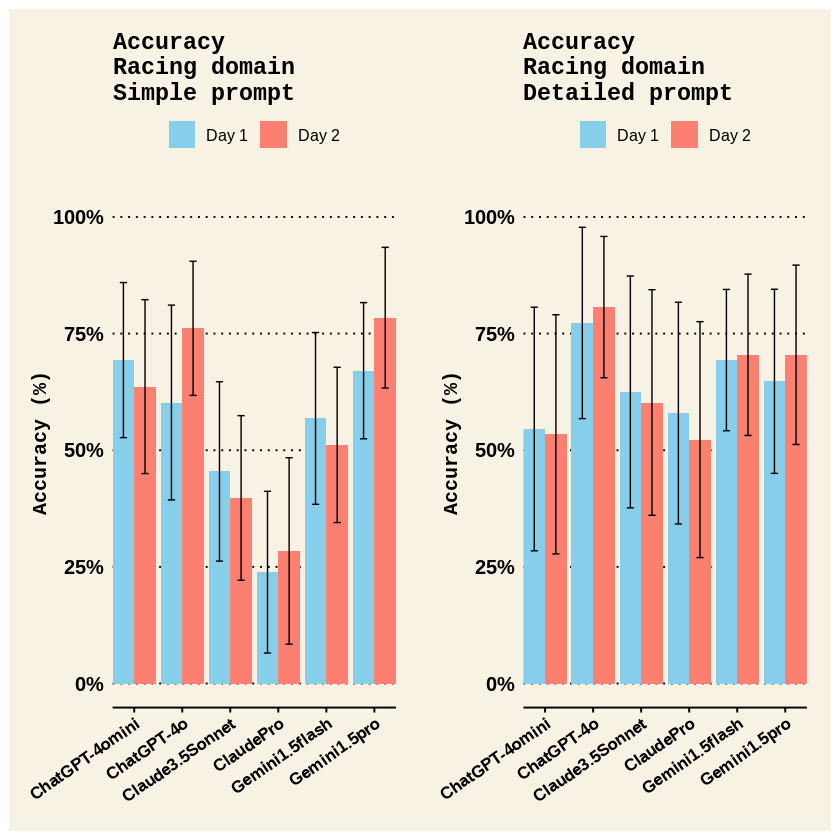

In [162]:
# Create a new SimpleRacing_MeanAccuracy_FINAL dataframe for Figure
SimpleRacing_MeanAccuracy_FINAL <- SimpleRacing_MeanAccuracy_PC %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Accuracy_Mean_PC, SimplePrompt_Racing_Accuracy_SD_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_MeanAccuracy_FINAL$ChatbotID <- as.factor(SimpleRacing_MeanAccuracy_FINAL$ChatbotID)
SimpleRacing_MeanAccuracy_FINAL$TestDay <- as.factor(SimpleRacing_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_MeanAccuracy_FINAL <- SimpleRacing_MeanAccuracy_FINAL[order(
  match(SimpleRacing_MeanAccuracy_FINAL$ChatbotID, desired_order),
  SimpleRacing_MeanAccuracy_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_MeanAccuracy_FINAL$ChatbotName <- chatbot_names[SimpleRacing_MeanAccuracy_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_MeanAccuracy_FINAL$ChatbotName <- as.factor(SimpleRacing_MeanAccuracy_FINAL$ChatbotName)


# Create a new DetailedRacing_MeanAccuracy_FINAL dataframe for Figure
DetailedRacing_MeanAccuracy_FINAL <- DetailedRacing_MeanAccuracy_PC %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Accuracy_Mean_PC, DetailedPrompt_Racing_Accuracy_SD_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_MeanAccuracy_FINAL$ChatbotID <- as.factor(DetailedRacing_MeanAccuracy_FINAL$ChatbotID)
DetailedRacing_MeanAccuracy_FINAL$TestDay <- as.factor(DetailedRacing_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_MeanAccuracy_FINAL <- DetailedRacing_MeanAccuracy_FINAL[order(
  match(DetailedRacing_MeanAccuracy_FINAL$ChatbotID, desired_order),
  DetailedRacing_MeanAccuracy_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_MeanAccuracy_FINAL$ChatbotName <- chatbot_names[DetailedRacing_MeanAccuracy_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_MeanAccuracy_FINAL$ChatbotName <- as.factor(DetailedRacing_MeanAccuracy_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_MeanAccuracy_FINAL \n")
SimpleRacing_MeanAccuracy_FINAL
cat("\n\n DetailedRacing_MeanAccuracy_FINAL \n")
DetailedRacing_MeanAccuracy_FINAL


# Build bar graph for SimpleRacing_MeanAccuracy_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_MeanAccuracy_FINAL$ChatbotName <- factor(
  SimpleRacing_MeanAccuracy_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleRacing_MeanAccuracy_FINALPLOT <- ggplot(SimpleRacing_MeanAccuracy_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Racing_Accuracy_Mean_PC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Racing_Accuracy_Mean_PC - SimplePrompt_Racing_Accuracy_SD_PC / 2,
                    ymax = SimplePrompt_Racing_Accuracy_Mean_PC + SimplePrompt_Racing_Accuracy_SD_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Accuracy\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  # Remove legend title



# Build bar graph for DetailedRacing_MeanAccuracy_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_MeanAccuracy_FINAL$ChatbotName <- factor(
  DetailedRacing_MeanAccuracy_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedRacing_MeanAccuracy_FINALPLOT <- ggplot(DetailedRacing_MeanAccuracy_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Racing_Accuracy_Mean_PC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Racing_Accuracy_Mean_PC - DetailedPrompt_Racing_Accuracy_SD_PC / 2,
                    ymax = DetailedPrompt_Racing_Accuracy_Mean_PC + DetailedPrompt_Racing_Accuracy_SD_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Accuracy\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) # Remove legend title


SimpleRacing_MeanAccuracy_FINALPLOT + DetailedRacing_MeanAccuracy_FINALPLOT

#### Overall



 Simple_MeanAccuracyOverall_FINAL 


,ChatbotID,TestDay,SimplePrompt_OverallAccuracy_Mean_PC,SimplePrompt_OverallAccuracy_SD_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.65625,0.3316501,ChatGPT-4omini
10,ChatbotD,Test2,0.61250,0.3533207,ChatGPT-4omini
2,ChatbotB,Test1,0.71250,0.3419661,ChatGPT-4o
8,ChatbotB,Test2,0.72500,0.2798026,ChatGPT-4o
6,ChatbotF,Test1,0.38750,0.3292236,Claude3.5Sonnet
12,ChatbotF,Test2,0.38750,0.3414848,Claude3.5Sonnet
3,ChatbotC,Test1,0.33125,0.3853292,ClaudePro
9,ChatbotC,Test2,0.30625,0.3546565,ClaudePro
1,ChatbotA,Test1,0.58125,0.3326405,Gemini1.5flash




 Detailed_MeanAccuracyOverall_FINAL 


,ChatbotID,TestDay,DetailedPrompt_OverallAccuracy_Mean_PC,DetailedPrompt_OverallAccuracy_SD_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.58125,0.4101408,ChatGPT-4omini
10,ChatbotD,Test2,0.55000,0.4595478,ChatGPT-4omini
2,ChatbotB,Test1,0.64375,0.4258795,ChatGPT-4o
8,ChatbotB,Test2,0.70625,0.3375487,ChatGPT-4o
6,ChatbotF,Test1,0.61250,0.4384857,Claude3.5Sonnet
12,ChatbotF,Test2,0.57500,0.4123903,Claude3.5Sonnet
3,ChatbotC,Test1,0.48125,0.4316336,ClaudePro
9,ChatbotC,Test2,0.51250,0.4495978,ClaudePro
1,ChatbotA,Test1,0.56250,0.3075262,Gemini1.5flash


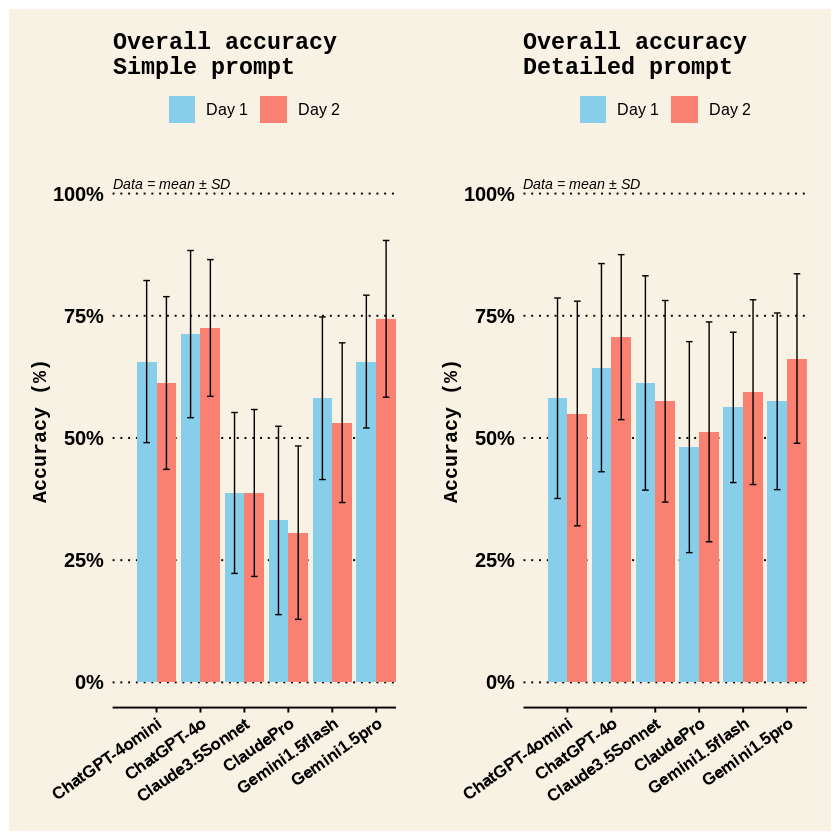

In [163]:
# Create a new Simple_MeanAccuracyOverall_FINAL dataframe for Figure
Simple_MeanAccuracyOverall_FINAL <- SimpleOverall_MeanAccuracy_PC %>%
  select(ChatbotID, TestDay, SimplePrompt_OverallAccuracy_Mean_PC, SimplePrompt_OverallAccuracy_SD_PC)
# Set ChatbotID and TestDay as factors
Simple_MeanAccuracyOverall_FINAL$ChatbotID <- as.factor(Simple_MeanAccuracyOverall_FINAL$ChatbotID)
Simple_MeanAccuracyOverall_FINAL$TestDay <- as.factor(Simple_MeanAccuracyOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Simple_MeanAccuracyOverall_FINAL <- Simple_MeanAccuracyOverall_FINAL[order(
  match(Simple_MeanAccuracyOverall_FINAL$ChatbotID, desired_order),
  Simple_MeanAccuracyOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Simple_MeanAccuracyOverall_FINAL$ChatbotName <- chatbot_names[Simple_MeanAccuracyOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Simple_MeanAccuracyOverall_FINAL$ChatbotName <- as.factor(Simple_MeanAccuracyOverall_FINAL$ChatbotName)


# Create a new Detailed_MeanAccuracyOverall_FINAL dataframe for Figure
Detailed_MeanAccuracyOverall_FINAL <- DetailedOverall_MeanAccuracy_PC %>%
  select(ChatbotID, TestDay, DetailedPrompt_OverallAccuracy_Mean_PC, DetailedPrompt_OverallAccuracy_SD_PC)
# Set ChatbotID and TestDay as factors
Detailed_MeanAccuracyOverall_FINAL$ChatbotID <- as.factor(Detailed_MeanAccuracyOverall_FINAL$ChatbotID)
Detailed_MeanAccuracyOverall_FINAL$TestDay <- as.factor(Detailed_MeanAccuracyOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Detailed_MeanAccuracyOverall_FINAL <- Detailed_MeanAccuracyOverall_FINAL[order(
  match(Detailed_MeanAccuracyOverall_FINAL$ChatbotID, desired_order),
  Detailed_MeanAccuracyOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Detailed_MeanAccuracyOverall_FINAL$ChatbotName <- chatbot_names[Detailed_MeanAccuracyOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Detailed_MeanAccuracyOverall_FINAL$ChatbotName <- as.factor(Detailed_MeanAccuracyOverall_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n Simple_MeanAccuracyOverall_FINAL \n")
Simple_MeanAccuracyOverall_FINAL
cat("\n\n Detailed_MeanAccuracyOverall_FINAL \n")
Detailed_MeanAccuracyOverall_FINAL


# Build bar graph for Simple_MeanAccuracyOverall_FINAL
# Set ChatbotName as a factor with the desired order
Simple_MeanAccuracyOverall_FINAL$ChatbotName <- factor(
  Simple_MeanAccuracyOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Simple_MeanAccuracyOverall_FINALPLOT <- ggplot(Simple_MeanAccuracyOverall_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_OverallAccuracy_Mean_PC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_OverallAccuracy_Mean_PC - SimplePrompt_OverallAccuracy_SD_PC / 2,
                    ymax = SimplePrompt_OverallAccuracy_Mean_PC + SimplePrompt_OverallAccuracy_SD_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Overall accuracy\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )


# Build bar graph for Detailed_MeanAccuracyOverall_FINAL
# Set ChatbotName as a factor with the desired order
Detailed_MeanAccuracyOverall_FINAL$ChatbotName <- factor(
  Detailed_MeanAccuracyOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Detailed_MeanAccuracyOverall_FINALPLOT <- ggplot(Detailed_MeanAccuracyOverall_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_OverallAccuracy_Mean_PC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_OverallAccuracy_Mean_PC - DetailedPrompt_OverallAccuracy_SD_PC / 2,
                    ymax = DetailedPrompt_OverallAccuracy_Mean_PC + DetailedPrompt_OverallAccuracy_SD_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Overall accuracy\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12),
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = mean ± SD",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

Simple_MeanAccuracyOverall_FINALPLOT + Detailed_MeanAccuracyOverall_FINALPLOT

#### Plots for manuscript

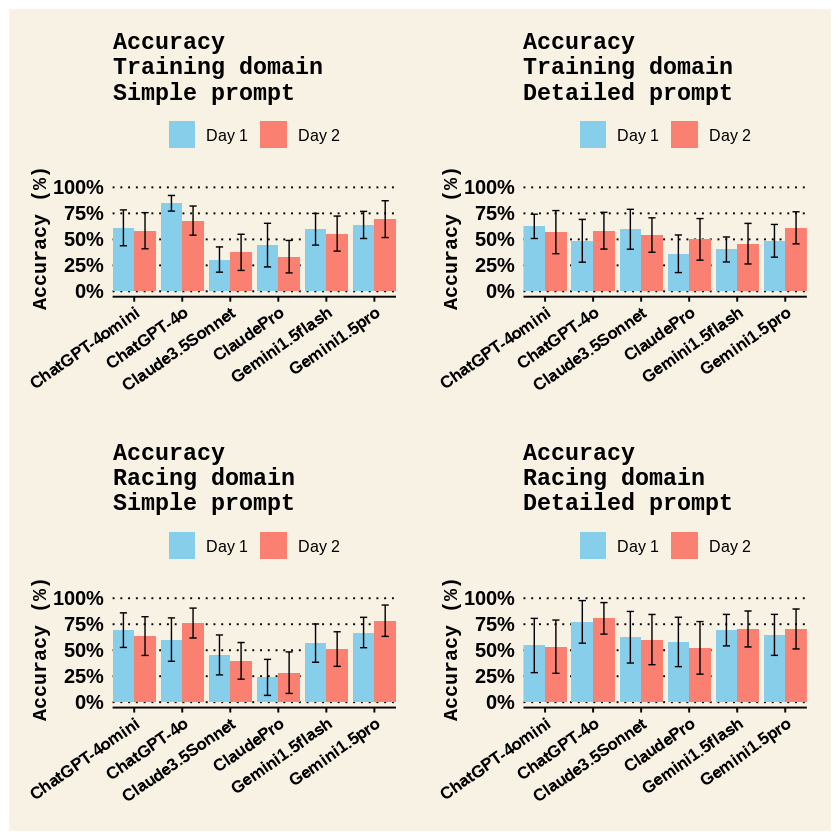

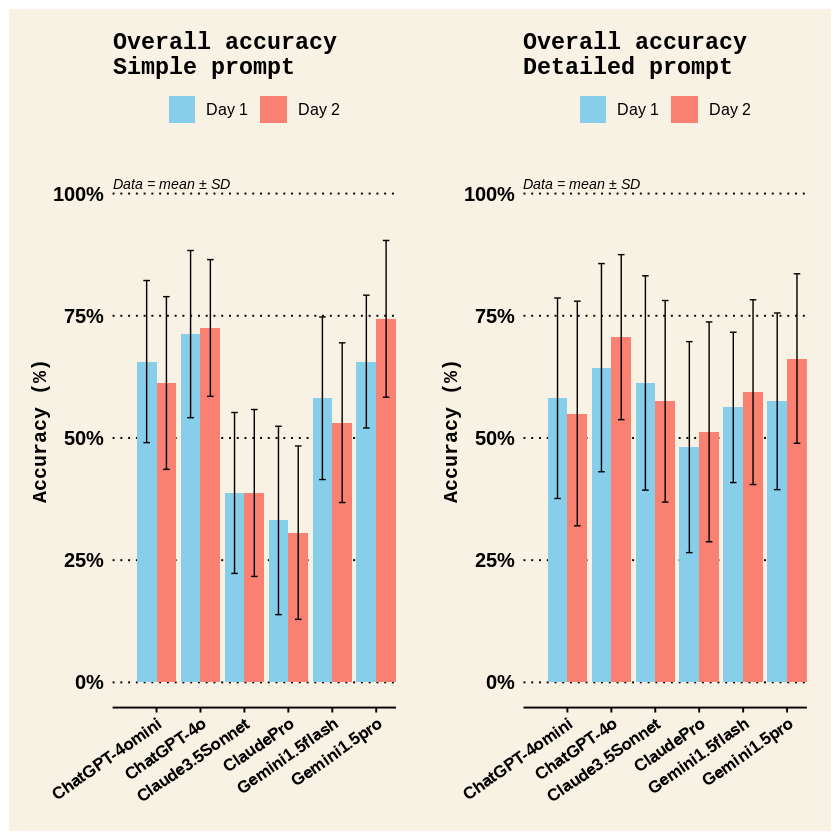

In [164]:
# create plots
TrainingAccuracyFINALPLOT <- SimpleTraining_MeanAccuracy_FINALPLOT + DetailedTraining_MeanAccuracy_FINALPLOT
RacingAccuracyFINALPLOT <- SimpleRacing_MeanAccuracy_FINALPLOT + DetailedRacing_MeanAccuracy_FINALPLOT
TracingRacingccuracyFINALPLOT <- TrainingAccuracyFINALPLOT / RacingAccuracyFINALPLOT
OverallAccuracyFINALPLOT <- Simple_MeanAccuracyOverall_FINALPLOT + Detailed_MeanAccuracyOverall_FINALPLOT
# View plots
TracingRacingccuracyFINALPLOT
OverallAccuracyFINALPLOT
# Save as jpgs
ggsave("TracingRacingccuracyFINALPLOT.jpg", plot = TracingRacingccuracyFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)
ggsave("OverallAccuracyFINALPLOT.jpg", plot = OverallAccuracyFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

### Accuracy (individual criteria)

#### Training

##### Energy availability



 SimpleTraining_Accuracy_EnergyAvailability_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_EnergyAvailabilityPC,SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.125,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.125,0.125,ChatGPT-4omini
2,ChatbotB,Test1,0.625,0.125,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.375,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.000,0.000,Gemini1.5flash




 DetailedTraining_Accuracy_EnergyAvailability_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_EnergyAvailabilityPC,DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
1,ChatbotD,Test1,0.125,0.125,ChatGPT-4omini
2,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
3,ChatbotB,Test1,0.000,0.000,ChatGPT-4o
4,ChatbotB,Test2,0.750,0.000,ChatGPT-4o
5,ChatbotF,Test1,0.125,0.125,Claude3.5Sonnet
6,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
7,ChatbotC,Test1,0.000,0.000,ClaudePro
8,ChatbotC,Test2,0.125,0.125,ClaudePro
9,ChatbotA,Test1,0.875,0.125,Gemini1.5flash


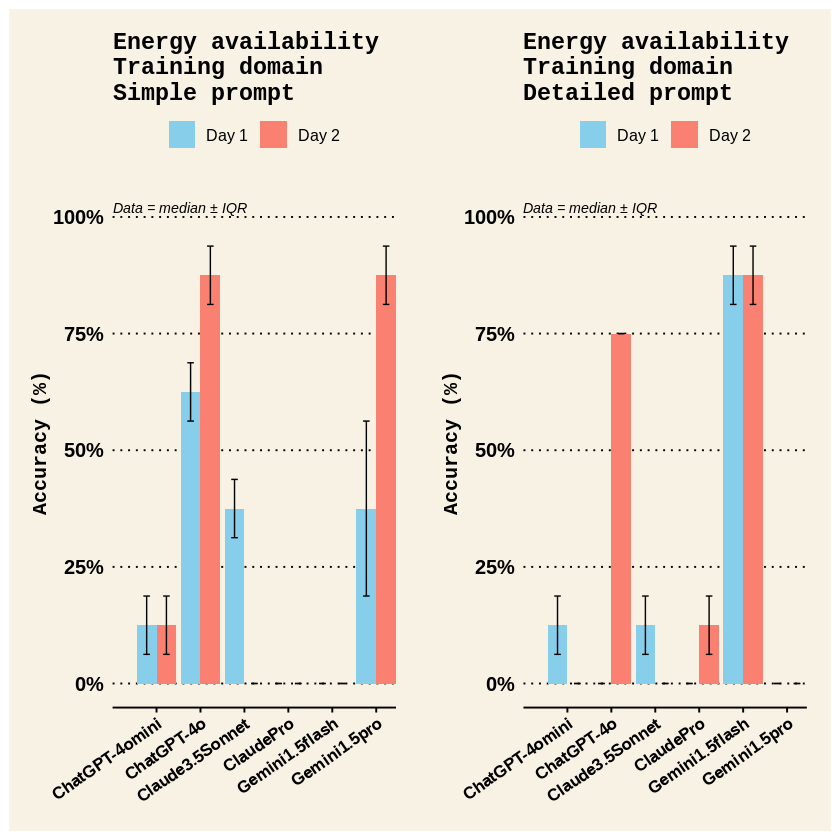

In [165]:
# Create a new SimpleTraining_Accuracy_EnergyAvailability_FINAL dataframe for Figure
SimpleTraining_Accuracy_EnergyAvailability_FINAL <- SimpleTraining_Accuracy_EnergyAvailability %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_EnergyAvailabilityPC, SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID)
SimpleTraining_Accuracy_EnergyAvailability_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_EnergyAvailability_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_EnergyAvailability_FINAL <- SimpleTraining_Accuracy_EnergyAvailability_FINAL[order(
  match(SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID, desired_order), SimpleTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_EnergyAvailability_FINAL dataframe for Figure
DetailedTraining_Accuracy_EnergyAvailability_FINAL <- DetailedTraining_Accuracy_EnergyAvailability %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_EnergyAvailabilityPC, DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID <- as.factor(DetailedTraining_MeanAccuracy_FINAL$ChatbotID)
DetailedTraining_Accuracy_EnergyAvailability_FINAL$TestDay <- as.factor(DetailedTraining_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_EnergyAvailability_FINAL <- DetailedTraining_Accuracy_EnergyAvailability_FINAL[order(
  match(DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID, desired_order), DetailedTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_EnergyAvailability_FINAL \n")
SimpleTraining_Accuracy_EnergyAvailability_FINAL
cat("\n\n DetailedTraining_Accuracy_EnergyAvailability_FINAL \n")
DetailedTraining_Accuracy_EnergyAvailability_FINAL


# Build bar graph for SimpleTraining_Accuracy_EnergyAvailability_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_EnergyAvailability_FINALPLOT <- ggplot(SimpleTraining_Accuracy_EnergyAvailability_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_EnergyAvailabilityPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_EnergyAvailabilityPC - SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_EnergyAvailabilityPC + SimplePrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Energy availability\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_EnergyAvailability_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_EnergyAvailability_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_EnergyAvailability_FINALPLOT <- ggplot(DetailedTraining_Accuracy_EnergyAvailability_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_EnergyAvailabilityPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_EnergyAvailabilityPC - DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_EnergyAvailabilityPC + DetailedPrompt_Training_Accuracy_EnergyAvailability_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Energy availability\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingEnergyAvailabilityFINALPLOT <- SimpleTraining_Accuracy_EnergyAvailability_FINALPLOT + DetailedTraining_Accuracy_EnergyAvailability_FINALPLOT
# View plots
TrainingEnergyAvailabilityFINALPLOT
# Save as jpgs
ggsave("TrainingEnergyAvailabilityFINALPLOT.jpg", plot = TrainingEnergyAvailabilityFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Daily carb intake.



 SimpleTraining_Accuracy_DailyCarbIntake_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_DailyCarbIntakePC,SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.875,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.750,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.750,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.625,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.875,0.125,ClaudePro
9,ChatbotC,Test2,0.750,0.000,ClaudePro
1,ChatbotA,Test1,0.375,0.125,Gemini1.5flash




 DetailedTraining_Accuracy_DailyCarbIntake_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_DailyCarbIntakePC,DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
1,ChatbotD,Test1,0.250,0.000,ChatGPT-4omini
2,ChatbotD,Test2,0.750,0.000,ChatGPT-4omini
3,ChatbotB,Test1,0.750,0.000,ChatGPT-4o
4,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
5,ChatbotF,Test1,0.375,0.125,Claude3.5Sonnet
6,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
7,ChatbotC,Test1,0.250,0.000,ClaudePro
8,ChatbotC,Test2,0.750,0.250,ClaudePro
9,ChatbotA,Test1,1.000,0.000,Gemini1.5flash


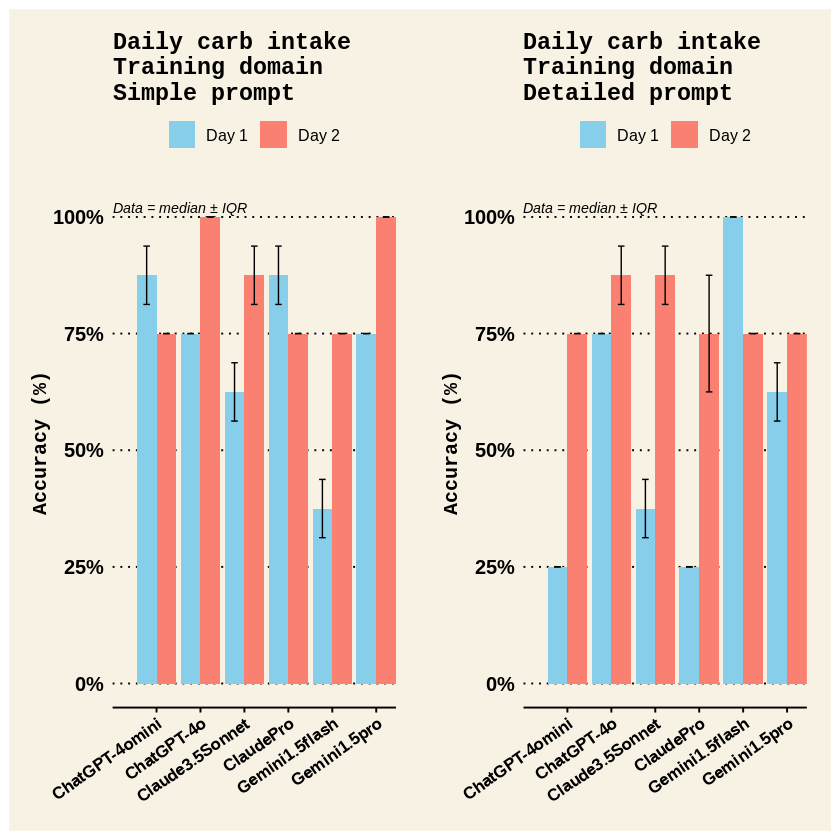

In [166]:
# Create a new SimpleTraining_Accuracy_DailyCarbIntake_FINAL dataframe for Figure
SimpleTraining_Accuracy_DailyCarbIntake_FINAL <- SimpleTraining_Accuracy_DailyCarbIntake %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_DailyCarbIntakePC, SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID)
SimpleTraining_Accuracy_DailyCarbIntake_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_DailyCarbIntake_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_DailyCarbIntake_FINAL <- SimpleTraining_Accuracy_DailyCarbIntake_FINAL[order(
  match(SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID, desired_order), SimpleTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_DailyCarbIntake_FINAL dataframe for Figure
DetailedTraining_Accuracy_DailyCarbIntake_FINAL <- DetailedTraining_Accuracy_DailyCarbIntake %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_DailyCarbIntakePC, DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID <- as.factor(DetailedTraining_MeanAccuracy_FINAL$ChatbotID)
DetailedTraining_Accuracy_DailyCarbIntake_FINAL$TestDay <- as.factor(DetailedTraining_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_DailyCarbIntake_FINAL <- DetailedTraining_Accuracy_DailyCarbIntake_FINAL[order(
  match(DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID, desired_order), DetailedTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_DailyCarbIntake_FINAL \n")
SimpleTraining_Accuracy_DailyCarbIntake_FINAL
cat("\n\n DetailedTraining_Accuracy_DailyCarbIntake_FINAL \n")
DetailedTraining_Accuracy_DailyCarbIntake_FINAL


# Build bar graph for SimpleTraining_Accuracy_DailyCarbIntake_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_DailyCarbIntake_FINALPLOT <- ggplot(SimpleTraining_Accuracy_DailyCarbIntake_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_DailyCarbIntakePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_DailyCarbIntakePC - SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_DailyCarbIntakePC + SimplePrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily carb intake\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_DailyCarbIntake_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_DailyCarbIntake_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_DailyCarbIntake_FINALPLOT <- ggplot(DetailedTraining_Accuracy_DailyCarbIntake_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_DailyCarbIntakePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_DailyCarbIntakePC - DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_DailyCarbIntakePC + DetailedPrompt_Training_Accuracy_DailyCarbIntake_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily carb intake\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingDailyCarbIntakeFINALPLOT <- SimpleTraining_Accuracy_DailyCarbIntake_FINALPLOT + DetailedTraining_Accuracy_DailyCarbIntake_FINALPLOT
# View plots
TrainingDailyCarbIntakeFINALPLOT
# Save as jpgs
ggsave("TrainingDailyCarbIntakeFINALPLOT.jpg", plot = TrainingDailyCarbIntakeFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Daily protein intake.



 SimpleTraining_Accuracy_DailyProtein_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_DailyProteinPC,SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.625,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.750,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.750,0.000,ClaudePro
9,ChatbotC,Test2,0.750,0.000,ClaudePro
1,ChatbotA,Test1,0.875,0.125,Gemini1.5flash




 DetailedTraining_Accuracy_DailyProtein_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_DailyProteinPC,DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
1,ChatbotD,Test1,0.375,0.125,ChatGPT-4omini
2,ChatbotD,Test2,0.875,0.125,ChatGPT-4omini
3,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
4,ChatbotB,Test2,0.750,0.000,ChatGPT-4o
5,ChatbotF,Test1,0.750,0.250,Claude3.5Sonnet
6,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
7,ChatbotC,Test1,0.875,0.125,ClaudePro
8,ChatbotC,Test2,1.000,0.000,ClaudePro
9,ChatbotA,Test1,1.000,0.000,Gemini1.5flash


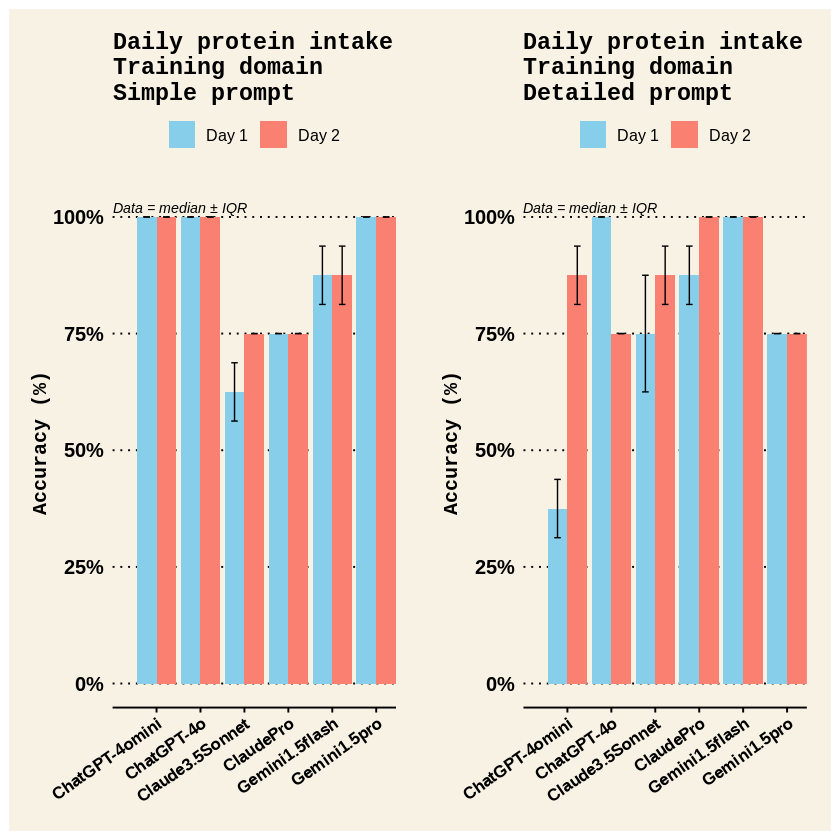

In [167]:
# Create a new SimpleTraining_Accuracy_DailyProtein_FINAL dataframe for Figure
SimpleTraining_Accuracy_DailyProtein_FINAL <- SimpleTraining_Accuracy_DailyProtein %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_DailyProteinPC, SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotID)
SimpleTraining_Accuracy_DailyProtein_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_DailyProtein_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_DailyProtein_FINAL <- SimpleTraining_Accuracy_DailyProtein_FINAL[order(
  match(SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotID, desired_order), SimpleTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_DailyProtein_FINAL dataframe for Figure
DetailedTraining_Accuracy_DailyProtein_FINAL <- DetailedTraining_Accuracy_DailyProtein %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_DailyProteinPC, DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotID <- as.factor(DetailedTraining_MeanAccuracy_FINAL$ChatbotID)
DetailedTraining_Accuracy_DailyProtein_FINAL$TestDay <- as.factor(DetailedTraining_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_DailyProtein_FINAL <- DetailedTraining_Accuracy_DailyProtein_FINAL[order(
  match(DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotID, desired_order), DetailedTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_DailyProtein_FINAL \n")
SimpleTraining_Accuracy_DailyProtein_FINAL
cat("\n\n DetailedTraining_Accuracy_DailyProtein_FINAL \n")
DetailedTraining_Accuracy_DailyProtein_FINAL


# Build bar graph for SimpleTraining_Accuracy_DailyProtein_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_DailyProtein_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_DailyProtein_FINALPLOT <- ggplot(SimpleTraining_Accuracy_DailyProtein_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_DailyProteinPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_DailyProteinPC - SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_DailyProteinPC + SimplePrompt_Training_Accuracy_DailyProtein_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily protein intake\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_DailyProtein_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_DailyProtein_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_DailyProtein_FINALPLOT <- ggplot(DetailedTraining_Accuracy_DailyProtein_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_DailyProteinPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_DailyProteinPC - DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_DailyProteinPC + DetailedPrompt_Training_Accuracy_DailyProtein_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily protein intake\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

SimpleTraining_Accuracy_DailyProtein_FINALPLOT + DetailedTraining_Accuracy_DailyProtein_FINALPLOT

##### Post session carbs.



 SimpleTraining_Accuracy_PostSessionCarbs_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_PostSessionCarbsPC,SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.250,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.500,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.750,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.250,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.250,0.250,Claude3.5Sonnet
3,ChatbotC,Test1,0.125,0.125,ClaudePro
9,ChatbotC,Test2,0.500,0.000,ClaudePro
1,ChatbotA,Test1,0.375,0.125,Gemini1.5flash




 DetailedTraining_Accuracy_PostSessionCarbs_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_PostSessionCarbsPC,DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
1,ChatbotD,Test1,0.125,0.125,ChatGPT-4omini
2,ChatbotD,Test2,0.250,0.250,ChatGPT-4omini
3,ChatbotB,Test1,0.500,0.000,ChatGPT-4o
4,ChatbotB,Test2,0.500,0.000,ChatGPT-4o
5,ChatbotF,Test1,0.250,0.000,Claude3.5Sonnet
6,ChatbotF,Test2,0.625,0.125,Claude3.5Sonnet
7,ChatbotC,Test1,0.000,0.000,ClaudePro
8,ChatbotC,Test2,0.125,0.125,ClaudePro
9,ChatbotA,Test1,0.500,0.000,Gemini1.5flash


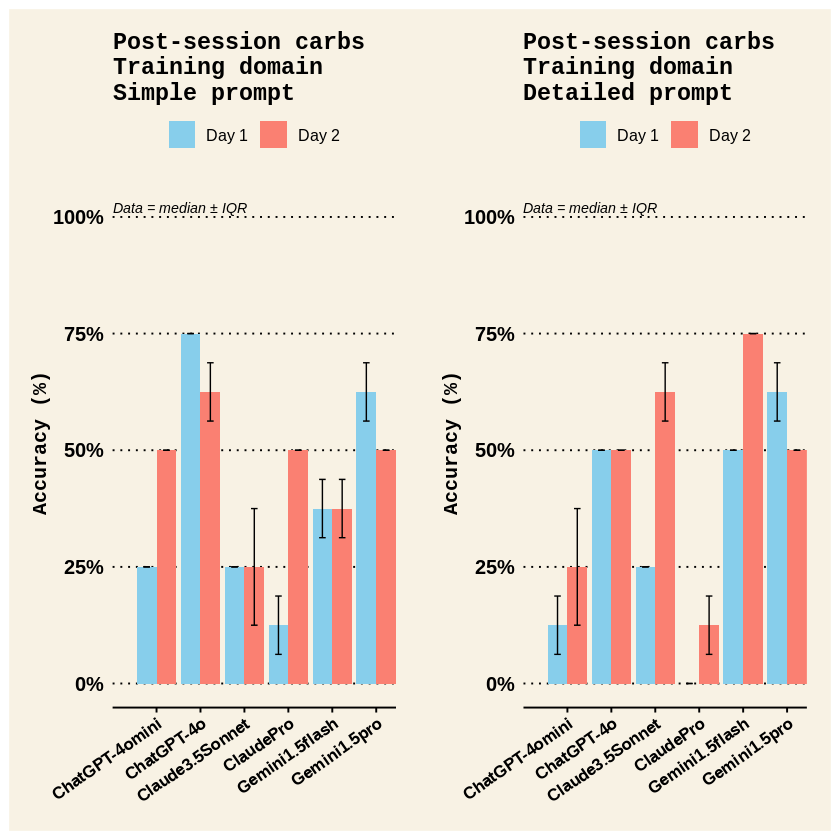

In [168]:
# Create a new SimpleTraining_Accuracy_PostSessionCarbs_FINAL dataframe for Figure
SimpleTraining_Accuracy_PostSessionCarbs_FINAL <- SimpleTraining_Accuracy_PostSessionCarbs %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_PostSessionCarbsPC, SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID)
SimpleTraining_Accuracy_PostSessionCarbs_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_PostSessionCarbs_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_PostSessionCarbs_FINAL <- SimpleTraining_Accuracy_PostSessionCarbs_FINAL[order(
  match(SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID, desired_order), SimpleTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_PostSessionCarbs_FINAL dataframe for Figure
DetailedTraining_Accuracy_PostSessionCarbs_FINAL <- DetailedTraining_Accuracy_PostSessionCarbs %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_PostSessionCarbsPC, DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID <- as.factor(DetailedTraining_MeanAccuracy_FINAL$ChatbotID)
DetailedTraining_Accuracy_PostSessionCarbs_FINAL$TestDay <- as.factor(DetailedTraining_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_PostSessionCarbs_FINAL <- DetailedTraining_Accuracy_PostSessionCarbs_FINAL[order(
  match(DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID, desired_order), DetailedTraining_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_PostSessionCarbs_FINAL \n")
SimpleTraining_Accuracy_PostSessionCarbs_FINAL
cat("\n\n DetailedTraining_Accuracy_PostSessionCarbs_FINAL \n")
DetailedTraining_Accuracy_PostSessionCarbs_FINAL


# Build bar graph for SimpleTraining_Accuracy_PostSessionCarbs_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_PostSessionCarbs_FINALPLOT <- ggplot(SimpleTraining_Accuracy_PostSessionCarbs_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_PostSessionCarbsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_PostSessionCarbsPC - SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_PostSessionCarbsPC + SimplePrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Post-session carbs\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_PostSessionCarbs_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_PostSessionCarbs_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_PostSessionCarbs_FINALPLOT <- ggplot(DetailedTraining_Accuracy_PostSessionCarbs_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_PostSessionCarbsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_PostSessionCarbsPC - DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_PostSessionCarbsPC + DetailedPrompt_Training_Accuracy_PostSessionCarbs_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Post-session carbs\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingPostSessionCarbsFINALPLOT <- SimpleTraining_Accuracy_PostSessionCarbs_FINALPLOT + DetailedTraining_Accuracy_PostSessionCarbs_FINALPLOT
# View plots
TrainingPostSessionCarbsFINALPLOT
# Save as jpgs
ggsave("TrainingPostSessionCarbsFINALPLOT.jpg", plot = TrainingPostSessionCarbsFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Post session protein



 SimpleTraining_Accuracy_PostSessionProtein_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_PostSessionProteinPC,SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.250,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.500,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.250,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.250,0.250,Claude3.5Sonnet
3,ChatbotC,Test1,0.125,0.125,ClaudePro
9,ChatbotC,Test2,0.500,0.000,ClaudePro
1,ChatbotA,Test1,0.500,0.000,Gemini1.5flash




 DetailedTraining_Accuracy_PostSessionProtein_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_PostSessionProteinPC,DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.500,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.875,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.750,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.500,0.000,ClaudePro
9,ChatbotC,Test2,0.500,0.000,ClaudePro
1,ChatbotA,Test1,0.500,0.000,Gemini1.5flash


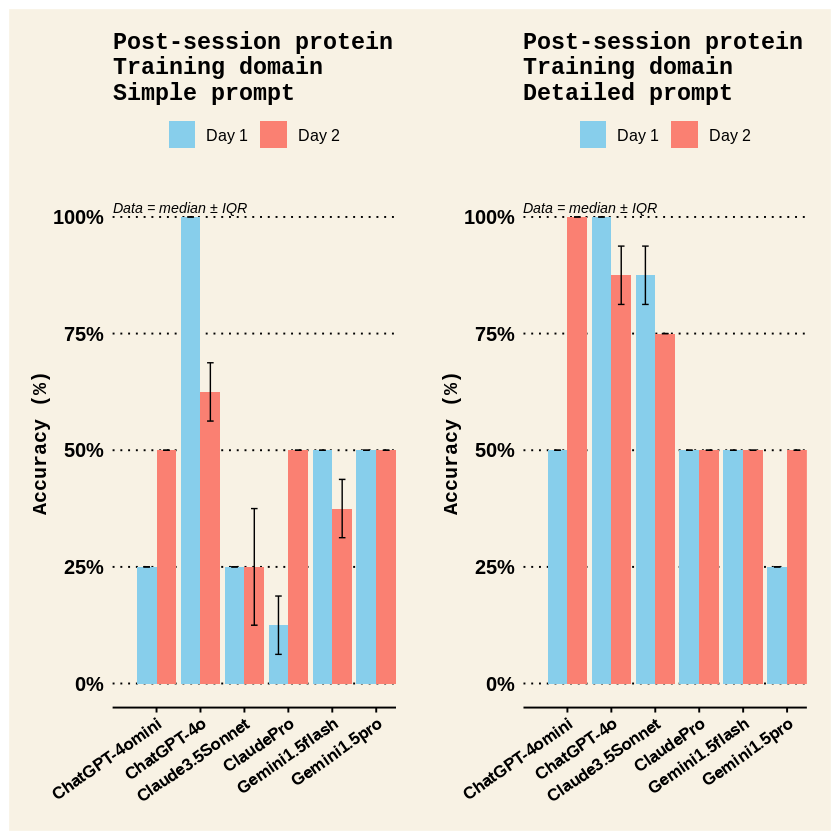

In [169]:
# Create a new SimpleTraining_Accuracy_PostSessionProtein_FINAL dataframe for Figure
SimpleTraining_Accuracy_PostSessionProtein_FINAL <- SimpleTraining_Accuracy_PostSessionProtein %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_PostSessionProteinPC, SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID)
SimpleTraining_Accuracy_PostSessionProtein_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_PostSessionProtein_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_PostSessionProtein_FINAL <- SimpleTraining_Accuracy_PostSessionProtein_FINAL[order(
  match(SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID, desired_order), SimpleTraining_Accuracy_PostSessionProtein_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_PostSessionProtein_FINAL dataframe for Figure
DetailedTraining_Accuracy_PostSessionProtein_FINAL <- DetailedTraining_Accuracy_PostSessionProtein %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_PostSessionProteinPC, DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID <- as.factor(DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID)
DetailedTraining_Accuracy_PostSessionProtein_FINAL$TestDay <- as.factor(DetailedTraining_Accuracy_PostSessionProtein_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_PostSessionProtein_FINAL <- DetailedTraining_Accuracy_PostSessionProtein_FINAL[order(
  match(DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID, desired_order), DetailedTraining_Accuracy_PostSessionProtein_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_PostSessionProtein_FINAL \n")
SimpleTraining_Accuracy_PostSessionProtein_FINAL
cat("\n\n DetailedTraining_Accuracy_PostSessionProtein_FINAL \n")
DetailedTraining_Accuracy_PostSessionProtein_FINAL


# Build bar graph for SimpleTraining_Accuracy_PostSessionProtein_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_PostSessionProtein_FINALPLOT <- ggplot(SimpleTraining_Accuracy_PostSessionProtein_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_PostSessionProteinPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_PostSessionProteinPC - SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_PostSessionProteinPC + SimplePrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Post-session protein\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_PostSessionProtein_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_PostSessionProtein_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_PostSessionProtein_FINALPLOT <- ggplot(DetailedTraining_Accuracy_PostSessionProtein_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_PostSessionProteinPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_PostSessionProteinPC - DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_PostSessionProteinPC + DetailedPrompt_Training_Accuracy_PostSessionProtein_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Post-session protein\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingPostSessionProteinFINALPLOT <- SimpleTraining_Accuracy_PostSessionProtein_FINALPLOT + DetailedTraining_Accuracy_PostSessionProtein_FINALPLOT
# View plots
TrainingPostSessionProteinFINALPLOT
# Save as jpgs
ggsave("TrainingPostSessionProteinFINALPLOT.jpg", plot = TrainingPostSessionProteinFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Hydration



 SimpleTraining_Accuracy_Hydration_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_HydrationPC,SimplePrompt_Training_Accuracy_Hydration_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.875,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.625,0.125,ChatGPT-4omini
2,ChatbotB,Test1,0.750,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.750,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.500,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.625,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.875,0.125,ClaudePro
9,ChatbotC,Test2,0.375,0.375,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash




 DetailedTraining_Accuracy_Hydration_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_HydrationPC,DetailedPrompt_Training_Accuracy_Hydration_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.500,0.250,ChatGPT-4omini
10,ChatbotD,Test2,0.625,0.125,ChatGPT-4omini
2,ChatbotB,Test1,0.125,0.125,ChatGPT-4o
8,ChatbotB,Test2,0.500,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.375,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.375,0.125,ClaudePro
9,ChatbotC,Test2,0.500,0.250,ClaudePro
1,ChatbotA,Test1,0.500,0.250,Gemini1.5flash


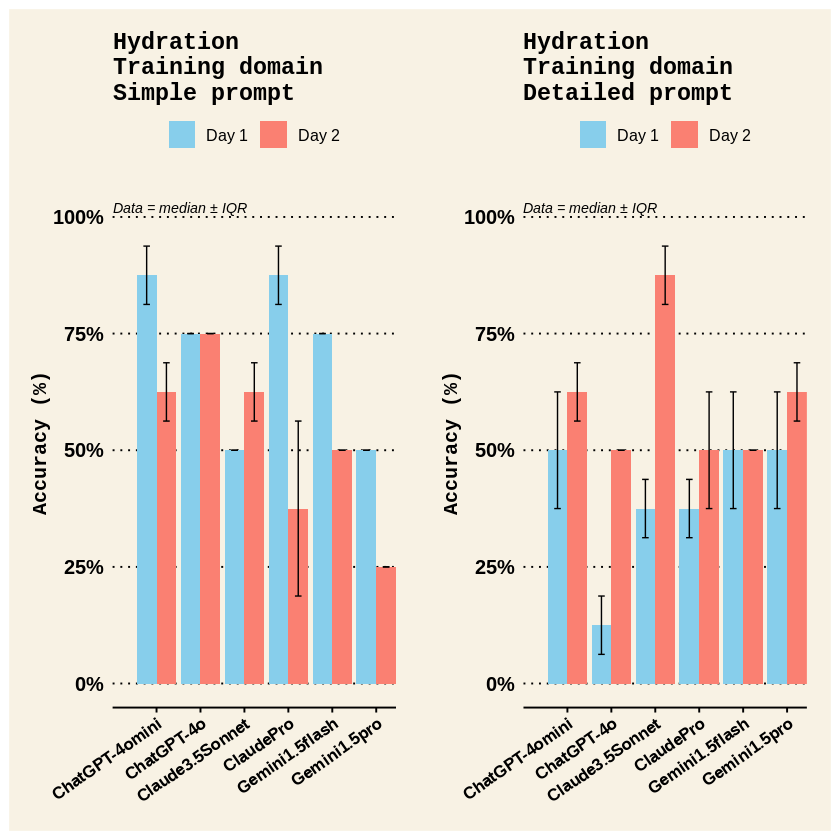

In [170]:
# Create a new SimpleTraining_Accuracy_Hydration_FINAL dataframe for Figure
SimpleTraining_Accuracy_Hydration_FINAL <- SimpleTraining_Accuracy_Hydration %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_HydrationPC, SimplePrompt_Training_Accuracy_Hydration_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_Hydration_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_Hydration_FINAL$ChatbotID)
SimpleTraining_Accuracy_Hydration_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_Hydration_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_Hydration_FINAL <- SimpleTraining_Accuracy_Hydration_FINAL[order(
  match(SimpleTraining_Accuracy_Hydration_FINAL$ChatbotID, desired_order), SimpleTraining_Accuracy_Hydration_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_Hydration_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_Hydration_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_Hydration_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_Hydration_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_Hydration_FINAL dataframe for Figure
DetailedTraining_Accuracy_Hydration_FINAL <- DetailedTraining_Accuracy_Hydration %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_HydrationPC, DetailedPrompt_Training_Accuracy_Hydration_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_Hydration_FINAL$ChatbotID <- as.factor(DetailedTraining_Accuracy_Hydration_FINAL$ChatbotID)
DetailedTraining_Accuracy_Hydration_FINAL$TestDay <- as.factor(DetailedTraining_Accuracy_Hydration_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_Hydration_FINAL <- DetailedTraining_Accuracy_Hydration_FINAL[order(
  match(DetailedTraining_Accuracy_Hydration_FINAL$ChatbotID, desired_order), DetailedTraining_Accuracy_Hydration_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_Hydration_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_Hydration_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_Hydration_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_Hydration_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_Hydration_FINAL \n")
SimpleTraining_Accuracy_Hydration_FINAL
cat("\n\n DetailedTraining_Accuracy_Hydration_FINAL \n")
DetailedTraining_Accuracy_Hydration_FINAL


# Build bar graph for SimpleTraining_Accuracy_Hydration_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_Hydration_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_Hydration_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_Hydration_FINALPLOT <- ggplot(SimpleTraining_Accuracy_Hydration_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_HydrationPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_HydrationPC - SimplePrompt_Training_Accuracy_Hydration_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_HydrationPC + SimplePrompt_Training_Accuracy_Hydration_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Hydration\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_Hydration_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_Hydration_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_Hydration_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_Hydration_FINALPLOT <- ggplot(DetailedTraining_Accuracy_Hydration_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_HydrationPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_HydrationPC - DetailedPrompt_Training_Accuracy_Hydration_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_HydrationPC + DetailedPrompt_Training_Accuracy_Hydration_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Hydration\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingHydrationFINALPLOT <- SimpleTraining_Accuracy_Hydration_FINALPLOT + DetailedTraining_Accuracy_Hydration_FINALPLOT
# View plots
TrainingHydrationFINALPLOT
# Save as jpgs
ggsave("TrainingHydrationFINALPLOT.jpg", plot = TrainingHydrationFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Supplements.



 SimpleTraining_Accuracy_Supplements_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_SupplementsPC,SimplePrompt_Training_Accuracy_Supplements_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.625,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.750,0.250,ChatGPT-4o
8,ChatbotB,Test2,0.750,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.625,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.250,0.250,ClaudePro
9,ChatbotC,Test2,0.125,0.125,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash




 DetailedTraining_Accuracy_Supplements_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_SupplementsPC,DetailedPrompt_Training_Accuracy_Supplements_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.250,0.250,ChatGPT-4omini
10,ChatbotD,Test2,0.125,0.125,ChatGPT-4omini
2,ChatbotB,Test1,0.250,0.250,ChatGPT-4o
8,ChatbotB,Test2,0.250,0.250,ChatGPT-4o
6,ChatbotF,Test1,0.750,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.500,0.250,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.250,Gemini1.5flash


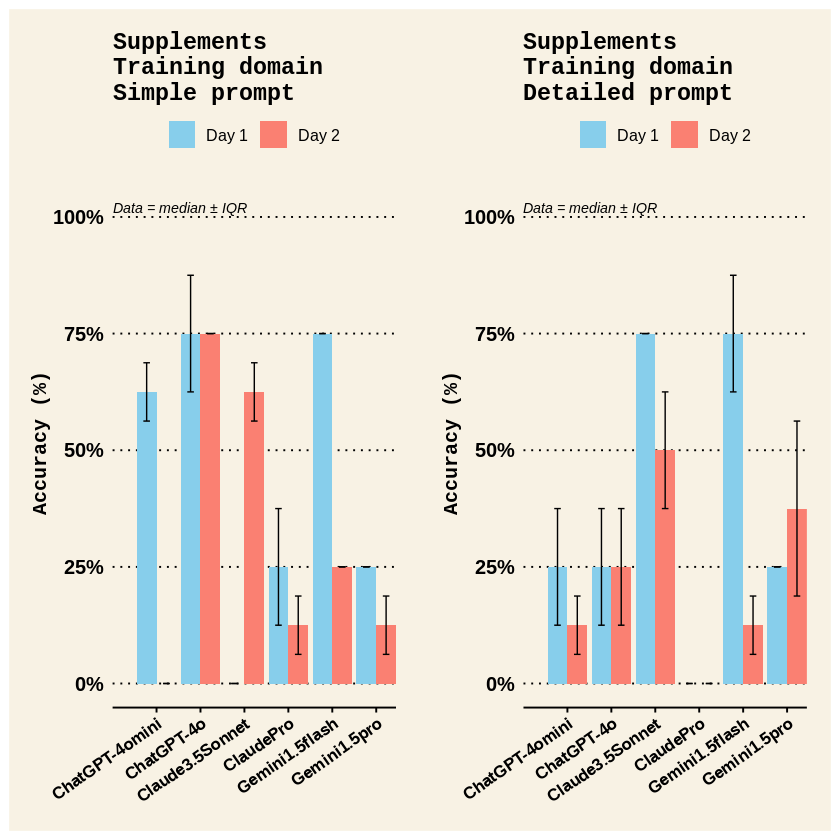

In [171]:
# Create a new SimpleTraining_Accuracy_Supplements_FINAL dataframe for Figure
SimpleTraining_Accuracy_Supplements_FINAL <- SimpleTraining_Accuracy_Supplements %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_SupplementsPC, SimplePrompt_Training_Accuracy_Supplements_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_Supplements_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_Supplements_FINAL$ChatbotID)
SimpleTraining_Accuracy_Supplements_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_Supplements_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_Supplements_FINAL <- SimpleTraining_Accuracy_Supplements_FINAL[order(
  match(SimpleTraining_Accuracy_Supplements_FINAL$ChatbotID, desired_order), SimpleTraining_Accuracy_Supplements_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_Supplements_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_Supplements_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_Supplements_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_Supplements_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_Supplements_FINAL dataframe for Figure
DetailedTraining_Accuracy_Supplements_FINAL <- DetailedTraining_Accuracy_Supplements %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_SupplementsPC, DetailedPrompt_Training_Accuracy_Supplements_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_Supplements_FINAL$ChatbotID <- as.factor(DetailedTraining_Accuracy_Supplements_FINAL$ChatbotID)
DetailedTraining_Accuracy_Supplements_FINAL$TestDay <- as.factor(DetailedTraining_Accuracy_Supplements_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_Supplements_FINAL <- DetailedTraining_Accuracy_Supplements_FINAL[order(
  match(DetailedTraining_Accuracy_Supplements_FINAL$ChatbotID, desired_order), DetailedTraining_Accuracy_Supplements_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_Supplements_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_Supplements_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_Supplements_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_Supplements_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_Supplements_FINAL \n")
SimpleTraining_Accuracy_Supplements_FINAL
cat("\n\n DetailedTraining_Accuracy_Supplements_FINAL \n")
DetailedTraining_Accuracy_Supplements_FINAL


# Build bar graph for SimpleTraining_Accuracy_Supplements_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_Supplements_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_Supplements_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_Supplements_FINALPLOT <- ggplot(SimpleTraining_Accuracy_Supplements_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_SupplementsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_SupplementsPC - SimplePrompt_Training_Accuracy_Supplements_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_SupplementsPC + SimplePrompt_Training_Accuracy_Supplements_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Supplements\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_Supplements_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_Supplements_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_Supplements_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_Supplements_FINALPLOT <- ggplot(DetailedTraining_Accuracy_Supplements_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_SupplementsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_SupplementsPC - DetailedPrompt_Training_Accuracy_Supplements_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_SupplementsPC + DetailedPrompt_Training_Accuracy_Supplements_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Supplements\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingSupplementsFINALPLOT <- SimpleTraining_Accuracy_Supplements_FINALPLOT + DetailedTraining_Accuracy_Supplements_FINALPLOT
# View plots
TrainingSupplementsFINALPLOT
# Save as jpgs
ggsave("TrainingSupplementsFINALPLOT.jpg", plot = TrainingSupplementsFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Individualisation



 SimpleTraining_Accuracy_Individualisation_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_IndividualizationPC,SimplePrompt_Training_Accuracy_Individualization_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.250,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.125,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,1.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.875,0.125,Gemini1.5flash




 DetailedTraining_Accuracy_Individualisation_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_IndividualizationPC,DetailedPrompt_Training_Accuracy_Individualization_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.375,ChatGPT-4o
6,ChatbotF,Test1,1.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.750,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.125,0.125,ClaudePro
9,ChatbotC,Test2,0.125,0.125,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash


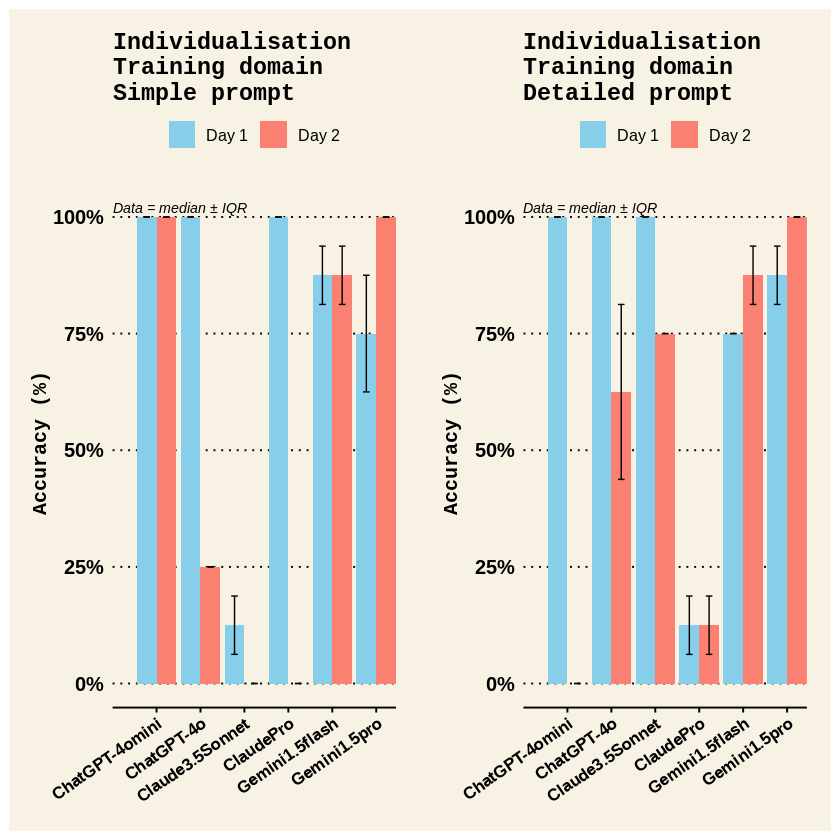

In [172]:
# Create a new SimpleTraining_Accuracy_Individualisation_FINAL dataframe for Figure
SimpleTraining_Accuracy_Individualisation_FINAL <- SimpleTraining_Accuracy_Individualization %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_IndividualizationPC, SimplePrompt_Training_Accuracy_Individualization_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotID)
SimpleTraining_Accuracy_Individualisation_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_Individualisation_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_Individualisation_FINAL <- SimpleTraining_Accuracy_Individualisation_FINAL[order(
  match(SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotID, desired_order), SimpleTraining_Accuracy_Individualisation_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_Individualisation_FINAL dataframe for Figure
DetailedTraining_Accuracy_Individualisation_FINAL <- DetailedTraining_Accuracy_Individualization %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_IndividualizationPC, DetailedPrompt_Training_Accuracy_Individualization_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotID <- as.factor(DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotID)
DetailedTraining_Accuracy_Individualisation_FINAL$TestDay <- as.factor(DetailedTraining_Accuracy_Individualisation_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_Individualisation_FINAL <- DetailedTraining_Accuracy_Individualisation_FINAL[order(
  match(DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotID, desired_order), DetailedTraining_Accuracy_Individualisation_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_Individualisation_FINAL \n")
SimpleTraining_Accuracy_Individualisation_FINAL
cat("\n\n DetailedTraining_Accuracy_Individualisation_FINAL \n")
DetailedTraining_Accuracy_Individualisation_FINAL


# Build bar graph for SimpleTraining_Accuracy_Individualisation_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_Individualisation_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_Individualisation_FINALPLOT <- ggplot(SimpleTraining_Accuracy_Individualisation_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_IndividualizationPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_IndividualizationPC - SimplePrompt_Training_Accuracy_Individualization_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_IndividualizationPC + SimplePrompt_Training_Accuracy_Individualization_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Individualisation\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_Individualisation_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_Individualisation_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_Individualisation_FINALPLOT <- ggplot(DetailedTraining_Accuracy_Individualisation_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_IndividualizationPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_IndividualizationPC - DetailedPrompt_Training_Accuracy_Individualization_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_IndividualizationPC + DetailedPrompt_Training_Accuracy_Individualization_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Individualisation\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingIndividualisationFINALPLOT <- SimpleTraining_Accuracy_Individualisation_FINALPLOT + DetailedTraining_Accuracy_Individualisation_FINALPLOT
# View plots
TrainingIndividualisationFINALPLOT
# Save as jpgs
ggsave("TrainingIndividualisationFINALPLOT.jpg", plot = TrainingIndividualisationFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Disclaimer



 SimpleTraining_Accuracy_Disclaimer_FINAL 


,ChatbotID,TestDay,SimpleTraining_Accuracy_DisclaimerPC,SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.500,0.250,ChatGPT-4omini
10,ChatbotD,Test2,0.750,0.250,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.250,0.250,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.875,0.125,Gemini1.5flash




 DetailedTraining_Accuracy_Disclaimer_FINAL 


,ChatbotID,TestDay,DetailedTraining_Accuracy_DisclaimerPC,DetailedPrompt_Training_Accuracy_Disclaimer_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.500,0.500,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.125,0.125,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.250,0.250,Gemini1.5flash


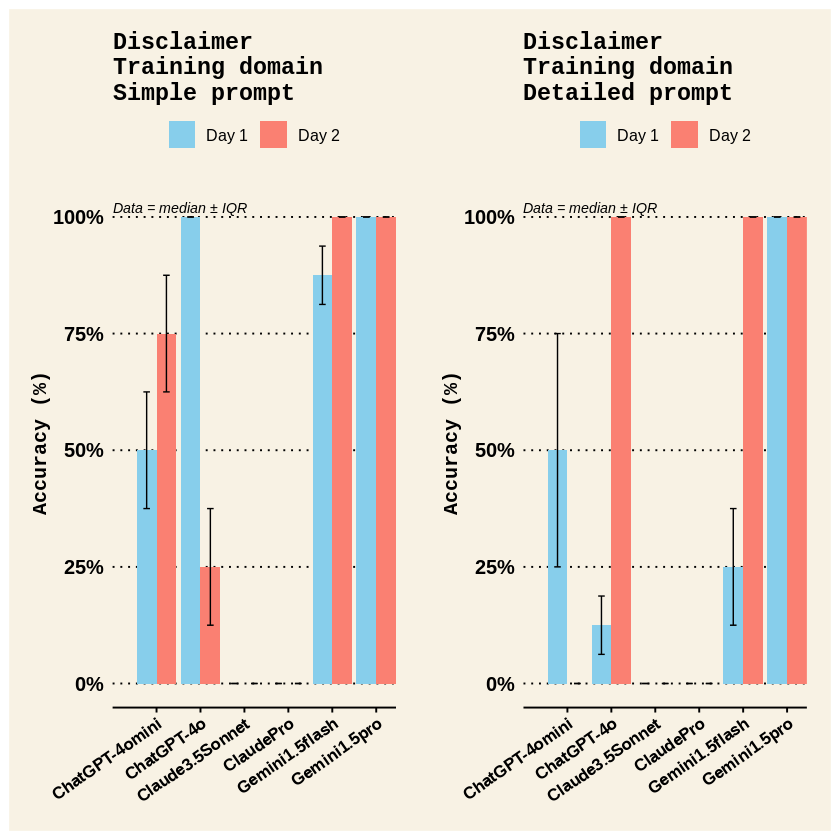

In [173]:
# Create a new SimpleTraining_Accuracy_Disclaimer_FINAL dataframe for Figure
SimpleTraining_Accuracy_Disclaimer_FINAL <- SimpleTraining_Accuracy_Disclaimer %>%
  select(ChatbotID, TestDay, SimpleTraining_Accuracy_DisclaimerPC, SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotID <- as.factor(SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotID)
SimpleTraining_Accuracy_Disclaimer_FINAL$TestDay <- as.factor(SimpleTraining_Accuracy_Disclaimer_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Accuracy_Disclaimer_FINAL <- SimpleTraining_Accuracy_Disclaimer_FINAL[order(
  match(SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotID, desired_order), SimpleTraining_Accuracy_Disclaimer_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotName <- as.factor(SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotName)

# Create a new DetailedTraining_Accuracy_Disclaimer_FINAL dataframe for Figure
DetailedTraining_Accuracy_Disclaimer_FINAL <- DetailedTraining_Accuracy_Disclaimer %>%
  select(ChatbotID, TestDay, DetailedTraining_Accuracy_DisclaimerPC, DetailedPrompt_Training_Accuracy_Disclaimer_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotID <- as.factor(DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotID)
DetailedTraining_Accuracy_Disclaimer_FINAL$TestDay <- as.factor(DetailedTraining_Accuracy_Disclaimer_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Accuracy_Disclaimer_FINAL <- DetailedTraining_Accuracy_Disclaimer_FINAL[order(
  match(DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotID, desired_order), DetailedTraining_Accuracy_Disclaimer_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotName <- as.factor(DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Accuracy_Disclaimer_FINAL \n")
SimpleTraining_Accuracy_Disclaimer_FINAL
cat("\n\n DetailedTraining_Accuracy_Disclaimer_FINAL \n")
DetailedTraining_Accuracy_Disclaimer_FINAL


# Build bar graph for SimpleTraining_Accuracy_Disclaimer_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotName <- factor(
  SimpleTraining_Accuracy_Disclaimer_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleTraining_Accuracy_Disclaimer_FINALPLOT <- ggplot(SimpleTraining_Accuracy_Disclaimer_FINAL, aes(x = ChatbotName,
                                                 y = SimpleTraining_Accuracy_DisclaimerPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleTraining_Accuracy_DisclaimerPC - SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC / 2,
                    ymax = SimpleTraining_Accuracy_DisclaimerPC + SimplePrompt_Training_Accuracy_Disclaimer_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Disclaimer\nTraining domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedTraining_Accuracy_Disclaimer_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotName <- factor(
  DetailedTraining_Accuracy_Disclaimer_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedTraining_Accuracy_Disclaimer_FINALPLOT <- ggplot(DetailedTraining_Accuracy_Disclaimer_FINAL, aes(x = ChatbotName,
                                                 y = DetailedTraining_Accuracy_DisclaimerPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedTraining_Accuracy_DisclaimerPC - DetailedPrompt_Training_Accuracy_Disclaimer_IQR_PC / 2,
                    ymax = DetailedTraining_Accuracy_DisclaimerPC + DetailedPrompt_Training_Accuracy_Disclaimer_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Disclaimer\nTraining domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
TrainingDisclaimerFINALPLOT <- SimpleTraining_Accuracy_Disclaimer_FINALPLOT + DetailedTraining_Accuracy_Disclaimer_FINALPLOT
# View plots
TrainingDisclaimerFINALPLOT
# Save as jpgs
ggsave("TrainingDisclaimerFINALPLOT.jpg", plot = TrainingDisclaimerFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

#### Racing

##### Carb intake days before race



 SimpleRacing_Accuracy_CarbsDaysBefore_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_CarbsDaysBeforePC,SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.625,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.625,0.125,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.875,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.625,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.375,0.125,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.500,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_CarbsDaysBefore_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_CarbsDaysBeforePC,DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,1.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,1.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,1.000,0.000,ClaudePro
9,ChatbotC,Test2,1.000,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash


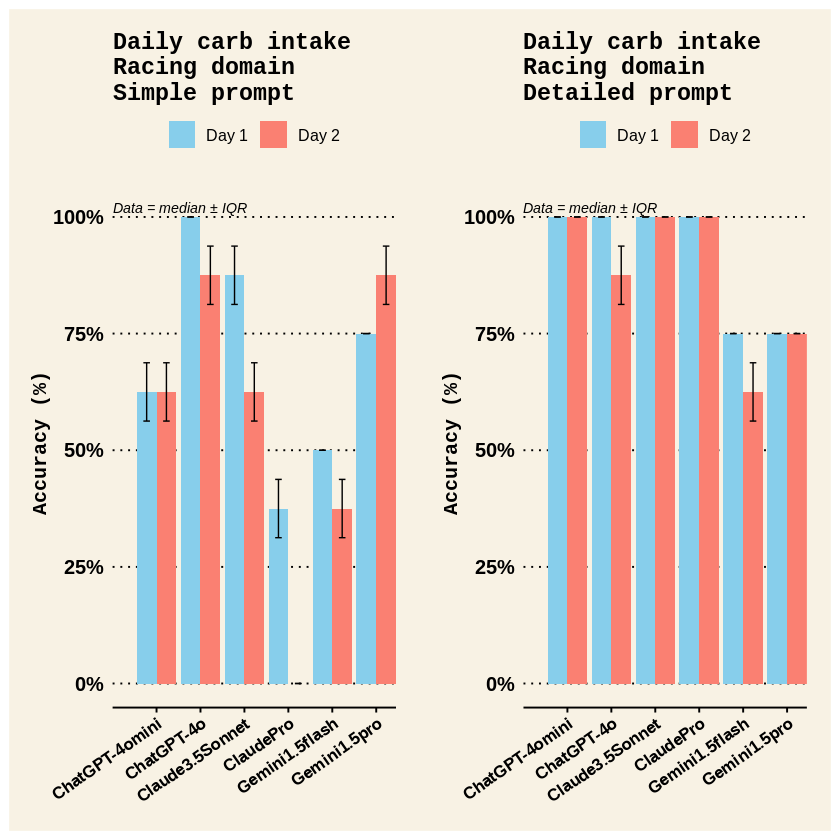

In [174]:
# Create a new SimpleRacing_Accuracy_CarbsDaysBefore_FINAL dataframe for Figure
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL <- SimpleRacing_Accuracy_CarbsDaysBefore %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_CarbsDaysBeforePC, SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID)
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL <- SimpleRacing_Accuracy_CarbsDaysBefore_FINAL[order(
  match(SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_CarbsDaysBefore_FINAL dataframe for Figure
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL <- DetailedRacing_Accuracy_CarbsDaysBefore %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_CarbsDaysBeforePC, DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID)
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL <- DetailedRacing_Accuracy_CarbsDaysBefore_FINAL[order(
  match(DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_CarbsDaysBefore_FINAL \n")
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL
cat("\n\n DetailedRacing_Accuracy_CarbsDaysBefore_FINAL \n")
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL


# Build bar graph for SimpleRacing_Accuracy_CarbsDaysBefore_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_CarbsDaysBefore_FINALPLOT <- ggplot(SimpleRacing_Accuracy_CarbsDaysBefore_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_CarbsDaysBeforePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_CarbsDaysBeforePC - SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_CarbsDaysBeforePC + SimplePrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily carb intake\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_CarbsDaysBefore_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_CarbsDaysBefore_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_CarbsDaysBefore_FINALPLOT <- ggplot(DetailedRacing_Accuracy_CarbsDaysBefore_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_CarbsDaysBeforePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_CarbsDaysBeforePC - DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_CarbsDaysBeforePC + DetailedPrompt_Racing_Accuracy_CarbsDaysBefore_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily carb intake\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingCarbsDaysBeforeFINALPLOT <- SimpleRacing_Accuracy_CarbsDaysBefore_FINALPLOT + DetailedRacing_Accuracy_CarbsDaysBefore_FINALPLOT
# View plots
RacingCarbsDaysBeforeFINALPLOT
# Save as jpgs
ggsave("RacingCarbsDaysBeforeFINALPLOT.jpg", plot = RacingCarbsDaysBeforeFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Food examples days before race



 SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC,SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.125,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.000,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC,DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1,0,ChatGPT-4omini
10,ChatbotD,Test2,1,0,ChatGPT-4omini
2,ChatbotB,Test1,1,0,ChatGPT-4o
8,ChatbotB,Test2,1,0,ChatGPT-4o
6,ChatbotF,Test1,1,0,Claude3.5Sonnet
12,ChatbotF,Test2,1,0,Claude3.5Sonnet
3,ChatbotC,Test1,1,0,ClaudePro
9,ChatbotC,Test2,1,0,ClaudePro
1,ChatbotA,Test1,1,0,Gemini1.5flash


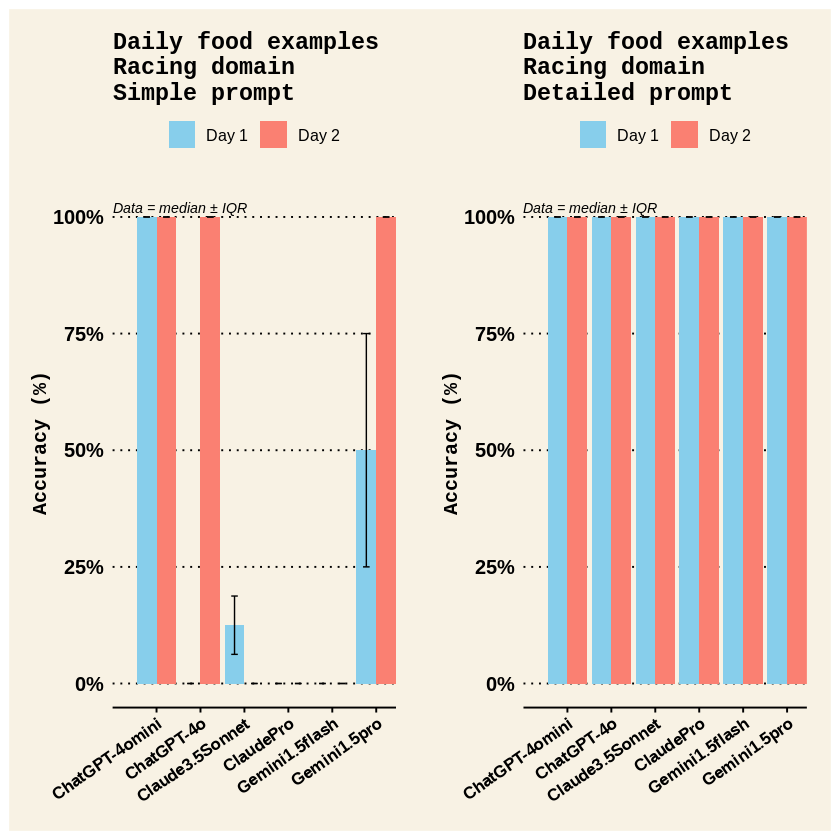

In [175]:
# Create a new SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL dataframe for Figure
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL <- SimpleRacing_Accuracy_CarbsDaysBeforeFoods %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC, SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID)
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL <- SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL[order(
  match(SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL dataframe for Figure
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL <- DetailedRacing_Accuracy_CarbsDaysBeforeFoods %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC, DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID)
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL <- DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL[order(
  match(DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL \n")
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL
cat("\n\n DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL \n")
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL


# Build bar graph for SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINALPLOT <- ggplot(SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC - SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_CarbsDaysBeforeFoodsPC + SimplePrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily food examples\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINALPLOT <- ggplot(DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC - DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_CarbsDaysBeforeFoodsPC + DetailedPrompt_Racing_Accuracy_CarbsDaysBeforeFoods_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Daily food examples\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingCarbsDaysBeforeFoodsFINALPLOT <- SimpleRacing_Accuracy_CarbsDaysBeforeFoods_FINALPLOT + DetailedRacing_Accuracy_CarbsDaysBeforeFoods_FINALPLOT
# View plots
RacingCarbsDaysBeforeFoodsFINALPLOT
# Save as jpgs
ggsave("RacingCarbsDaysBeforeFoodsFINALPLOT.jpg", plot = RacingCarbsDaysBeforeFoodsFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Carb intake hours before race



 SimpleRacing_Accuracy_CarbsHoursBefore_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_CarbsHoursBeforePC,SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
1,ChatbotD,Test1,0.250,0.250,ChatGPT-4omini
2,ChatbotD,Test2,0.625,0.125,ChatGPT-4omini
3,ChatbotB,Test1,0.000,0.000,ChatGPT-4o
4,ChatbotB,Test2,0.375,0.125,ChatGPT-4o
5,ChatbotF,Test1,0.875,0.125,Claude3.5Sonnet
6,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
7,ChatbotC,Test1,0.375,0.125,ClaudePro
8,ChatbotC,Test2,0.875,0.125,ClaudePro
9,ChatbotA,Test1,0.000,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_CarbsHoursBefore_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_CarbsHoursBeforePC,DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
1,ChatbotD,Test1,0.500,0.250,ChatGPT-4omini
2,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
3,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
4,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
5,ChatbotF,Test1,0.875,0.125,Claude3.5Sonnet
6,ChatbotF,Test2,1.000,0.000,Claude3.5Sonnet
7,ChatbotC,Test1,0.875,0.125,ClaudePro
8,ChatbotC,Test2,1.000,0.000,ClaudePro
9,ChatbotA,Test1,1.000,0.000,Gemini1.5flash


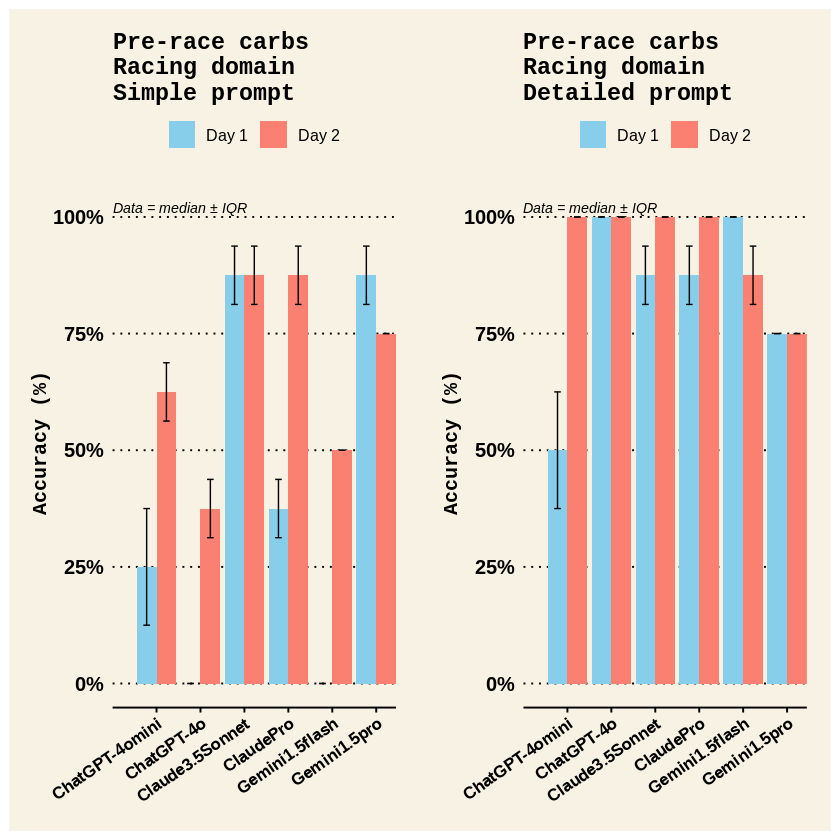

In [176]:
# Create a new SimpleRacing_Accuracy_CarbsHoursBefore_FINAL dataframe for Figure
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL <- SimpleRacing_Accuracy_CarbsHoursBefore %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_CarbsHoursBeforePC, SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotID <- as.factor(SimpleRacing_MeanAccuracy_FINAL$ChatbotID)
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$TestDay <- as.factor(SimpleRacing_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL <- SimpleRacing_Accuracy_CarbsHoursBefore_FINAL[order(
  match(SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotID, desired_order), SimpleRacing_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_CarbsHoursBefore_FINAL dataframe for Figure
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL <- DetailedRacing_Accuracy_CarbsHoursBefore %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_CarbsHoursBeforePC, DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotID <- as.factor(DetailedRacing_MeanAccuracy_FINAL$ChatbotID)
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$TestDay <- as.factor(DetailedRacing_MeanAccuracy_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL <- DetailedRacing_Accuracy_CarbsHoursBefore_FINAL[order(
  match(DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotID, desired_order), DetailedRacing_MeanAccuracy_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_CarbsHoursBefore_FINAL \n")
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL
cat("\n\n DetailedRacing_Accuracy_CarbsHoursBefore_FINAL \n")
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL


# Build bar graph for SimpleRacing_Accuracy_CarbsHoursBefore_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_CarbsHoursBefore_FINALPLOT <- ggplot(SimpleRacing_Accuracy_CarbsHoursBefore_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_CarbsHoursBeforePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_CarbsHoursBeforePC - SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_CarbsHoursBeforePC + SimplePrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Pre-race carbs\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_CarbsHoursBefore_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_CarbsHoursBefore_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_CarbsHoursBefore_FINALPLOT <- ggplot(DetailedRacing_Accuracy_CarbsHoursBefore_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_CarbsHoursBeforePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_CarbsHoursBeforePC - DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_CarbsHoursBeforePC + DetailedPrompt_Racing_Accuracy_CarbsHoursBefore_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Pre-race carbs\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingCarbsHoursBeforeFINALPLOT <- SimpleRacing_Accuracy_CarbsHoursBefore_FINALPLOT + DetailedRacing_Accuracy_CarbsHoursBefore_FINALPLOT
# View plots
RacingCarbsHoursBeforeFINALPLOT
# Save as jpgs
ggsave("RacingCarbsHoursBeforeFINALPLOT.jpg", plot = RacingCarbsHoursBeforeFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Food examples hours before race



 SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC,SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.375,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.500,0.250,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.875,0.125,Gemini1.5flash




 DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC,DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,1.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,1.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,1.000,0.000,ClaudePro
9,ChatbotC,Test2,1.000,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash


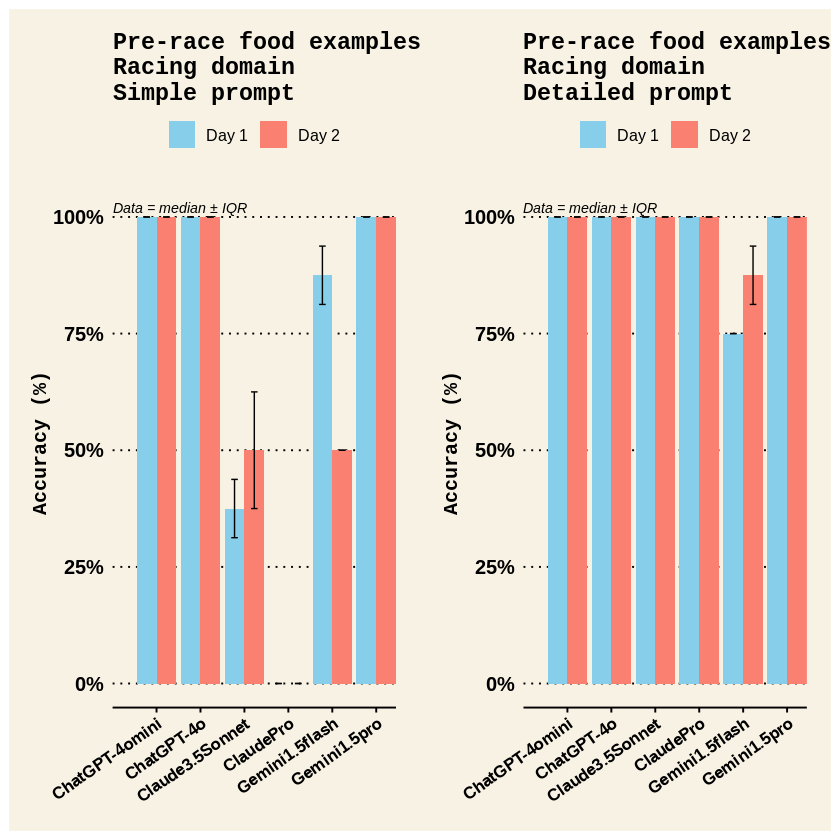

In [177]:
# Create a new SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL dataframe for Figure
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL <- SimpleRacing_Accuracy_CarbsHoursBeforeFoods %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC, SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID)
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL <- SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL[order(
  match(SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL dataframe for Figure
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL <- DetailedRacing_Accuracy_CarbsHoursBeforeFoods %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC, DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID)
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL <- DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL[order(
  match(DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL \n")
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL
cat("\n\n DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL \n")
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL


# Build bar graph for SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINALPLOT <- ggplot(SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC - SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_CarbsHoursBeforeFoodsPC + SimplePrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Pre-race food examples\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINALPLOT <- ggplot(DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC - DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_CarbsHoursBeforeFoodsPC + DetailedPrompt_Racing_Accuracy_CarbsHoursBeforeFoods_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Pre-race food examples\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingCarbsHoursBeforeFoodsFINALPLOT <- SimpleRacing_Accuracy_CarbsHoursBeforeFoods_FINALPLOT + DetailedRacing_Accuracy_CarbsHoursBeforeFoods_FINALPLOT
# View plots
RacingCarbsHoursBeforeFoodsFINALPLOT
# Save as jpgs
ggsave("RacingCarbsHoursBeforeFoodsFINALPLOT.jpg", plot = RacingCarbsHoursBeforeFoodsFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Carb intake during race



 SimpleRacing_Accuracy_CarbsDuringRace_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_CarbsDuringRacePC,SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.750,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.750,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.750,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.750,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.750,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.750,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.750,0.000,ClaudePro
9,ChatbotC,Test2,0.750,0.000,ClaudePro
1,ChatbotA,Test1,0.500,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_CarbsDuringRace_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_CarbsDuringRacePC,DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,1.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,1.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.750,0.000,ClaudePro
9,ChatbotC,Test2,0.750,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash


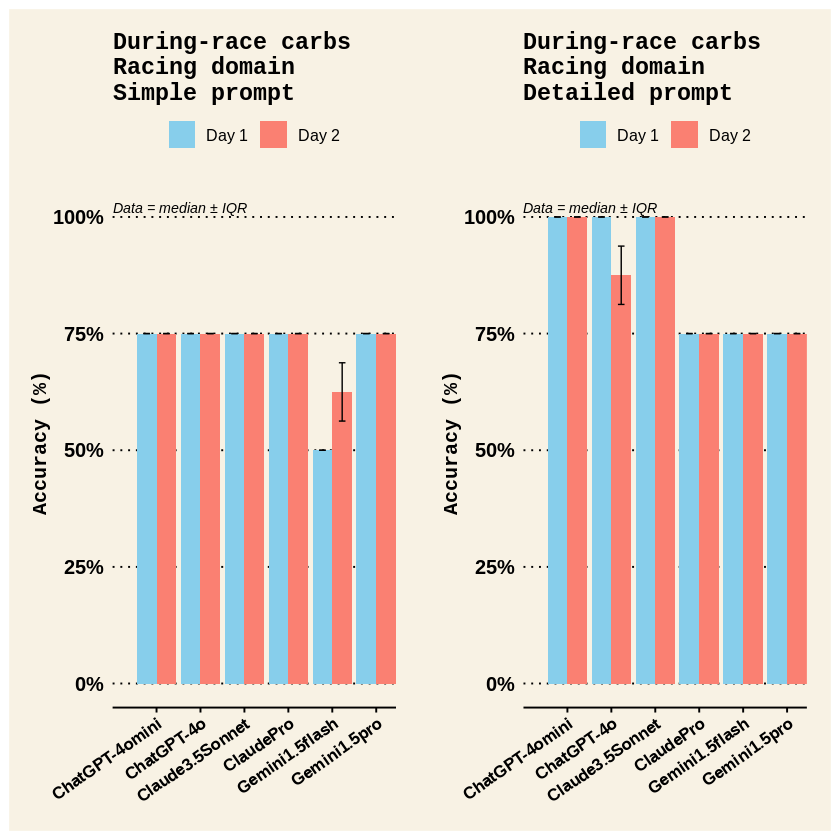

In [178]:
# Create a new SimpleRacing_Accuracy_CarbsDuringRace_FINAL dataframe for Figure
SimpleRacing_Accuracy_CarbsDuringRace_FINAL <- SimpleRacing_Accuracy_CarbsDuringRace %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_CarbsDuringRacePC, SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID)
SimpleRacing_Accuracy_CarbsDuringRace_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_CarbsDuringRace_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_CarbsDuringRace_FINAL <- SimpleRacing_Accuracy_CarbsDuringRace_FINAL[order(
  match(SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_CarbsDuringRace_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_CarbsDuringRace_FINAL dataframe for Figure
DetailedRacing_Accuracy_CarbsDuringRace_FINAL <- DetailedRacing_Accuracy_CarbsDuringRace %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_CarbsDuringRacePC, DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID)
DetailedRacing_Accuracy_CarbsDuringRace_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_CarbsDuringRace_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_CarbsDuringRace_FINAL <- DetailedRacing_Accuracy_CarbsDuringRace_FINAL[order(
  match(DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_CarbsDuringRace_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_CarbsDuringRace_FINAL \n")
SimpleRacing_Accuracy_CarbsDuringRace_FINAL
cat("\n\n DetailedRacing_Accuracy_CarbsDuringRace_FINAL \n")
DetailedRacing_Accuracy_CarbsDuringRace_FINAL


# Build bar graph for SimpleRacing_Accuracy_CarbsDuringRace_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_CarbsDuringRace_FINALPLOT <- ggplot(SimpleRacing_Accuracy_CarbsDuringRace_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_CarbsDuringRacePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_CarbsDuringRacePC - SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_CarbsDuringRacePC + SimplePrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "During-race carbs\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_CarbsDuringRace_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_CarbsDuringRace_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_CarbsDuringRace_FINALPLOT <- ggplot(DetailedRacing_Accuracy_CarbsDuringRace_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_CarbsDuringRacePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_CarbsDuringRacePC - DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_CarbsDuringRacePC + DetailedPrompt_Racing_Accuracy_CarbsDuringRace_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "During-race carbs\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingCarbsDuringRaceFINALPLOT <- SimpleRacing_Accuracy_CarbsDuringRace_FINALPLOT + DetailedRacing_Accuracy_CarbsDuringRace_FINALPLOT
# View plots
RacingCarbsDuringRaceFINALPLOT
# Save as jpgs
ggsave("RacingCarbsDuringRaceFINALPLOT.jpg", plot = RacingCarbsDuringRaceFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Food examples during race



 SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC,SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,1.000,0.000,ClaudePro
9,ChatbotC,Test2,1.000,0.000,ClaudePro
1,ChatbotA,Test1,1.000,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC,DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1,0,ChatGPT-4omini
10,ChatbotD,Test2,1,0,ChatGPT-4omini
2,ChatbotB,Test1,1,0,ChatGPT-4o
8,ChatbotB,Test2,1,0,ChatGPT-4o
6,ChatbotF,Test1,1,0,Claude3.5Sonnet
12,ChatbotF,Test2,1,0,Claude3.5Sonnet
3,ChatbotC,Test1,1,0,ClaudePro
9,ChatbotC,Test2,1,0,ClaudePro
1,ChatbotA,Test1,1,0,Gemini1.5flash


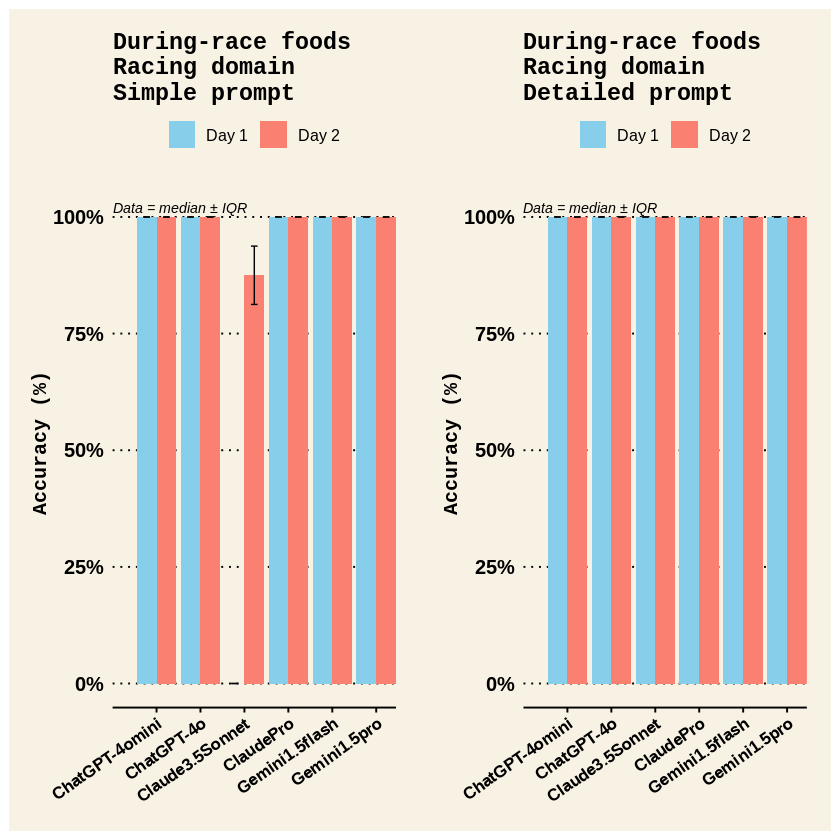

In [179]:
# Create a new SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL dataframe for Figure
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL <- SimpleRacing_Accuracy_CarbsDuringRaceFoods %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC, SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID)
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL <- SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL[order(
  match(SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL dataframe for Figure
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL <- DetailedRacing_Accuracy_CarbsDuringRaceFoods %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC, DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID)
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL <- DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL[order(
  match(DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL \n")
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL
cat("\n\n DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL \n")
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL


# Build bar graph for SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINALPLOT <- ggplot(SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC - SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_CarbsDuringRaceFoodsPC + SimplePrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "During-race foods\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINALPLOT <- ggplot(DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC - DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_CarbsDuringRaceFoodsPC + DetailedPrompt_Racing_Accuracy_CarbsDuringRaceFoods_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "During-race foods\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingCarbsDuringRaceFoodsFINALPLOT <- SimpleRacing_Accuracy_CarbsDuringRaceFoods_FINALPLOT + DetailedRacing_Accuracy_CarbsDuringRaceFoods_FINALPLOT
# View plots
RacingCarbsDuringRaceFoodsFINALPLOT
# Save as jpgs
ggsave("RacingCarbsDuringRaceFoodsFINALPLOT.jpg", plot = RacingCarbsDuringRaceFoodsFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Hydration before race



 SimpleRacing_Accuracy_HydrationBeforeRace_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_HydrationBeforeRacePC,SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.375,0.375,ChatGPT-4omini
10,ChatbotD,Test2,0.250,0.250,ChatGPT-4omini
2,ChatbotB,Test1,0.625,0.125,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_HydrationBeforeRace_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_HydrationBeforeRacePC,DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.625,0.375,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.250,Gemini1.5flash


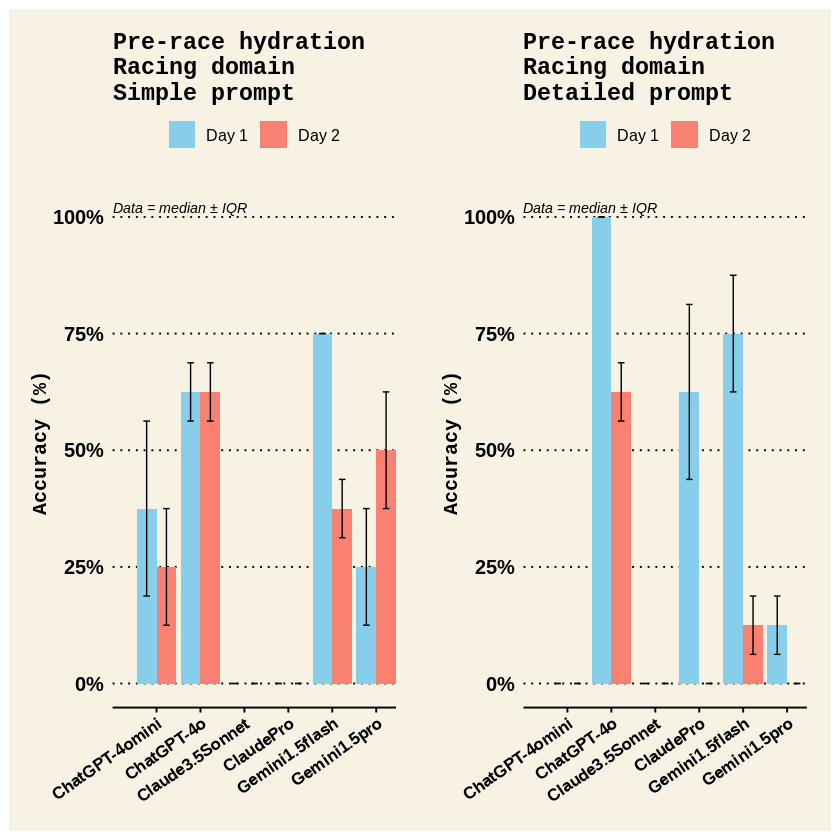

In [180]:
# Create a new SimpleRacing_Accuracy_HydrationBeforeRace_FINAL dataframe for Figure
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL <- SimpleRacing_Accuracy_HydrationBeforeRace %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_HydrationBeforeRacePC, SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID)
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL <- SimpleRacing_Accuracy_HydrationBeforeRace_FINAL[order(
  match(SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_HydrationBeforeRace_FINAL dataframe for Figure
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL <- DetailedRacing_Accuracy_HydrationBeforeRace %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_HydrationBeforeRacePC, DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID)
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL <- DetailedRacing_Accuracy_HydrationBeforeRace_FINAL[order(
  match(DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_HydrationBeforeRace_FINAL \n")
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL
cat("\n\n DetailedRacing_Accuracy_HydrationBeforeRace_FINAL \n")
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL


# Build bar graph for SimpleRacing_Accuracy_HydrationBeforeRace_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_HydrationBeforeRace_FINALPLOT <- ggplot(SimpleRacing_Accuracy_HydrationBeforeRace_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_HydrationBeforeRacePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_HydrationBeforeRacePC - SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_HydrationBeforeRacePC + SimplePrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Pre-race hydration\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_HydrationBeforeRace_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_HydrationBeforeRace_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_HydrationBeforeRace_FINALPLOT <- ggplot(DetailedRacing_Accuracy_HydrationBeforeRace_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_HydrationBeforeRacePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_HydrationBeforeRacePC - DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_HydrationBeforeRacePC + DetailedPrompt_Racing_Accuracy_HydrationBeforeRace_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Pre-race hydration\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingHydrationBeforeRaceFINALPLOT <- SimpleRacing_Accuracy_HydrationBeforeRace_FINALPLOT + DetailedRacing_Accuracy_HydrationBeforeRace_FINALPLOT
# View plots
RacingHydrationBeforeRaceFINALPLOT
# Save as jpgs
ggsave("RacingHydrationBeforeRaceFINALPLOT.jpg", plot = RacingHydrationBeforeRaceFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Hydration during race



 SimpleRacing_Accuracy_HydrationDuringRace_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_HydrationDuringRacePC,SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.625,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.750,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.625,0.375,ChatGPT-4o
8,ChatbotB,Test2,0.750,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.500,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.625,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.250,0.000,ClaudePro
9,ChatbotC,Test2,0.375,0.125,ClaudePro
1,ChatbotA,Test1,0.500,0.250,Gemini1.5flash




 DetailedRacing_Accuracy_HydrationDuringRace_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_HydrationDuringRacePC,DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.500,0.250,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.375,0.125,Gemini1.5flash


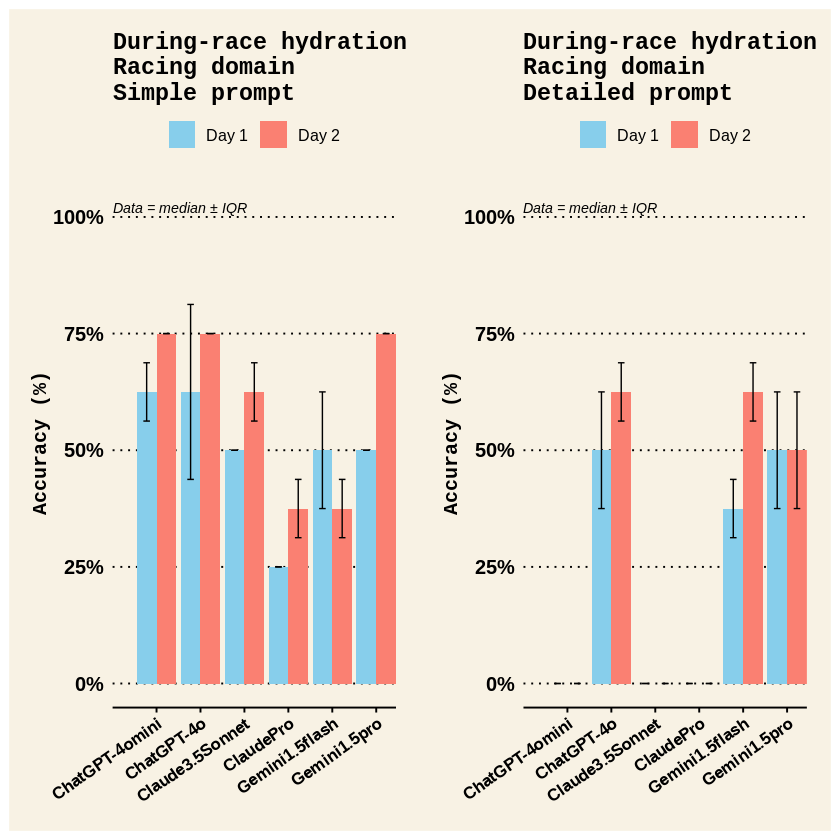

In [181]:
# Create a new SimpleRacing_Accuracy_HydrationDuringRace_FINAL dataframe for Figure
SimpleRacing_Accuracy_HydrationDuringRace_FINAL <- SimpleRacing_Accuracy_HydrationDuringRace %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_HydrationDuringRacePC, SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID)
SimpleRacing_Accuracy_HydrationDuringRace_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_HydrationDuringRace_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_HydrationDuringRace_FINAL <- SimpleRacing_Accuracy_HydrationDuringRace_FINAL[order(
  match(SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_HydrationDuringRace_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_HydrationDuringRace_FINAL dataframe for Figure
DetailedRacing_Accuracy_HydrationDuringRace_FINAL <- DetailedRacing_Accuracy_HydrationDuringRace %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_HydrationDuringRacePC, DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID)
DetailedRacing_Accuracy_HydrationDuringRace_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_HydrationDuringRace_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_HydrationDuringRace_FINAL <- DetailedRacing_Accuracy_HydrationDuringRace_FINAL[order(
  match(DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_HydrationDuringRace_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_HydrationDuringRace_FINAL \n")
SimpleRacing_Accuracy_HydrationDuringRace_FINAL
cat("\n\n DetailedRacing_Accuracy_HydrationDuringRace_FINAL \n")
DetailedRacing_Accuracy_HydrationDuringRace_FINAL


# Build bar graph for SimpleRacing_Accuracy_HydrationDuringRace_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_HydrationDuringRace_FINALPLOT <- ggplot(SimpleRacing_Accuracy_HydrationDuringRace_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_HydrationDuringRacePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_HydrationDuringRacePC - SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_HydrationDuringRacePC + SimplePrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "During-race hydration\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_HydrationDuringRace_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_HydrationDuringRace_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_HydrationDuringRace_FINALPLOT <- ggplot(DetailedRacing_Accuracy_HydrationDuringRace_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_HydrationDuringRacePC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_HydrationDuringRacePC - DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_HydrationDuringRacePC + DetailedPrompt_Racing_Accuracy_HydrationDuringRace_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "During-race hydration\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingHydrationDuringRaceFINALPLOT <- SimpleRacing_Accuracy_HydrationDuringRace_FINALPLOT + DetailedRacing_Accuracy_HydrationDuringRace_FINALPLOT
# View plots
RacingHydrationDuringRaceFINALPLOT
# Save as jpgs
ggsave("RacingHydrationDuringRaceFINALPLOT.jpg", plot = RacingHydrationDuringRaceFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Supplements



 SimpleRacing_Accuracy_Supplements_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_SupplementsPC,SimplePrompt_Racing_Accuracy_Supplements_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.875,0.125,ChatGPT-4omini
10,ChatbotD,Test2,0.125,0.125,ChatGPT-4omini
2,ChatbotB,Test1,0.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.625,0.375,ChatGPT-4o
6,ChatbotF,Test1,1.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.125,0.125,ClaudePro
1,ChatbotA,Test1,0.000,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_Supplements_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_SupplementsPC,DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,1.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.000,0.000,Gemini1.5flash


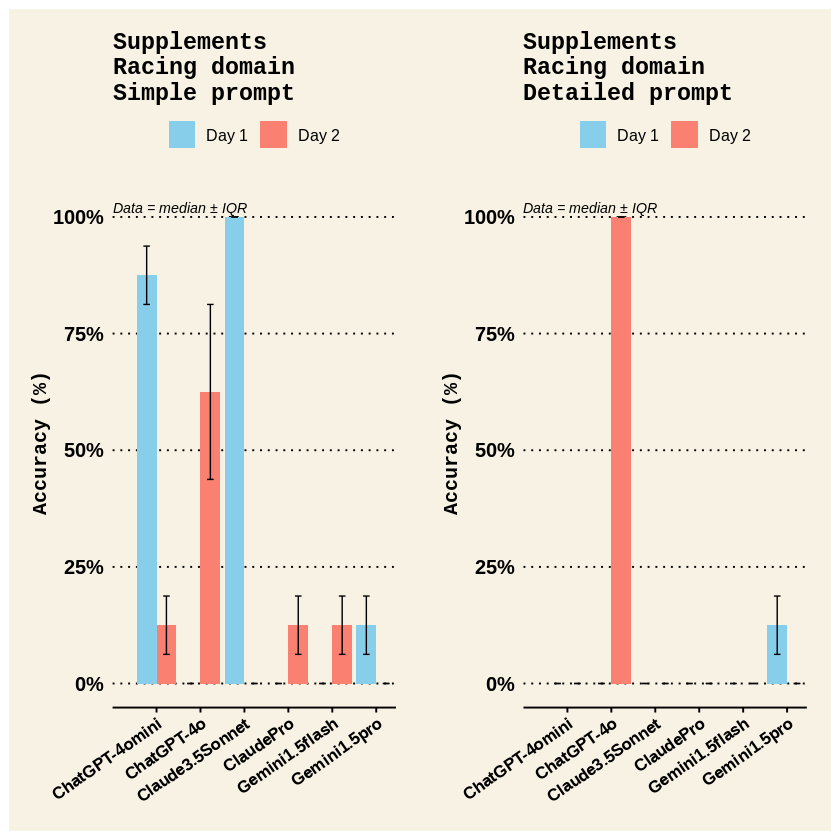

In [182]:
# Create a new SimpleRacing_Accuracy_Supplements_FINAL dataframe for Figure
SimpleRacing_Accuracy_Supplements_FINAL <- SimpleRacing_Accuracy_Supplements %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_SupplementsPC, SimplePrompt_Racing_Accuracy_Supplements_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_Supplements_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_Supplements_FINAL$ChatbotID)
SimpleRacing_Accuracy_Supplements_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_Supplements_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_Supplements_FINAL <- SimpleRacing_Accuracy_Supplements_FINAL[order(
  match(SimpleRacing_Accuracy_Supplements_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_Supplements_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_Supplements_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_Supplements_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_Supplements_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_Supplements_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_Supplements_FINAL dataframe for Figure
DetailedRacing_Accuracy_Supplements_FINAL <- DetailedRacing_Accuracy_Supplements %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_SupplementsPC, DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_Supplements_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_Supplements_FINAL$ChatbotID)
DetailedRacing_Accuracy_Supplements_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_Supplements_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_Supplements_FINAL <- DetailedRacing_Accuracy_Supplements_FINAL[order(
  match(DetailedRacing_Accuracy_Supplements_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_Supplements_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_Supplements_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_Supplements_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_Supplements_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_Supplements_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_Supplements_FINAL \n")
SimpleRacing_Accuracy_Supplements_FINAL
cat("\n\n DetailedRacing_Accuracy_Supplements_FINAL \n")
DetailedRacing_Accuracy_Supplements_FINAL


# Build bar graph for SimpleRacing_Accuracy_Supplements_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_Supplements_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_Supplements_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_Supplements_FINALPLOT <- ggplot(SimpleRacing_Accuracy_Supplements_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_SupplementsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_SupplementsPC - SimplePrompt_Racing_Accuracy_Supplements_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_SupplementsPC + SimplePrompt_Racing_Accuracy_Supplements_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Supplements\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_Supplements_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_Supplements_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_Supplements_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_Supplements_FINALPLOT <- ggplot(DetailedRacing_Accuracy_Supplements_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_SupplementsPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_SupplementsPC - DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_SupplementsPC + DetailedPrompt_Racing_Accuracy_Supplements_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Supplements\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingSupplementsFINALPLOT <- SimpleRacing_Accuracy_Supplements_FINALPLOT + DetailedRacing_Accuracy_Supplements_FINALPLOT
# View plots
RacingSupplementsFINALPLOT
# Save as jpgs
ggsave("RacingSupplementsFINALPLOT.jpg", plot = RacingSupplementsFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Individualisation



 SimpleRacing_Accuracy_Individualization_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_IndividualizationPC,SimplePrompt_Racing_Accuracy_Individualization_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,1.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.500,0.250,Claude3.5Sonnet
12,ChatbotF,Test2,0.250,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.250,0.250,ClaudePro
9,ChatbotC,Test2,0.875,0.125,ClaudePro
1,ChatbotA,Test1,0.875,0.125,Gemini1.5flash




 DetailedRacing_Accuracy_Individualization_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_IndividualizationPC,DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,1.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.875,0.125,ChatGPT-4o
6,ChatbotF,Test1,0.875,0.125,Claude3.5Sonnet
12,ChatbotF,Test2,0.875,0.125,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,0.750,0.000,Gemini1.5flash


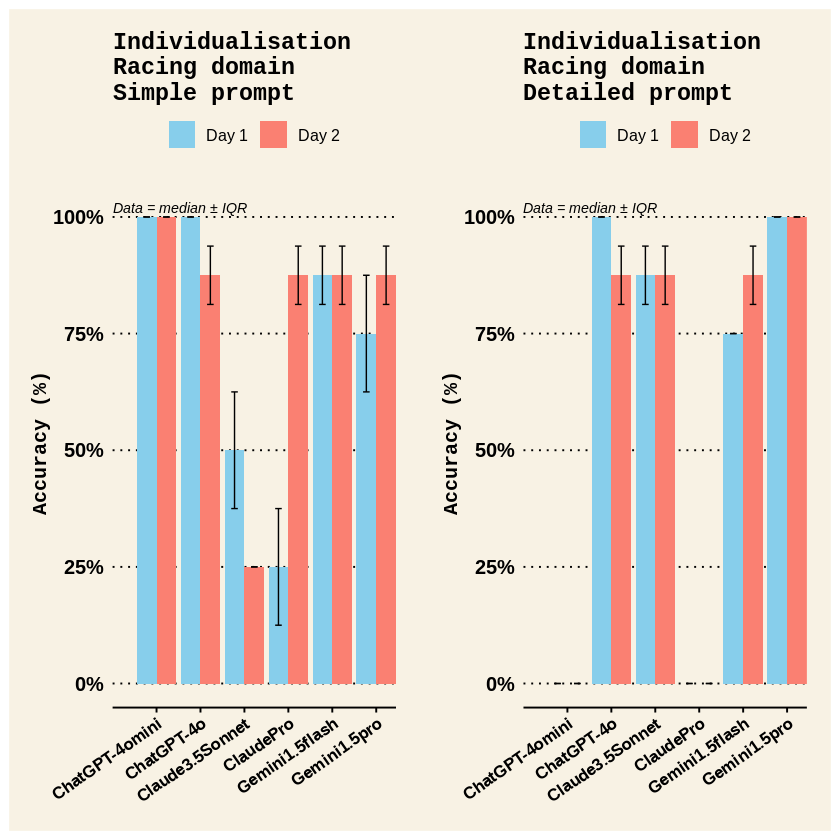

In [183]:
# Create a new SimpleRacing_Accuracy_Individualization_FINAL dataframe for Figure
SimpleRacing_Accuracy_Individualization_FINAL <- SimpleRacing_Accuracy_Individualization %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_IndividualizationPC, SimplePrompt_Racing_Accuracy_Individualization_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_Individualization_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_Individualization_FINAL$ChatbotID)
SimpleRacing_Accuracy_Individualization_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_Individualization_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_Individualization_FINAL <- SimpleRacing_Accuracy_Individualization_FINAL[order(
  match(SimpleRacing_Accuracy_Individualization_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_Individualization_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_Individualization_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_Individualization_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_Individualization_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_Individualization_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_Individualization_FINAL dataframe for Figure
DetailedRacing_Accuracy_Individualization_FINAL <- DetailedRacing_Accuracy_Individualization %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_IndividualizationPC, DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_Individualization_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_Individualization_FINAL$ChatbotID)
DetailedRacing_Accuracy_Individualization_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_Individualization_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_Individualization_FINAL <- DetailedRacing_Accuracy_Individualization_FINAL[order(
  match(DetailedRacing_Accuracy_Individualization_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_Individualization_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_Individualization_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_Individualization_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_Individualization_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_Individualization_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_Individualization_FINAL \n")
SimpleRacing_Accuracy_Individualization_FINAL
cat("\n\n DetailedRacing_Accuracy_Individualization_FINAL \n")
DetailedRacing_Accuracy_Individualization_FINAL


# Build bar graph for SimpleRacing_Accuracy_Individualization_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_Individualization_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_Individualization_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_Individualization_FINALPLOT <- ggplot(SimpleRacing_Accuracy_Individualization_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_IndividualizationPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_IndividualizationPC - SimplePrompt_Racing_Accuracy_Individualization_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_IndividualizationPC + SimplePrompt_Racing_Accuracy_Individualization_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Individualisation\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_Individualization_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_Individualization_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_Individualization_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_Individualization_FINALPLOT <- ggplot(DetailedRacing_Accuracy_Individualization_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_IndividualizationPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_IndividualizationPC - DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_IndividualizationPC + DetailedPrompt_Racing_Accuracy_Individualization_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Individualisation\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingIndividualizationFINALPLOT <- SimpleRacing_Accuracy_Individualization_FINALPLOT + DetailedRacing_Accuracy_Individualization_FINALPLOT
# View plots
RacingIndividualizationFINALPLOT
# Save as jpgs
ggsave("RacingIndividualizationFINALPLOT.jpg", plot = RacingIndividualizationFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

##### Disclaimer



 SimpleRacing_Accuracy_Disclaimer_FINAL 


,ChatbotID,TestDay,SimpleRacing_Accuracy_DisclaimerPC,SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0.000,0.000,ChatGPT-4omini
10,ChatbotD,Test2,0.000,0.000,ChatGPT-4omini
2,ChatbotB,Test1,0.000,0.000,ChatGPT-4o
8,ChatbotB,Test2,0.000,0.000,ChatGPT-4o
6,ChatbotF,Test1,0.000,0.000,Claude3.5Sonnet
12,ChatbotF,Test2,0.000,0.000,Claude3.5Sonnet
3,ChatbotC,Test1,0.000,0.000,ClaudePro
9,ChatbotC,Test2,0.000,0.000,ClaudePro
1,ChatbotA,Test1,1.000,0.000,Gemini1.5flash




 DetailedRacing_Accuracy_Disclaimer_FINAL 


,ChatbotID,TestDay,DetailedRacing_Accuracy_DisclaimerPC,DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,0,0,ChatGPT-4omini
10,ChatbotD,Test2,0,0,ChatGPT-4omini
2,ChatbotB,Test1,0,0,ChatGPT-4o
8,ChatbotB,Test2,0,0,ChatGPT-4o
6,ChatbotF,Test1,0,0,Claude3.5Sonnet
12,ChatbotF,Test2,0,0,Claude3.5Sonnet
3,ChatbotC,Test1,0,0,ClaudePro
9,ChatbotC,Test2,0,0,ClaudePro
1,ChatbotA,Test1,1,0,Gemini1.5flash


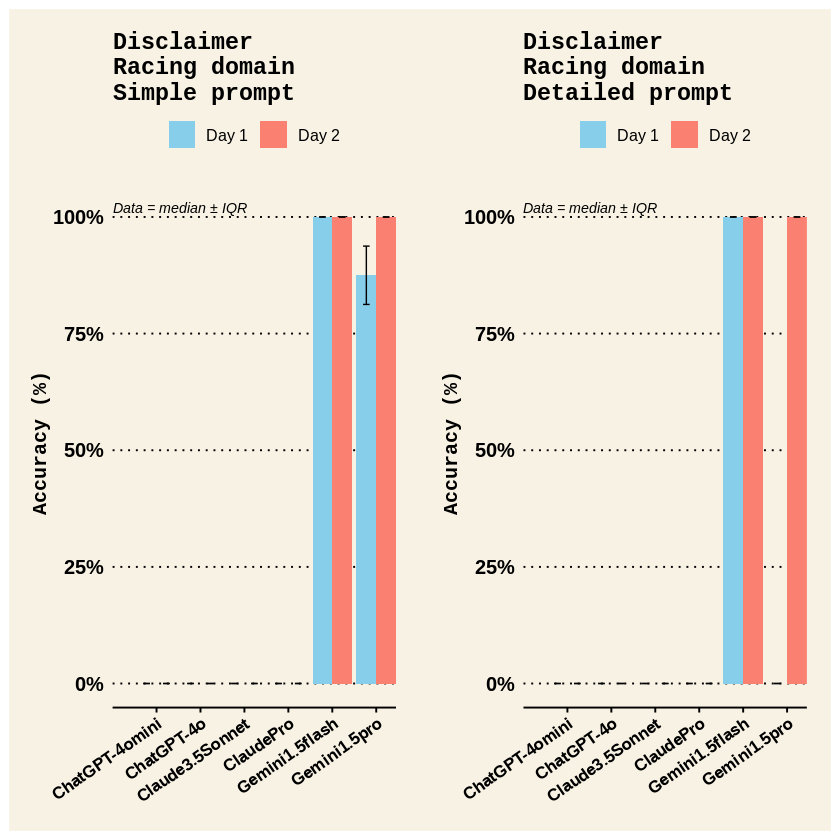

In [184]:
# Create a new SimpleRacing_Accuracy_Disclaimer_FINAL dataframe for Figure
SimpleRacing_Accuracy_Disclaimer_FINAL <- SimpleRacing_Accuracy_Disclaimer %>%
  select(ChatbotID, TestDay, SimpleRacing_Accuracy_DisclaimerPC, SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC)
# Set ChatbotID and TestDay as factors
SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotID <- as.factor(SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotID)
SimpleRacing_Accuracy_Disclaimer_FINAL$TestDay <- as.factor(SimpleRacing_Accuracy_Disclaimer_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Accuracy_Disclaimer_FINAL <- SimpleRacing_Accuracy_Disclaimer_FINAL[order(
  match(SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotID, desired_order), SimpleRacing_Accuracy_Disclaimer_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotName <- as.factor(SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotName)

# Create a new DetailedRacing_Accuracy_Disclaimer_FINAL dataframe for Figure
DetailedRacing_Accuracy_Disclaimer_FINAL <- DetailedRacing_Accuracy_Disclaimer %>%
  select(ChatbotID, TestDay, DetailedRacing_Accuracy_DisclaimerPC, DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC)
# Set ChatbotID and TestDay as factors
DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotID <- as.factor(DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotID)
DetailedRacing_Accuracy_Disclaimer_FINAL$TestDay <- as.factor(DetailedRacing_Accuracy_Disclaimer_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Accuracy_Disclaimer_FINAL <- DetailedRacing_Accuracy_Disclaimer_FINAL[order(
  match(DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotID, desired_order), DetailedRacing_Accuracy_Disclaimer_FINAL$TestDay), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotName <- as.factor(DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Accuracy_Disclaimer_FINAL \n")
SimpleRacing_Accuracy_Disclaimer_FINAL
cat("\n\n DetailedRacing_Accuracy_Disclaimer_FINAL \n")
DetailedRacing_Accuracy_Disclaimer_FINAL


# Build bar graph for SimpleRacing_Accuracy_Disclaimer_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotName <- factor(
  SimpleRacing_Accuracy_Disclaimer_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
SimpleRacing_Accuracy_Disclaimer_FINALPLOT <- ggplot(SimpleRacing_Accuracy_Disclaimer_FINAL, aes(x = ChatbotName,
                                                 y = SimpleRacing_Accuracy_DisclaimerPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimpleRacing_Accuracy_DisclaimerPC - SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2,
                    ymax = SimpleRacing_Accuracy_DisclaimerPC + SimplePrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Disclaimer\nRacing domain\nSimple prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))  + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# Build bar graph for DetailedRacing_Accuracy_Disclaimer_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotName <- factor(
  DetailedRacing_Accuracy_Disclaimer_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)
DetailedRacing_Accuracy_Disclaimer_FINALPLOT <- ggplot(DetailedRacing_Accuracy_Disclaimer_FINAL, aes(x = ChatbotName,
                                                 y = DetailedRacing_Accuracy_DisclaimerPC,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedRacing_Accuracy_DisclaimerPC - DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2,
                    ymax = DetailedRacing_Accuracy_DisclaimerPC + DetailedPrompt_Racing_Accuracy_Disclaimer_IQR_PC / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Accuracy (%)",
       title = "Disclaimer\nRacing domain\nDetailed prompt") +
  scale_y_continuous(labels = scales::percent_format(accuracy = 1), limits = c(0, 1.03)) +  # Adjust y-axis
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate( # Add custom text
    "text",
    x = 0, y = 1.03,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

# create plots
RacingDisclaimerFINALPLOT <- SimpleRacing_Accuracy_Disclaimer_FINALPLOT + DetailedRacing_Accuracy_Disclaimer_FINALPLOT
# View plots
RacingDisclaimerFINALPLOT
# Save as jpgs
ggsave("RacingDisclaimerFINALPLOT.jpg", plot = RacingDisclaimerFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

### Completeness

#### Training



 SimpleTraining_Completeness_FINAL 


,ChatbotID,TestDay,SimplePrompt_Training_Completeness_Median,SimplePrompt_Training_Completeness_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.5,0.5,ChatGPT-4omini
10,ChatbotD,Test2,1.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,3.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,1.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,1.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,1.5,0.5,Claude3.5Sonnet
3,ChatbotC,Test1,1.5,0.5,ClaudePro
9,ChatbotC,Test2,1.0,0.0,ClaudePro
1,ChatbotA,Test1,2.0,0.0,Gemini1.5flash




 DetailedTraining_Completeness_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Training_Completeness_Median,DetailedPrompt_Training_Completeness_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.5,0.5,ChatGPT-4omini
10,ChatbotD,Test2,1.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,1.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,1.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,2.0,1.0,Claude3.5Sonnet
12,ChatbotF,Test2,1.5,0.5,Claude3.5Sonnet
3,ChatbotC,Test1,1.0,0.0,ClaudePro
9,ChatbotC,Test2,1.5,0.5,ClaudePro
1,ChatbotA,Test1,1.5,0.5,Gemini1.5flash


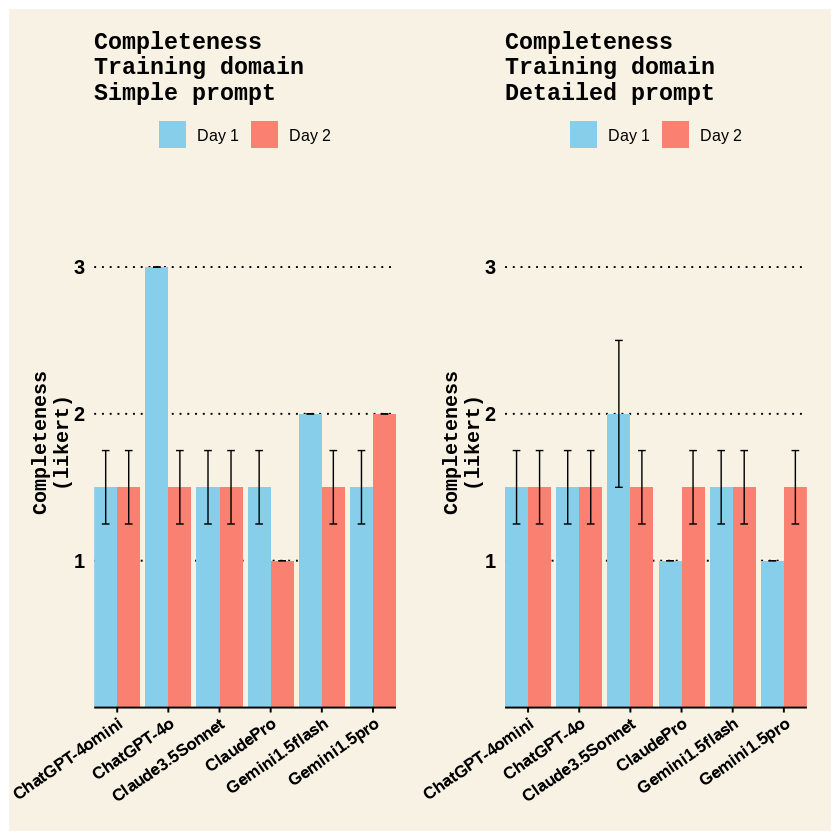

In [185]:
# Create a new SimpleTraining_Completeness_FINAL dataframe for Figure
SimpleTraining_Completeness_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Completeness_Median, SimplePrompt_Training_Completeness_IQR)
# Set ChatbotID and TestDay as factors
SimpleTraining_Completeness_FINAL$ChatbotID <- as.factor(SimpleTraining_Completeness_FINAL$ChatbotID)
SimpleTraining_Completeness_FINAL$TestDay <- as.factor(SimpleTraining_Completeness_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Completeness_FINAL <- SimpleTraining_Completeness_FINAL[order(
  match(SimpleTraining_Completeness_FINAL$ChatbotID, desired_order),
  SimpleTraining_Completeness_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Completeness_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Completeness_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Completeness_FINAL$ChatbotName <- as.factor(SimpleTraining_Completeness_FINAL$ChatbotName)


# Create a new DetailedTraining_Completeness_FINAL dataframe for Figure
DetailedTraining_Completeness_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Completeness_Median, DetailedPrompt_Training_Completeness_IQR)
# Set ChatbotID and TestDay as factors
DetailedTraining_Completeness_FINAL$ChatbotID <- as.factor(DetailedTraining_Completeness_FINAL$ChatbotID)
DetailedTraining_Completeness_FINAL$TestDay <- as.factor(DetailedTraining_Completeness_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Completeness_FINAL <- DetailedTraining_Completeness_FINAL[order(
  match(DetailedTraining_Completeness_FINAL$ChatbotID, desired_order),
  DetailedTraining_Completeness_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Completeness_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Completeness_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Completeness_FINAL$ChatbotName <- as.factor(DetailedTraining_Completeness_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Completeness_FINAL \n")
SimpleTraining_Completeness_FINAL
cat("\n\n DetailedTraining_Completeness_FINAL \n")
DetailedTraining_Completeness_FINAL


# Build bar graph for SimpleTraining_Completeness_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Completeness_FINAL$ChatbotName <- factor(
  SimpleTraining_Completeness_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleTraining_Completeness_FINALPLOT <- ggplot(SimpleTraining_Completeness_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Training_Completeness_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Training_Completeness_Median - SimplePrompt_Training_Completeness_IQR / 2,
                    ymax = SimplePrompt_Training_Completeness_Median + SimplePrompt_Training_Completeness_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Completeness\n(likert)",
       title = "Completeness\nTraining domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedTraining_Completeness_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Completeness_FINAL$ChatbotName <- factor(
  DetailedTraining_Completeness_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedTraining_Completeness_FINALPLOT <- ggplot(DetailedTraining_Completeness_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Training_Completeness_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Training_Completeness_Median - DetailedPrompt_Training_Completeness_IQR / 2,
                    ymax = DetailedPrompt_Training_Completeness_Median + DetailedPrompt_Training_Completeness_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Completeness\n(likert)",
       title = "Completeness\nTraining domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleTraining_Completeness_FINALPLOT + DetailedTraining_Completeness_FINALPLOT

#### Racing



 SimpleRacing_Completeness_FINAL 


,ChatbotID,TestDay,SimplePrompt_Racing_Completeness_Median,SimplePrompt_Racing_Completeness_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1.5,0.5,ChatGPT-4omini
10,ChatbotD,Test2,1.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,2.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,2.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,1.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,1.5,0.5,Claude3.5Sonnet
3,ChatbotC,Test1,1.0,0.0,ClaudePro
9,ChatbotC,Test2,1.0,0.0,ClaudePro
1,ChatbotA,Test1,1.5,0.5,Gemini1.5flash




 DetailedRacing_Completeness_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Racing_Completeness_Median,DetailedPrompt_Racing_Completeness_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,2.0,1.0,ChatGPT-4omini
10,ChatbotD,Test2,1.0,0.0,ChatGPT-4omini
2,ChatbotB,Test1,2.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,3.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,1.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,1.5,0.5,Claude3.5Sonnet
3,ChatbotC,Test1,2.0,1.0,ClaudePro
9,ChatbotC,Test2,1.0,0.0,ClaudePro
1,ChatbotA,Test1,1.5,0.5,Gemini1.5flash


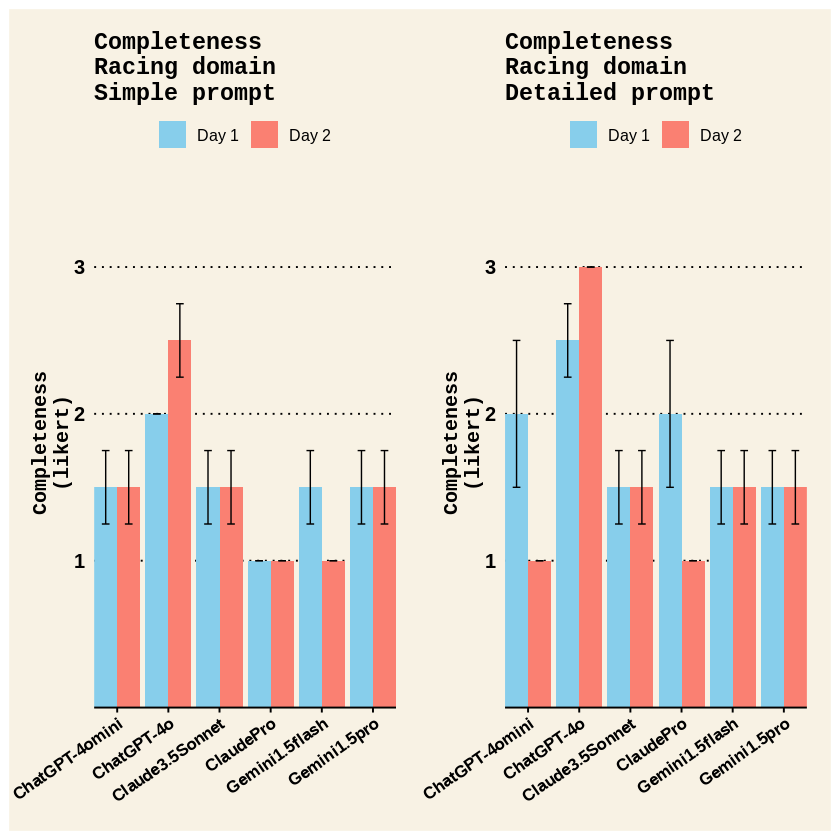

In [186]:
# Create a new SimpleRacing_Completeness_FINAL dataframe for Figure
SimpleRacing_Completeness_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Completeness_Median, SimplePrompt_Racing_Completeness_IQR)
# Set ChatbotID and TestDay as factors
SimpleRacing_Completeness_FINAL$ChatbotID <- as.factor(SimpleRacing_Completeness_FINAL$ChatbotID)
SimpleRacing_Completeness_FINAL$TestDay <- as.factor(SimpleRacing_Completeness_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Completeness_FINAL <- SimpleRacing_Completeness_FINAL[order(
  match(SimpleRacing_Completeness_FINAL$ChatbotID, desired_order),
  SimpleRacing_Completeness_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Completeness_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Completeness_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Completeness_FINAL$ChatbotName <- as.factor(SimpleRacing_Completeness_FINAL$ChatbotName)


# Create a new DetailedRacing_Completeness_FINAL dataframe for Figure
DetailedRacing_Completeness_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Completeness_Median, DetailedPrompt_Racing_Completeness_IQR)
# Set ChatbotID and TestDay as factors
DetailedRacing_Completeness_FINAL$ChatbotID <- as.factor(DetailedRacing_Completeness_FINAL$ChatbotID)
DetailedRacing_Completeness_FINAL$TestDay <- as.factor(DetailedRacing_Completeness_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Completeness_FINAL <- DetailedRacing_Completeness_FINAL[order(
  match(DetailedRacing_Completeness_FINAL$ChatbotID, desired_order),
  DetailedRacing_Completeness_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Completeness_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Completeness_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Completeness_FINAL$ChatbotName <- as.factor(DetailedRacing_Completeness_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Completeness_FINAL \n")
SimpleRacing_Completeness_FINAL
cat("\n\n DetailedRacing_Completeness_FINAL \n")
DetailedRacing_Completeness_FINAL


# Build bar graph for SimpleRacing_Completeness_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Completeness_FINAL$ChatbotName <- factor(
  SimpleRacing_Completeness_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleRacing_Completeness_FINALPLOT <- ggplot(SimpleRacing_Completeness_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Racing_Completeness_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Racing_Completeness_Median - SimplePrompt_Racing_Completeness_IQR / 2,
                    ymax = SimplePrompt_Racing_Completeness_Median + SimplePrompt_Racing_Completeness_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Completeness\n(likert)",
       title = "Completeness\nRacing domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedRacing_Completeness_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Completeness_FINAL$ChatbotName <- factor(
  DetailedRacing_Completeness_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedRacing_Completeness_FINALPLOT <- ggplot(DetailedRacing_Completeness_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Racing_Completeness_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Racing_Completeness_Median - DetailedPrompt_Racing_Completeness_IQR / 2,
                    ymax = DetailedPrompt_Racing_Completeness_Median + DetailedPrompt_Racing_Completeness_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Completeness\n(likert)",
       title = "Completeness\nRacing domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleRacing_Completeness_FINALPLOT + DetailedRacing_Completeness_FINALPLOT

#### Overall



 Simple_CompletenessOverall_FINAL 


,ChatbotID,TestDay,SimplePrompt_Completeness_combined,SimplePrompt_Completeness_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3.0,1.0,ChatGPT-4omini
10,ChatbotD,Test2,3.0,1.0,ChatGPT-4omini
2,ChatbotB,Test1,5.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,4.0,1.0,ChatGPT-4o
6,ChatbotF,Test1,3.0,1.0,Claude3.5Sonnet
12,ChatbotF,Test2,3.0,1.0,Claude3.5Sonnet
3,ChatbotC,Test1,2.5,0.5,ClaudePro
9,ChatbotC,Test2,2.0,0.0,ClaudePro
1,ChatbotA,Test1,3.5,0.5,Gemini1.5flash




 Detailed_CompletenessOverall_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Completeness_combined,DetailedPrompt_Completeness_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3.5,1.5,ChatGPT-4omini
10,ChatbotD,Test2,2.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,4.0,1.0,ChatGPT-4o
8,ChatbotB,Test2,4.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,3.5,1.5,Claude3.5Sonnet
12,ChatbotF,Test2,3.0,1.0,Claude3.5Sonnet
3,ChatbotC,Test1,3.0,1.0,ClaudePro
9,ChatbotC,Test2,2.5,0.5,ClaudePro
1,ChatbotA,Test1,3.0,1.0,Gemini1.5flash


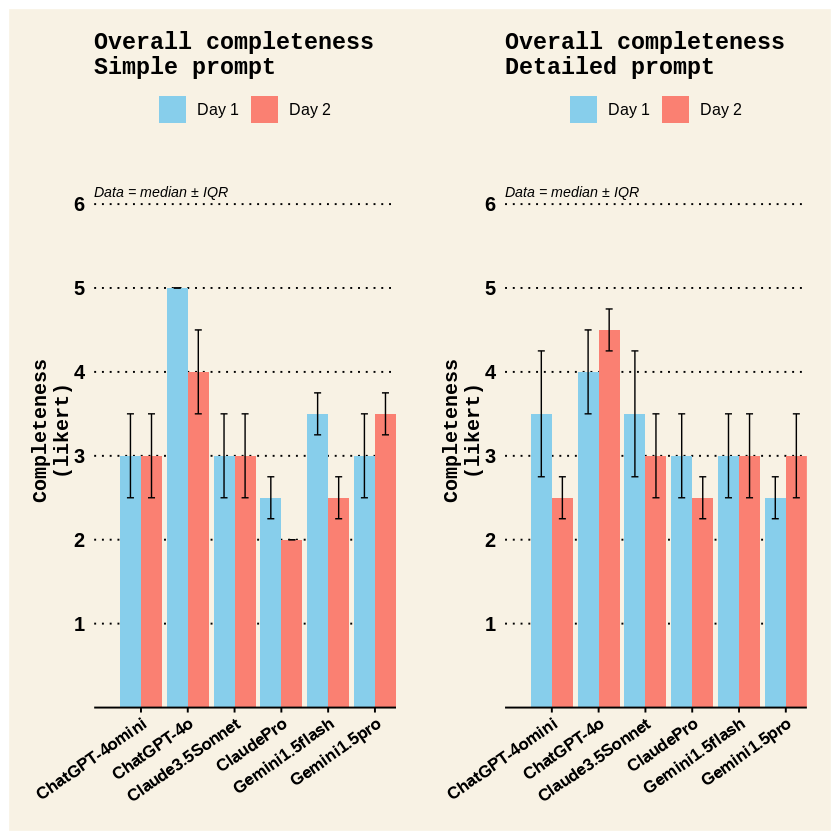

In [187]:
# Create a new Simple_CompletenessOverall_FINAL dataframe for Figure
Simple_CompletenessOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Completeness_combined, SimplePrompt_Completeness_combinedIQR)
# Set ChatbotID and TestDay as factors
Simple_CompletenessOverall_FINAL$ChatbotID <- as.factor(Simple_CompletenessOverall_FINAL$ChatbotID)
Simple_CompletenessOverall_FINAL$TestDay <- as.factor(Simple_CompletenessOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Simple_CompletenessOverall_FINAL <- Simple_CompletenessOverall_FINAL[order(
  match(Simple_CompletenessOverall_FINAL$ChatbotID, desired_order),
  Simple_CompletenessOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Simple_CompletenessOverall_FINAL$ChatbotName <- chatbot_names[Simple_CompletenessOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Simple_CompletenessOverall_FINAL$ChatbotName <- as.factor(Simple_CompletenessOverall_FINAL$ChatbotName)


# Create a new Detailed_CompletenessOverall_FINAL dataframe for Figure
Detailed_CompletenessOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Completeness_combined, DetailedPrompt_Completeness_combinedIQR)
# Set ChatbotID and TestDay as factors
Detailed_CompletenessOverall_FINAL$ChatbotID <- as.factor(Detailed_CompletenessOverall_FINAL$ChatbotID)
Detailed_CompletenessOverall_FINAL$TestDay <- as.factor(Detailed_CompletenessOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Detailed_CompletenessOverall_FINAL <- Detailed_CompletenessOverall_FINAL[order(
  match(Detailed_CompletenessOverall_FINAL$ChatbotID, desired_order),
  Detailed_CompletenessOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Detailed_CompletenessOverall_FINAL$ChatbotName <- chatbot_names[Detailed_CompletenessOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Detailed_CompletenessOverall_FINAL$ChatbotName <- as.factor(Detailed_CompletenessOverall_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n Simple_CompletenessOverall_FINAL \n")
Simple_CompletenessOverall_FINAL
cat("\n\n Detailed_CompletenessOverall_FINAL \n")
Detailed_CompletenessOverall_FINAL


# Build bar graph for Simple_CompletenessOverall_FINAL
# Set ChatbotName as a factor with the desired order
Simple_CompletenessOverall_FINAL$ChatbotName <- factor(
  Simple_CompletenessOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Simple_CompletenessOverall_FINALPLOT <- ggplot(Simple_CompletenessOverall_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Completeness_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Completeness_combined - SimplePrompt_Completeness_combinedIQR / 2,
                    ymax = SimplePrompt_Completeness_combined + SimplePrompt_Completeness_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Completeness\n(likert)",
       title = "Overall completeness\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )


# Build bar graph for Detailed_CompletenessOverall_FINAL
# Set ChatbotName as a factor with the desired order
Detailed_CompletenessOverall_FINAL$ChatbotName <- factor(
  Detailed_CompletenessOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Detailed_CompletenessOverall_FINALPLOT <- ggplot(Detailed_CompletenessOverall_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Completeness_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Completeness_combined - DetailedPrompt_Completeness_combinedIQR / 2,
                    ymax = DetailedPrompt_Completeness_combined + DetailedPrompt_Completeness_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Completeness\n(likert)",
       title = "Overall completeness\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

Simple_CompletenessOverall_FINALPLOT + Detailed_CompletenessOverall_FINALPLOT

#### Plots for manuscript

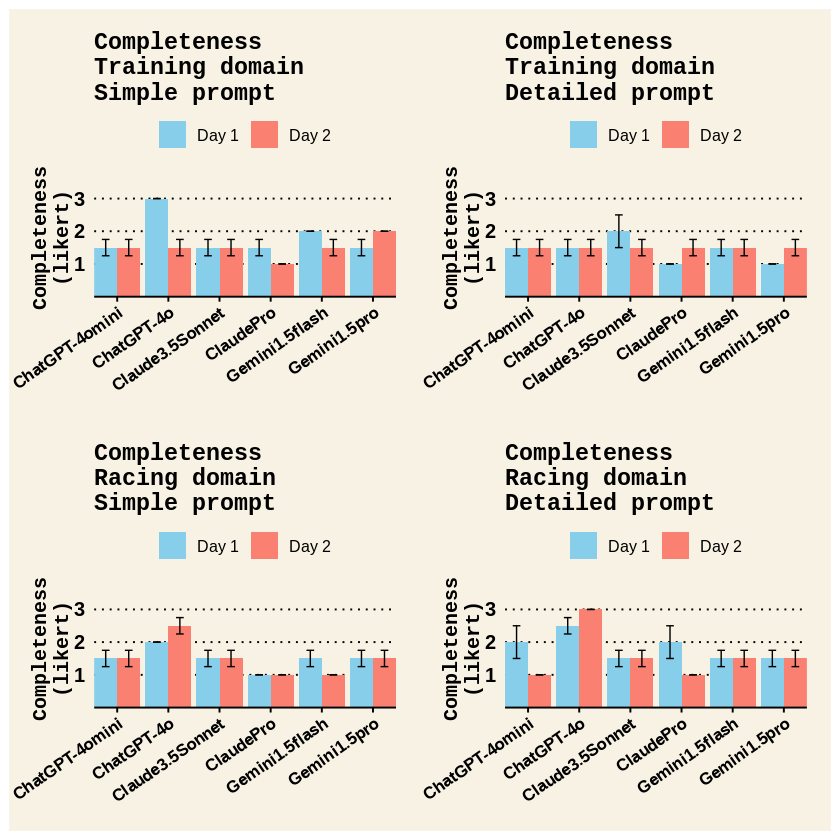

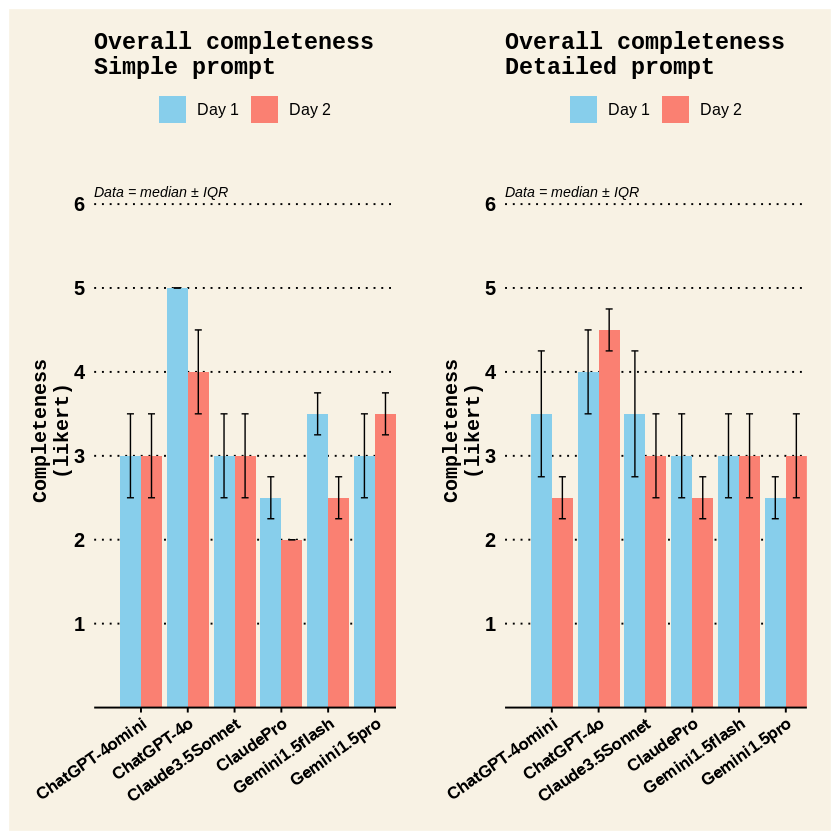

In [188]:
# create plots
TrainingCompletenessFINALPLOT <- SimpleTraining_Completeness_FINALPLOT + DetailedTraining_Completeness_FINALPLOT
RacingCompletenessFINALPLOT <- SimpleRacing_Completeness_FINALPLOT + DetailedRacing_Completeness_FINALPLOT
TrainingRacingCompletenessFINALPLOT <- TrainingCompletenessFINALPLOT / RacingCompletenessFINALPLOT
OverallCompletenessFINALPLOT <- Simple_CompletenessOverall_FINALPLOT + Detailed_CompletenessOverall_FINALPLOT
# View plots
TrainingRacingCompletenessFINALPLOT
OverallCompletenessFINALPLOT
# Save as jpgs
ggsave("TrainingRacingCompletenessFINALPLOT.jpg", plot = TrainingRacingCompletenessFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)
ggsave("OverallCompletenessFINALPLOT.jpg", plot = OverallCompletenessFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

### Clarity

#### Training



 SimpleTraining_Clarity_FINAL 


,ChatbotID,TestDay,SimplePrompt_Training_Clarity_Median,SimplePrompt_Training_Clarity_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,3.0,0.0,ChatGPT-4omini
2,ChatbotB,Test1,3.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,3.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,2.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,2.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,2.5,0.5,ClaudePro
9,ChatbotC,Test2,3.0,0.0,ClaudePro
1,ChatbotA,Test1,3.0,0.0,Gemini1.5flash




 DetailedTraining_Clarity_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Training_Clarity_Median,DetailedPrompt_Training_Clarity_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,3.0,0.0,ChatGPT-4omini
2,ChatbotB,Test1,3.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,2.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,3.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,3.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,3.0,0.0,ClaudePro
9,ChatbotC,Test2,3.0,0.0,ClaudePro
1,ChatbotA,Test1,3.0,0.0,Gemini1.5flash


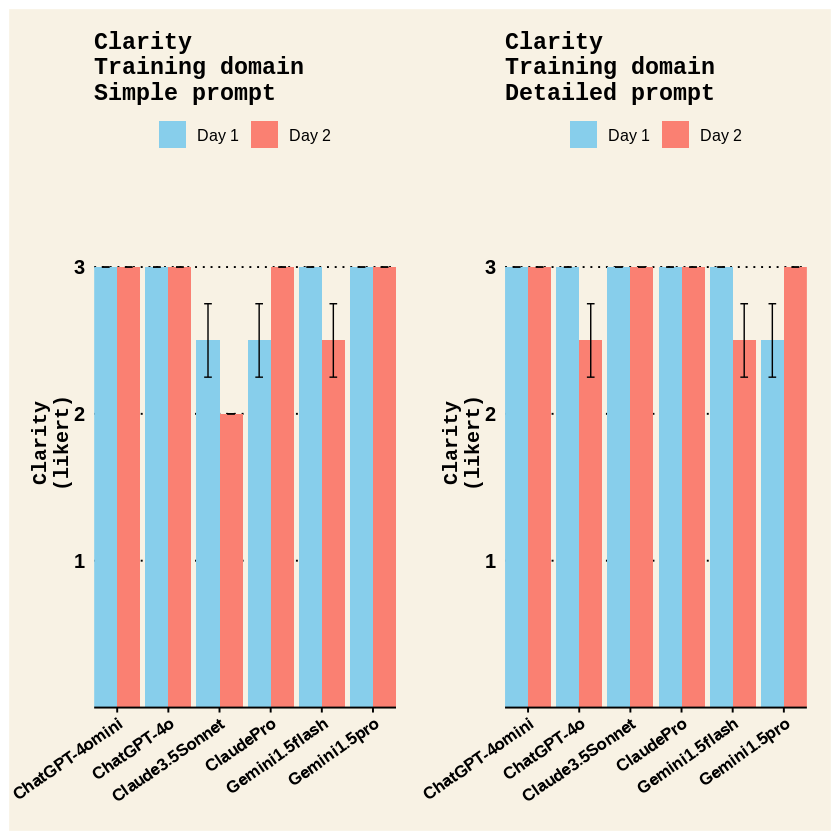

In [189]:
# Create a new SimpleTraining_Clarity_FINAL dataframe for Figure
SimpleTraining_Clarity_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Clarity_Median, SimplePrompt_Training_Clarity_IQR)
# Set ChatbotID and TestDay as factors
SimpleTraining_Clarity_FINAL$ChatbotID <- as.factor(SimpleTraining_Clarity_FINAL$ChatbotID)
SimpleTraining_Clarity_FINAL$TestDay <- as.factor(SimpleTraining_Clarity_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Clarity_FINAL <- SimpleTraining_Clarity_FINAL[order(
  match(SimpleTraining_Clarity_FINAL$ChatbotID, desired_order),
  SimpleTraining_Clarity_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Clarity_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Clarity_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Clarity_FINAL$ChatbotName <- as.factor(SimpleTraining_Clarity_FINAL$ChatbotName)


# Create a new DetailedTraining_Clarity_FINAL dataframe for Figure
DetailedTraining_Clarity_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Clarity_Median, DetailedPrompt_Training_Clarity_IQR)
# Set ChatbotID and TestDay as factors
DetailedTraining_Clarity_FINAL$ChatbotID <- as.factor(DetailedTraining_Clarity_FINAL$ChatbotID)
DetailedTraining_Clarity_FINAL$TestDay <- as.factor(DetailedTraining_Clarity_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Clarity_FINAL <- DetailedTraining_Clarity_FINAL[order(
  match(DetailedTraining_Clarity_FINAL$ChatbotID, desired_order),
  DetailedTraining_Clarity_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Clarity_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Clarity_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Clarity_FINAL$ChatbotName <- as.factor(DetailedTraining_Clarity_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Clarity_FINAL \n")
SimpleTraining_Clarity_FINAL
cat("\n\n DetailedTraining_Clarity_FINAL \n")
DetailedTraining_Clarity_FINAL


# Build bar graph for SimpleTraining_Clarity_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Clarity_FINAL$ChatbotName <- factor(
  SimpleTraining_Clarity_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleTraining_Clarity_FINALPLOT <- ggplot(SimpleTraining_Clarity_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Training_Clarity_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Training_Clarity_Median - SimplePrompt_Training_Clarity_IQR / 2,
                    ymax = SimplePrompt_Training_Clarity_Median + SimplePrompt_Training_Clarity_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Clarity\n(likert)",
       title = "Clarity\nTraining domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedTraining_Clarity_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Clarity_FINAL$ChatbotName <- factor(
  DetailedTraining_Clarity_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedTraining_Clarity_FINALPLOT <- ggplot(DetailedTraining_Clarity_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Training_Clarity_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Training_Clarity_Median - DetailedPrompt_Training_Clarity_IQR / 2,
                    ymax = DetailedPrompt_Training_Clarity_Median + DetailedPrompt_Training_Clarity_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Clarity\n(likert)",
       title = "Clarity\nTraining domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleTraining_Clarity_FINALPLOT + DetailedTraining_Clarity_FINALPLOT

#### Racing



 SimpleRacing_Clarity_FINAL 


,ChatbotID,TestDay,SimplePrompt_Racing_Clarity_Median,SimplePrompt_Racing_Clarity_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,3.0,0.0,ChatGPT-4omini
2,ChatbotB,Test1,3.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,3.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,2.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,2.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,2.5,0.5,ClaudePro
9,ChatbotC,Test2,2.5,0.5,ClaudePro
1,ChatbotA,Test1,3.0,0.0,Gemini1.5flash




 DetailedRacing_Clarity_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Racing_Clarity_Median,DetailedPrompt_Racing_Clarity_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3,0,ChatGPT-4omini
10,ChatbotD,Test2,3,0,ChatGPT-4omini
2,ChatbotB,Test1,3,0,ChatGPT-4o
8,ChatbotB,Test2,3,0,ChatGPT-4o
6,ChatbotF,Test1,3,0,Claude3.5Sonnet
12,ChatbotF,Test2,3,0,Claude3.5Sonnet
3,ChatbotC,Test1,3,0,ClaudePro
9,ChatbotC,Test2,3,0,ClaudePro
1,ChatbotA,Test1,3,0,Gemini1.5flash


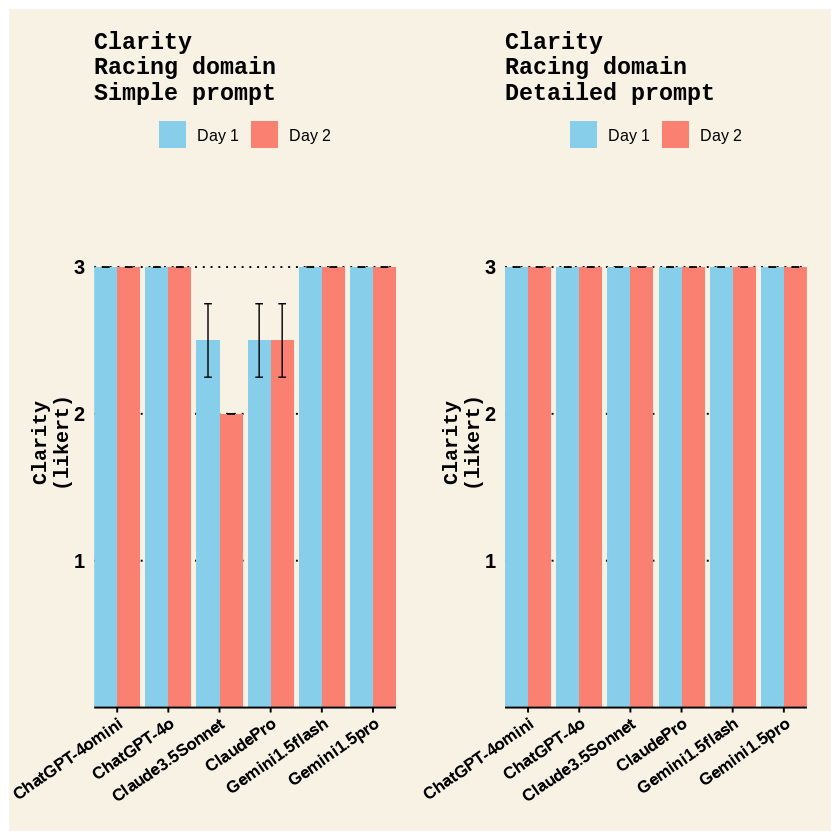

In [190]:
# Create a new SimpleRacing_Clarity_FINAL dataframe for Figure
SimpleRacing_Clarity_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Clarity_Median, SimplePrompt_Racing_Clarity_IQR)
# Set ChatbotID and TestDay as factors
SimpleRacing_Clarity_FINAL$ChatbotID <- as.factor(SimpleRacing_Clarity_FINAL$ChatbotID)
SimpleRacing_Clarity_FINAL$TestDay <- as.factor(SimpleRacing_Clarity_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Clarity_FINAL <- SimpleRacing_Clarity_FINAL[order(
  match(SimpleRacing_Clarity_FINAL$ChatbotID, desired_order),
  SimpleRacing_Clarity_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Clarity_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Clarity_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Clarity_FINAL$ChatbotName <- as.factor(SimpleRacing_Clarity_FINAL$ChatbotName)


# Create a new DetailedRacing_Clarity_FINAL dataframe for Figure
DetailedRacing_Clarity_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Clarity_Median, DetailedPrompt_Racing_Clarity_IQR)
# Set ChatbotID and TestDay as factors
DetailedRacing_Clarity_FINAL$ChatbotID <- as.factor(DetailedRacing_Clarity_FINAL$ChatbotID)
DetailedRacing_Clarity_FINAL$TestDay <- as.factor(DetailedRacing_Clarity_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Clarity_FINAL <- DetailedRacing_Clarity_FINAL[order(
  match(DetailedRacing_Clarity_FINAL$ChatbotID, desired_order),
  DetailedRacing_Clarity_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Clarity_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Clarity_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Clarity_FINAL$ChatbotName <- as.factor(DetailedRacing_Clarity_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Clarity_FINAL \n")
SimpleRacing_Clarity_FINAL
cat("\n\n DetailedRacing_Clarity_FINAL \n")
DetailedRacing_Clarity_FINAL



# Build bar graph for SimpleRacing_Clarity_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Clarity_FINAL$ChatbotName <- factor(
  SimpleRacing_Clarity_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleRacing_Clarity_FINALPLOT <- ggplot(SimpleRacing_Clarity_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Racing_Clarity_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Racing_Clarity_Median - SimplePrompt_Racing_Clarity_IQR / 2,
                    ymax = SimplePrompt_Racing_Clarity_Median + SimplePrompt_Racing_Clarity_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Clarity\n(likert)",
       title = "Clarity\nRacing domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedRacing_Clarity_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Clarity_FINAL$ChatbotName <- factor(
  DetailedRacing_Clarity_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedRacing_Clarity_FINALPLOT <- ggplot(DetailedRacing_Clarity_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Racing_Clarity_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Racing_Clarity_Median - DetailedPrompt_Racing_Clarity_IQR / 2,
                    ymax = DetailedPrompt_Racing_Clarity_Median + DetailedPrompt_Racing_Clarity_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Clarity\n(likert)",
       title = "Clarity\nRacing domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleRacing_Clarity_FINALPLOT + DetailedRacing_Clarity_FINALPLOT

#### Overall



 Simple_ClarityOverall_FINAL 


,ChatbotID,TestDay,SimplePrompt_Clarity_combined,SimplePrompt_Clarity_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,6.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,6.0,0.0,ChatGPT-4omini
2,ChatbotB,Test1,6.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,6.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,5.0,1.0,Claude3.5Sonnet
12,ChatbotF,Test2,4.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,5.0,1.0,ClaudePro
9,ChatbotC,Test2,5.5,0.5,ClaudePro
1,ChatbotA,Test1,6.0,0.0,Gemini1.5flash




 Detailed_ClarityOverall_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Clarity_combined,DetailedPrompt_Clarity_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,6.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,6.0,0.0,ChatGPT-4omini
2,ChatbotB,Test1,6.0,0.0,ChatGPT-4o
8,ChatbotB,Test2,5.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,6.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,6.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,6.0,0.0,ClaudePro
9,ChatbotC,Test2,6.0,0.0,ClaudePro
1,ChatbotA,Test1,6.0,0.0,Gemini1.5flash


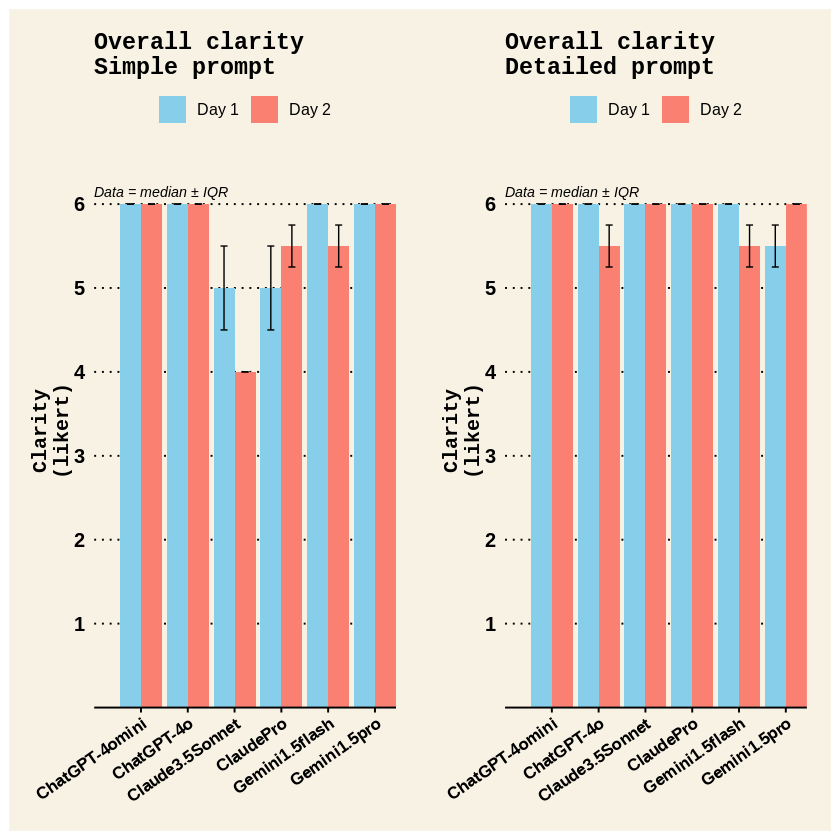

In [191]:
# Create a new Simple_ClarityOverall_FINAL dataframe for Figure
Simple_ClarityOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Clarity_combined, SimplePrompt_Clarity_combinedIQR)
# Set ChatbotID and TestDay as factors
Simple_ClarityOverall_FINAL$ChatbotID <- as.factor(Simple_ClarityOverall_FINAL$ChatbotID)
Simple_ClarityOverall_FINAL$TestDay <- as.factor(Simple_ClarityOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Simple_ClarityOverall_FINAL <- Simple_ClarityOverall_FINAL[order(
  match(Simple_ClarityOverall_FINAL$ChatbotID, desired_order),
  Simple_ClarityOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Simple_ClarityOverall_FINAL$ChatbotName <- chatbot_names[Simple_ClarityOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Simple_ClarityOverall_FINAL$ChatbotName <- as.factor(Simple_ClarityOverall_FINAL$ChatbotName)


# Create a new Detailed_ClarityOverall_FINAL dataframe for Figure
Detailed_ClarityOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Clarity_combined, DetailedPrompt_Clarity_combinedIQR)
# Set ChatbotID and TestDay as factors
Detailed_ClarityOverall_FINAL$ChatbotID <- as.factor(Detailed_ClarityOverall_FINAL$ChatbotID)
Detailed_ClarityOverall_FINAL$TestDay <- as.factor(Detailed_ClarityOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Detailed_ClarityOverall_FINAL <- Detailed_ClarityOverall_FINAL[order(
  match(Detailed_ClarityOverall_FINAL$ChatbotID, desired_order),
  Detailed_ClarityOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Detailed_ClarityOverall_FINAL$ChatbotName <- chatbot_names[Detailed_ClarityOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Detailed_ClarityOverall_FINAL$ChatbotName <- as.factor(Detailed_ClarityOverall_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n Simple_ClarityOverall_FINAL \n")
Simple_ClarityOverall_FINAL
cat("\n\n Detailed_ClarityOverall_FINAL \n")
Detailed_ClarityOverall_FINAL



# Build bar graph for Simple_ClarityOverall_FINAL
# Set ChatbotName as a factor with the desired order
Simple_ClarityOverall_FINAL$ChatbotName <- factor(
  Simple_ClarityOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Simple_ClarityOverall_FINALPLOT <- ggplot(Simple_ClarityOverall_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Clarity_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Clarity_combined - SimplePrompt_Clarity_combinedIQR / 2,
                    ymax = SimplePrompt_Clarity_combined + SimplePrompt_Clarity_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Clarity\n(likert)",
       title = "Overall clarity\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )


# Build bar graph for Detailed_ClarityOverall_FINAL
# Set ChatbotName as a factor with the desired order
Detailed_ClarityOverall_FINAL$ChatbotName <- factor(
  Detailed_ClarityOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Detailed_ClarityOverall_FINALPLOT <- ggplot(Detailed_ClarityOverall_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Clarity_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Clarity_combined - DetailedPrompt_Clarity_combinedIQR / 2,
                    ymax = DetailedPrompt_Clarity_combined + DetailedPrompt_Clarity_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Clarity\n(likert)",
       title = "Overall clarity\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

Simple_ClarityOverall_FINALPLOT + Detailed_ClarityOverall_FINALPLOT

#### Plots for manuscript

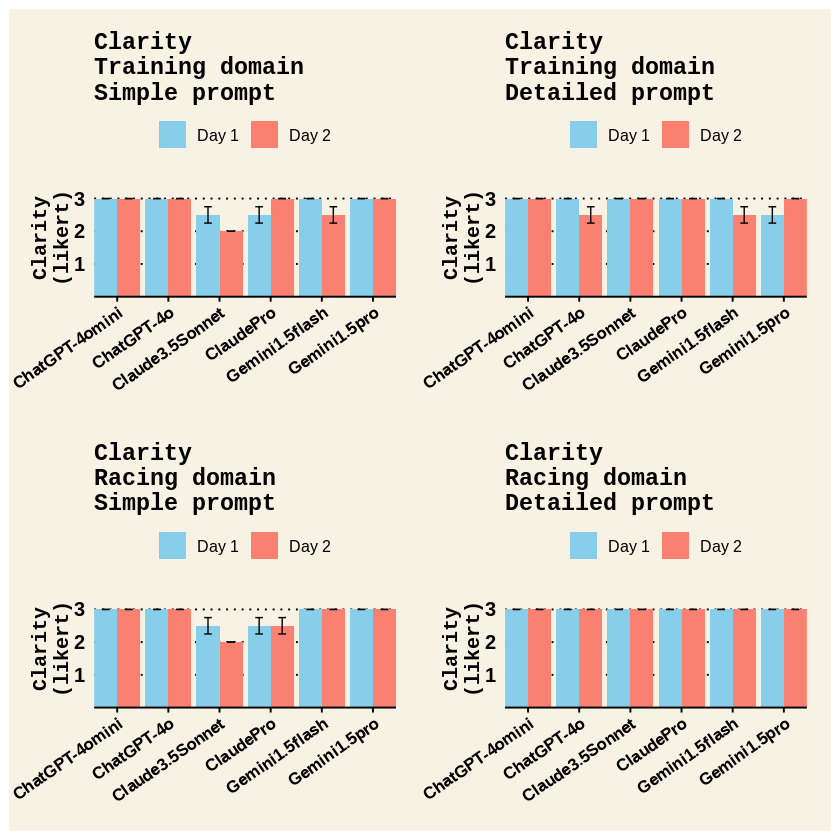

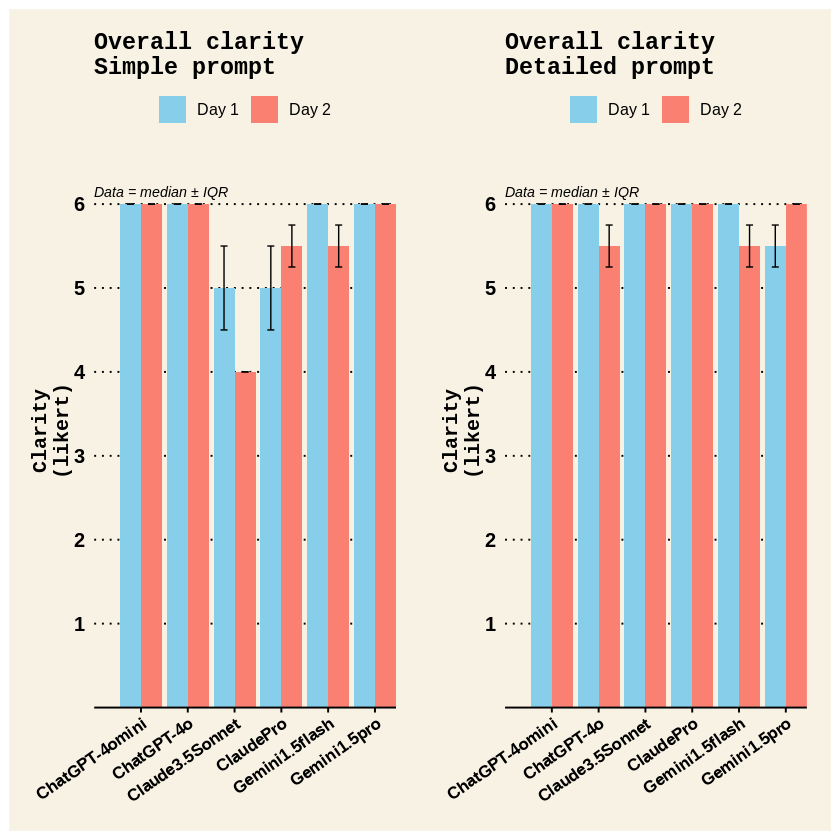

In [192]:
# create plots
TrainingClarityFINALPLOT <- SimpleTraining_Clarity_FINALPLOT + DetailedTraining_Clarity_FINALPLOT
RacingClarityFINALPLOT <- SimpleRacing_Clarity_FINALPLOT + DetailedRacing_Clarity_FINALPLOT
TrainingRacingClarityFINALPLOT <- TrainingClarityFINALPLOT / RacingClarityFINALPLOT
OverallClarityFINALPLOT <- Simple_ClarityOverall_FINALPLOT + Detailed_ClarityOverall_FINALPLOT
# View plots
TrainingRacingClarityFINALPLOT
OverallClarityFINALPLOT
# Save as jpgs
ggsave("TrainingRacingClarityFINALPLOT.jpg", plot = TrainingRacingClarityFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)
ggsave("OverallClarityFINALPLOT.jpg", plot = OverallClarityFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

### Quality of evidence

#### Training



 SimpleTraining_Evidence_FINAL 


,ChatbotID,TestDay,SimplePrompt_Training_Evidence_Median,SimplePrompt_Training_Evidence_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1,0,ChatGPT-4omini
10,ChatbotD,Test2,1,0,ChatGPT-4omini
2,ChatbotB,Test1,1,0,ChatGPT-4o
8,ChatbotB,Test2,1,0,ChatGPT-4o
6,ChatbotF,Test1,1,0,Claude3.5Sonnet
12,ChatbotF,Test2,1,0,Claude3.5Sonnet
3,ChatbotC,Test1,1,0,ClaudePro
9,ChatbotC,Test2,1,0,ClaudePro
1,ChatbotA,Test1,1,0,Gemini1.5flash




 DetailedTraining_Evidence_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Training_Evidence_Median,DetailedPrompt_Training_Evidence_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,2.0,1.0,ChatGPT-4omini
10,ChatbotD,Test2,2.0,1.0,ChatGPT-4omini
2,ChatbotB,Test1,1.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,2.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,3.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,3.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,2.0,1.0,ClaudePro
9,ChatbotC,Test2,3.0,0.0,ClaudePro
1,ChatbotA,Test1,2.0,1.0,Gemini1.5flash


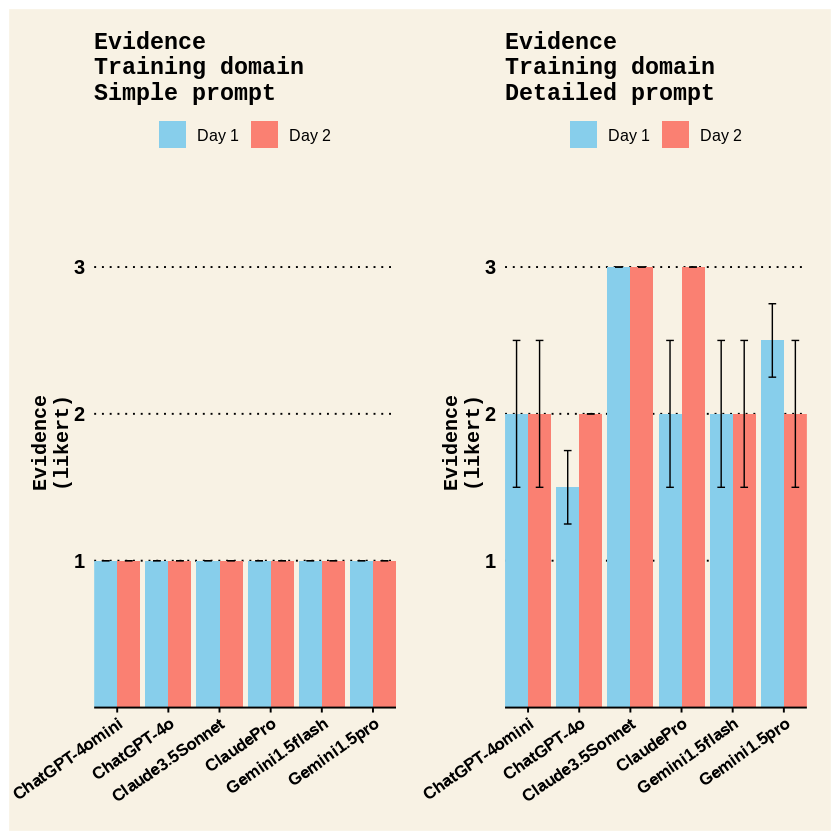

In [193]:
# Create a new SimpleTraining_Evidence_FINAL dataframe for Figure
SimpleTraining_Evidence_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_Evidence_Median, SimplePrompt_Training_Evidence_IQR)
# Set ChatbotID and TestDay as factors
SimpleTraining_Evidence_FINAL$ChatbotID <- as.factor(SimpleTraining_Evidence_FINAL$ChatbotID)
SimpleTraining_Evidence_FINAL$TestDay <- as.factor(SimpleTraining_Evidence_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_Evidence_FINAL <- SimpleTraining_Evidence_FINAL[order(
  match(SimpleTraining_Evidence_FINAL$ChatbotID, desired_order),
  SimpleTraining_Evidence_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_Evidence_FINAL$ChatbotName <- chatbot_names[SimpleTraining_Evidence_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_Evidence_FINAL$ChatbotName <- as.factor(SimpleTraining_Evidence_FINAL$ChatbotName)


# Create a new DetailedTraining_Evidence_FINAL dataframe for Figure
DetailedTraining_Evidence_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_Evidence_Median, DetailedPrompt_Training_Evidence_IQR)
# Set ChatbotID and TestDay as factors
DetailedTraining_Evidence_FINAL$ChatbotID <- as.factor(DetailedTraining_Evidence_FINAL$ChatbotID)
DetailedTraining_Evidence_FINAL$TestDay <- as.factor(DetailedTraining_Evidence_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_Evidence_FINAL <- DetailedTraining_Evidence_FINAL[order(
  match(DetailedTraining_Evidence_FINAL$ChatbotID, desired_order),
  DetailedTraining_Evidence_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_Evidence_FINAL$ChatbotName <- chatbot_names[DetailedTraining_Evidence_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_Evidence_FINAL$ChatbotName <- as.factor(DetailedTraining_Evidence_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_Evidence_FINAL \n")
SimpleTraining_Evidence_FINAL
cat("\n\n DetailedTraining_Evidence_FINAL \n")
DetailedTraining_Evidence_FINAL


# Build bar graph for SimpleTraining_Evidence_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_Evidence_FINAL$ChatbotName <- factor(
  SimpleTraining_Evidence_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleTraining_Evidence_FINALPLOT <- ggplot(SimpleTraining_Evidence_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Training_Evidence_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Training_Evidence_Median - SimplePrompt_Training_Evidence_IQR / 2,
                    ymax = SimplePrompt_Training_Evidence_Median + SimplePrompt_Training_Evidence_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Evidence\n(likert)",
       title = "Evidence\nTraining domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedTraining_Evidence_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_Evidence_FINAL$ChatbotName <- factor(
  DetailedTraining_Evidence_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedTraining_Evidence_FINALPLOT <- ggplot(DetailedTraining_Evidence_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Training_Evidence_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Training_Evidence_Median - DetailedPrompt_Training_Evidence_IQR / 2,
                    ymax = DetailedPrompt_Training_Evidence_Median + DetailedPrompt_Training_Evidence_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Evidence\n(likert)",
       title = "Evidence\nTraining domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleTraining_Evidence_FINALPLOT + DetailedTraining_Evidence_FINALPLOT

#### Racing



 SimpleRacing_Evidence_FINAL 


,ChatbotID,TestDay,SimplePrompt_Racing_Evidence_Median,SimplePrompt_Racing_Evidence_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,1,0,ChatGPT-4omini
10,ChatbotD,Test2,1,0,ChatGPT-4omini
2,ChatbotB,Test1,1,0,ChatGPT-4o
8,ChatbotB,Test2,1,0,ChatGPT-4o
6,ChatbotF,Test1,1,0,Claude3.5Sonnet
12,ChatbotF,Test2,1,0,Claude3.5Sonnet
3,ChatbotC,Test1,1,0,ClaudePro
9,ChatbotC,Test2,1,0,ClaudePro
1,ChatbotA,Test1,1,0,Gemini1.5flash




 DetailedRacing_Evidence_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Racing_Evidence_Median,DetailedPrompt_Racing_Evidence_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,2.5,0.5,ChatGPT-4omini
10,ChatbotD,Test2,2.0,1.0,ChatGPT-4omini
2,ChatbotB,Test1,1.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,2.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,3.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,3.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,3.0,0.0,ClaudePro
9,ChatbotC,Test2,3.0,0.0,ClaudePro
1,ChatbotA,Test1,2.0,1.0,Gemini1.5flash


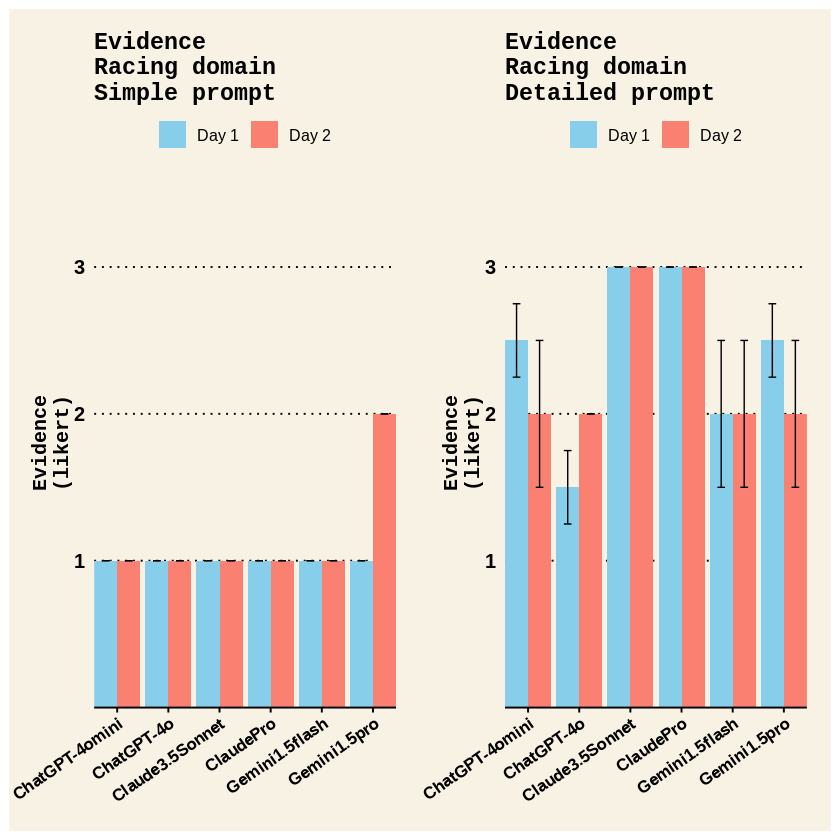

In [194]:
# Create a new SimpleRacing_Evidence_FINAL dataframe for Figure
SimpleRacing_Evidence_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_Evidence_Median, SimplePrompt_Racing_Evidence_IQR)
# Set ChatbotID and TestDay as factors
SimpleRacing_Evidence_FINAL$ChatbotID <- as.factor(SimpleRacing_Evidence_FINAL$ChatbotID)
SimpleRacing_Evidence_FINAL$TestDay <- as.factor(SimpleRacing_Evidence_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_Evidence_FINAL <- SimpleRacing_Evidence_FINAL[order(
  match(SimpleRacing_Evidence_FINAL$ChatbotID, desired_order),
  SimpleRacing_Evidence_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_Evidence_FINAL$ChatbotName <- chatbot_names[SimpleRacing_Evidence_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_Evidence_FINAL$ChatbotName <- as.factor(SimpleRacing_Evidence_FINAL$ChatbotName)


# Create a new DetailedRacing_Evidence_FINAL dataframe for Figure
DetailedRacing_Evidence_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_Evidence_Median, DetailedPrompt_Racing_Evidence_IQR)
# Set ChatbotID and TestDay as factors
DetailedRacing_Evidence_FINAL$ChatbotID <- as.factor(DetailedRacing_Evidence_FINAL$ChatbotID)
DetailedRacing_Evidence_FINAL$TestDay <- as.factor(DetailedRacing_Evidence_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_Evidence_FINAL <- DetailedRacing_Evidence_FINAL[order(
  match(DetailedRacing_Evidence_FINAL$ChatbotID, desired_order),
  DetailedRacing_Evidence_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_Evidence_FINAL$ChatbotName <- chatbot_names[DetailedRacing_Evidence_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_Evidence_FINAL$ChatbotName <- as.factor(DetailedRacing_Evidence_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_Evidence_FINAL \n")
SimpleRacing_Evidence_FINAL
cat("\n\n DetailedRacing_Evidence_FINAL \n")
DetailedRacing_Evidence_FINAL



# Build bar graph for SimpleRacing_Evidence_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_Evidence_FINAL$ChatbotName <- factor(
  SimpleRacing_Evidence_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleRacing_Evidence_FINALPLOT <- ggplot(SimpleRacing_Evidence_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Racing_Evidence_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Racing_Evidence_Median - SimplePrompt_Racing_Evidence_IQR / 2,
                    ymax = SimplePrompt_Racing_Evidence_Median + SimplePrompt_Racing_Evidence_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Evidence\n(likert)",
       title = "Evidence\nRacing domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedRacing_Evidence_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_Evidence_FINAL$ChatbotName <- factor(
  DetailedRacing_Evidence_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedRacing_Evidence_FINALPLOT <- ggplot(DetailedRacing_Evidence_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Racing_Evidence_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Racing_Evidence_Median - DetailedPrompt_Racing_Evidence_IQR / 2,
                    ymax = DetailedPrompt_Racing_Evidence_Median + DetailedPrompt_Racing_Evidence_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Evidence\n(likert)",
       title = "Evidence\nRacing domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleRacing_Evidence_FINALPLOT + DetailedRacing_Evidence_FINALPLOT

#### Overall



 Simple_EvidenceOverall_FINAL 


,ChatbotID,TestDay,SimplePrompt_Evidence_combined,SimplePrompt_Evidence_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,2,0,ChatGPT-4omini
10,ChatbotD,Test2,2,0,ChatGPT-4omini
2,ChatbotB,Test1,2,0,ChatGPT-4o
8,ChatbotB,Test2,2,0,ChatGPT-4o
6,ChatbotF,Test1,2,0,Claude3.5Sonnet
12,ChatbotF,Test2,2,0,Claude3.5Sonnet
3,ChatbotC,Test1,2,0,ClaudePro
9,ChatbotC,Test2,2,0,ClaudePro
1,ChatbotA,Test1,2,0,Gemini1.5flash




 Detailed_EvidenceOverall_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Evidence_combined,DetailedPrompt_Evidence_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,4.5,1.5,ChatGPT-4omini
10,ChatbotD,Test2,4.0,2.0,ChatGPT-4omini
2,ChatbotB,Test1,3.0,1.0,ChatGPT-4o
8,ChatbotB,Test2,4.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,6.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,6.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,5.0,1.0,ClaudePro
9,ChatbotC,Test2,6.0,0.0,ClaudePro
1,ChatbotA,Test1,4.0,2.0,Gemini1.5flash


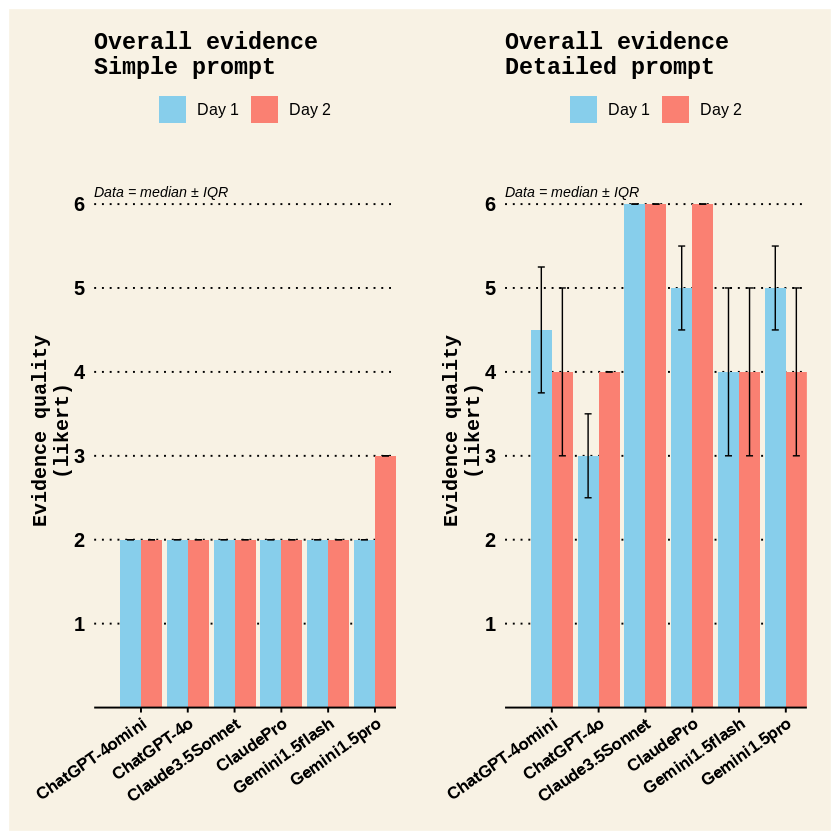

In [195]:
# Create a new Simple_EvidenceOverall_FINAL dataframe for Figure
Simple_EvidenceOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Evidence_combined, SimplePrompt_Evidence_combinedIQR)
# Set ChatbotID and TestDay as factors
Simple_EvidenceOverall_FINAL$ChatbotID <- as.factor(Simple_EvidenceOverall_FINAL$ChatbotID)
Simple_EvidenceOverall_FINAL$TestDay <- as.factor(Simple_EvidenceOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Simple_EvidenceOverall_FINAL <- Simple_EvidenceOverall_FINAL[order(
  match(Simple_EvidenceOverall_FINAL$ChatbotID, desired_order),
  Simple_EvidenceOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Simple_EvidenceOverall_FINAL$ChatbotName <- chatbot_names[Simple_EvidenceOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Simple_EvidenceOverall_FINAL$ChatbotName <- as.factor(Simple_EvidenceOverall_FINAL$ChatbotName)


# Create a new Detailed_EvidenceOverall_FINAL dataframe for Figure
Detailed_EvidenceOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Evidence_combined, DetailedPrompt_Evidence_combinedIQR)
# Set ChatbotID and TestDay as factors
Detailed_EvidenceOverall_FINAL$ChatbotID <- as.factor(Detailed_EvidenceOverall_FINAL$ChatbotID)
Detailed_EvidenceOverall_FINAL$TestDay <- as.factor(Detailed_EvidenceOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Detailed_EvidenceOverall_FINAL <- Detailed_EvidenceOverall_FINAL[order(
  match(Detailed_EvidenceOverall_FINAL$ChatbotID, desired_order),
  Detailed_EvidenceOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Detailed_EvidenceOverall_FINAL$ChatbotName <- chatbot_names[Detailed_EvidenceOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Detailed_EvidenceOverall_FINAL$ChatbotName <- as.factor(Detailed_EvidenceOverall_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n Simple_EvidenceOverall_FINAL \n")
Simple_EvidenceOverall_FINAL
cat("\n\n Detailed_EvidenceOverall_FINAL \n")
Detailed_EvidenceOverall_FINAL



# Build bar graph for Simple_EvidenceOverall_FINAL
# Set ChatbotName as a factor with the desired order
Simple_EvidenceOverall_FINAL$ChatbotName <- factor(
  Simple_EvidenceOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Simple_EvidenceOverall_FINALPLOT <- ggplot(Simple_EvidenceOverall_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Evidence_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Evidence_combined - SimplePrompt_Evidence_combinedIQR / 2,
                    ymax = SimplePrompt_Evidence_combined + SimplePrompt_Evidence_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Evidence quality\n(likert)",
       title = "Overall evidence\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )


# Build bar graph for Detailed_EvidenceOverall_FINAL
# Set ChatbotName as a factor with the desired order
Detailed_EvidenceOverall_FINAL$ChatbotName <- factor(
  Detailed_EvidenceOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Detailed_EvidenceOverall_FINALPLOT <- ggplot(Detailed_EvidenceOverall_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Evidence_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Evidence_combined - DetailedPrompt_Evidence_combinedIQR / 2,
                    ymax = DetailedPrompt_Evidence_combined + DetailedPrompt_Evidence_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Evidence quality\n(likert)",
       title = "Overall evidence\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 6.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

Simple_EvidenceOverall_FINALPLOT + Detailed_EvidenceOverall_FINALPLOT

#### Plots for manuscript

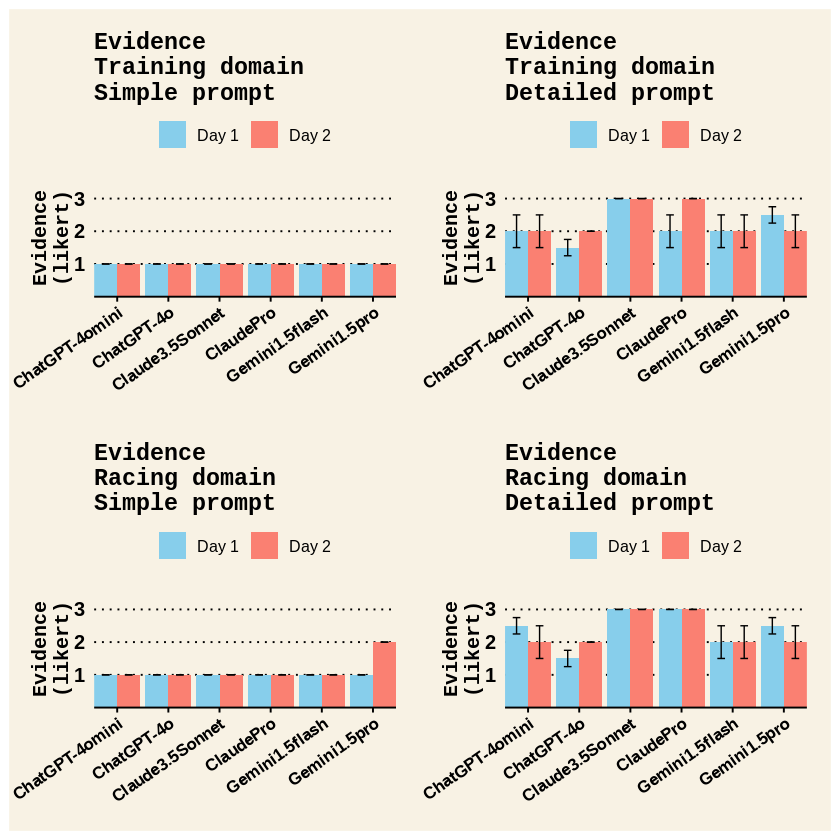

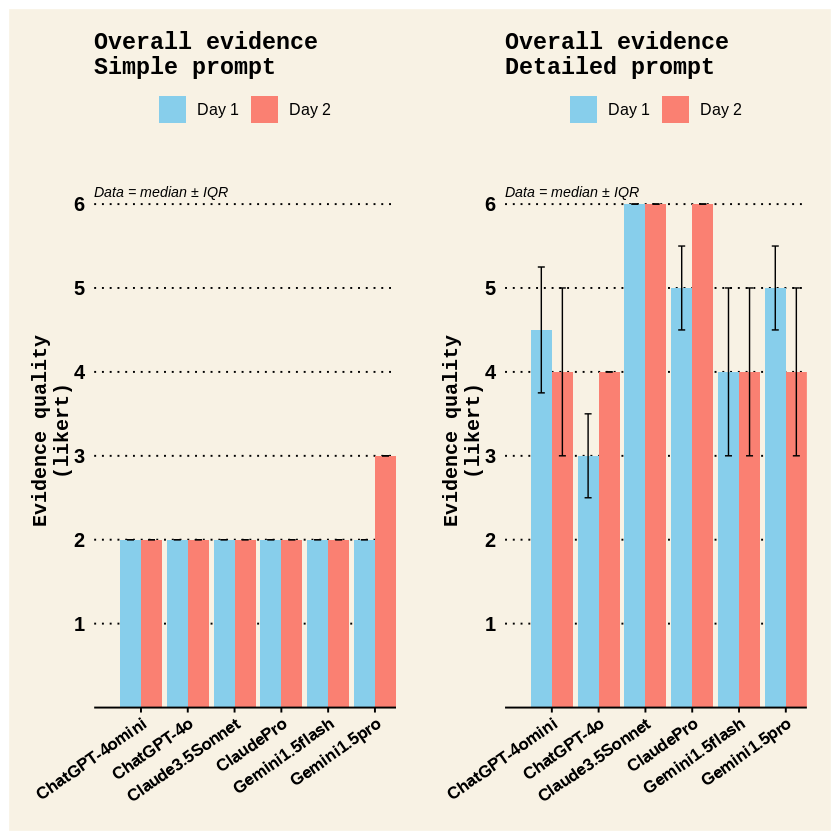

In [196]:
# create plots
TrainingEvidenceFINALPLOT <- SimpleTraining_Evidence_FINALPLOT + DetailedTraining_Evidence_FINALPLOT
RacingEvidenceFINALPLOT <- SimpleRacing_Evidence_FINALPLOT + DetailedRacing_Evidence_FINALPLOT
TrainingRacingEvidenceFINALPLOT <- TrainingEvidenceFINALPLOT / RacingEvidenceFINALPLOT
OverallEvidenceFINALPLOT <- Simple_EvidenceOverall_FINALPLOT + Detailed_EvidenceOverall_FINALPLOT
# View plots
TrainingRacingEvidenceFINALPLOT
OverallEvidenceFINALPLOT
# Save as jpgs
ggsave("TrainingRacingEvidenceFINALPLOT.jpg", plot = TrainingRacingEvidenceFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)
ggsave("OverallEvidenceFINALPLOT.jpg", plot = OverallEvidenceFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)

### Additional info quality

#### Training



 SimpleTraining_ExtraInfo_FINAL 


,ChatbotID,TestDay,SimplePrompt_Training_ExtraInfo_Median,SimplePrompt_Training_ExtraInfo_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,4.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,3.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,4.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,3.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,3.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,3.5,0.5,Claude3.5Sonnet
3,ChatbotC,Test1,3.0,0.0,ClaudePro
9,ChatbotC,Test2,4.0,0.0,ClaudePro
1,ChatbotA,Test1,3.5,0.5,Gemini1.5flash




 DetailedTraining_ExtraInfo_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Training_ExtraInfo_Median,DetailedPrompt_Training_ExtraInfo_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,3.5,0.5,ChatGPT-4omini
10,ChatbotD,Test2,4.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,2.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,4.0,0.0,ChatGPT-4o
6,ChatbotF,Test1,3.0,0.0,Claude3.5Sonnet
12,ChatbotF,Test2,5.0,0.0,Claude3.5Sonnet
3,ChatbotC,Test1,NA,NA,ClaudePro
9,ChatbotC,Test2,4.0,0.0,ClaudePro
1,ChatbotA,Test1,3.5,0.5,Gemini1.5flash


Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”


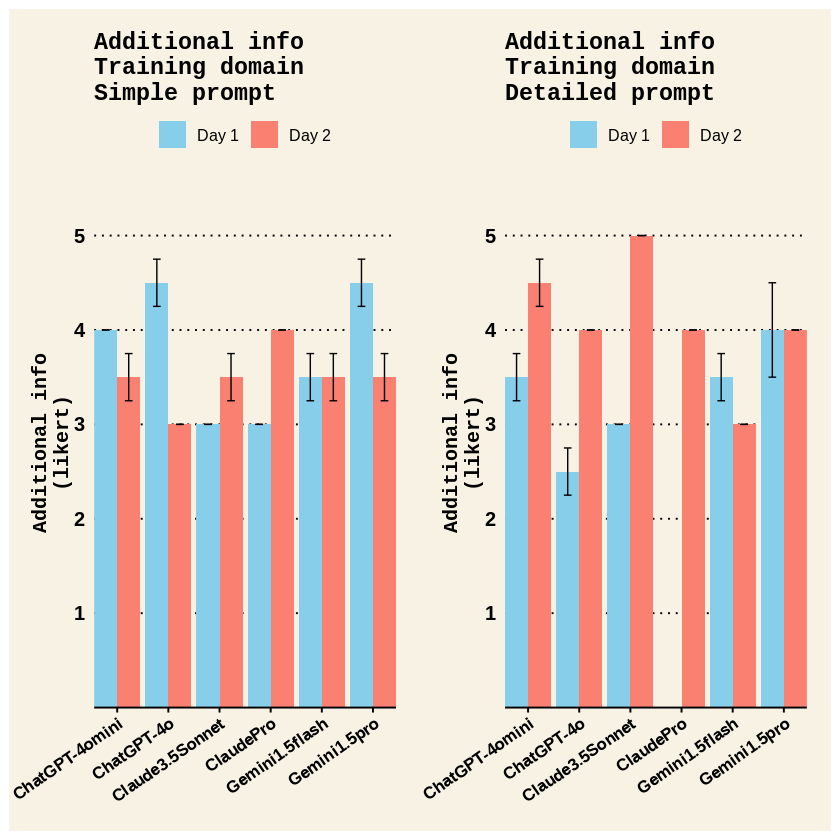

In [197]:
# Create a new SimpleTraining_ExtraInfo_FINAL dataframe for Figure
SimpleTraining_ExtraInfo_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Training_ExtraInfo_Median, SimplePrompt_Training_ExtraInfo_IQR)
# Set ChatbotID and TestDay as factors
SimpleTraining_ExtraInfo_FINAL$ChatbotID <- as.factor(SimpleTraining_ExtraInfo_FINAL$ChatbotID)
SimpleTraining_ExtraInfo_FINAL$TestDay <- as.factor(SimpleTraining_ExtraInfo_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleTraining_ExtraInfo_FINAL <- SimpleTraining_ExtraInfo_FINAL[order(
  match(SimpleTraining_ExtraInfo_FINAL$ChatbotID, desired_order),
  SimpleTraining_ExtraInfo_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleTraining_ExtraInfo_FINAL$ChatbotName <- chatbot_names[SimpleTraining_ExtraInfo_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleTraining_ExtraInfo_FINAL$ChatbotName <- as.factor(SimpleTraining_ExtraInfo_FINAL$ChatbotName)


# Create a new DetailedTraining_ExtraInfo_FINAL dataframe for Figure
DetailedTraining_ExtraInfo_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Training_ExtraInfo_Median, DetailedPrompt_Training_ExtraInfo_IQR)
# Set ChatbotID and TestDay as factors
DetailedTraining_ExtraInfo_FINAL$ChatbotID <- as.factor(DetailedTraining_ExtraInfo_FINAL$ChatbotID)
DetailedTraining_ExtraInfo_FINAL$TestDay <- as.factor(DetailedTraining_ExtraInfo_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedTraining_ExtraInfo_FINAL <- DetailedTraining_ExtraInfo_FINAL[order(
  match(DetailedTraining_ExtraInfo_FINAL$ChatbotID, desired_order),
  DetailedTraining_ExtraInfo_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedTraining_ExtraInfo_FINAL$ChatbotName <- chatbot_names[DetailedTraining_ExtraInfo_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedTraining_ExtraInfo_FINAL$ChatbotName <- as.factor(DetailedTraining_ExtraInfo_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleTraining_ExtraInfo_FINAL \n")
SimpleTraining_ExtraInfo_FINAL
cat("\n\n DetailedTraining_ExtraInfo_FINAL \n")
DetailedTraining_ExtraInfo_FINAL


# Build bar graph for SimpleTraining_ExtraInfo_FINAL
# Set ChatbotName as a factor with the desired order
SimpleTraining_ExtraInfo_FINAL$ChatbotName <- factor(
  SimpleTraining_ExtraInfo_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleTraining_ExtraInfo_FINALPLOT <- ggplot(SimpleTraining_ExtraInfo_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Training_ExtraInfo_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Training_ExtraInfo_Median - SimplePrompt_Training_ExtraInfo_IQR / 2,
                    ymax = SimplePrompt_Training_ExtraInfo_Median + SimplePrompt_Training_ExtraInfo_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Additional info\n(likert)",
       title = "Additional info\nTraining domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedTraining_ExtraInfo_FINAL
# Set ChatbotName as a factor with the desired order
DetailedTraining_ExtraInfo_FINAL$ChatbotName <- factor(
  DetailedTraining_ExtraInfo_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedTraining_ExtraInfo_FINALPLOT <- ggplot(DetailedTraining_ExtraInfo_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Training_ExtraInfo_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Training_ExtraInfo_Median - DetailedPrompt_Training_ExtraInfo_IQR / 2,
                    ymax = DetailedPrompt_Training_ExtraInfo_Median + DetailedPrompt_Training_ExtraInfo_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Additional info\n(likert)",
       title = "Additional info\nTraining domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleTraining_ExtraInfo_FINALPLOT + DetailedTraining_ExtraInfo_FINALPLOT

#### Racing



 SimpleRacing_ExtraInfo_FINAL 


,ChatbotID,TestDay,SimplePrompt_Racing_ExtraInfo_Median,SimplePrompt_Racing_ExtraInfo_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,4.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,4.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,3.5,0.5,ChatGPT-4o
8,ChatbotB,Test2,3.5,1.5,ChatGPT-4o
6,ChatbotF,Test1,4.0,1.0,Claude3.5Sonnet
12,ChatbotF,Test2,NA,NA,Claude3.5Sonnet
3,ChatbotC,Test1,4.0,0.0,ClaudePro
9,ChatbotC,Test2,1.5,0.5,ClaudePro
1,ChatbotA,Test1,4.0,0.0,Gemini1.5flash




 DetailedRacing_ExtraInfo_FINAL 


,ChatbotID,TestDay,DetailedPrompt_Racing_ExtraInfo_Median,DetailedPrompt_Racing_ExtraInfo_IQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,4.5,0.5,ChatGPT-4omini
10,ChatbotD,Test2,4.5,0.5,ChatGPT-4omini
2,ChatbotB,Test1,3.0,1.0,ChatGPT-4o
8,ChatbotB,Test2,4.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,4.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,NA,NA,Claude3.5Sonnet
3,ChatbotC,Test1,4.0,0.0,ClaudePro
9,ChatbotC,Test2,5.0,0.0,ClaudePro
1,ChatbotA,Test1,2.0,0.0,Gemini1.5flash


Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_col()`).”


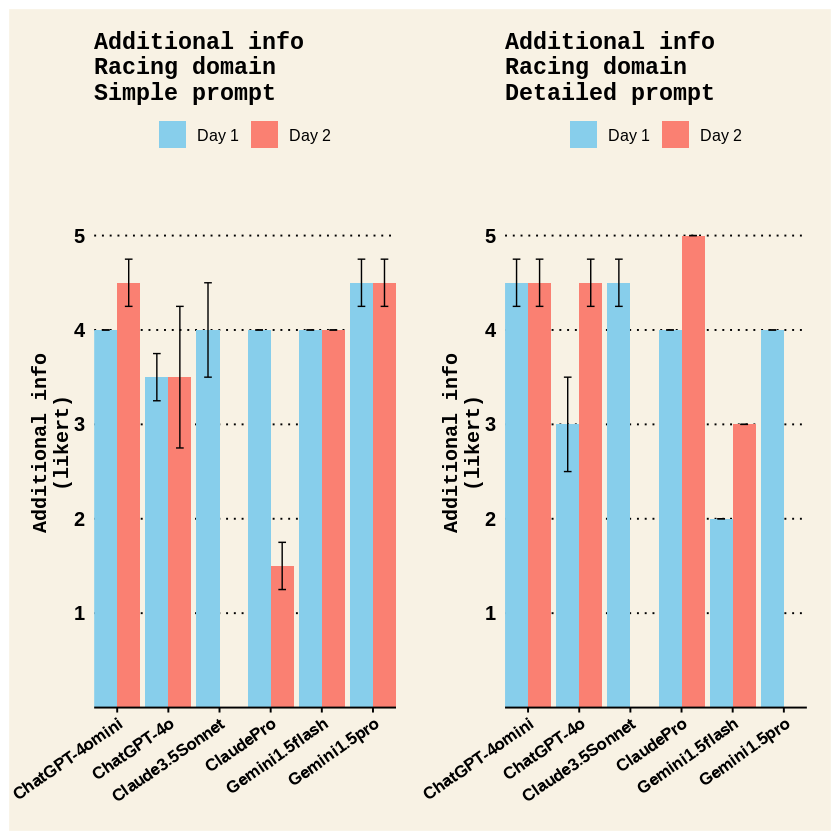

In [198]:
# Create a new SimpleRacing_ExtraInfo_FINAL dataframe for Figure
SimpleRacing_ExtraInfo_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_Racing_ExtraInfo_Median, SimplePrompt_Racing_ExtraInfo_IQR)
# Set ChatbotID and TestDay as factors
SimpleRacing_ExtraInfo_FINAL$ChatbotID <- as.factor(SimpleRacing_ExtraInfo_FINAL$ChatbotID)
SimpleRacing_ExtraInfo_FINAL$TestDay <- as.factor(SimpleRacing_ExtraInfo_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
SimpleRacing_ExtraInfo_FINAL <- SimpleRacing_ExtraInfo_FINAL[order(
  match(SimpleRacing_ExtraInfo_FINAL$ChatbotID, desired_order),
  SimpleRacing_ExtraInfo_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
SimpleRacing_ExtraInfo_FINAL$ChatbotName <- chatbot_names[SimpleRacing_ExtraInfo_FINAL$ChatbotID]
# Set ChatbotName as a factor
SimpleRacing_ExtraInfo_FINAL$ChatbotName <- as.factor(SimpleRacing_ExtraInfo_FINAL$ChatbotName)


# Create a new DetailedRacing_ExtraInfo_FINAL dataframe for Figure
DetailedRacing_ExtraInfo_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_Racing_ExtraInfo_Median, DetailedPrompt_Racing_ExtraInfo_IQR)
# Set ChatbotID and TestDay as factors
DetailedRacing_ExtraInfo_FINAL$ChatbotID <- as.factor(DetailedRacing_ExtraInfo_FINAL$ChatbotID)
DetailedRacing_ExtraInfo_FINAL$TestDay <- as.factor(DetailedRacing_ExtraInfo_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
DetailedRacing_ExtraInfo_FINAL <- DetailedRacing_ExtraInfo_FINAL[order(
  match(DetailedRacing_ExtraInfo_FINAL$ChatbotID, desired_order),
  DetailedRacing_ExtraInfo_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
DetailedRacing_ExtraInfo_FINAL$ChatbotName <- chatbot_names[DetailedRacing_ExtraInfo_FINAL$ChatbotID]
# Set ChatbotName as a factor
DetailedRacing_ExtraInfo_FINAL$ChatbotName <- as.factor(DetailedRacing_ExtraInfo_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n SimpleRacing_ExtraInfo_FINAL \n")
SimpleRacing_ExtraInfo_FINAL
cat("\n\n DetailedRacing_ExtraInfo_FINAL \n")
DetailedRacing_ExtraInfo_FINAL



# Build bar graph for SimpleRacing_ExtraInfo_FINAL
# Set ChatbotName as a factor with the desired order
SimpleRacing_ExtraInfo_FINAL$ChatbotName <- factor(
  SimpleRacing_ExtraInfo_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

SimpleRacing_ExtraInfo_FINALPLOT <- ggplot(SimpleRacing_ExtraInfo_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_Racing_ExtraInfo_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_Racing_ExtraInfo_Median - SimplePrompt_Racing_ExtraInfo_IQR / 2,
                    ymax = SimplePrompt_Racing_ExtraInfo_Median + SimplePrompt_Racing_ExtraInfo_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Additional info\n(likert)",
       title = "Additional info\nRacing domain\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))


# Build bar graph for DetailedRacing_ExtraInfo_FINAL
# Set ChatbotName as a factor with the desired order
DetailedRacing_ExtraInfo_FINAL$ChatbotName <- factor(
  DetailedRacing_ExtraInfo_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

DetailedRacing_ExtraInfo_FINALPLOT <- ggplot(DetailedRacing_ExtraInfo_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_Racing_ExtraInfo_Median,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_Racing_ExtraInfo_Median - DetailedPrompt_Racing_ExtraInfo_IQR / 2,
                    ymax = DetailedPrompt_Racing_ExtraInfo_Median + DetailedPrompt_Racing_ExtraInfo_IQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(x = "Chatbot name",
       y = "Additional info\n(likert)",
       title = "Additional info\nRacing domain\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL))

SimpleRacing_ExtraInfo_FINALPLOT + DetailedRacing_ExtraInfo_FINALPLOT

#### Overall



 Simple_ExtraInfoOverall_FINAL 


,ChatbotID,TestDay,SimplePrompt_ExtraInfo_combined,SimplePrompt_ExtraInfo_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,8.0,0.0,ChatGPT-4omini
10,ChatbotD,Test2,8.0,1.0,ChatGPT-4omini
2,ChatbotB,Test1,8.0,1.0,ChatGPT-4o
8,ChatbotB,Test2,6.5,1.5,ChatGPT-4o
6,ChatbotF,Test1,7.0,1.0,Claude3.5Sonnet
12,ChatbotF,Test2,NA,NA,Claude3.5Sonnet
3,ChatbotC,Test1,7.0,0.0,ClaudePro
9,ChatbotC,Test2,5.5,0.5,ClaudePro
1,ChatbotA,Test1,7.5,0.5,Gemini1.5flash




 Detailed_ExtraInfoOverall_FINAL 


,ChatbotID,TestDay,DetailedPrompt_ExtraInfo_combined,DetailedPrompt_ExtraInfo_combinedIQR,ChatbotName
,<fct>,<fct>,<dbl>,<dbl>,<fct>
4,ChatbotD,Test1,8.0,1.0,ChatGPT-4omini
10,ChatbotD,Test2,9.0,1.0,ChatGPT-4omini
2,ChatbotB,Test1,5.5,1.5,ChatGPT-4o
8,ChatbotB,Test2,8.5,0.5,ChatGPT-4o
6,ChatbotF,Test1,7.5,0.5,Claude3.5Sonnet
12,ChatbotF,Test2,NA,NA,Claude3.5Sonnet
3,ChatbotC,Test1,NA,NA,ClaudePro
9,ChatbotC,Test2,9.0,0.0,ClaudePro
1,ChatbotA,Test1,5.5,0.5,Gemini1.5flash


Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_col()`).”


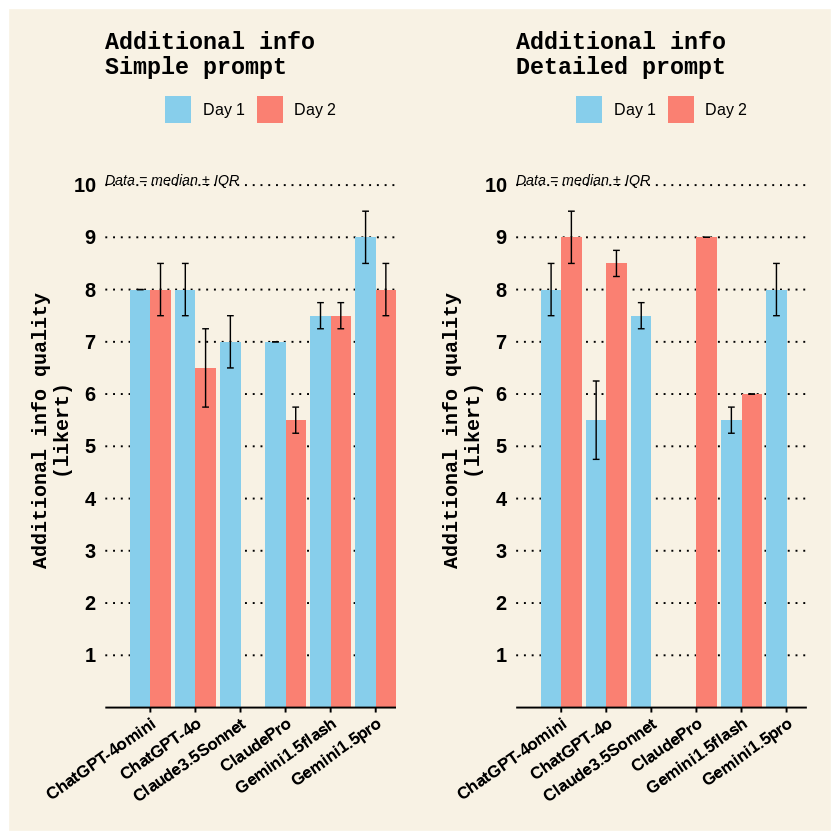

In [199]:
# Create a new Simple_ExtraInfoOverall_FINAL dataframe for Figure
Simple_ExtraInfoOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, SimplePrompt_ExtraInfo_combined, SimplePrompt_ExtraInfo_combinedIQR)
# Set ChatbotID and TestDay as factors
Simple_ExtraInfoOverall_FINAL$ChatbotID <- as.factor(Simple_ExtraInfoOverall_FINAL$ChatbotID)
Simple_ExtraInfoOverall_FINAL$TestDay <- as.factor(Simple_ExtraInfoOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Simple_ExtraInfoOverall_FINAL <- Simple_ExtraInfoOverall_FINAL[order(
  match(Simple_ExtraInfoOverall_FINAL$ChatbotID, desired_order),
  Simple_ExtraInfoOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Simple_ExtraInfoOverall_FINAL$ChatbotName <- chatbot_names[Simple_ExtraInfoOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Simple_ExtraInfoOverall_FINAL$ChatbotName <- as.factor(Simple_ExtraInfoOverall_FINAL$ChatbotName)


# Create a new Detailed_ExtraInfoOverall_FINAL dataframe for Figure
Detailed_ExtraInfoOverall_FINAL <- Experiment1_Analysis %>%
  select(ChatbotID, TestDay, DetailedPrompt_ExtraInfo_combined, DetailedPrompt_ExtraInfo_combinedIQR)
# Set ChatbotID and TestDay as factors
Detailed_ExtraInfoOverall_FINAL$ChatbotID <- as.factor(Detailed_ExtraInfoOverall_FINAL$ChatbotID)
Detailed_ExtraInfoOverall_FINAL$TestDay <- as.factor(Detailed_ExtraInfoOverall_FINAL$TestDay)
# Reorder the dataframe based on the specified ChatbotID order
Detailed_ExtraInfoOverall_FINAL <- Detailed_ExtraInfoOverall_FINAL[order(
  match(Detailed_ExtraInfoOverall_FINAL$ChatbotID, desired_order),
  Detailed_ExtraInfoOverall_FINAL$TestDay
), ]
# Add the ChatbotName column to the dataframe
Detailed_ExtraInfoOverall_FINAL$ChatbotName <- chatbot_names[Detailed_ExtraInfoOverall_FINAL$ChatbotID]
# Set ChatbotName as a factor
Detailed_ExtraInfoOverall_FINAL$ChatbotName <- as.factor(Detailed_ExtraInfoOverall_FINAL$ChatbotName)

# View the updated dataframes
cat("\n\n Simple_ExtraInfoOverall_FINAL \n")
Simple_ExtraInfoOverall_FINAL
cat("\n\n Detailed_ExtraInfoOverall_FINAL \n")
Detailed_ExtraInfoOverall_FINAL



# Build bar graph for Simple_ExtraInfoOverall_FINAL
# Set ChatbotName as a factor with the desired order
Simple_ExtraInfoOverall_FINAL$ChatbotName <- factor(
  Simple_ExtraInfoOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Simple_ExtraInfoOverall_FINALPLOT <- ggplot(Simple_ExtraInfoOverall_FINAL, aes(x = ChatbotName,
                                                 y = SimplePrompt_ExtraInfo_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = SimplePrompt_ExtraInfo_combined - SimplePrompt_ExtraInfo_combinedIQR / 2,
                    ymax = SimplePrompt_ExtraInfo_combined + SimplePrompt_ExtraInfo_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Additional info quality\n(likert)",
       title = "Additional info\nSimple prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6", "7", "8", "9", "10")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 10.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )


# Build bar graph for Detailed_ExtraInfoOverall_FINAL
# Set ChatbotName as a factor with the desired order
Detailed_ExtraInfoOverall_FINAL$ChatbotName <- factor(
  Detailed_ExtraInfoOverall_FINAL$ChatbotName,
  levels = c("ChatGPT-4omini", "ChatGPT-4o", "Claude3.5Sonnet",
             "ClaudePro", "Gemini1.5flash", "Gemini1.5pro")
)

Detailed_ExtraInfoOverall_FINALPLOT <- ggplot(Detailed_ExtraInfoOverall_FINAL, aes(x = ChatbotName,
                                                 y = DetailedPrompt_ExtraInfo_combined,
                                                 fill = TestDay)) +
  geom_col(position = "dodge", show.legend = TRUE) +
  geom_errorbar(aes(ymin = DetailedPrompt_ExtraInfo_combined - DetailedPrompt_ExtraInfo_combinedIQR / 2,
                    ymax = DetailedPrompt_ExtraInfo_combined + DetailedPrompt_ExtraInfo_combinedIQR / 2),
                position = position_dodge(0.9), width = 0.3, linewidth = 0.4, color = 'black') +
  labs(y = "Additional info quality\n(likert)",
       title = "Additional info\nDetailed prompt") +
  scale_y_discrete(limits = c("1", "2", "3", "4", "5", "6", "7", "8", "9", "10")) +  # Set y-axis to ordinal categorical scale
  scale_fill_manual(values = c("Test1" = "skyblue", "Test2" = "salmon"), labels = c("Day 1", "Day 2")) +
  scale_x_discrete(expand = expansion(add = c(0, 0))) +  # Adjust space between factors on the x-axis
  theme_wsj() +
  theme(
    plot.title = element_text(size = 14, face = "bold", hjust = 0),
    axis.text.x = element_text(color = "black", angle = 35, hjust = 1, size = 10),
    axis.title.x = element_blank(), # Removes the x-axis label
    axis.text.y = element_text(color = "black", size = 12),
    axis.title.y = element_text(color = "black", face = "bold", size = 12)
  ) +
  guides(fill = guide_legend(title = NULL)) + # Remove legend title
  annotate(  # Add custom text
    "text",
    x = 0, y = 10.2,  # Coordinates for placement
    label = "Data = median ± IQR",
    hjust = 0, vjust = 1,  # Horizontal and vertical justification (aligns the text to the left and top)
    size = 3, fontface = "italic", color = "black"
  )

Simple_ExtraInfoOverall_FINALPLOT + Detailed_ExtraInfoOverall_FINALPLOT

#### Plots for manuscript

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_col()`).”


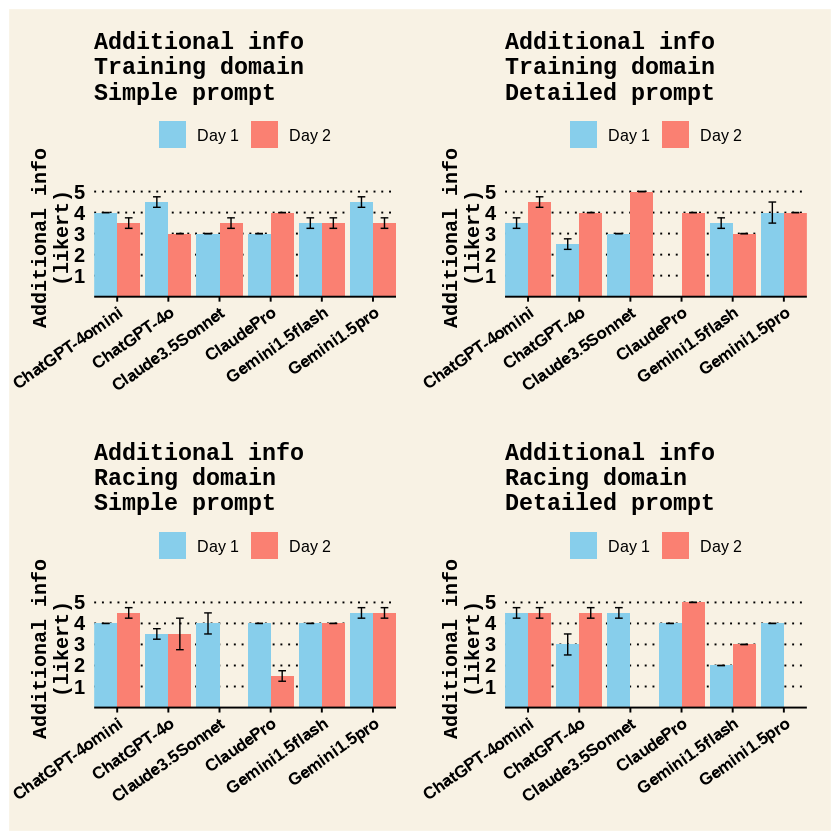

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_col()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range
(`geom_col()`).”


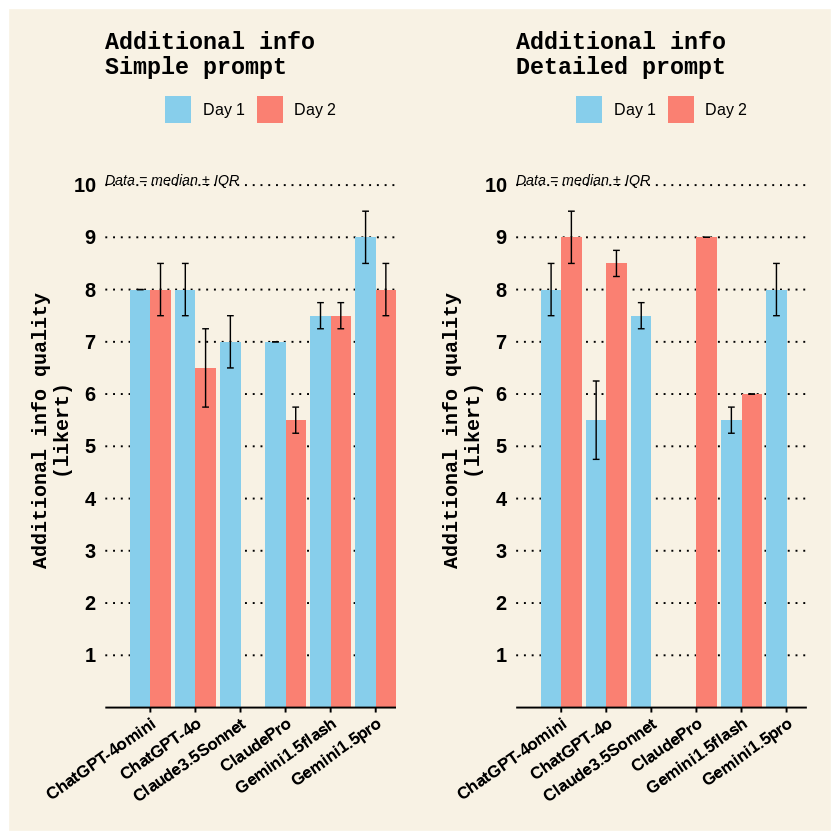

In [200]:
# create plots
TrainingExtraInfoFINALPLOT <- SimpleTraining_ExtraInfo_FINALPLOT + DetailedTraining_ExtraInfo_FINALPLOT
RacingExtraInfoFINALPLOT <- SimpleRacing_ExtraInfo_FINALPLOT + DetailedRacing_ExtraInfo_FINALPLOT
TrainingRacingExtraInfoFINALPLOT <- TrainingExtraInfoFINALPLOT / RacingExtraInfoFINALPLOT
OverallExtraInfoFINALPLOT <- Simple_ExtraInfoOverall_FINALPLOT + Detailed_ExtraInfoOverall_FINALPLOT
# View plots
TrainingRacingExtraInfoFINALPLOT
OverallExtraInfoFINALPLOT
# Save as jpgs
ggsave("TrainingRacingExtraInfoFINALPLOT.jpg", plot = TrainingRacingExtraInfoFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)
ggsave("OverallExtraInfoFINALPLOT.jpg", plot = OverallExtraInfoFINALPLOT, width = 8, height = 6, units = "in", dpi = 300)